In [2]:
# Import required packages
import matplotlib.pyplot as plt
from skimage import io
from skimage import data, img_as_float
import skimage.restoration as skiresort

from skimage.restoration import denoise_wavelet
                                 
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error

import numpy as np
import scipy
import os
import pywt

import numbers
from skimage.color import rgb2gray


In [3]:
os.environ['R_HOME'] = 'C:\Program Files\R\R-4.1.0' #path to R installation (not neeeded in all cases)

In [4]:
# To run custom R code
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
from rpy2.robjects import FloatVector
from rpy2.rinterface import NULL, NA

# To export data
import pickle 

# For data processing
import pandas as pd

In [5]:
# Define noise level
sigma = 0.05

In [6]:
# Read image
filename = os.path.join('output\\figures\\stjerten256.png')
out_path = "output/image-de-noising/"
original_image = io.imread(filename)
image = rgb2gray(original_image)

# Add noise
noisy = random_noise(image, var=sigma**2, seed = 1, mode = "gaussian")

# Only look at grey
noisy = rgb2gray(noisy)



<ipython-input-6-de3dda58f6be>:11: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  noisy = rgb2gray(noisy)


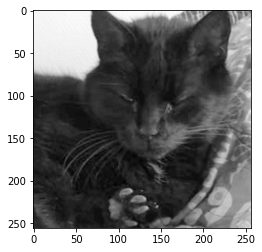

In [7]:
plt.imshow(image, cmap='gray')


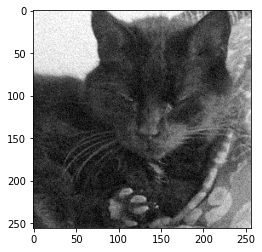

In [8]:
# Image with noise
plt.imshow(noisy, cmap='gray')


In [9]:
# Define R functions
itses = importr('itses') # For SparseMAD() as itses()
r_sparse_mad = robjects.r['sparse.mad.estimator']

r_source = robjects.r['source']
r_source("R-utility/extra-utility.R")
est_ss  = robjects.r['get.sureshrink.threshold']
est_iterative = robjects.r['itses_saved']


In [10]:
# Define custom thresholding functions

# Iterative estimation with soft threshold starting at median
def itses_st(x, sd, store_iterations = True, name = None):
    x = np.ndarray.flatten(x)

    savepath = NULL
    if name: 
        savepath = "output/image-de-noising/wavelets-st/" + name + str(len(x)) + ".RData"
    
    x_vec = FloatVector(x)
    sd_vec = FloatVector([sd])
    threshold = est_iterative(x_vec, 
                             method ="ST",
                             sd = sd_vec,
                             sparse_mad = True, 
                             savepath = savepath,
                             debug = True
                            )[1]
    return threshold[0]

# Iteartive estimation with hard threshold starting at median
def itses_ht(x, sd, store_iterations = True, name = None):
    x = np.ndarray.flatten(x)

    savepath = NULL
    if name: 
        savepath = "output/image-de-noising/wavelets-ht/" + name + str(len(x)) + ".RData"
    
    x_vec = FloatVector(x)
    sd_vec = FloatVector([sd])
    threshold = est_iterative(x_vec, 
                             method ="HT",
                             sd = sd_vec,
                             sparse_mad = True, 
                             savepath = savepath,
                             debug = True
                             )[1]
    
    return threshold[0]

# Run SureShrink from R package ASUS.
def ss(x, sd):
    x = np.ndarray.flatten(x)
    z = x/sd
    z_vec = FloatVector(z)
    threshold = est_ss(z_vec)[0]
    return threshold*sd

# Estiamte noise with SparseMAD
def sparse_mad (detail_coeffs, distribution='Gaussian'):
    detail_coeffs = detail_coeffs[np.nonzero(detail_coeffs)]

    if distribution.lower() != 'gaussian':
        raise ValueError("Only Gaussian noise estimation is currently "
                         "supported")
        
    x = np.ndarray.flatten(detail_coeffs)
    x_vec = FloatVector(x)
    sigma = r_sparse_mad(x_vec, debug = True)[0]
    return sigma


In [11]:
# Implement custom wavelet denoising based on scikit-image, mostly copy paste from scikit-image source code. 
# scikit-imaage source code can be found at e.g. https://github.com/scikit-image/scikit-image
# New custom code will be higlighted
def _sigma_est_dwt(detail_coeffs, distribution='Gaussian'):
    detail_coeffs = detail_coeffs[np.nonzero(detail_coeffs)]

    if distribution.lower() == 'gaussian':
        # 75th quantile of the underlying, symmetric noise distribution
        denom = scipy.stats.norm.ppf(0.75)
        sigma = np.median(np.abs(detail_coeffs)) / denom
    else:
        raise ValueError("Only Gaussian noise estimation is currently "
                         "supported")
    return sigma

def _scale_sigma_and_image_consistently(image, sigma, multichannel,
                                        rescale_sigma):
    if multichannel:
        if isinstance(sigma, numbers.Number) or sigma is None:
            sigma = [sigma] * image.shape[-1]
        elif len(sigma) != image.shape[-1]:
            raise ValueError(
                "When multichannel is True, sigma must be a scalar or have "
                "length equal to the number of channels")
    if image.dtype.kind != 'f':
        if rescale_sigma:
            range_pre = image.max() - image.min()
        image = img_as_float(image)
        if rescale_sigma:
            range_post = image.max() - image.min()
            # apply the same magnitude scaling to sigma
            scale_factor = range_post / range_pre
            if multichannel:
                sigma = [s * scale_factor if s is not None else s
                         for s in sigma]
            elif sigma is not None:
                sigma *= scale_factor
    elif image.dtype == np.float16:
        image = image.astype(np.float32)
    return image, sigma
def _bayes_thresh(details, var):
    """BayesShrink threshold for a zero-mean details coeff array."""
    # Equivalent to:  dvar = np.var(details) for 0-mean details array
    dvar = np.mean(details*details)
    eps = np.finfo(details.dtype).eps
    thresh = var / np.sqrt(max(dvar - var, eps))
    return thresh
def _universal_thresh(img, sigma):
    """ Universal threshold used by the VisuShrink method """
    return sigma*np.sqrt(2*np.log(img.size))


def _wavelet_threshold(image, wavelet, method='IterativeST', threshold=None,
                       sigma=None, mode='soft', wavelet_levels=None, use_sparse_mad_estimation = False, name = None):
    # Note that arguments of _wavelet_threshold is slightly altered from original

    wavelet = pywt.Wavelet(wavelet)

    original_extent = tuple(slice(s) for s in image.shape)

    # Determine the number of wavelet decomposition levels
    if wavelet_levels is None:
        # Determine the maximum number of possible levels for image
        dlen = wavelet.dec_len
        wavelet_levels = pywt.dwtn_max_level(image.shape, wavelet)

        # Skip coarsest wavelet scales (see Notes in docstring).
        wavelet_levels = max(wavelet_levels - 3, 1)

    coeffs = pywt.wavedecn(image, wavelet=wavelet, level=wavelet_levels)
    # Detail coefficients at each decomposition level
    dcoeffs = coeffs[1:]

    #!! Custom Code Start !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    # Add the option of using SparseMAD noise estimation (done across all bands in)
    if sigma is None:
        # Estimate the noise via the method in [2]_
        detail_coeffs = dcoeffs[-1]['d' * image.ndim]
        print("Number of points in noise estimation:", len(detail_coeffs))
        if not use_sparse_mad_estimation:
            sigma = _sigma_est_dwt(detail_coeffs, distribution='Gaussian') 
        else: 
            sigma = sparse_mad(detail_coeffs, distribution='Gaussian') 
        print("Estimated noise:", sigma)
    #!! Custom Code End !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        
    if method is not None and threshold is not None:
        warn(("Thresholding method {} selected.  The user-specified threshold "
              "will be ignored.").format(method))
        
    #!! Custom Code Start !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    # Output the wavelet coefficitnes to study in R (before thresholding)
    if name:
        print("Storing waves")
        data = dcoeffs[len(dcoeffs)-2]
        data = np.array([np.ndarray.flatten(data[level]) for level in data])
        data = np.transpose(data)  
        np.savetxt(out_path + name + ".csv", data, delimiter=",")
    #!! Custom Code End !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    
    if threshold is None:
        print(sigma)
        var = sigma**2
        if method is None:
            raise ValueError(
                "If method is None, a threshold must be provided.")
        elif method == "BayesShrink":
            # The BayesShrink thresholds from [1]_ in docstring
            threshold = [{key: _bayes_thresh(level[key], var) for key in level}
                         for level in dcoeffs]
        elif method == "VisuShrink":
            # The VisuShrink thresholds from [2]_ in docstring
            threshold = _universal_thresh(image, sigma)
        #!! Custom Code Start !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        ## Injecting custom thresholding methods, ITSES-ST, ITSES-HT, and SureShrink
        elif method == "IterativeST":
            if name:
                threshold = [{key: itses_st(level[key], sigma, name = name+key) for key in level}
                             for level in dcoeffs]
            else:
                threshold = [{key: itses_st(level[key], sigma, name = None) for key in level}
                             for level in dcoeffs]
        elif method == "IterativeHT":
            mode = 'hard'
            if name:
                threshold = [{key: itses_ht(level[key], sigma, name = name+key) for key in level}
                             for level in dcoeffs]
            else: 
                threshold = [{key: itses_ht(level[key], sigma, name = None) for key in level}
                             for level in dcoeffs]
        elif method == "SureShrink":
            threshold = [{key: ss(level[key], sigma) for key in level}
                         for level in dcoeffs]
        #!! Custom Code End !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
        
        else:
            raise ValueError("Unrecognized method: {}".format(method))
            
            
    #!! Custom Code Start !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
    # Print found thresholds for debugging
    print("threshold is:")
    print(threshold)
    #!! Custom Code End !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
   
   
    if np.isscalar(threshold):        
        denoised_detail = [{key: pywt.threshold(level[key],
                                                value=threshold,
                                                mode=mode) for key in level}
                           for level in dcoeffs]
    else:        
        denoised_detail = [{key: pywt.threshold(level[key],
                                                value=thresh[key],
                                                mode=mode) for key in level}
                           for thresh, level in zip(threshold, dcoeffs)]
    denoised_coeffs = [coeffs[0]] + denoised_detail
    return pywt.waverecn(denoised_coeffs, wavelet)[original_extent]
def denoise_wavelet(image, sigma=None, wavelet='db1', mode='soft',
                    wavelet_levels=None, multichannel=False,
                    convert2ycbcr=False, method='BayesShrink',
                    rescale_sigma=True, *, channel_axis=None,
                   use_sparse_mad_estimation = False, name = None):
    multichannel = channel_axis is not None


    # floating-point inputs are not rescaled, so don't clip their output.
    clip_output = image.dtype.kind != 'f'

    if convert2ycbcr and not multichannel:
        raise ValueError("convert2ycbcr requires multichannel == True")

    image, sigma = _scale_sigma_and_image_consistently(image,
                                                       sigma,
                                                       multichannel,
                                                       rescale_sigma)
    
    if multichannel:
        if convert2ycbcr:
            out = color.rgb2ycbcr(image)
            # convert user-supplied sigmas to the new colorspace as well
            if rescale_sigma:
                sigma = _rescale_sigma_rgb2ycbcr(sigma)
            for i in range(3):
                # renormalizing this color channel to live in [0, 1]
                _min, _max = out[..., i].min(), out[..., i].max()
                scale_factor = _max - _min
                if scale_factor == 0:
                    # skip any channel containing only zeros!
                    continue
                channel = out[..., i] - _min
                channel /= scale_factor
                sigma_channel = sigma[i]
                if sigma_channel is not None:
                    sigma_channel /= scale_factor
                out[..., i] = denoise_wavelet(channel,
                                              wavelet=wavelet,
                                              method=method,
                                              sigma=sigma_channel,
                                              mode=mode,
                                              wavelet_levels=wavelet_levels,
                                              rescale_sigma=rescale_sigma)
                out[..., i] = out[..., i] * scale_factor
                out[..., i] += _min
            out = color.ycbcr2rgb(out)
        else:
            out = np.empty_like(image)
            for c in range(image.shape[-1]):
                print("Thresholding color: ", c)
                print("Shape", np.shape(image[..., c]))
                if(name):
                    name = name+"channel_"+str(c)
                out[..., c] = _wavelet_threshold(image[..., c],
                                                 wavelet=wavelet,
                                                 method=method,
                                                 sigma=sigma[c], mode=mode,
                                                 wavelet_levels=wavelet_levels,
                                                use_sparse_mad_estimation =use_sparse_mad_estimation, 
                                                name = name)
    else:
        out = _wavelet_threshold(image, wavelet=wavelet, method=method,
                                 sigma=sigma, mode=mode,
                                 wavelet_levels=wavelet_levels,
                                use_sparse_mad_estimation = use_sparse_mad_estimation, 
                                 name = name)

    if clip_output:
        clip_range = (-1, 1) if image.min() < 0 else (0, 1)
        out = np.clip(out, *clip_range, out=out)
    return out

In [12]:
# Run deafault methods 
bayes_image= denoise_wavelet(noisy, method ="BayesShrink", multichannel = False)
visu_image = denoise_wavelet(noisy, method ="VisuShrink", multichannel = False)


Number of points in noise estimation: 128
Estimated noise: 0.051007498804647056
0.051007498804647056
threshold is:
[{'ad': 0.001498628965695114, 'da': 0.00116273855911093, 'dd': 0.0035398544178970974}, {'ad': 0.0034405985967184433, 'da': 0.0040147024505241356, 'dd': 0.007606709223619572}, {'ad': 0.009167263310883333, 'da': 0.010871139948505514, 'dd': 0.023485411775053273}, {'ad': 0.029941940627759782, 'da': 0.028292491665908436, 'dd': 0.06888056807633829}, {'ad': 0.09192574978759473, 'da': 0.09648812975545137, 'dd': 174601.48913631504}]
Number of points in noise estimation: 128
Estimated noise: 0.051007498804647056
0.051007498804647056
threshold is:
0.24022696126415014


In [13]:
# Storing the original wavelet coefficients
try:
    _ = denoise_wavelet(image, method ="DONOTHING", name = "original_wavelets", multichannel = False)
except:
    print("")

Number of points in noise estimation: 128
Estimated noise: 0.004986776167891194
Storing waves
0.004986776167891194



In [13]:
%%time 
itses_image_st = denoise_wavelet(noisy, method ="IterativeST", use_sparse_mad_estimation = False, name = "stjerten_st_", multichannel = False)


Number of points in noise estimation: 128
Estimated noise: 0.051007498804647056
Storing waves
0.051007498804647056
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.211089002286549, diff to last: 0.211"
[1] "Newton iter: 2, lambda:0.217240323359114, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.217245490655313, diff to last: 0"
[1] "Newton iter: 4, lambda:0.217245490658957, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.217245490655313"
[1] "Starting iterative with newton 0.217245490655313"
[1] "Starting newton at: 0.215347173130974"
[1] "Newton iter: 1, lambda:0.109083763020939, diff to last: 0.106"
[1] "Newton iter: 2, lambda:0.110208848284249, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.110208975299673, diff to last: 0"
[1] "Newton

[1] "Newton iter: 1, lambda:0.425209797267371, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.425838507794173, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.425838649473225, diff to last: 0"
[1] "Newton iter: 4, lambda:0.425838649473233, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.425838649473225"
[1] "Starting iterative with newton 0.425838649473225"
[1] "Starting newton at: 0.467275686006794"
[1] "Newton iter: 1, lambda:0.421748138022695, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.422482421139675, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.422482613573836, diff to last: 0"
[1] "Newton iter: 4, lambda:0.422482613573849, diff to last: 0"
[1] "Final threshold is: 0.0215497814068516"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.07588315186513"
[1] "Starting iterative with newton 1.07588315186513"
[1] "Starting newton at: 0.770463793516726"

In [14]:
%%time 
itses_image_ht= denoise_wavelet(noisy, method ="IterativeHT", use_sparse_mad_estimation = False, name = "stjerten_ht_", multichannel = False)

Number of points in noise estimation: 128
Estimated noise: 0.051007498804647056
Storing waves
0.051007498804647056
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 10.2462847506924"
[1] "Starting iterative with newton 10.2462847506924"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 9.6770129899211"
[1] "Starting iterative with newton 9.6770129899211"
[1] "Starting newton at: 0"
[1]

[1] "Newton iter: 4, lambda:2.46954032698288, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.46954032646539"
[1] "Starting iterative with newton 2.46954032646539"
[1] "Starting newton at: 2.9679605581325"
[1] "Newton iter: 1, lambda:2.9183257939387, diff to last: 0.05"
[1] "Newton iter: 2, lambda:2.92059988209547, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.92060477468278, diff to last: 0"
[1] "Newton iter: 4, lambda:2.92060477470541, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.92060477468278"
[1] "Starting iterative with newton 2.92060477468278"
[1] "Starting newton at: 3.08984195335012"
[1] "Newton iter: 1, lambda:3.14703702211702, diff to last: 0.057"
[1] "Newton iter: 2, lambda:3.15032916033235, diff to last: 0.003"
[1] "Newton iter: 3, lambda:3.15033971550665, diff to last: 0"
[1] "Newton iter: 4, lambda:3.15033971561491, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.15033971561491"
[1] "Starting iterative with newton 3.15033971561491"
[1] "Starting newton at: 3.2619

In [15]:
%%time 
# Run iterative hard threshold denosing
itses_image_ht_sd = denoise_wavelet(noisy, method ="IterativeHT", use_sparse_mad_estimation = True, multichannel = False)

Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.361914653443208. h at: 0.4"
[1] "Using regular MAD in noise estimation."
Estimated noise: 0.05100749880464707
0.05100749880464707
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 10.2462847506924"
[1] "Starting iterative with newton 10.2462847506924"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 9.67701298992109"

[1] "Newton iter: 3, lambda:2.46954032646539, diff to last: 0"
[1] "Newton iter: 4, lambda:2.46954032698288, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.46954032646539"
[1] "Starting iterative with newton 2.46954032646539"
[1] "Starting newton at: 2.9679605581325"
[1] "Newton iter: 1, lambda:2.9183257939387, diff to last: 0.05"
[1] "Newton iter: 2, lambda:2.92059988209547, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.92060477468278, diff to last: 0"
[1] "Newton iter: 4, lambda:2.92060477470541, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.92060477468278"
[1] "Starting iterative with newton 2.92060477468278"
[1] "Starting newton at: 3.08984195335012"
[1] "Newton iter: 1, lambda:3.14703702211702, diff to last: 0.057"
[1] "Newton iter: 2, lambda:3.15032916033235, diff to last: 0.003"
[1] "Newton iter: 3, lambda:3.15033971550665, diff to last: 0"
[1] "Newton iter: 4, lambda:3.15033971561491, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.15033971561491"
[1] "Starting iterativ

In [16]:
%%time 
# Run iterative soft threshold denosing
itses_image_st_sd = denoise_wavelet(noisy, method ="IterativeST",use_sparse_mad_estimation = True, multichannel = False)

Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.361914653443208. h at: 0.4"
[1] "Using regular MAD in noise estimation."
Estimated noise: 0.05100749880464707
0.05100749880464707
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.211089002286549, diff to last: 0.211"
[1] "Newton iter: 2, lambda:0.217240323359114, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.217245490655313, diff to last: 0"
[1] "Newton iter: 4, lambda:0.217245490658957, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.217245490655313"
[1] "Starting iterative with newton 0.217245490655313"
[1] "Starting newton at: 0.215347173130974"
[1] "Newton iter: 1, lambda:0.109083763020939, diff to last: 0.106"
[1] "Newton iter: 2, lambda:0.110208848284249, diff to last

[1] "Starting iterative with newton 0.439385018063526"
[1] "Starting newton at: 0.467237125559112"
[1] "Newton iter: 1, lambda:0.425209797265638, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.425838507792672, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.425838649471724, diff to last: 0"
[1] "Newton iter: 4, lambda:0.425838649471731, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.425838649471724"
[1] "Starting iterative with newton 0.425838649471724"
[1] "Starting newton at: 0.467275686008295"
[1] "Newton iter: 1, lambda:0.421748138022261, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.422482421139303, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.422482613573464, diff to last: 0"
[1] "Newton iter: 4, lambda:0.422482613573477, diff to last: 0"
[1] "Final threshold is: 0.0215497814068333"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.07588315186513

In [17]:
%%time 
# Run sure shrink denosing
ss_image= denoise_wavelet(noisy, method ="SureShrink", use_sparse_mad_estimation = False, multichannel = False)

Number of points in noise estimation: 128
Estimated noise: 0.051007498804647056
0.051007498804647056
threshold is:
[{'ad': 0.004801839676372488, 'da': 0.00027261586745981614, 'dd': 0.018451909499502723}, {'ad': 0.010494916606756943, 'da': 0.005063351171133934, 'dd': 0.019284193563473717}, {'ad': 0.02149683858816631, 'da': 0.020937952552922454, 'dd': 0.031732664929140744}, {'ad': 0.04838593236553368, 'da': 0.03843513130333437, 'dd': 0.20804265112869433}, {'ad': 0.22471174602906624, 'da': 0.22471174602906624, 'dd': 0.22471174602906624}]
Wall time: 16.7 ms


In [18]:
plt.rcParams.update({'font.size': 28})

In [19]:
sigma

0.05

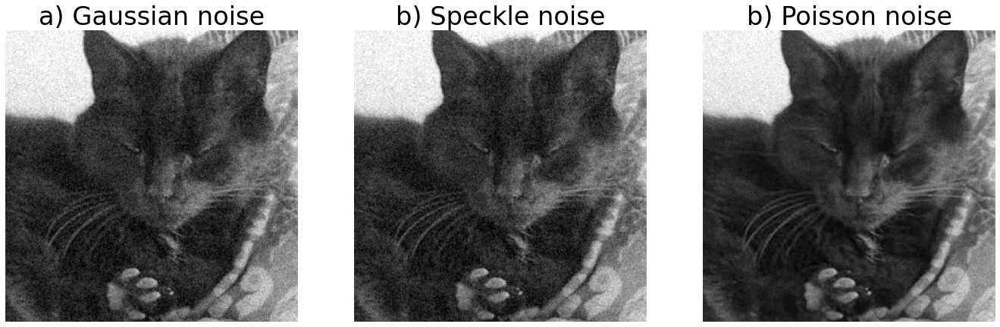

In [46]:

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 17),
                       sharex=True, sharey=True)
fig.tight_layout()
plt.gray()

noisy_gaussian = random_noise(image, var=sigma**2, seed = 2, mode = "gaussian")
noisy_speckle = random_noise(image, var=sigma**2, seed = 2, mode = "speckle")
noisy_po = random_noise(original_image, seed = 2, mode = "poisson")
noisy_po = rgb2gray(noisy_po)


#noisy_gaussian = rgb2gray(noisy_gaussian)


ax[0].imshow(noisy_gaussian)
ax[0].axis('off')
ax[0].set_title("a) Gaussian noise")

ax[1].imshow(noisy_gaussian)
ax[1].axis('off')
ax[1].set_title("b) Speckle noise")

ax[2].imshow(noisy_po)
ax[2].axis('off')
ax[2].set_title("b) Poisson noise")



plt.savefig("output/figures//noise_types.pdf")

plt.show()


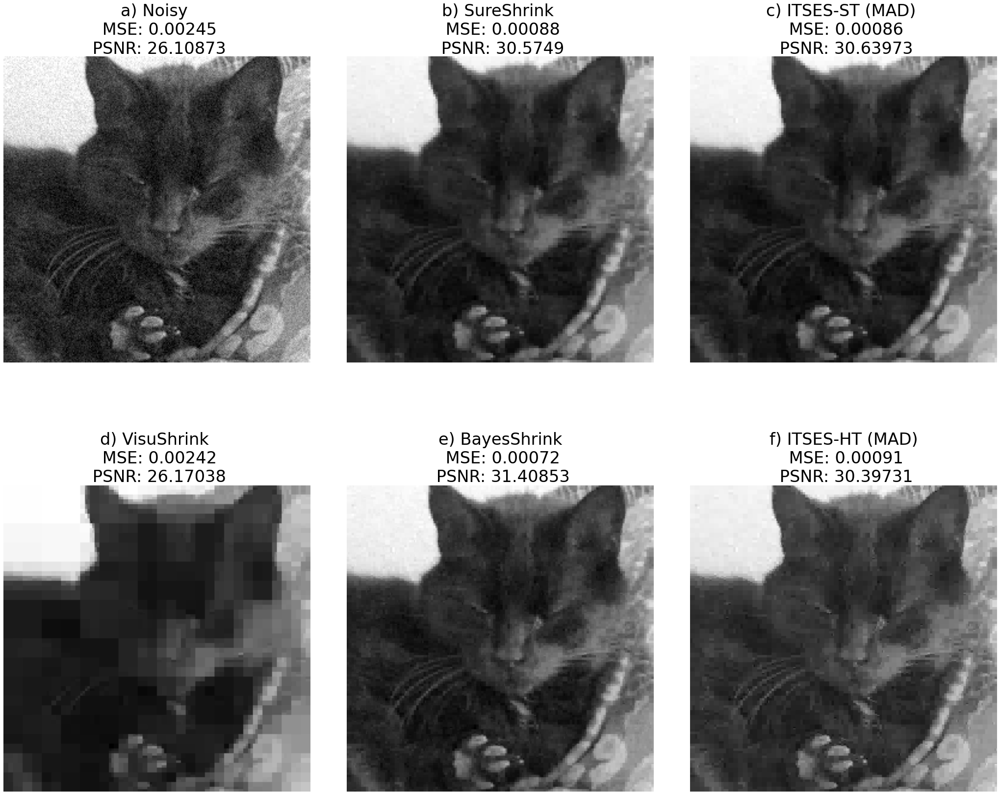

In [21]:
# Plot data
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(30, 25),
                       sharex=True, sharey=True)
fig.tight_layout()
plt.gray()


psnr = str(round(peak_signal_noise_ratio(image, noisy),5))
mse = str(round(mean_squared_error(image, noisy),5))
ax[0, 0].imshow(noisy)
ax[0, 0].axis('off')
ax[0, 0].set_title('a) Noisy \n MSE: '+ mse + "\n PSNR: " + psnr)


psnr = str(round(peak_signal_noise_ratio(image, visu_image),5))
mse = str(round(mean_squared_error(image, visu_image),5))
ax[1, 0].imshow(visu_image)
ax[1, 0].axis('off')
ax[1, 0].set_title('d) VisuShrink \n MSE: '+ mse + "\n PSNR: " + psnr)

psnr = str(round(peak_signal_noise_ratio(image, bayes_image),5))
mse = str(round(mean_squared_error(image, bayes_image),5))
ax[1, 1].imshow(bayes_image)
ax[1, 1].axis('off')
ax[1, 1].set_title('e) BayesShrink\n MSE: '+ mse + "\n PSNR: " + psnr)

psnr = str(round(peak_signal_noise_ratio(image, ss_image),5))
mse = str(round(mean_squared_error(image, ss_image),5))
ax[0, 1].imshow(ss_image)
ax[0, 1].axis('off')
ax[0, 1].set_title('b) SureShrink \n MSE: '+ mse + "\n PSNR: " + psnr)


psnr = str(round(peak_signal_noise_ratio(image, itses_image_st),5))
mse = str(round(mean_squared_error(image, itses_image_st),5))
ax[0, 2].imshow(itses_image_st)
ax[0, 2].axis('off')
ax[0, 2].set_title('c) ITSES-ST (MAD) \n MSE: '+ mse + "\n PSNR: " + psnr)



psnr = str(round(peak_signal_noise_ratio(image, itses_image_ht),5))
mse = str(round(mean_squared_error(image, itses_image_ht),5))
ax[1, 2].imshow(itses_image_ht)
ax[1, 2].axis('off')
ax[1, 2].set_title('f) ITSES-HT (MAD)\n MSE: '+ mse + "\n PSNR: " + psnr)

plt.savefig("output/figures//cat_large.pdf")

plt.show()

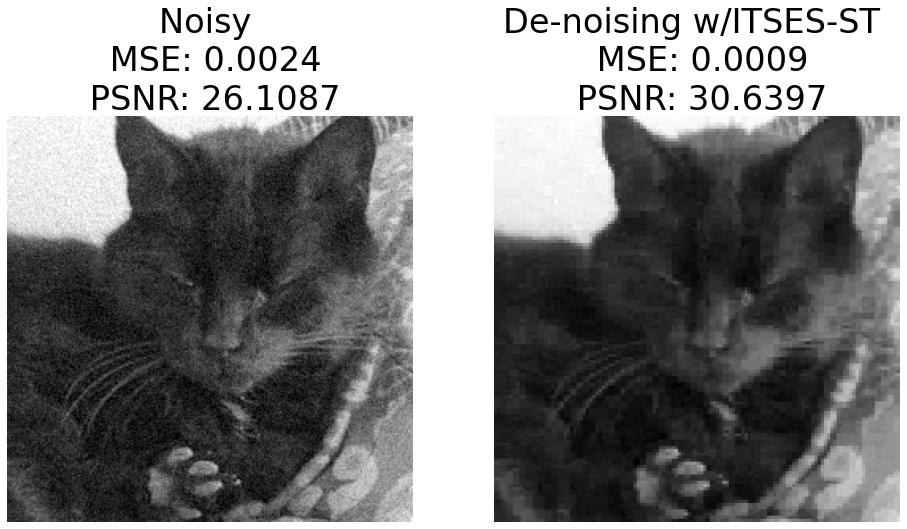

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 14),
                       sharex=True, sharey=True)
plt.gray()

psnr = str(round(peak_signal_noise_ratio(image, noisy),4))
mse = str(round(mean_squared_error(image, noisy),4))
ax[0].imshow(noisy)
ax[0].axis('off')
ax[0].set_title('Noisy \n MSE: '+ mse + "\n PSNR: " + psnr)
#ax[0].set_title('Noisy')

psnr = str(round(peak_signal_noise_ratio(image, itses_image_st),4))
mse = str(round(mean_squared_error(image, itses_image_st),4))
ax[1].imshow(itses_image_st)
ax[1].axis('off')
ax[1].set_title('De-noising w/ITSES-ST \n MSE: '+ mse + "\n PSNR: " + psnr)
#ax[1].set_title("Proposed denoising method")

#plt.savefig("../output/figures//cat_small_temp.pdf")
plt.show()

In [23]:
# Run experiments for all images
noise_levels = [0.025, 0.05, 0.075]
figures = ["stjerten256","baboon256", "peppers256"]
noise_methods = ["gaussian","speckle", "poisson"]

for noise_method in noise_methods:
    print("Noise_method", noise_method)
    result = []
    for figure in figures:
        filename = os.path.join('output\\figures\\'+figure+'.png')
        out_path = "output/"
        original_image = io.imread(filename)
        image = rgb2gray(original_image)
        
        levels = [0]
        if noise_method != "poisson":
            levels = range(len(noise_levels))


        for i in levels: 
            msess  = []
            psnrss = []
            for j in range(5):
                psnrs =  []
                mses = []
                
                if noise_method != "poisson":
                    sigma = noise_levels[i]
                    noisy = random_noise(image, var=sigma**2, seed = j, mode = noise_method)
                else:
                    noisy_po = random_noise(original_image, seed = 1, mode = "poisson")
                    noisy_po = rgb2gray(noisy_po)
                    sigma = 0
                    
                print(figure, sigma, j)

                bayes_image= skiresort.denoise_wavelet(noisy, method ="BayesShrink", multichannel = False)
                visu_image = skiresort.denoise_wavelet(noisy, method ="VisuShrink", multichannel = False)
                itses_image_st = denoise_wavelet(noisy, method ="IterativeST", use_sparse_mad_estimation= False, multichannel = False)
                itses_image_ht= denoise_wavelet(noisy, method ="IterativeHT",use_sparse_mad_estimation= False, multichannel = False)
                itses_image_ht_sd = denoise_wavelet(noisy, method ="IterativeHT", use_sparse_mad_estimation = True, multichannel = False)
                itses_image_st_sd = denoise_wavelet(noisy, method ="IterativeST", use_sparse_mad_estimation = True, multichannel = False)
                ss_image= denoise_wavelet(noisy, method ="SureShrink", use_sparse_mad_estimation = False, multichannel = False)

                mses += [mean_squared_error(image, noisy)]
                psnrs += [peak_signal_noise_ratio(image, noisy)]

                mses += [mean_squared_error(image, ss_image)]
                psnrs += [peak_signal_noise_ratio(image, ss_image)]

                mses += [mean_squared_error(image, bayes_image)]
                psnrs += [peak_signal_noise_ratio(image, bayes_image)]

                mses += [mean_squared_error(image, visu_image)]
                psnrs += [peak_signal_noise_ratio(image, visu_image)]

                mses +=  [mean_squared_error(image, itses_image_st)]
                psnrs += [peak_signal_noise_ratio(image, itses_image_st)]

                mses += [mean_squared_error(image, itses_image_ht)]
                psnrs += [peak_signal_noise_ratio(image, itses_image_ht)]

                mses += [mean_squared_error(image, itses_image_st_sd)]
                psnrs += [peak_signal_noise_ratio(image, itses_image_st_sd)]

                mses += [mean_squared_error(image, itses_image_ht_sd)]
                psnrs +=[peak_signal_noise_ratio(image, itses_image_ht_sd)]


                result_row = [figure, sigma, j] + mses + psnrs
                print(result_row)
                result += [result_row]

                with open("output/image-de-noising/denoise-"+ noise_method +".pickle", "wb") as file:
                    pickle.dump(result, file)
    df =  pd.DataFrame(result)
    
    df.to_csv("output/image-de-noising/simulations/img_denoise_result"+ noise_method +".csv")


Noise_method gaussian
stjerten256 0.025 0
Number of points in noise estimation: 128
Estimated noise: 0.026257389600550143
0.026257389600550143
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0262573896005501"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.129896710513601, diff to last: 0.13"
[1] "Newton iter: 2, lambda:0.131296651629075, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.131296813406908, diff to last: 0"
[1] "Newton iter: 4, lambda:0.13129681340691, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.131296813406908"
[1] "Starting iterative with newton 0.131296813406908"
[1] "Starting newton at: 0.038547538972103"
[1] "Newton iter: 1, lambda:0.0607894079411333, diff to last: 0.022"
[1] "Newton iter: 2, lambda:0.0608129447251466, diff to last: 0"
[1] "Newton iter: 3, lambda:0.060812944751496, diff

[1] "Newton iter: 3, lambda:0.235895727585528, diff to last: 0"
[1] "Final threshold is: 0.00619400602431844"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0262573896005501"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.69794124413505"
[1] "Starting iterative with newton 1.69794124413505"
[1] "Starting newton at: 0.684145705694142"
[1] "Newton iter: 1, lambda:0.70219799921394, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.702351240454742, diff to last: 0"
[1] "Newton iter: 3, lambda:0.702351251426454, diff to last: 0"
[1] "Newton iter: 4, lambda:0.702351251426454, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.702351240454742"
[1] "Starting iterative with newton 0.702351240454742"
[1] "Starting newton at: 0.414844712388116"
[1] "Newton iter: 1, lambda:0.495348931474137, diff to last: 0.081"
[1] "Newton iter: 2, lambda:0.49785919978302, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.497861607448867, diff to last: 0"
[1] 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0262573896005501"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 18.4357646497855"
[1] "Starting iterative with newton 18.4357646497855"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0262573896005501"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 14.8403447228799"
[1] "Starting iterative with newton 14.8403447228799"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Starting newton at: 3.56177808884449"
[1] "Newton iter: 1, lambda:3.61129627410605, diff to last: 0.05"
[1] "Newton iter: 2, lambda:3.6153519554317, diff to last: 0.004"
[1] "Newton iter: 3, lambda:3.61537768875362, diff to last: 0"
[1] "Newton iter: 4, lambda:3.61537768978407, diff to last: 0"
[1] "Iteration: 3 Threshold: 3.61537768978407"
[1] "Starting iterative with newton 3.61537768978407"
[1] "Starting newton at: 3.89350153703307"
[1] "Newton iter: 1, lambda:3.91538987570926, diff to last: 0.022"
[1] "Newton iter: 2, lambda:3.91620466832729, diff to last: 0.001"
[1] "Newton iter: 3, lambda:3.91620576036416, diff to last: 0"
[1] "Newton iter: 4, lambda:3.91620576036612, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.91620576036612"
[1] "Starting iterative with newton 3.91620576036612"
[1] "Starting newton at: 3.99468495323965"
[1] "Newton iter: 1, lambda:4.11822335194931, diff to last: 0.124"
[1] "Newton iter: 2, lambda:4.1502058477377, diff to last: 0.032"
[1] "Newton iter: 

[1] "Newton iter: 2, lambda:1.78912663427819, diff to last: 0"
[1] "Newton iter: 3, lambda:1.78912663406187, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.78912663427819"
[1] "Starting iterative with newton 1.78912663427819"
[1] "Starting newton at: 2.16503842254596"
[1] "Newton iter: 1, lambda:2.17143984629881, diff to last: 0.006"
[1] "Newton iter: 2, lambda:2.17144990677904, diff to last: 0"
[1] "Newton iter: 3, lambda:2.17144990680445, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.17144990677904"
[1] "Starting iterative with newton 2.17144990677904"
[1] "Starting newton at: 2.39419925430188"
[1] "Newton iter: 1, lambda:2.37856747277873, diff to last: 0.016"
[1] "Newton iter: 2, lambda:2.37866205698165, diff to last: 0"
[1] "Newton iter: 3, lambda:2.37866206036155, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.37866205698165"
[1] "Starting iterative with newton 2.37866205698165"
[1] "Starting newton at: 2.48802058998071"
[1] "Newton iter: 1, lambda:2.49380337093657, diff to la

[1] "Starting newton at: 0.502654573700347"
[1] "Newton iter: 1, lambda:0.565446537104446, diff to last: 0.063"
[1] "Newton iter: 2, lambda:0.566815383969735, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.566816023570071, diff to last: 0"
[1] "Newton iter: 4, lambda:0.566816023570211, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.566816023570071"
[1] "Starting iterative with newton 0.566816023570071"
[1] "Starting newton at: 0.220191256209077"
[1] "Newton iter: 1, lambda:0.299705744035684, diff to last: 0.08"
[1] "Newton iter: 2, lambda:0.301187907857994, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.301188419497202, diff to last: 0"
[1] "Newton iter: 4, lambda:0.301188419497263, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.301188419497202"
[1] "Starting iterative with newton 0.301188419497202"
[1] "Starting newton at: 0.227516200603725"
[1] "Newton iter: 1, lambda:0.262371568191908, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.26263652198915, diff to last: 0"
[1] 

[1] "Iteration: 2 Threshold: 1.29509923295067"
[1] "Starting iterative with newton 1.29509923295067"
[1] "Starting newton at: 1.29602325823909"
[1] "Newton iter: 1, lambda:1.36547297276634, diff to last: 0.069"
[1] "Newton iter: 2, lambda:1.37050584547863, diff to last: 0.005"
[1] "Newton iter: 3, lambda:1.37053097013181, diff to last: 0"
[1] "Newton iter: 4, lambda:1.37053097075527, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.37053097013181"
[1] "Starting iterative with newton 1.37053097013181"
[1] "Starting newton at: 1.31129194080962"
[1] "Newton iter: 1, lambda:1.39713433024856, diff to last: 0.086"
[1] "Newton iter: 2, lambda:1.40503996369918, diff to last: 0.008"
[1] "Newton iter: 3, lambda:1.4051030092258, diff to last: 0"
[1] "Newton iter: 4, lambda:1.40510301320786, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.4051030092258"
[1] "Starting iterative with newton 1.4051030092258"
[1] "Starting newton at: 1.32866698019231"
[1] "Newton iter: 1, lambda:1.41289633957558, diff 

[1] "Sd:0.0265141791606756"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 2.89551998091041"
[1] "Starting iterative with newton 2.89551998091041"
[1] "Starting newton at: 0.611237062350787"
[1] "Newton iter: 1, lambda:0.571523991821745, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.572064463860157, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.572064565230643, diff to last: 0"
[1] "Newton iter: 4, lambda:0.572064565230646, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.572064565230646"
[1] "Starting iterative with newton 0.572064565230646"
[1] "Starting newton at: 0.23454393194299"
[1] "Newton iter: 1, lambda:0.305405056836078, diff to last: 0.071"
[1] "Newton iter: 2, lambda:0.306605409238056, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.306605751359109, diff to last: 0"
[1] "Newton iter: 4, lambda:0.306605751359136, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.306605751359109"
[1] "Starting iterative with newton 0.30660575135910

[1] "Newton iter: 5, lambda:1.14787866768218, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.14787866768218"
[1] "Starting iterative with newton 1.14787866768218"
[1] "Starting newton at: 1.28785339081275"
[1] "Newton iter: 1, lambda:1.32019561693527, diff to last: 0.032"
[1] "Newton iter: 2, lambda:1.32124120444815, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.32124227040657, diff to last: 0"
[1] "Newton iter: 4, lambda:1.32124227040768, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.32124227040768"
[1] "Starting iterative with newton 1.32124227040768"
[1] "Starting newton at: 1.29107659572643"
[1] "Newton iter: 1, lambda:1.39323122799062, diff to last: 0.102"
[1] "Newton iter: 2, lambda:1.40462629255409, diff to last: 0.011"
[1] "Newton iter: 3, lambda:1.40475851187123, diff to last: 0"
[1] "Newton iter: 4, lambda:1.40475852949779, diff to last: 0"
[1] "Newton iter: 5, lambda:1.40475852949779, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.40475851187123"
[1] "Starting itera

[1] "Newton iter: 4, lambda:1.11971578566184, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.1197157931092"
[1] "Starting iterative with newton 1.1197157931092"
[1] "Starting newton at: 1.38438744205983"
[1] "Newton iter: 1, lambda:1.4516898474394, diff to last: 0.067"
[1] "Newton iter: 2, lambda:1.44823157188095, diff to last: 0.003"
[1] "Newton iter: 3, lambda:1.44822329470513, diff to last: 0"
[1] "Newton iter: 4, lambda:1.44822329465743, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.44822329465743"
[1] "Starting iterative with newton 1.44822329465743"
[1] "Starting newton at: 1.8576213599397"
[1] "Newton iter: 1, lambda:1.78391420894152, diff to last: 0.074"
[1] "Newton iter: 2, lambda:1.7833575821243, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.78335752315756, diff to last: 0"
[1] "Newton iter: 4, lambda:1.78335752315756, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.78335752315756"
[1] "Starting iterative with newton 1.78335752315756"
[1] "Starting newton at: 2.020662

[1] "Estiamted sparsity: 0.368545083735643. h at: 0.4"
[1] "Using regular MAD in noise estimation."
Estimated noise: 0.02651417916067557
0.02651417916067557
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0265141791606756"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 19.6055910807165"
[1] "Starting iterative with newton 19.6055910807165"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0265141791606756"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 18.1586342945489"
[1] "Starting iterative with newton 18.15

[1] "Newton iter: 2, lambda:2.69958390870679, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.69958422204408, diff to last: 0"
[1] "Newton iter: 4, lambda:2.69958422204413, diff to last: 0"
[1] "Final threshold is: 0.0715772597226096"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0265141791606756"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.817767271608325"
[1] "Starting iterative with newton 0.817767271608325"
[1] "Starting newton at: 1.35398704021809"
[1] "Newton iter: 1, lambda:1.29221184151299, diff to last: 0.062"
[1] "Newton iter: 2, lambda:1.28865917586667, diff to last: 0.004"
[1] "Newton iter: 3, lambda:1.28864649311664, diff to last: 0"
[1] "Newton iter: 4, lambda:1.28864649295445, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.28864649295445"
[1] "Starting iterative with newton 1.28864649295445"
[1] "Starting newton at: 1.80955627589636"
[1] "Newton iter: 1, lambda:1.8568521658946, diff to last: 0.047"
[1] "Newton iter: 2, l

[1] "Starting iterative with newton 0.193871255493466"
[1] "Starting newton at: 0.250209046189747"
[1] "Newton iter: 1, lambda:0.190613877637334, diff to last: 0.06"
[1] "Newton iter: 2, lambda:0.191179827723898, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.191179878934521, diff to last: 0"
[1] "Newton iter: 4, lambda:0.191179878934521, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.191179878934521"
[1] "Starting iterative with newton 0.191179878934521"
[1] "Starting newton at: 0.252900422748692"
[1] "Newton iter: 1, lambda:0.190256469443444, diff to last: 0.063"
[1] "Newton iter: 2, lambda:0.190881236844468, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.190881299207068, diff to last: 0"
[1] "Newton iter: 4, lambda:0.190881299207069, diff to last: 0"
[1] "Final threshold is: 0.00506106096559873"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0265141791606756"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 2.89551998091041

[1] "Newton iter: 3, lambda:1.55730979021545, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.55733124915215, diff to last: 0"
[1] "Newton iter: 5, lambda:1.55733124963326, diff to last: 0"
[1] "Final threshold is: 0.0412913597652951"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0265141791606756"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.817767271608325"
[1] "Starting iterative with newton 0.817767271608325"
[1] "Starting newton at: 1.30534517726257"
[1] "Newton iter: 1, lambda:1.12102235312431, diff to last: 0.184"
[1] "Newton iter: 2, lambda:1.14724912065415, diff to last: 0.026"
[1] "Newton iter: 3, lambda:1.14787831173092, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.14787866768206, diff to last: 0"
[1] "Newton iter: 5, lambda:1.14787866768218, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.14787866768218"
[1] "Starting iterative with newton 1.14787866768218"
[1] "Starting newton at: 1.28785339081275"
[1] "Newt

[1] "Iteration: 2 Threshold: 0.200331023485867"
[1] "Starting iterative with newton 0.200331023485867"
[1] "Starting newton at: 0.286442761862599"
[1] "Newton iter: 1, lambda:0.17716589452194, diff to last: 0.109"
[1] "Newton iter: 2, lambda:0.17889829466279, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.178898732584224, diff to last: 0"
[1] "Newton iter: 4, lambda:0.178898732584252, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.178898732584224"
[1] "Starting iterative with newton 0.178898732584224"
[1] "Starting newton at: 0.307875052764242"
[1] "Newton iter: 1, lambda:0.174165401195419, diff to last: 0.134"
[1] "Newton iter: 2, lambda:0.176740862848748, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.176741825376772, diff to last: 0"
[1] "Newton iter: 4, lambda:0.176741825376906, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.176741825376772"
[1] "Starting iterative with newton 0.176741825376772"
[1] "Starting newton at: 0.310031959971695"
[1] "Newton iter: 1, lambda:0.173

[1] "Newton iter: 4, lambda:1.56483958354114, diff to last: 0.001"
[1] "Newton iter: 5, lambda:1.56484108865815, diff to last: 0"
[1] "Newton iter: 6, lambda:1.56484108866054, diff to last: 0"
[1] "Final threshold is: 0.0415684248480725"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0265639911613756"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.841691882884802"
[1] "Starting iterative with newton 0.841691882884802"
[1] "Starting newton at: 1.2979810885075"
[1] "Newton iter: 1, lambda:1.13271129579653, diff to last: 0.165"
[1] "Newton iter: 2, lambda:1.15436570768696, diff to last: 0.022"
[1] "Newton iter: 3, lambda:1.15479797976599, diff to last: 0"
[1] "Newton iter: 4, lambda:1.15479814954776, diff to last: 0"
[1] "Newton iter: 5, lambda:1.15479814954779, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.15479814954779"
[1] "Starting iterative with newton 1.15479814954779"
[1] "Starting newton at: 1.26591887544495"
[1] "Newton it

[1] "Newton iter: 1, lambda:1.91652319236291, diff to last: 0.077"
[1] "Newton iter: 2, lambda:1.91573891962464, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.91573888993443, diff to last: 0"
[1] "Newton iter: 4, lambda:1.91573888993443, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.91573888993443"
[1] "Starting iterative with newton 1.91573888993443"
[1] "Starting newton at: 2.14547972270907"
[1] "Newton iter: 1, lambda:2.12431372055715, diff to last: 0.021"
[1] "Newton iter: 2, lambda:2.12438085636927, diff to last: 0"
[1] "Newton iter: 3, lambda:2.12438085696075, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.12438085636927"
[1] "Starting iterative with newton 2.12438085636927"
[1] "Starting newton at: 2.24878362061893"
[1] "Newton iter: 1, lambda:2.25568696028934, diff to last: 0.007"
[1] "Newton iter: 2, lambda:2.25569700002767, diff to last: 0"
[1] "Newton iter: 3, lambda:2.25569700004942, diff to last: 0"
[1] "Final threshold is: 0.0599203151714765"
[1] "Starting ITSES. 

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0265639911613756"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.35752984541745"
[1] "Starting iterative with newton 1.35752984541745"
[1] "Starting newton at: 1.56278831075489"
[1] "Newton iter: 1, lambda:1.3369072639389, diff to last: 0.226"
[1] "Newton iter: 2, lambda:1.29794647447605, diff to last: 0.039"
[1] "Newton iter: 3, lambda:1.29631342186518, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.29631046739769, diff to last: 0"
[1] "Newton iter: 5, lambda:1.29631046738801, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.29631046738801"
[1] "Starting iterative with newton 1.29631046738801"
[1] "Starting newton at: 1.50984683458304"
[1] "Newton iter: 1, lambda:1.27580976244412, 

[1] "Newton iter: 1, lambda:0.0509796207593415, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.0510899673033848, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0510899678202134, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0510899673033848"
[1] "Starting iterative with newton 0.0510899673033848"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0509758445157312, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.0510861729626794, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0510861734793303, diff to last: 0"
[1] "Final threshold is: 0.00135705266077343"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0265639911613756"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.328687892960919"
[1] "Newton iter: 1, lambda:0.27805308131053, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.278474661210041, diff to last: 0"
[1] "Newton 

[1] "Starting newton at: 0.594947917864225"
[1] "Newton iter: 1, lambda:0.592685212706743, diff to last: 0.002"
[1] "Newton iter: 2, lambda:0.592687586658998, diff to last: 0"
[1] "Newton iter: 3, lambda:0.592687586661613, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.592687586661613"
[1] "Starting iterative with newton 0.592687586661613"
[1] "Starting newton at: 0.597821195907917"
[1] "Newton iter: 1, lambda:0.580174444857167, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.580316631648, diff to last: 0"
[1] "Newton iter: 3, lambda:0.580316640922467, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.580316631648"
[1] "Starting iterative with newton 0.580316631648"
[1] "Starting newton at: 0.595748079585623"
[1] "Newton iter: 1, lambda:0.576526699551891, diff to last: 0.019"
[1] "Newton iter: 2, lambda:0.576694766332325, diff to last: 0"
[1] "Newton iter: 3, lambda:0.576694779246989, diff to last: 0"
[1] "Newton iter: 4, lambda:0.576694779246989, diff to last: 0"
[1] "Final threshol

[1] "Newton iter: 1, lambda:0.0339616174867323, diff to last: 0.034"
[1] "Newton iter: 2, lambda:0.0340108791204305, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0340108792240876, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0340108792240876"
[1] "Starting iterative with newton 0.0340108792240876"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0339583353428059, diff to last: 0.034"
[1] "Newton iter: 2, lambda:0.0340075844983335, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0340075846019319, diff to last: 0"
[1] "Final threshold is: 0.000894443617574758"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0263012981006807"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.24880544724037"
[1] "Newton iter: 1, lambda:0.276537009451494, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.276662146454037, diff to last: 0"
[1] "Newton

[1] "Newton iter: 4, lambda:0.581480960877306, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.581480960872386"
[1] "Starting iterative with newton 0.581480960872386"
[1] "Starting newton at: 0.653661887829878"
[1] "Newton iter: 1, lambda:0.565810936133199, diff to last: 0.088"
[1] "Newton iter: 2, lambda:0.569195888120824, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.569201045291886, diff to last: 0"
[1] "Newton iter: 4, lambda:0.569201045303847, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.569201045291886"
[1] "Starting iterative with newton 0.569201045291886"
[1] "Starting newton at: 0.649175476567416"
[1] "Newton iter: 1, lambda:0.562367687186152, diff to last: 0.087"
[1] "Newton iter: 2, lambda:0.565663883133484, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.565668757440346, diff to last: 0"
[1] "Newton iter: 4, lambda:0.565668757450996, diff to last: 0"
[1] "Final threshold is: 0.0148778226159603"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.02630

[1] "Newton iter: 5, lambda:1.39344264624702, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.39344264624702"
[1] "Starting iterative with newton 1.39344264624702"
[1] "Starting newton at: 1.62827895368127"
[1] "Newton iter: 1, lambda:1.32596091988844, diff to last: 0.302"
[1] "Newton iter: 2, lambda:1.25758666786816, diff to last: 0.068"
[1] "Newton iter: 3, lambda:1.25203130969537, diff to last: 0.006"
[1] "Newton iter: 4, lambda:1.25199300947782, diff to last: 0"
[1] "Newton iter: 5, lambda:1.25199300765388, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.25199300765388"
[1] "Starting iterative with newton 1.25199300765388"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 4 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as pr

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0263012981006807"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 8.16162889679486"
[1] "Starting iterative with newton 8.16162889679486"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0263012981006807"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshol

[1] "Starting iterative with newton 3.6311335318025"
[1] "Starting newton at: 4.22773849372818"
[1] "Newton iter: 1, lambda:4.03880612510304, diff to last: 0.189"
[1] "Newton iter: 2, lambda:4.08358945839822, diff to last: 0.045"
[1] "Newton iter: 3, lambda:4.08757731830832, diff to last: 0.004"
[1] "Newton iter: 4, lambda:4.08760679447787, diff to last: 0"
[1] "Newton iter: 5, lambda:4.08760679607674, diff to last: 0"
[1] "Iteration: 4 Threshold: 4.08760679447787"
[1] "Starting iterative with newton 4.08760679447787"
[1] "Starting newton at: 4.3350470728902"
[1] "Newton iter: 1, lambda:4.39188137544553, diff to last: 0.057"
[1] "Newton iter: 2, lambda:4.39867105898805, diff to last: 0.007"
[1] "Newton iter: 3, lambda:4.39875885847612, diff to last: 0"
[1] "Newton iter: 4, lambda:4.39875887295762, diff to last: 0"
[1] "Newton iter: 5, lambda:4.39875887295762, diff to last: 0"
[1] "Final threshold is: 0.115693068390673"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da':

[1] "Newton iter: 2, lambda:0.23775046481961, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.237750644969942, diff to last: 0"
[1] "Newton iter: 4, lambda:0.237750644969949, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.237750644969942"
[1] "Starting iterative with newton 0.237750644969942"
[1] "Starting newton at: 0.320659644757401"
[1] "Newton iter: 1, lambda:0.229243407889547, diff to last: 0.091"
[1] "Newton iter: 2, lambda:0.230948546494649, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.230949143355704, diff to last: 0"
[1] "Newton iter: 4, lambda:0.230949143355778, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.230949143355704"
[1] "Starting iterative with newton 0.230949143355704"
[1] "Starting newton at: 0.310646075176113"
[1] "Newton iter: 1, lambda:0.228548242536273, diff to last: 0.082"
[1] "Newton iter: 2, lambda:0.229921524848273, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.229921911136377, diff to last: 0"
[1] "Newton iter: 4, lambda:0.229921911136408, 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0263184431883952"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.124241394168994, diff to last: 0.124"
[1] "Newton iter: 2, lambda:0.125488879593408, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.125489005000499, diff to last: 0"
[1] "Newton iter: 4, lambda:0.125489005000501, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.125489005000499"
[1] "Starting iterative with newton 0.125489005000499"
[1] "Starting newton at: 0.10238602582543"
[1] "Newton iter: 1, lambda:0.0669730816742902, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.0670394442945598, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0670394445278495, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0670394442945598"
[1] "Starting iterative with newton 0.0670394442945598"
[1] "Starting newton at

[1] "Iteration: 0 Threshold: 1.72155486212815"
[1] "Starting iterative with newton 1.72155486212815"
[1] "Starting newton at: 0.636919647635375"
[1] "Newton iter: 1, lambda:0.706625801286989, diff to last: 0.07"
[1] "Newton iter: 2, lambda:0.708946468394625, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.708948980779999, diff to last: 0"
[1] "Newton iter: 4, lambda:0.708948980782941, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.708948980779999"
[1] "Starting iterative with newton 0.708948980779999"
[1] "Starting newton at: 0.385051141850423"
[1] "Newton iter: 1, lambda:0.492887763351822, diff to last: 0.108"
[1] "Newton iter: 2, lambda:0.497450665467269, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.497458694259051, diff to last: 0"
[1] "Newton iter: 4, lambda:0.497458694283886, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.497458694259051"
[1] "Starting iterative with newton 0.497458694259051"
[1] "Starting newton at: 0.45727120211747"
[1] "Newton iter: 1, lambda:0.44679

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0263184431883952"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 15.7210721537107"
[1] "Starting iterative with newton 15.7210721537107"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of

[1] "Iteration: 1 Threshold: 2.25181875839557"
[1] "Starting iterative with newton 2.25181875839557"
[1] "Starting newton at: 3.10167130256962"
[1] "Newton iter: 1, lambda:3.09332351364775, diff to last: 0.008"
[1] "Newton iter: 2, lambda:3.09342113410052, diff to last: 0"
[1] "Newton iter: 3, lambda:3.0934211475484, diff to last: 0"
[1] "Newton iter: 4, lambda:3.0934211475484, diff to last: 0"
[1] "Iteration: 2 Threshold: 3.09342113410052"
[1] "Starting iterative with newton 3.09342113410052"
[1] "Starting newton at: 3.56343957895106"
[1] "Newton iter: 1, lambda:3.66665002128108, diff to last: 0.103"
[1] "Newton iter: 2, lambda:3.68663900432863, diff to last: 0.02"
[1] "Newton iter: 3, lambda:3.68732134001962, diff to last: 0.001"
[1] "Newton iter: 4, lambda:3.68732211365544, diff to last: 0"
[1] "Newton iter: 5, lambda:3.68732211365644, diff to last: 0"
[1] "Iteration: 3 Threshold: 3.68732211365544"
[1] "Starting iterative with newton 3.68732211365544"
[1] "Starting newton at: 4.0350

[1] "Starting newton at: 2.58801141163846"
[1] "Newton iter: 1, lambda:2.59174582293379, diff to last: 0.004"
[1] "Newton iter: 2, lambda:2.59175362347987, diff to last: 0"
[1] "Newton iter: 3, lambda:2.59175362351398, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.59175362347987"
[1] "Starting iterative with newton 2.59175362347987"
[1] "Starting newton at: 2.70215859069627"
[1] "Newton iter: 1, lambda:2.70764194119906, diff to last: 0.005"
[1] "Newton iter: 2, lambda:2.70765973867298, diff to last: 0"
[1] "Newton iter: 3, lambda:2.70765973886072, diff to last: 0"
[1] "Final threshold is: 0.0712613890107109"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0263184431883952"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.835952577718475"
[1] "Starting iterative with newton 0.835952577718475"
[1] "Starting newton at: 1.2118169981804"
[1] "Newton iter: 1, lambda:1.24765305074603, diff to last: 0.036"
[1] "Newton iter: 2, lambda:1.24621398484871, 

[1] "Newton iter: 1, lambda:0.208872229799452, diff to last: 0.095"
[1] "Newton iter: 2, lambda:0.21033869948495, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.210339051433196, diff to last: 0"
[1] "Newton iter: 4, lambda:0.210339051433216, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.210339051433216"
[1] "Starting iterative with newton 0.210339051433216"
[1] "Starting newton at: 0.169679098305673"
[1] "Newton iter: 1, lambda:0.188334632824633, diff to last: 0.019"
[1] "Newton iter: 2, lambda:0.188388647213127, diff to last: 0"
[1] "Newton iter: 3, lambda:0.188388647665515, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.188388647213127"
[1] "Starting iterative with newton 0.188388647213127"
[1] "Starting newton at: 0.162687534726768"
[1] "Newton iter: 1, lambda:0.186059627128892, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.186143923625994, diff to last: 0"
[1] "Newton iter: 3, lambda:0.186143924721347, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.186143923625994"
[1]

[1] "Iteration: 4 Threshold: 1.5424539225939"
[1] "Starting iterative with newton 1.5424539225939"
[1] "Starting newton at: 1.85933187754304"
[1] "Newton iter: 1, lambda:1.42052694975336, diff to last: 0.439"
[1] "Newton iter: 2, lambda:1.54150167047886, diff to last: 0.121"
[1] "Newton iter: 3, lambda:1.55859770753241, diff to last: 0.017"
[1] "Newton iter: 4, lambda:1.55890971295147, diff to last: 0"
[1] "Newton iter: 5, lambda:1.55890981515985, diff to last: 0"
[1] "Newton iter: 6, lambda:1.55890981515986, diff to last: 0"
[1] "Final threshold is: 0.0410280794061161"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0263184431883952"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.835952577718475"
[1] "Starting iterative with newton 0.835952577718475"
[1] "Starting newton at: 1.2939575302504"
[1] "Newton iter: 1, lambda:1.117824349985, diff to last: 0.176"
[1] "Newton iter: 2, lambda:1.14176781039136, diff to last: 0.024"
[1] "Newto

[1] "Iteration: 0 Threshold: 2.45437287739016"
[1] "Starting iterative with newton 2.45437287739016"
[1] "Starting newton at: 0.571999459281971"
[1] "Newton iter: 1, lambda:0.585714338210632, diff to last: 0.014"
[1] "Newton iter: 2, lambda:0.585783531814996, diff to last: 0"
[1] "Newton iter: 3, lambda:0.585783533569209, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.585783533569209"
[1] "Starting iterative with newton 0.585783533569209"
[1] "Starting newton at: 0.399046030495976"
[1] "Newton iter: 1, lambda:0.349979876095538, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.350609637888883, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.350609742370573, diff to last: 0"
[1] "Newton iter: 4, lambda:0.350609742370576, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.350609742370573"
[1] "Starting iterative with newton 0.350609742370573"
[1] "Starting newton at: 0.23588729807262"
[1] "Newton iter: 1, lambda:0.31016727513674, diff to last: 0.074"
[1] "Newton iter: 2, lambda:0.31155

[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.4054649080067, diff to last: 0"
[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Iteration: 3 Threshold: 4.4054649080067"
[1] "Starting iterative with newton 4.4054649080067"
[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.4054649080067, diff to last: 0"
[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0.220477216083135"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0500462994682876"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.743418520039784"
[1] "Starting iterative with newton 0.743418520039784"
[1] "Starting newton at: 1.48155754376809"
[1] "Newton iter: 1, lambda:1.35425640050461, diff to last: 0.127"
[1] "Newton iter: 2, lambda:1.37089761259059, diff to last: 0.017"
[1] "Newton iter: 3, lambda:1.37122769157316

[1] "Iteration: 3 Threshold: 1.71685739517548"
[1] "Starting iterative with newton 1.71685739517548"
[1] "Starting newton at: 1.85355896330898"
[1] "Newton iter: 1, lambda:1.91958376830281, diff to last: 0.066"
[1] "Newton iter: 2, lambda:1.91890340791761, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.91890336898125, diff to last: 0"
[1] "Newton iter: 4, lambda:1.91890336898125, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.91890336898125"
[1] "Starting iterative with newton 1.91890336898125"
[1] "Starting newton at: 2.03610238082967"
[1] "Newton iter: 1, lambda:2.04941055861909, diff to last: 0.013"
[1] "Newton iter: 2, lambda:2.04941382185654, diff to last: 0"
[1] "Newton iter: 3, lambda:2.04941382185687, diff to last: 0"
[1] "Final threshold is: 0.10256557786308"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0500462994682876"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.778927391826032"
[1] "Starting iterative with newton 0.7789273

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0500462994682876"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.1337011326066"
[1] "Starting iterative with newton 1.1337011326066"
[1] "Starting newton at: 1.28995558693578"
[1] "Newton iter: 1, lambda:1.182935660066, diff to last: 0.107"
[1] "Newton iter: 2, lambda:1.16890023793032, diff to last: 0.014"
[1] "Newton iter: 3, lambda:1.16863495090561, diff to last: 0"
[1] "Newton iter: 4, lambda:1.16863485562712, diff to last: 0"
[1] "Newton iter: 5, lambda:1.1686348556271, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.1686348556271"
[1] "Starting iterative with newton 1.1686348556271"
[1] "Starting newton at: 1.32600748836889"
[1] "Newton iter: 1, lambda:1.22023077841143, diff to last: 0.106"
[1] "Newton iter:

[1] "Iteration: 1 Threshold: 0.221101919709028"
[1] "Starting iterative with newton 0.221101919709028"
[1] "Starting newton at: 0.141269281901783"
[1] "Newton iter: 1, lambda:0.0967064368425966, diff to last: 0.045"
[1] "Newton iter: 2, lambda:0.0968603442711111, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0968603461083733, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0968603461083733"
[1] "Starting iterative with newton 0.0968603461083733"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0897731728233712, diff to last: 0.09"
[1] "Newton iter: 2, lambda:0.0903777728225852, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0903778002272245, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0903778002272246, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0903778002272245"
[1] "Starting iterative with newton 0.0903778002272245"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0894316865004767, diff to last: 0.089"
[1] "Newton iter: 2, lambda:0.0900306497450591, diff

[1] "Newton iter: 2, lambda:0.419425349612716, diff to last: 0"
[1] "Newton iter: 3, lambda:0.41942535009727, diff to last: 0"
[1] "Final threshold is: 0.0209906866513092"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0500462994682876"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.1337011326066"
[1] "Starting iterative with newton 1.1337011326066"
[1] "Starting newton at: 0.975841111731448"
[1] "Newton iter: 1, lambda:0.869960093573491, diff to last: 0.106"
[1] "Newton iter: 2, lambda:0.876667805749469, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.87669635449089, diff to last: 0"
[1] "Newton iter: 4, lambda:0.876696355006411, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.876696355006411"
[1] "Starting iterative with newton 0.876696355006411"
[1] "Starting newton at: 0.782276615286285"
[1] "Newton iter: 1, lambda:0.792297996093616, diff to last: 0.01"
[1] "Newton iter: 2, lambda:0.792358211906274, diff to last: 0"
[1] "New

[1] "Starting iterative with newton 0.110208975299673"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.100394368035712, diff to last: 0.1"
[1] "Newton iter: 2, lambda:0.101387203105247, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.101387299992065, diff to last: 0"
[1] "Newton iter: 4, lambda:0.101387299992066, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.101387299992065"
[1] "Starting iterative with newton 0.101387299992065"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0996845419007273, diff to last: 0.1"
[1] "Newton iter: 2, lambda:0.100661365439057, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.100661459038322, diff to last: 0"
[1] "Newton iter: 4, lambda:0.100661459038323, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.100661459038322"
[1] "Starting iterative with newton 0.100661459038322"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.099626157647608, diff to last: 0.1"
[1] "Newton iter: 2, lambda:0.100601669290557, diff to last: 0.0

[1] "Newton iter: 3, lambda:0.854125932343238, diff to last: 0"
[1] "Newton iter: 4, lambda:0.85412593240465, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.854125932343238"
[1] "Starting iterative with newton 0.854125932343238"
[1] "Starting newton at: 0.766122347603773"
[1] "Newton iter: 1, lambda:0.785808590141261, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.786036564928123, diff to last: 0"
[1] "Newton iter: 3, lambda:0.786036595270189, diff to last: 0"
[1] "Newton iter: 4, lambda:0.786036595270189, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.786036595270189"
[1] "Starting iterative with newton 0.786036595270189"
[1] "Starting newton at: 0.784079647659889"
[1] "Newton iter: 1, lambda:0.7643368967587, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.764558866712814, diff to last: 0"
[1] "Newton iter: 3, lambda:0.764558894992686, diff to last: 0"
[1] "Newton iter: 4, lambda:0.764558894992686, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.764558894992686"
[1] "Starting i

[1] "Iteration: 0 Threshold: 4.09366105237749"
[1] "Starting iterative with newton 4.09366105237749"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.29110551780104"
[1] "Starting iterative with newton 2.29110551780104"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to la

[1] "Newton iter: 2, lambda:3.10417894083235, diff to last: 0"
[1] "Newton iter: 3, lambda:3.10417897023728, diff to last: 0"
[1] "Newton iter: 4, lambda:3.10417897023728, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.10417897023728"
[1] "Starting iterative with newton 3.10417897023728"
[1] "Starting newton at: 3.23595662160167"
[1] "Newton iter: 1, lambda:3.23220555418843, diff to last: 0.004"
[1] "Newton iter: 2, lambda:3.23222012673888, diff to last: 0"
[1] "Newton iter: 3, lambda:3.23222012695947, diff to last: 0"
[1] "Final threshold is: 0.16486746425099"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.89668041387181"
[1] "Newton iter: 1, lambda:2.31582527440326, diff to last: 0.419"
[1] "Newton iter: 2, lambda:2.42706561440917, diff to last: 0.111"
[1] "Newton iter: 3, lambda

[1] "Final threshold is: 0.106762400986958"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0510074988046471"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.781990936850581"
[1] "Starting iterative with newton 0.781990936850581"
[1] "Starting newton at: 1.26123913845547"
[1] "Newton iter: 1, lambda:1.33131066403667, diff to last: 0.07"
[1] "Newton iter: 2, lambda:1.32683847859989, diff to last: 0.004"
[1] "Newton iter: 3, lambda:1.32682176043956, diff to last: 0"
[1] "Newton iter: 4, lambda:1.32682176020431, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.32682176020431"
[1] "Starting iterative with newton 1.32682176020431"
[1] "Starting newton at: 2.07061790543914"
[1] "Newton iter: 1, lambda:2.02692276390466, diff to last: 0.044"
[1] "Newton iter: 2, lambda:2.02756118324432, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.02756130114043, diff to last: 0"
[1] "Newton iter: 4, lambda:2.02756130114043, diff to last: 0"
[1] "Iteration: 2 Thresh

[1] "Newton iter: 2, lambda:0.185907472414425, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.18590769936689, diff to last: 0"
[1] "Newton iter: 4, lambda:0.185907699366899, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.18590769936689"
[1] "Starting iterative with newton 0.18590769936689"
[1] "Starting newton at: 0.246785590952975"
[1] "Newton iter: 1, lambda:0.181513792282281, diff to last: 0.065"
[1] "Newton iter: 2, lambda:0.182216679361695, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.182216761070197, diff to last: 0"
[1] "Newton iter: 4, lambda:0.182216761070198, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.182216761070197"
[1] "Starting iterative with newton 0.182216761070197"
[1] "Starting newton at: 0.250476529249669"
[1] "Newton iter: 1, lambda:0.180983422614425, diff to last: 0.069"
[1] "Newton iter: 2, lambda:0.181778969931474, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.181779074463301, diff to last: 0"
[1] "Newton iter: 4, lambda:0.181779074463302, di

[1] "Iteration: 0 Threshold: 0.781990936850581"
[1] "Starting iterative with newton 0.781990936850581"
[1] "Starting newton at: 1.12364285731161"
[1] "Newton iter: 1, lambda:1.28333357479872, diff to last: 0.16"
[1] "Newton iter: 2, lambda:1.31423388763853, diff to last: 0.031"
[1] "Newton iter: 3, lambda:1.31530857345096, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.31530984200781, diff to last: 0"
[1] "Newton iter: 5, lambda:1.31530984200958, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.31530984200958"
[1] "Starting iterative with newton 1.31530984200958"
[1] "Starting newton at: 1.43219348439426"
[1] "Newton iter: 1, lambda:1.63565604266007, diff to last: 0.203"
[1] "Newton iter: 2, lambda:1.69748605760646, diff to last: 0.062"
[1] "Newton iter: 3, lambda:1.70267677998725, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.70271125023937, diff to last: 0"
[1] "Newton iter: 5, lambda:1.70271125175061, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.70271125175061"
[1] "Start

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0505527614174526"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.199576178685218, diff to last: 0.2"
[1] "Newton iter: 2, lambda:0.205025460649967, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.205029486523401, diff to last: 0"
[1] "Newton iter: 4, lambda:0.205029486525597, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.205029486523401"
[1] "Starting iterative with newton 0.205029486523401"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0829200851750909, diff to last: 0.083"
[1] "Newton iter: 2, lambda:0.0834213994644885, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0834214177745718, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0834214177745718, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0834214177745718"
[1] "Starting iterative wit

[1] "Newton iter: 3, lambda:0.409481141605267, diff to last: 0"
[1] "Newton iter: 4, lambda:0.409481141605307, diff to last: 0"
[1] "Final threshold is: 0.0207004024565192"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0505527614174526"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.08813314437333"
[1] "Starting iterative with newton 1.08813314437333"
[1] "Starting newton at: 0.761184933291547"
[1] "Newton iter: 1, lambda:0.857579940495043, diff to last: 0.096"
[1] "Newton iter: 2, lambda:0.863619818507169, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.863642679666725, diff to last: 0"
[1] "Newton iter: 4, lambda:0.863642679993339, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.863642679993339"
[1] "Starting iterative with newton 0.863642679993339"
[1] "Starting newton at: 0.794213870354148"
[1] "Newton iter: 1, lambda:0.791519838417312, diff to last: 0.003"
[1] "Newton iter: 2, lambda:0.791524142191987, diff to last: 0"
[1]

[1] "Iteration: 0 Threshold: 7.59930664868532"
[1] "Starting iterative with newton 7.59930664868532"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0505527614174526"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.32080118051366"
[1] "Starting iterative with newton 4.32080118051366"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to la

[1] "Newton iter: 2, lambda:2.26335763800191, diff to last: 0.006"
[1] "Newton iter: 3, lambda:2.26338103282201, diff to last: 0"
[1] "Newton iter: 4, lambda:2.26338103314966, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.26338103282201"
[1] "Starting iterative with newton 2.26338103282201"
[1] "Starting newton at: 2.72384172092248"
[1] "Newton iter: 1, lambda:2.76712858795508, diff to last: 0.043"
[1] "Newton iter: 2, lambda:2.76881667601292, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.76881924224839, diff to last: 0"
[1] "Newton iter: 4, lambda:2.76881924225432, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.76881924224839"
[1] "Starting iterative with newton 2.76881924224839"
[1] "Starting newton at: 3.01447842715632"
[1] "Newton iter: 1, lambda:3.05358009172214, diff to last: 0.039"
[1] "Newton iter: 2, lambda:3.05512444694044, diff to last: 0.002"
[1] "Newton iter: 3, lambda:3.05512681287653, diff to last: 0"
[1] "Newton iter: 4, lambda:3.05512681288208, diff to last: 0"

[1] "Starting newton at: 1.93501070021022"
[1] "Newton iter: 1, lambda:1.92405826293525, diff to last: 0.011"
[1] "Newton iter: 2, lambda:1.92405133588908, diff to last: 0"
[1] "Newton iter: 3, lambda:1.92405133588575, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.92405133588575"
[1] "Starting iterative with newton 1.92405133588575"
[1] "Starting newton at: 2.04712803556526"
[1] "Newton iter: 1, lambda:2.10378453050791, diff to last: 0.057"
[1] "Newton iter: 2, lambda:2.10387677572139, diff to last: 0"
[1] "Newton iter: 3, lambda:2.10387677641048, diff to last: 0"
[1] "Final threshold is: 0.106356780729598"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0505527614174526"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.7823905574959"
[1] "Starting iterative with newton 0.7823905574959"
[1] "Starting newton at: 1.42207374299461"
[1] "Newton iter: 1, lambda:1.3582784211403, diff to last: 0.064"
[1] "Newton iter: 2, lambda:1.35537518761874, diff t

[1] "Newton iter: 4, lambda:0.454933607748985, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.454933607746905"
[1] "Starting iterative with newton 0.454933607746905"
[1] "Starting newton at: 0.196810481272095"
[1] "Newton iter: 1, lambda:0.200703319143087, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.200705825448714, diff to last: 0"
[1] "Newton iter: 3, lambda:0.200705825449753, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.200705825448714"
[1] "Starting iterative with newton 0.200705825448714"
[1] "Starting newton at: 0.196579080549528"
[1] "Newton iter: 1, lambda:0.173393681626151, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.173475682589888, diff to last: 0"
[1] "Newton iter: 3, lambda:0.173475683616393, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.173475682589888"
[1] "Starting iterative with newton 0.173475682589888"
[1] "Starting newton at: 0.223454071025118"
[1] "Newton iter: 1, lambda:0.170069337156147, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.17049

[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0505527614174526"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 0.7823905574959"
[1] "Starting iterative with newton 0.7823905574959"
[1] "Starting newton at: 1.13904639094972"
[1] "Newton iter: 1, lambda:1.28047900801367, diff to last: 0.141"
[1] "Newton iter: 2, lambda:1.3043007056713, diff to last: 0.024"
[1] "Newton iter: 3, lambda:1.30493045763444, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.30493088954912, diff to last: 0"
[1] "Newton iter: 5, lambda:1.30493088954933, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.30493088954912"
[1] "Starting iterative with newton 1.30493088954912"
[1] "Starting newton at: 1.47094727590935"
[1] "Newton iter: 1, lambda:1.63970956173151, diff to last: 0.169"
[1] "Newton iter: 2, lambda:1.68190034197779, diff to last: 0.042"
[1] "Newton iter: 3, lambda:1.68429568287953, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.68430308245693, diff 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0505307045831091"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.242351421664911"
[1] "Newton iter: 1, lambda:0.223980633920776, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.224026001664042, diff to last: 0"
[1] "Newton iter: 3, lambda:0.224026001941314, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.224026001664042"
[1] "Starting iterative with newton 0.224026001664042"
[1] "Starting newton at: 0.107131859240279"
[1] "Newton iter: 1, lambda:0.0901168250520194, diff to last: 0.017"
[1] "Newton iter: 2, lambda:0.0901395191958424, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0901395192362253, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0901395191958424"
[1] "Starting iterative with newton 0.0901395191958424"
[1] "Starting newton at: 0.0684659178743042"
[1] "Newton iter: 1, lambda:0

[1] "Starting newton at: 0.458544724028081"
[1] "Newton iter: 1, lambda:0.422275991956297, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.422732644045854, diff to last: 0"
[1] "Newton iter: 3, lambda:0.422732716854964, diff to last: 0"
[1] "Newton iter: 4, lambda:0.422732716854966, diff to last: 0"
[1] "Final threshold is: 0.0213609820330133"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0505307045831091"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.17312546042107"
[1] "Starting iterative with newton 1.17312546042107"
[1] "Starting newton at: 0.969860335458332"
[1] "Newton iter: 1, lambda:0.856134172389683, diff to last: 0.114"
[1] "Newton iter: 2, lambda:0.863598625624719, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.863632852966343, diff to last: 0"
[1] "Newton iter: 4, lambda:0.863632853683519, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.863632853683519"
[1] "Starting iterative with newton 0.863632853683519"
[1]

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0505307045831091"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 7.33313128490795"
[1] "Starting iterative with newton 7.33313128490795"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0505307045831091"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.35466445944493"
[1] "Starting iterative with newton 4.35466445944493"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, l

[1] "Newton iter: 3, lambda:3.25480454534652, diff to last: 0"
[1] "Newton iter: 4, lambda:3.2548045453502, diff to last: 0"
[1] "Final threshold is: 0.164467566956852"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0505307045831091"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.725030922365675"
[1] "Starting iterative with newton 0.725030922365675"
[1] "Starting newton at: 1.5320352319221"
[1] "Newton iter: 1, lambda:1.56159961460208, diff to last: 0.03"
[1] "Newton iter: 2, lambda:1.56123228672211, diff to last: 0"
[1] "Newton iter: 3, lambda:1.56123223572067, diff to last: 0"
[1] "Newton iter: 4, lambda:1.56123223572067, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.56123223572067"
[1] "Starting iterative with newton 1.56123223572067"
[1] "Starting newton at: 2.21985006286966"
[1] "Newton iter: 1, lambda:2.3295298843903, diff to last: 0.11"
[1] "Newton iter: 2, lambda:2.33614612359019, diff to last: 0.007"
[1] "Newton iter: 3, lambda:2.3

[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0505307045831091"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.972374069731946"
[1] "Starting iterative with newton 0.972374069731946"
[1] "Starting newton at: 1.11154378970172"
[1] "Newton iter: 1, lambda:1.16883045264924, diff to last: 0.057"
[1] "Newton iter: 2, lambda:1.16447197780408, diff to last: 0.004"
[1] "Newton iter: 3, lambda:1.16444693818765, diff to last: 0"
[1] "Newton iter: 4, lambda:1.16444693735962, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.16444693818765"
[1] "Starting iterative with newton 1.16444693818765"
[1] "Starting newton at: 1.45722271243255"
[1] "Newton iter: 1, lambda:1.4551321547767, diff to last: 0.002"
[1] "Newton iter: 2, lambda:1.45512908962534, diff to last: 0"
[1] "Newton iter: 3, lambda:1.45512908961873, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.45512908961873"
[1] "Starting iterative with newton 1.45512908961873"
[1] "Starting newton at: 1.7567358

[1] "Newton iter: 1, lambda:0.0502524426797027, diff to last: 0.05"
[1] "Newton iter: 2, lambda:0.0504046878892815, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0504046892870096, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0504046878892815"
[1] "Starting iterative with newton 0.0504046878892815"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0502314098404098, diff to last: 0.05"
[1] "Newton iter: 2, lambda:0.0503834908786417, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0503834922730202, diff to last: 0"
[1] "Final threshold is: 0.00254591329345441"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0505307045831091"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.383901806349804"
[1] "Newton iter: 1, lambda:0.463121267380394, diff to last: 0.079"
[1] "Newton iter: 2, lambda:0.464938295530474, diff to last: 0.002"
[1] "Newt

[1] "Newton iter: 4, lambda:0.977266492329612, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.977266488999309"
[1] "Starting iterative with newton 0.977266488999309"
[1] "Starting newton at: 0.853588009452214"
[1] "Newton iter: 1, lambda:0.96900570777305, diff to last: 0.115"
[1] "Newton iter: 2, lambda:0.979053362401679, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.979125739319541, diff to last: 0"
[1] "Newton iter: 4, lambda:0.979125743054095, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.979125743054095"
[1] "Starting iterative with newton 0.979125743054095"
[1] "Starting newton at: 0.85345497843408"
[1] "Newton iter: 1, lambda:0.969579097636287, diff to last: 0.116"
[1] "Newton iter: 2, lambda:0.979757034777257, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.97983133138776, diff to last: 0"
[1] "Newton iter: 4, lambda:0.979831335324367, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.979831335324367"
[1] "Starting iterative with newton 0.979831335324367"
[1] "Starting ne

[1] "Newton iter: 3, lambda:0.105297532966869, diff to last: 0"
[1] "Newton iter: 4, lambda:0.105297532966869, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.105297532966869"
[1] "Starting iterative with newton 0.105297532966869"
[1] "Starting newton at: 0.175898973271615"
[1] "Newton iter: 1, lambda:0.104844288256164, diff to last: 0.071"
[1] "Newton iter: 2, lambda:0.105270472989913, diff to last: 0"
[1] "Newton iter: 3, lambda:0.105270488364785, diff to last: 0"
[1] "Newton iter: 4, lambda:0.105270488364785, diff to last: 0"
[1] "Final threshold is: 0.00526123184850466"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0499782221041224"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.599971891812421"
[1] "Newton iter: 1, lambda:0.449317505300511, diff to last: 0.151"
[1] "Newton iter: 2, lambda:0.4553788545535, diff to last: 0.006"
[1] "

[1] "Newton iter: 1, lambda:0.955397498789875, diff to last: 0.105"
[1] "Newton iter: 2, lambda:0.963459930325822, diff to last: 0.008"
[1] "Newton iter: 3, lambda:0.963505727761025, diff to last: 0"
[1] "Newton iter: 4, lambda:0.963505729232371, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.963505727761025"
[1] "Starting iterative with newton 0.963505727761025"
[1] "Starting newton at: 0.852957840194997"
[1] "Newton iter: 1, lambda:0.953403811330471, diff to last: 0.1"
[1] "Newton iter: 2, lambda:0.960816700424041, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.960855344999327, diff to last: 0"
[1] "Newton iter: 4, lambda:0.960855346045417, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.960855344999327"
[1] "Starting iterative with newton 0.960855344999327"
[1] "Starting newton at: 0.854285881448543"
[1] "Newton iter: 1, lambda:0.952731998059777, diff to last: 0.098"
[1] "Newton iter: 2, lambda:0.959842554906372, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.95987808634988

[1] "Starting newton at: 1.65461568820449"
[1] "Newton iter: 1, lambda:1.3458593753321, diff to last: 0.309"
[1] "Newton iter: 2, lambda:1.27757918833231, diff to last: 0.068"
[1] "Newton iter: 3, lambda:1.27219972809934, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.27216480955761, diff to last: 0"
[1] "Newton iter: 5, lambda:1.27216480808337, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.27216480808337"
[1] "Starting iterative with newton 1.27216480808337"
[1] "Starting newton at: 1.54421505291348"
[1] "Newton iter: 1, lambda:1.24918811824207, diff to last: 0.295"
[1] "Newton iter: 2, lambda:1.16913028621851, diff to last: 0.08"
[1] "Newton iter: 3, lambda:1.16016712138275, diff to last: 0.009"
[1] "Newton iter: 4, lambda:1.16005020407191, diff to last: 0"
[1] "Newton iter: 5, lambda:1.16005018416115, diff to last: 0"
[1] "Newton iter: 6, lambda:1.16005018416115, diff to last: 0"
[1] "Final threshold is: 0.0579772457559339"
[1] "Starting ITSES. Number of points in data:  1024"

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0499782221041224"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 8.79976319879205"
[1] "Starting iterative with newton 8.79976319879205"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0499782221041224"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 8.19045924247484"
[1] "Starting iterative with newton 8.19045924247484"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Starting newton at: 1.41568211749546"
[1] "Newton iter: 1, lambda:1.4095394659737, diff to last: 0.006"
[1] "Newton iter: 2, lambda:1.40950960889716, diff to last: 0"
[1] "Newton iter: 3, lambda:1.40950960818575, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.40950960818575"
[1] "Starting iterative with newton 1.40950960818575"
[1] "Starting newton at: 1.68278258080376"
[1] "Newton iter: 1, lambda:1.69936032038506, diff to last: 0.017"
[1] "Newton iter: 2, lambda:1.69926224587945, diff to last: 0"
[1] "Newton iter: 3, lambda:1.69926224263709, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.69926224263709"
[1] "Starting iterative with newton 1.69926224263709"
[1] "Starting newton at: 1.98336467466582"
[1] "Newton iter: 1, lambda:1.91859978164323, diff to last: 0.065"
[1] "Newton iter: 2, lambda:1.91854464900544, diff to last: 0"
[1] "Newton iter: 3, lambda:1.91854464875633, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.91854464875633"
[1] "Starting iterative with newton 1.918544

[1] "Newton iter: 3, lambda:0.0596281660302109, diff to last: 0"
[1] "Final threshold is: 0.0029801095367067"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0499782221041224"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.23679434277199"
[1] "Newton iter: 1, lambda:0.230043346362235, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.23004967380965, diff to last: 0"
[1] "Newton iter: 3, lambda:0.230049673815211, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.23004967380965"
[1] "Starting iterative with newton 0.23004967380965"
[1] "Starting newton at: 0.106201133464902"
[1] "Newton iter: 1, lambda:0.112705516470567, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.112709178063154, diff to last: 0"
[1] "Newton iter: 3, lambda:0.112709178064314, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.112709178063154"
[1] "Starting iterative with

[1] "Starting iterative with newton 1.02270944178013"
[1] "Starting newton at: 1.12950821562842"
[1] "Newton iter: 1, lambda:1.02210937410134, diff to last: 0.107"
[1] "Newton iter: 2, lambda:1.03030665179208, diff to last: 0.008"
[1] "Newton iter: 3, lambda:1.03035816787724, diff to last: 0"
[1] "Newton iter: 4, lambda:1.03035816990211, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.03035816787724"
[1] "Starting iterative with newton 1.03035816787724"
[1] "Starting newton at: 1.13312238066101"
[1] "Newton iter: 1, lambda:1.02514220753636, diff to last: 0.108"
[1] "Newton iter: 2, lambda:1.03343658895632, diff to last: 0.008"
[1] "Newton iter: 3, lambda:1.03348942423895, diff to last: 0"
[1] "Newton iter: 4, lambda:1.03348942637238, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.03348942637238"
[1] "Starting iterative with newton 1.03348942637238"
[1] "Starting newton at: 1.1307273334398"
[1] "Newton iter: 1, lambda:1.02704922642011, diff to last: 0.104"
[1] "Newton iter: 2, lambda:1

[1] "Newton iter: 2, lambda:0.173907022982425, diff to last: 0"
[1] "Newton iter: 3, lambda:0.173907024556064, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.173907024556064"
[1] "Starting iterative with newton 0.173907024556064"
[1] "Starting newton at: 0.213788827301959"
[1] "Newton iter: 1, lambda:0.172505033784251, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.172737183359169, diff to last: 0"
[1] "Newton iter: 3, lambda:0.172737190722535, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.172737190722535"
[1] "Starting iterative with newton 0.172737190722535"
[1] "Starting newton at: 0.214958661135488"
[1] "Newton iter: 1, lambda:0.172375456445033, diff to last: 0.043"
[1] "Newton iter: 2, lambda:0.172622382320193, diff to last: 0"
[1] "Newton iter: 3, lambda:0.172622390649318, diff to last: 0"
[1] "Final threshold is: 0.0126299031830899"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.073164918731473"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Ite

[1] "Newton iter: 1, lambda:1.3112381625844, diff to last: 0.064"
[1] "Newton iter: 2, lambda:1.31538851021654, diff to last: 0.004"
[1] "Newton iter: 3, lambda:1.31540501915057, diff to last: 0"
[1] "Newton iter: 4, lambda:1.31540501941089, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.31540501915057"
[1] "Starting iterative with newton 1.31540501915057"
[1] "Starting newton at: 1.28013287316298"
[1] "Newton iter: 1, lambda:1.38064094421994, diff to last: 0.101"
[1] "Newton iter: 2, lambda:1.39137613794723, diff to last: 0.011"
[1] "Newton iter: 3, lambda:1.3914904140413, diff to last: 0"
[1] "Newton iter: 4, lambda:1.39149042687165, diff to last: 0"
[1] "Newton iter: 5, lambda:1.39149042687165, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.39149042687165"
[1] "Starting iterative with newton 1.39149042687165"
[1] "Starting newton at: 1.2691654076469"
[1] "Newton iter: 1, lambda:1.40403446097537, diff to last: 0.135"
[1] "Newton iter: 2, lambda:1.4240793384912, diff to last: 0.02"


[1] "Newton iter: 1, lambda:1.36209449036221, diff to last: 0.129"
[1] "Newton iter: 2, lambda:1.34777180045113, diff to last: 0.014"
[1] "Newton iter: 3, lambda:1.34756543495782, diff to last: 0"
[1] "Newton iter: 4, lambda:1.34756539164959, diff to last: 0"
[1] "Newton iter: 5, lambda:1.34756539164958, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.34756539164958"
[1] "Starting iterative with newton 1.34756539164958"
[1] "Starting newton at: 1.5362445441258"
[1] "Newton iter: 1, lambda:1.40603423480595, diff to last: 0.13"
[1] "Newton iter: 2, lambda:1.3928513765202, diff to last: 0.013"
[1] "Newton iter: 3, lambda:1.39269088320432, diff to last: 0"
[1] "Newton iter: 4, lambda:1.39269085913618, diff to last: 0"
[1] "Newton iter: 5, lambda:1.39269085913618, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.39269085913618"
[1] "Starting iterative with newton 1.39269085913618"
[1] "Starting newton at: 1.58470742486753"
[1] "Newton iter: 1, lambda:1.44306755214125, diff to last: 0.142"
[1

[1] "Newton iter: 1, lambda:3.04133612265528, diff to last: 0.036"
[1] "Newton iter: 2, lambda:3.04291739421472, diff to last: 0.002"
[1] "Newton iter: 3, lambda:3.04292032206084, diff to last: 0"
[1] "Newton iter: 4, lambda:3.04292032207087, diff to last: 0"
[1] "Iteration: 3 Threshold: 3.04292032207087"
[1] "Starting iterative with newton 3.04292032207087"
[1] "Starting newton at: 3.38451539168894"
[1] "Newton iter: 1, lambda:3.37945930397539, diff to last: 0.005"
[1] "Newton iter: 2, lambda:3.37949266780393, diff to last: 0"
[1] "Newton iter: 3, lambda:3.37949266926426, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.37949266780393"
[1] "Starting iterative with newton 3.37949266780393"
[1] "Starting newton at: 3.59257343450177"
[1] "Newton iter: 1, lambda:3.59556912390492, diff to last: 0.003"
[1] "Newton iter: 2, lambda:3.59558169381282, diff to last: 0"
[1] "Newton iter: 3, lambda:3.59558169403332, diff to last: 0"
[1] "Final threshold is: 0.263070442420187"
[1] "Starting ITSES. N

[1] "Newton iter: 1, lambda:1.2847489936174, diff to last: 0.07"
[1] "Newton iter: 2, lambda:1.27961844530895, diff to last: 0.005"
[1] "Newton iter: 3, lambda:1.2795918483068, diff to last: 0"
[1] "Newton iter: 4, lambda:1.27959184758838, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.27959184758838"
[1] "Starting iterative with newton 1.27959184758838"
[1] "Starting newton at: 1.7786517310127"
[1] "Newton iter: 1, lambda:1.85767005974396, diff to last: 0.079"
[1] "Newton iter: 2, lambda:1.85684803024957, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.85684800629628, diff to last: 0"
[1] "Newton iter: 4, lambda:1.85684800629628, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.85684800629628"
[1] "Starting iterative with newton 1.85684800629628"
[1] "Starting newton at: 2.21574948104571"
[1] "Newton iter: 1, lambda:2.24697039842872, diff to last: 0.031"
[1] "Newton iter: 2, lambda:2.24726348534781, diff to last: 0"
[1] "Newton iter: 3, lambda:2.24726351332015, diff to last: 0"
[1]

[1] "Starting iterative with newton 0.173907024556064"
[1] "Starting newton at: 0.213788827301959"
[1] "Newton iter: 1, lambda:0.172505033784251, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.172737183359169, diff to last: 0"
[1] "Newton iter: 3, lambda:0.172737190722535, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.172737190722535"
[1] "Starting iterative with newton 0.172737190722535"
[1] "Starting newton at: 0.214958661135488"
[1] "Newton iter: 1, lambda:0.172375456445033, diff to last: 0.043"
[1] "Newton iter: 2, lambda:0.172622382320193, diff to last: 0"
[1] "Newton iter: 3, lambda:0.172622390649318, diff to last: 0"
[1] "Final threshold is: 0.0126299031830899"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.073164918731473"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.294143725837054"
[1] "Newton iter: 1, lambda:0.353750721

[1] "Newton iter: 4, lambda:1.31540501941089, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.31540501915057"
[1] "Starting iterative with newton 1.31540501915057"
[1] "Starting newton at: 1.28013287316298"
[1] "Newton iter: 1, lambda:1.38064094421994, diff to last: 0.101"
[1] "Newton iter: 2, lambda:1.39137613794723, diff to last: 0.011"
[1] "Newton iter: 3, lambda:1.3914904140413, diff to last: 0"
[1] "Newton iter: 4, lambda:1.39149042687165, diff to last: 0"
[1] "Newton iter: 5, lambda:1.39149042687165, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.39149042687165"
[1] "Starting iterative with newton 1.39149042687165"
[1] "Starting newton at: 1.2691654076469"
[1] "Newton iter: 1, lambda:1.40403446097537, diff to last: 0.135"
[1] "Newton iter: 2, lambda:1.4240793384912, diff to last: 0.02"
[1] "Newton iter: 3, lambda:1.42448578843593, diff to last: 0"
[1] "Newton iter: 4, lambda:1.42448595267429, diff to last: 0"
[1] "Newton iter: 5, lambda:1.42448595267431, diff to last: 0"
[1] "It

[1] "Starting iterative with newton 0.366576637587131"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.122049385878016, diff to last: 0.122"
[1] "Newton iter: 2, lambda:0.123669098366652, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.123669383981493, diff to last: 0"
[1] "Newton iter: 4, lambda:0.123669383981502, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.123669383981493"
[1] "Starting iterative with newton 0.123669383981493"
[1] "Starting newton at: 0.125671697617355"
[1] "Newton iter: 1, lambda:0.108137767000427, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.108167494040609, diff to last: 0"
[1] "Newton iter: 3, lambda:0.108167494126035, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.108167494126035"
[1] "Starting iterative with newton 0.108167494126035"
[1] "Starting newton at: 0.141173587472813"
[1] "Newton iter: 1, lambda:0.107033463593108, diff to last: 0.034"
[1] "Newton iter: 2, lambda:0.10714538753737, diff to last: 0"
[1] "Newton iter: 3, lambda:0.10

[1] "Iteration: 3 Threshold: 1.42761361700095"
[1] "Starting iterative with newton 1.42761361700095"
[1] "Starting newton at: 1.70797160319102"
[1] "Newton iter: 1, lambda:1.38855317625523, diff to last: 0.319"
[1] "Newton iter: 2, lambda:1.4616584093613, diff to last: 0.073"
[1] "Newton iter: 3, lambda:1.46745480110104, diff to last: 0.006"
[1] "Newton iter: 4, lambda:1.46748917365188, diff to last: 0"
[1] "Newton iter: 5, lambda:1.46748917485408, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.46748917485408"
[1] "Starting iterative with newton 1.46748917485408"
[1] "Starting newton at: 1.73468924829541"
[1] "Newton iter: 1, lambda:1.39789914575624, diff to last: 0.337"
[1] "Newton iter: 2, lambda:1.47766594753423, diff to last: 0.08"
[1] "Newton iter: 3, lambda:1.48464363579712, diff to last: 0.007"
[1] "Newton iter: 4, lambda:1.48469374699573, diff to last: 0"
[1] "Newton iter: 5, lambda:1.48469374956337, diff to last: 0"
[1] "Final threshold is: 0.110485305719351"
[1] "Starting IT

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0744162260748004"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 6.98079780652234"
[1] "Starting iterative with newton 6.98079780652234"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0744162260748004"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 6.73024623140298"
[1] "Starting iterative with newton 6.73024623140298"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Newton iter: 2, lambda:2.34795064158775, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.34795075147002, diff to last: 0"
[1] "Newton iter: 4, lambda:2.34795075147003, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.34795075147002"
[1] "Starting iterative with newton 2.34795075147002"
[1] "Starting newton at: 2.47415449488665"
[1] "Newton iter: 1, lambda:2.45458656142137, diff to last: 0.02"
[1] "Newton iter: 2, lambda:2.45473637607197, diff to last: 0"
[1] "Newton iter: 3, lambda:2.45473638464086, diff to last: 0"
[1] "Final threshold is: 0.182672217115808"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0744162260748004"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.736349941950349"
[1] "Starting iterative with newton 0.736349941950349"
[1] "Starting newton at: 1.51755513576288"
[1] "Newton iter: 1, lambda:1.54926056899498, diff to last: 0.032"
[1] "Newton iter: 2, lambda:1.54885764836159, diff to last: 0"
[1] "Newton iter: 3, lambda:

[1] "Newton iter: 2, lambda:1.32996358655801, diff to last: 0.022"
[1] "Newton iter: 3, lambda:1.32946114504202, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.32946088142769, diff to last: 0"
[1] "Newton iter: 5, lambda:1.32946088142762, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.32946088142762"
[1] "Starting iterative with newton 1.32946088142762"
[1] "Starting newton at: 1.55102374184548"
[1] "Newton iter: 1, lambda:1.39000587357285, diff to last: 0.161"
[1] "Newton iter: 2, lambda:1.3704293517433, diff to last: 0.02"
[1] "Newton iter: 3, lambda:1.37006501245923, diff to last: 0"
[1] "Newton iter: 4, lambda:1.37006488405906, diff to last: 0"
[1] "Newton iter: 5, lambda:1.37006488405905, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.37006488405905"
[1] "Starting iterative with newton 1.37006488405905"
[1] "Starting newton at: 1.56307043913248"
[1] "Newton iter: 1, lambda:1.41197240289284, diff to last: 0.151"
[1] "Newton iter: 2, lambda:1.39536280260532, diff to last: 0.01

[1] "Newton iter: 2, lambda:3.54270510967624, diff to last: 0.001"
[1] "Newton iter: 3, lambda:3.54270635583033, diff to last: 0"
[1] "Newton iter: 4, lambda:3.54270635583247, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.54270635583033"
[1] "Starting iterative with newton 3.54270635583033"
[1] "Starting newton at: 3.74193878222317"
[1] "Newton iter: 1, lambda:3.70509466416662, diff to last: 0.037"
[1] "Newton iter: 2, lambda:3.70693123268979, diff to last: 0.002"
[1] "Newton iter: 3, lambda:3.70693605073365, diff to last: 0"
[1] "Newton iter: 4, lambda:3.70693605076673, diff to last: 0"
[1] "Final threshold is: 0.275856191198684"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0744162260748004"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.674474677787277"
[1] "Starting iterative with newton 0.674474677787277"
[1] "Starting newton at: 1.90331751102297"
[1] "Newton iter: 1, lambda:2.31736335132934, diff to last: 0.414"
[1] "Newton iter: 2, l

[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.28276840357304"
[1] "Starting iterative with newton 1.28276840357304"
[1] "Starting newton at: 0.814794042505975"
[1] "Newton iter: 1, lambda:0.787707626714445, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.78810452329803, diff to last: 0"
[1] "Newton iter: 3, lambda:0.78810460952291, diff to last: 0"
[1] "Newton iter: 4, lambda:0.788104609522914, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.78810460952291"
[1] "Starting iterative with newton 0.78810460952291"
[1] "Starting newton at: 0.561218780477578"
[1] "Newton iter: 1, lambda:0.654456026693819, diff to last: 0.093"
[1] "Newton iter: 2, lambda:0.658856086479534, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.658865654210947, diff to last: 0"
[1] "Newton iter: 4, lambda:0.658865654256123, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.658865654210947"
[1] "Starting iterative with newton 0.658865654210947"
[1] "Starting newton at: 0.5911

[1] "Final threshold is: 0.327838072558826"
threshold is:
[{'ad': 0.010912524286038982, 'da': 0.007545624667879169, 'dd': 0.007968326220798298}, {'ad': 0.020652844405643328, 'da': 0.017803677733377748, 'dd': 0.03399811146176101}, {'ad': 0.04531740778101455, 'da': 0.04554243671881869, 'dd': 0.07672078609158162}, {'ad': 0.11048530571935117, 'da': 0.09823054688700847, 'dd': 0.3035190770456534}, {'ad': 0.3278380725588262, 'da': 0.3278380725588262, 'dd': 0.3278380725588262}]
Number of points in noise estimation: 128
Estimated noise: 0.07441622607480039
0.07441622607480039
threshold is:
[{'ad': 0.0056152445885486735, 'da': 0.03162340139821215, 'dd': 0.02748997352128793}, {'ad': 0.030375011660920048, 'da': 0.018882071815050243, 'dd': 0.03902496398202361}, {'ad': 0.04027071536524973, 'da': 0.040068723712620755, 'dd': 0.0636994313388062}, {'ad': 0.07235577956745198, 'da': 0.0768280627309205, 'dd': 0.3035190770456534}, {'ad': 0.3278380725588262, 'da': 0.3278380725588262, 'dd': 0.3278380725588262

[1] "Newton iter: 2, lambda:0.57991027075073, diff to last: 0"
[1] "Newton iter: 3, lambda:0.579910275064058, diff to last: 0"
[1] "Final threshold is: 0.0425458679663793"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0733662949464596"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.39897491940957"
[1] "Starting iterative with newton 1.39897491940957"
[1] "Starting newton at: 0.846010916114764"
[1] "Newton iter: 1, lambda:0.779182235058158, diff to last: 0.067"
[1] "Newton iter: 2, lambda:0.781523184296386, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.78152614522496, diff to last: 0"
[1] "Newton iter: 4, lambda:0.781526145229692, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.78152614522496"
[1] "Starting iterative with newton 0.78152614522496"
[1] "Starting newton at: 0.616133049007041"
[1] "Newton iter: 1, lambda:0.620023596468457, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.620030788741629, diff to last: 0"
[1] "Ne

[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0733662949464596"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 3.12445844365837"
[1] "Starting iterative with newton 3.12445844365837"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0733662949464596"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.92936958615451"
[1] "Starting iterative with newton 2.92936958615451"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to

[1] "Iteration: 0 Threshold: 0.722588041761027"
[1] "Starting iterative with newton 0.722588041761027"
[1] "Starting newton at: 1.71150138699211"
[1] "Newton iter: 1, lambda:1.67339140131224, diff to last: 0.038"
[1] "Newton iter: 2, lambda:1.67334403176794, diff to last: 0"
[1] "Newton iter: 3, lambda:1.67334403156324, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.67334403176794"
[1] "Starting iterative with newton 1.67334403176794"
[1] "Starting newton at: 2.40272152930486"
[1] "Newton iter: 1, lambda:2.51390397392484, diff to last: 0.111"
[1] "Newton iter: 2, lambda:2.52476053239166, diff to last: 0.011"
[1] "Newton iter: 3, lambda:2.5248704249865, diff to last: 0"
[1] "Newton iter: 4, lambda:2.52487043626831, diff to last: 0"
[1] "Newton iter: 5, lambda:2.52487043626831, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.52487043626831"
[1] "Starting iterative with newton 2.52487043626831"
[1] "Starting newton at: 2.99139975831598"
[1] "Newton iter: 1, lambda:3.07940640278562, diff 

[1] "Newton iter: 1, lambda:2.44163549295805, diff to last: 0.03"
[1] "Newton iter: 2, lambda:2.44198389647512, diff to last: 0"
[1] "Newton iter: 3, lambda:2.44198394314828, diff to last: 0"
[1] "Newton iter: 4, lambda:2.44198394314828, diff to last: 0"
[1] "Final threshold is: 0.179159314227535"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0733662949464596"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.852787691804193"
[1] "Starting iterative with newton 0.852787691804193"
[1] "Starting newton at: 1.24733736093987"
[1] "Newton iter: 1, lambda:1.24467830216342, diff to last: 0.003"
[1] "Newton iter: 2, lambda:1.24467052301959, diff to last: 0"
[1] "Newton iter: 3, lambda:1.24467052295287, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.24467052295287"
[1] "Starting iterative with newton 1.24467052295287"
[1] "Starting newton at: 1.76091910949805"
[1] "Newton iter: 1, lambda:1.76755791286095, diff to last: 0.007"
[1] "Newton iter: 2, lambda:

[1] "Newton iter: 1, lambda:0.352782340774675, diff to last: 0.09"
[1] "Newton iter: 2, lambda:0.35468187375474, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.354682703142343, diff to last: 0"
[1] "Newton iter: 4, lambda:0.354682703142501, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.354682703142343"
[1] "Starting iterative with newton 0.354682703142343"
[1] "Starting newton at: 0.197211373482337"
[1] "Newton iter: 1, lambda:0.120955318740921, diff to last: 0.076"
[1] "Newton iter: 2, lambda:0.121582867210886, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.121582909687271, diff to last: 0"
[1] "Newton iter: 4, lambda:0.121582909687272, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.121582909687271"
[1] "Starting iterative with newton 0.121582909687271"
[1] "Starting newton at: 0.0357284683503669"
[1] "Newton iter: 1, lambda:0.106062288271498, diff to last: 0.07"
[1] "Newton iter: 2, lambda:0.106539254134896, diff to last: 0"
[1] "Newton iter: 3, lambda:0.106539276084036, d

[1] "Newton iter: 2, lambda:1.34755122333202, diff to last: 0"
[1] "Newton iter: 3, lambda:1.34755132941717, diff to last: 0"
[1] "Newton iter: 4, lambda:1.34755132941719, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.34755132941719"
[1] "Starting iterative with newton 1.34755132941719"
[1] "Starting newton at: 1.33984314713275"
[1] "Newton iter: 1, lambda:1.35896963981177, diff to last: 0.019"
[1] "Newton iter: 2, lambda:1.359329821191, diff to last: 0"
[1] "Newton iter: 3, lambda:1.35932994694769, diff to last: 0"
[1] "Newton iter: 4, lambda:1.3593299469477, diff to last: 0"
[1] "Final threshold is: 0.0997290018173204"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0733662949464596"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 0.852787691804193"
[1] "Starting iterative with newton 0.852787691804193"
[1] "Starting newton at: 1.28151000023672"
[1] "Newton iter: 1, lambda:1.08894129307209, diff to last: 0.193"
[1] "Newton iter: 2,

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0737902197691669"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.0993874350998965"
[1] "Newton iter: 1, lambda:0.28107100450327, diff to last: 0.182"
[1] "Newton iter: 2, lambda:0.287010975768525, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.287017222494621, diff to last: 0"
[1] "Newton iter: 4, lambda:0.287017222501524, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.287017222501524"
[1] "Starting iterative with newton 0.287017222501524"
[1] "Starting newton at: 0.142129655731845"
[1] "Newton iter: 1, lambda:0.12881192989389, diff to last: 0.013"
[1] "Newton iter: 2, lambda:0.128831541724678, diff to last: 0"
[1] "Newton iter: 3, lambda:0.128831541767223, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.128831541767223"
[1] "Starting iterative with newton 0.128831541767223"
[1] "Startin

[1] "Newton iter: 2, lambda:0.606589337786585, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.606589471547732, diff to last: 0"
[1] "Newton iter: 4, lambda:0.60658947154774, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.606589471547732"
[1] "Starting iterative with newton 0.606589471547732"
[1] "Starting newton at: 0.582911867159189"
[1] "Newton iter: 1, lambda:0.594883194382336, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.594950143379382, diff to last: 0"
[1] "Newton iter: 3, lambda:0.594950145466456, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.594950143379382"
[1] "Starting iterative with newton 0.594950143379382"
[1] "Starting newton at: 0.586861201790418"
[1] "Newton iter: 1, lambda:0.591532355247671, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.59154249886403, diff to last: 0"
[1] "Newton iter: 3, lambda:0.591542498911802, diff to last: 0"
[1] "Final threshold is: 0.0436500509939789"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.07379021976

[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0737902197691669"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 3.18047958570789"
[1] "Starting iterative with newton 3.18047958570789"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0737902197691669"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.98266672186639"
[1] "Starting iterative with newton 1.98266672186639"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 

[1] "Starting iterative with newton 3.16117090285843"
[1] "Starting newton at: 3.43347993528783"
[1] "Newton iter: 1, lambda:3.44345039669561, diff to last: 0.01"
[1] "Newton iter: 2, lambda:3.44357383422948, diff to last: 0"
[1] "Newton iter: 3, lambda:3.44357385294827, diff to last: 0"
[1] "Newton iter: 4, lambda:3.44357385294827, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.44357385294827"
[1] "Starting iterative with newton 3.44357385294827"
[1] "Starting newton at: 3.59143047017357"
[1] "Newton iter: 1, lambda:3.56489372665545, diff to last: 0.027"
[1] "Newton iter: 2, lambda:3.56573267082552, diff to last: 0.001"
[1] "Newton iter: 3, lambda:3.56573353865647, diff to last: 0"
[1] "Newton iter: 4, lambda:3.5657335386574, diff to last: 0"
[1] "Final threshold is: 0.263116261455819"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0737902197691669"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.696271672380508"
[1] "Starting iterative with 

[1] "Newton iter: 4, lambda:1.51732173295538, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.51732173296282"
[1] "Starting iterative with newton 1.51732173296282"
[1] "Starting newton at: 1.77239291340267"
[1] "Newton iter: 1, lambda:1.7119758873384, diff to last: 0.06"
[1] "Newton iter: 2, lambda:1.71095336471139, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.71095299815736, diff to last: 0"
[1] "Newton iter: 4, lambda:1.71095299815731, diff to last: 0"
[1] "Final threshold is: 0.126251597748743"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0737902197691669"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.858481027092891"
[1] "Starting iterative with newton 0.858481027092891"
[1] "Starting newton at: 1.23292752255485"
[1] "Newton iter: 1, lambda:1.18751865626223, diff to last: 0.045"
[1] "Newton iter: 2, lambda:1.18507402828037, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.1850666660886, diff to last: 0"
[1] "Newton iter: 4, lambd

[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.351598625827918"
[1] "Newton iter: 1, lambda:0.350829065059328, diff to last: 0.001"
[1] "Newton iter: 2, lambda:0.350829194680314, diff to last: 0"
[1] "Newton iter: 3, lambda:0.350829194680318, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.350829194680314"
[1] "Starting iterative with newton 0.350829194680314"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.100763773828558, diff to last: 0.101"
[1] "Newton iter: 2, lambda:0.101817003108386, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.101817118313749, diff to last: 0"
[1] "Newton iter: 4, lambda:0.10181711831375, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.10181711831375"
[1] "Starting iterative with newton 0.10181711831375"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0843115039082218, diff to last: 0.084"
[1] "Newton iter: 2, lambda:0.0849493879962913, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.084949424553891

[1] "Newton iter: 5, lambda:0.99789886715681, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.997898857015879"
[1] "Starting iterative with newton 0.997898857015879"
[1] "Starting newton at: 1.11760564428808"
[1] "Newton iter: 1, lambda:0.982758431802941, diff to last: 0.135"
[1] "Newton iter: 2, lambda:0.995403901265422, diff to last: 0.013"
[1] "Newton iter: 3, lambda:0.995525969630376, diff to last: 0"
[1] "Newton iter: 4, lambda:0.995525980927109, diff to last: 0"
[1] "Newton iter: 5, lambda:0.995525980927109, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.995525980927109"
[1] "Starting iterative with newton 0.995525980927109"
[1] "Starting newton at: 1.11910006762115"
[1] "Newton iter: 1, lambda:0.981180297818729, diff to last: 0.138"
[1] "Newton iter: 2, lambda:0.994372586403954, diff to last: 0.013"
[1] "Newton iter: 3, lambda:0.994505392116757, diff to last: 0"
[1] "Newton iter: 4, lambda:0.994505405479696, diff to last: 0"
[1] "Newton iter: 5, lambda:0.994505405479697, diff t

[1] "Newton iter: 1, lambda:0.0959561489607244, diff to last: 0.096"
[1] "Newton iter: 2, lambda:0.096833963178003, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.096834036580972, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0968340365809725, diff to last: 0"
[1] "Final threshold is: 0.00704106590889696"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0727127171137725"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.298418008917047"
[1] "Newton iter: 1, lambda:0.340946233118011, diff to last: 0.043"
[1] "Newton iter: 2, lambda:0.341362015484117, diff to last: 0"
[1] "Newton iter: 3, lambda:0.341362054999744, diff to last: 0"
[1] "Newton iter: 4, lambda:0.341362054999744, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.341362054999744"
[1] "Starting iterative with newton 0.341362054999744"
[1] "Starting newton at: 0.106417971688393"
[1

[1] "Newton iter: 2, lambda:1.29686534255513, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.29687006596548, diff to last: 0"
[1] "Newton iter: 4, lambda:1.29687006598684, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.29687006598684"
[1] "Starting iterative with newton 1.29687006598684"
[1] "Starting newton at: 1.27103434473939"
[1] "Newton iter: 1, lambda:1.36237823518614, diff to last: 0.091"
[1] "Newton iter: 2, lambda:1.37121124394284, diff to last: 0.009"
[1] "Newton iter: 3, lambda:1.37128877760751, diff to last: 0"
[1] "Newton iter: 4, lambda:1.37128878353668, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.37128877760751"
[1] "Starting iterative with newton 1.37128877760751"
[1] "Starting newton at: 1.26451304509532"
[1] "Newton iter: 1, lambda:1.38842195390084, diff to last: 0.124"
[1] "Newton iter: 2, lambda:1.40527754547021, diff to last: 0.017"
[1] "Newton iter: 3, lambda:1.40556553477991, diff to last: 0"
[1] "Newton iter: 4, lambda:1.40556561764056, diff to last: 0"

[1] "Newton iter: 2, lambda:1.37480953677852, diff to last: 0.022"
[1] "Newton iter: 3, lambda:1.37434583143036, diff to last: 0"
[1] "Newton iter: 4, lambda:1.3743456212206, diff to last: 0"
[1] "Newton iter: 5, lambda:1.37434562122056, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.3743456212206"
[1] "Starting iterative with newton 1.3743456212206"
[1] "Starting newton at: 1.57867761482871"
[1] "Newton iter: 1, lambda:1.41291041981923, diff to last: 0.166"
[1] "Newton iter: 2, lambda:1.39271508347611, diff to last: 0.02"
[1] "Newton iter: 3, lambda:1.39233626595395, diff to last: 0"
[1] "Newton iter: 4, lambda:1.39233613028232, diff to last: 0"
[1] "Newton iter: 5, lambda:1.3923361302823, diff to last: 0"
[1] "Final threshold is: 0.101240543168503"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0727127171137725"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.38124102366322"
[1] "Starting iterative with newton 1.38124102366322"
[1] "Starting 

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 4 Threshold: Inf"
[1] "Starting iterative with newton Inf"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: Inf"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.10124054316850294, 'da': 0.0, 'dd': 0.14183494336992414}, {'ad': 0.17973363084553545, 'da': 0.1721678637771118, 'dd': 0.24069385472356558}, {'ad': 0.25897005282609203, 'da': 0.2555092467165103, 'dd': inf}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.364373389346833. h at: 0.4"
[1] "Using regular MAD in noise estimation."
Estimated noise: 0.07271271711377252
0.07271271711377252
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0727127171137725"
[1]

[1] "Newton iter: 1, lambda:3.16523614078576, diff to last: 0.035"
[1] "Newton iter: 2, lambda:3.16652489531336, diff to last: 0.001"
[1] "Newton iter: 3, lambda:3.16652670943381, diff to last: 0"
[1] "Newton iter: 4, lambda:3.1665267094374, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.1665267094374"
[1] "Starting iterative with newton 3.1665267094374"
[1] "Starting newton at: 3.29067194715589"
[1] "Newton iter: 1, lambda:3.30978540705613, diff to last: 0.019"
[1] "Newton iter: 2, lambda:3.31020280955269, diff to last: 0"
[1] "Newton iter: 3, lambda:3.3102030054379, diff to last: 0"
[1] "Newton iter: 4, lambda:3.31020300543794, diff to last: 0"
[1] "Final threshold is: 0.240693854723566"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0727127171137725"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.702369819493636"
[1] "Starting iterative with newton 0.702369819493636"
[1] "Starting newton at: 1.68730723991628"
[1] "Newton iter: 1, lambda:1.

[1] "Starting iterative with newton 0.593110125118458"
[1] "Starting newton at: 0.324423550028107"
[1] "Newton iter: 1, lambda:0.264270930273997, diff to last: 0.06"
[1] "Newton iter: 2, lambda:0.265081161598768, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.265081309191804, diff to last: 0"
[1] "Newton iter: 4, lambda:0.265081309191809, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.265081309191804"
[1] "Starting iterative with newton 0.265081309191804"
[1] "Starting newton at: 0.387383792360862"
[1] "Newton iter: 1, lambda:0.211042842290778, diff to last: 0.176"
[1] "Newton iter: 2, lambda:0.217185925944408, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.217193448898986, diff to last: 0"
[1] "Newton iter: 4, lambda:0.217193448910266, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.217193448910266"
[1] "Starting iterative with newton 0.217193448910266"
[1] "Starting newton at: 0.388942906353327"
[1] "Newton iter: 1, lambda:0.2037251217644, diff to last: 0.185"
[1] "Newton it

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0.296571029625586"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0727127171137725"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.702369819493636"
[1] "Starting iterative with newton 0.702369819493636"
[1] "Starting newton at: 1.35871456476864"
[1] "Newton iter: 1, lambda:1.46081601416663, diff to last: 0.102"
[1] "Newton iter: 2, lambda:1.47564180346657, diff to last: 0.015"
[1] "Newton iter: 3, lambda:1.47593338233921, diff to last: 0"
[1] "Newton iter: 4, lambda:1.47593349349494, diff to last: 0"
[1] "Newton iter: 5, lambda:1.47593349349496, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.47593349349494"
[1] "Starting iterative with newton 1.47593349349494"
[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.4054649080067, diff to last: 0"
[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Iteration: 2 T

[1] "Starting iterative with newton 0.125069428707081"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.121385026055446, diff to last: 0.121"
[1] "Newton iter: 2, lambda:0.12305111054601, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.123051424375765, diff to last: 0"
[1] "Newton iter: 4, lambda:0.123051424375776, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.123051424375765"
[1] "Starting iterative with newton 0.123051424375765"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.121221018163423, diff to last: 0.121"
[1] "Newton iter: 2, lambda:0.122881353516788, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.122881664950653, diff to last: 0"
[1] "Newton iter: 4, lambda:0.122881664950664, diff to last: 0"
[1] "Final threshold is: 0.00566433832601888"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0460958787325479"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with ne

[1] "Starting newton at: 1.14461612784051"
[1] "Newton iter: 1, lambda:1.02968133526453, diff to last: 0.115"
[1] "Newton iter: 2, lambda:1.03948821067814, diff to last: 0.01"
[1] "Newton iter: 3, lambda:1.03956571448518, diff to last: 0"
[1] "Newton iter: 4, lambda:1.03956571929866, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.03956571448518"
[1] "Starting iterative with newton 1.03956571448518"
[1] "Starting newton at: 1.16661153604835"
[1] "Newton iter: 1, lambda:1.1233551952716, diff to last: 0.043"
[1] "Newton iter: 2, lambda:1.12489453618828, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.12489654596576, diff to last: 0"
[1] "Newton iter: 4, lambda:1.12489654596918, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.12489654596576"
[1] "Starting iterative with newton 1.12489654596576"
[1] "Starting newton at: 1.17328711388602"
[1] "Newton iter: 1, lambda:1.16235321842967, diff to last: 0.011"
[1] "Newton iter: 2, lambda:1.16245622529972, diff to last: 0"
[1] "Newton iter: 3, 

[1] "Newton iter: 4, lambda:1.2107976135101, diff to last: 0"
[1] "Newton iter: 5, lambda:1.2107976135101, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.2107976135101"
[1] "Starting iterative with newton 1.2107976135101"
[1] "Starting newton at: 1.40346695270674"
[1] "Newton iter: 1, lambda:1.32390882197452, diff to last: 0.08"
[1] "Newton iter: 2, lambda:1.31769805461454, diff to last: 0.006"
[1] "Newton iter: 3, lambda:1.31765716433112, diff to last: 0"
[1] "Newton iter: 4, lambda:1.31765716255129, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.31765716433112"
[1] "Starting iterative with newton 1.31765716433112"
[1] "Starting newton at: 1.4990030323705"
[1] "Newton iter: 1, lambda:1.42865442839107, diff to last: 0.07"
[1] "Newton iter: 2, lambda:1.42474867203803, diff to last: 0.004"
[1] "Newton iter: 3, lambda:1.42473552618341, diff to last: 0"
[1] "Newton iter: 4, lambda:1.4247355260339, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.4247355260339"
[1] "Starting iterative with

[1] "Estiamted sparsity: 0.465684367034225. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.019440299396553454
0.019440299396553454
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0194402993965535"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 68.289303362393"
[1] "Starting iterative with newton 68.289303362393"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0194402993965535"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 32.2176751957664"
[1] "Starting iterative with newton 32.217

[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.19133415536941"
[1] "Newton iter: 1, lambda:0.149759552166002, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.149914882560682, diff to last: 0"
[1] "Newton iter: 3, lambda:0.149914884735957, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.149914882560682"
[1] "Starting iterative with newton 0.149914882560682"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0278206345497645, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0278484699626326, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0278484699905013, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0278484699905013"
[1] "Starting iterative with newton 0.0278484699905013"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0241634552708137, diff to last: 0.024"
[1] "Newton iter: 2, lambda:0.0241828845173553, diff to last: 0"
[1] "Newt

[1] "Newton iter: 4, lambda:0.193629971280233, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.193629971280233"
[1] "Starting iterative with newton 0.193629971280233"
[1] "Starting newton at: 0.355368450932614"
[1] "Newton iter: 1, lambda:0.18806961064813, diff to last: 0.167"
[1] "Newton iter: 2, lambda:0.192918504788912, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.192922612099004, diff to last: 0"
[1] "Newton iter: 4, lambda:0.192922612101951, diff to last: 0"
[1] "Final threshold is: 0.00375047333962707"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0194402993965535"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 2.64564262843782"
[1] "Starting iterative with newton 2.64564262843782"
[1] "Starting newton at: 0.599155826292638"
[1] "Newton iter: 1, lambda:0.616952204430721, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.617077911946317, diff to last: 0"
[1] "Newton iter: 3, lambda:0.617077918185473, diff to last: 0"
[1]

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.109076119418853, diff to last: 0.109"
[1] "Newton iter: 2, lambda:0.110185997129852, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.110186111921671, diff to last: 0"
[1] "Newton iter: 4, lambda:0.110186111921672, diff to last: 0"
[1] "Final threshold is: 0.00506857258860111"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.04600010382619"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.306812163840517"
[1] "Newton iter: 1, lambda:0.299394913791021, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.299405095883753, diff to last: 0"
[1] "Newton iter: 3, lambda:0.29940509590296, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.299405095883753"
[1] "Starting iterative with newton 0.299405095883753"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.114361411540902, diff to las

[1] "Newton iter: 2, lambda:0.238435481594694, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.238439932488254, diff to last: 0"
[1] "Newton iter: 4, lambda:0.238439932492545, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.238439932492545"
[1] "Starting iterative with newton 0.238439932492545"
[1] "Starting newton at: 0.355756760840332"
[1] "Newton iter: 1, lambda:0.233989772823713, diff to last: 0.122"
[1] "Newton iter: 2, lambda:0.237167688756554, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.237169870410061, diff to last: 0"
[1] "Newton iter: 4, lambda:0.237169870411089, diff to last: 0"
[1] "Final threshold is: 0.0109098386633068"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.04600010382619"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 2.4419950406641"
[1] "Starting iterative with newton 2.4419950406641"
[1] "Starting newton at: 0.780999127800836"
[1] "Newton iter: 1, lambda:0.627550385291364, diff to last: 0.153"
[1]

[1] "Sd:0.04600010382619"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.24038074035774"
[1] "Newton iter: 1, lambda:1.20950090355842, diff to last: 0.031"
[1] "Newton iter: 2, lambda:1.21040393980827, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.21040473117366, diff to last: 0"
[1] "Newton iter: 4, lambda:1.21040473117427, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.21040473117366"
[1] "Starting iterative with newton 1.21040473117366"
[1] "Starting newton at: 1.27924861452935"
[1] "Newton iter: 1, lambda:1.47188875069847, diff to last: 0.193"
[1] "Newton iter: 2, lambda:1.52039790648542, diff to last: 0.049"
[1] "Newton iter: 3, lambda:1.52321647048921, diff to last: 0.003"
[1] "Newton iter: 4, lambda:1.52322559880741, diff to last: 0"
[1] "Newton iter: 5, lambda:1.5232255989029, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.52322559880741

[1] "Newton iter: 4, lambda:2.24997387410476, diff to last: 0"
[1] "Final threshold is: 0.103499031815034"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.04600010382619"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.926659955647449"
[1] "Starting iterative with newton 0.926659955647449"
[1] "Starting newton at: 1.26466427747139"
[1] "Newton iter: 1, lambda:1.25854731489939, diff to last: 0.006"
[1] "Newton iter: 2, lambda:1.25850361486352, diff to last: 0"
[1] "Newton iter: 3, lambda:1.25850361262591, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.25850361262591"
[1] "Starting iterative with newton 1.25850361262591"
[1] "Starting newton at: 1.60565787484938"
[1] "Newton iter: 1, lambda:1.58266988299783, diff to last: 0.023"
[1] "Newton iter: 2, lambda:1.58238259742138, diff to last: 0"
[1] "Newton iter: 3, lambda:1.58238255048289, diff to last: 0"
[1] "Newton iter: 4, lambda:1.58238255048289, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.5

[1] "Starting iterative with newton 0.014847356567833"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0148358764424309, diff to last: 0.015"
[1] "Newton iter: 2, lambda:0.0148400919918353, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0148400919921757, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0148400919918353"
[1] "Starting iterative with newton 0.0148400919918353"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0148357462729623, diff to last: 0.015"
[1] "Newton iter: 2, lambda:0.0148399617361154, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0148399617364557, diff to last: 0"
[1] "Final threshold is: 0.000289141826356007"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0194840008007368"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0783138756340277, diff to last: 0.078"
[1] "Ne

[1] "Iteration: 4 Threshold: 0.152227029809034"
[1] "Starting iterative with newton 0.152227029809034"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.148835288840099, diff to last: 0.149"
[1] "Newton iter: 2, lambda:0.151898711902797, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.151900008801622, diff to last: 0"
[1] "Newton iter: 4, lambda:0.151900008801854, diff to last: 0"
[1] "Final threshold is: 0.00295961989312273"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0194840008007368"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 3.58283575920157"
[1] "Starting iterative with newton 3.58283575920157"
[1] "Starting newton at: 0.631364338342886"
[1] "Newton iter: 1, lambda:0.586817454875552, diff to last: 0.045"
[1] "Newton iter: 2, lambda:0.587538153355735, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.587538344594728, diff to last: 0"
[1] "Newton iter: 4, lambda:0.587538344594742, diff to last: 0"
[1] "Iteration

[1] "Newton iter: 3, lambda:0.0206119341710814, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0206119341684924"
[1] "Starting iterative with newton 0.0206119341684924"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0206011171896619, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.0206114354493668, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0206114354519555, diff to last: 0"
[1] "Final threshold is: 0.000940015887296862"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0456065221467017"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.264080032879797"
[1] "Newton iter: 1, lambda:0.224656542593199, diff to last: 0.039"
[1] "Newton iter: 2, lambda:0.224866704367134, diff to last: 0"
[1] "Newton iter: 3, lambda:0.224866710364188, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.224866704367134"
[1] "Starting iterative with newt

[1] "Starting iterative with newton 0.462720822838485"
[1] "Starting newton at: 0.548137081800888"
[1] "Newton iter: 1, lambda:0.391736174914724, diff to last: 0.156"
[1] "Newton iter: 2, lambda:0.399858098884982, diff to last: 0.008"
[1] "Newton iter: 3, lambda:0.399880563277063, diff to last: 0"
[1] "Newton iter: 4, lambda:0.399880563448762, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.399880563448762"
[1] "Starting iterative with newton 0.399880563448762"
[1] "Starting newton at: 0.531296852252773"
[1] "Newton iter: 1, lambda:0.377917039217803, diff to last: 0.153"
[1] "Newton iter: 2, lambda:0.38556586234675, diff to last: 0.008"
[1] "Newton iter: 3, lambda:0.385585326610384, diff to last: 0"
[1] "Newton iter: 4, lambda:0.385585326736329, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.385585326610384"
[1] "Starting iterative with newton 0.385585326610384"
[1] "Starting newton at: 0.502425550085813"
[1] "Newton iter: 1, lambda:0.377228356327185, diff to last: 0.125"
[1] "Newton 

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0456065221467017"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 7.39171325237504"
[1] "Starting iterative with newton 7.39171325237504"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0456065221467017"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 6.51496664359797"
[1] "Starting iterative with newton 6.51496664359797"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, l

[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0192127258407025"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 32.5274113448545"
[1] "Starting iterative with newton 32.5274113448545"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0192127258407025"
[1] "Threshold bounds are set 

[1] "Newton iter: 1, lambda:0.0444038043692159, diff to last: 0.044"
[1] "Newton iter: 2, lambda:0.0444863607729712, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0444863610582904, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0444863607729712"
[1] "Starting iterative with newton 0.0444863607729712"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0415293375514155, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.0415992410134929, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0415992412115232, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0415992410134929"
[1] "Starting iterative with newton 0.0415992410134929"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0414402426833763, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.0415097733983114, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0415097735940299, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0415097733983114"
[1] "Starting iterative with newton 0.0415097733983114"
[1] "Starting newton at: 0"
[1] 

[1] "Iteration: 0 Threshold: 2.68015176698615"
[1] "Starting iterative with newton 2.68015176698615"
[1] "Starting newton at: 0.553364658216492"
[1] "Newton iter: 1, lambda:0.615808179805328, diff to last: 0.062"
[1] "Newton iter: 2, lambda:0.617369254656793, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.617370213652972, diff to last: 0"
[1] "Newton iter: 4, lambda:0.617370213653334, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.617370213652972"
[1] "Starting iterative with newton 0.617370213652972"
[1] "Starting newton at: 0.285719765628083"
[1] "Newton iter: 1, lambda:0.316159618791156, diff to last: 0.03"
[1] "Newton iter: 2, lambda:0.316398124529757, diff to last: 0"
[1] "Newton iter: 3, lambda:0.316398139133352, diff to last: 0"
[1] "Newton iter: 4, lambda:0.316398139133352, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.316398139133352"
[1] "Starting iterative with newton 0.316398139133352"
[1] "Starting newton at: 0.338958941011812"
[1] "Newton iter: 1, lambda:0.26459300

[1] "Newton iter: 1, lambda:0.3188136360853, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.318894480874368, diff to last: 0"
[1] "Newton iter: 3, lambda:0.318894482202658, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.318894480874368"
[1] "Starting iterative with newton 0.318894480874368"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.110346694536134, diff to last: 0.11"
[1] "Newton iter: 2, lambda:0.111585656767395, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.111585812819462, diff to last: 0"
[1] "Newton iter: 4, lambda:0.111585812819465, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.111585812819465"
[1] "Starting iterative with newton 0.111585812819465"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0952162665095154, diff to last: 0.095"
[1] "Newton iter: 2, lambda:0.0960725252431601, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0960725944677446, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0960725944677451, diff to last: 0"
[1] "Iteration

[1] "Newton iter: 1, lambda:0.511994031489221, diff to last: 0.056"
[1] "Newton iter: 2, lambda:0.513286511231681, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.513287193063671, diff to last: 0"
[1] "Newton iter: 4, lambda:0.513287193063861, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.513287193063671"
[1] "Starting iterative with newton 0.513287193063671"
[1] "Starting newton at: 0.45564765550743"
[1] "Newton iter: 1, lambda:0.509123170343476, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.510297929045514, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.510298490499583, diff to last: 0"
[1] "Newton iter: 4, lambda:0.510298490499712, diff to last: 0"
[1] "Final threshold is: 0.0235044864444334"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0460602703751337"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.15999516174685"
[1] "Starting iterative with newton 1.15999516174685"
[1] "Starting newton at: 0.832400621280925"


[1] "Sd:0.0460602703751337"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.49525603741542"
[1] "Starting iterative with newton 1.49525603741542"
[1] "Starting newton at: 1.74205990543483"
[1] "Newton iter: 1, lambda:1.38628665047387, diff to last: 0.356"
[1] "Newton iter: 2, lambda:1.31524523485989, diff to last: 0.071"
[1] "Newton iter: 3, lambda:1.30989694230671, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.30986488252433, diff to last: 0"
[1] "Newton iter: 5, lambda:1.30986488136916, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.30986488136916"
[1] "Starting iterative with newton 1.30986488136916"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold

[1] "Newton iter: 4, lambda:1.58611289229066, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.58611289229066"
[1] "Starting iterative with newton 1.58611289229066"
[1] "Starting newton at: 1.74536722913776"
[1] "Newton iter: 1, lambda:1.80645863897099, diff to last: 0.061"
[1] "Newton iter: 2, lambda:1.80519134015703, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.80519089659323, diff to last: 0"
[1] "Newton iter: 4, lambda:1.80519089659317, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.80519089659317"
[1] "Starting iterative with newton 1.80519089659317"
[1] "Starting newton at: 1.9755436967949"
[1] "Newton iter: 1, lambda:1.93457171898267, diff to last: 0.041"
[1] "Newton iter: 2, lambda:1.93438568184202, diff to last: 0"
[1] "Newton iter: 3, lambda:1.93438567663564, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.93438567663564"
[1] "Starting iterative with newton 1.93438567663564"
[1] "Starting newton at: 2.09682245071557"
[1] "Newton iter: 1, lambda:1.999620231277, diff to l

[1] "Newton iter: 2, lambda:0.0887148946140399, diff to last: 0"
[1] "Newton iter: 3, lambda:0.088714895355714, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.088714895355714"
[1] "Starting iterative with newton 0.088714895355714"
[1] "Starting newton at: 0.036820615146597"
[1] "Newton iter: 1, lambda:0.0273519720960903, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.0273544725652417, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0273544725654161, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0273544725652417"
[1] "Starting iterative with newton 0.0273544725652417"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0260836628984935, diff to last: 0.026"
[1] "Newton iter: 2, lambda:0.0261021449083905, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0261021449176695, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0261021449176695"
[1] "Starting iterative with newton 0.0261021449176695"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0260582202536904, diff to last

[1] "Iteration: 1 Threshold: 0.581074390018981"
[1] "Starting iterative with newton 0.581074390018981"
[1] "Starting newton at: 0.391985706303054"
[1] "Newton iter: 1, lambda:0.228965576893722, diff to last: 0.163"
[1] "Newton iter: 2, lambda:0.234064841547758, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.234069894025549, diff to last: 0"
[1] "Newton iter: 4, lambda:0.234069894030508, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.234069894025549"
[1] "Starting iterative with newton 0.234069894025549"
[1] "Starting newton at: 0.360009297052929"
[1] "Newton iter: 1, lambda:0.185292923162101, diff to last: 0.175"
[1] "Newton iter: 2, lambda:0.190524679451537, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.190529409372115, diff to last: 0"
[1] "Newton iter: 4, lambda:0.19052940937598, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.19052940937598"
[1] "Starting iterative with newton 0.19052940937598"
[1] "Starting newton at: 0.349666764018738"
[1] "Newton iter: 1, lambda:0.1802

[1] "Newton iter: 1, lambda:0.207324252332502, diff to last: 0.172"
[1] "Newton iter: 2, lambda:0.21108572576919, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.211087566449117, diff to last: 0"
[1] "Newton iter: 4, lambda:0.211087566449557, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.211087566449117"
[1] "Starting iterative with newton 0.211087566449117"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0805670320479128, diff to last: 0.081"
[1] "Newton iter: 2, lambda:0.081048797475015, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0810488146939895, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0810488146939896, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0810488146939895"
[1] "Starting iterative with newton 0.0810488146939895"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0732313467929464, diff to last: 0.073"
[1] "Newton iter: 2, lambda:0.0736123076455843, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0736123179528301, diff to last: 0"
[1] "Newton

[1] "Newton iter: 1, lambda:0.375970565529011, diff to last: 0.125"
[1] "Newton iter: 2, lambda:0.38106399559067, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.381072579469632, diff to last: 0"
[1] "Newton iter: 4, lambda:0.381072579493999, diff to last: 0"
[1] "Final threshold is: 0.0171654490890175"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0450450911787209"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.5492841834922"
[1] "Starting iterative with newton 1.5492841834922"
[1] "Starting newton at: 0.663910348721278"
[1] "Newton iter: 1, lambda:0.775892227652924, diff to last: 0.112"
[1] "Newton iter: 2, lambda:0.783124446946983, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.783153569237826, diff to last: 0"
[1] "Newton iter: 4, lambda:0.783153569708701, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.783153569237826"
[1] "Starting iterative with newton 0.783153569237826"
[1] "Starting newton at: 0.469070725411487"
[1

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0450450911787209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 6.92334002429925"
[1] "Starting iterative with newton 6.92334002429925"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0450450911787209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.74332807370869"
[1] "Starting iterative with newton 4.74332807370869"
[

[1] "Starting newton at: 1.53244872461559"
[1] "Newton iter: 1, lambda:1.41934877623593, diff to last: 0.113"
[1] "Newton iter: 2, lambda:1.40971912308009, diff to last: 0.01"
[1] "Newton iter: 3, lambda:1.4096374850756, diff to last: 0"
[1] "Newton iter: 4, lambda:1.40963747915135, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.40963747915135"
[1] "Starting iterative with newton 1.40963747915135"
[1] "Starting newton at: 1.59073769202207"
[1] "Newton iter: 1, lambda:1.49301891963253, diff to last: 0.098"
[1] "Newton iter: 2, lambda:1.48685757394201, diff to last: 0.006"
[1] "Newton iter: 3, lambda:1.48682897482607, diff to last: 0"
[1] "Newton iter: 4, lambda:1.48682897420509, diff to last: 0"
[1] "Final threshold is: 0.0669743467382042"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0450450911787209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.85280404824715"
[1] "Starting iterative with newton 0.85280404824715"
[1] "Starting newton at: 

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0196965550321823"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.5425262055752"
[1] "Starting iterative with newton 1.5425262055752"
[1] "Starting newton at: 1.76069668483075"
[1] "Newton iter: 1, lambda:1.39728250064399, diff to last: 0.363"
[1] "Newton iter: 2, lambda:1.32632324938793, diff to last: 0.071"
[1] "Newton iter: 3, lambda:1.32109031712037, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.32106017797577, diff to last: 0"
[1] "Newton iter: 5, lambda:1.32106017697318, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.32106017697318"
[1] "Starting iterative with newton 1.32106017697318"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newt

[1] "Newton iter: 2, lambda:0.11237256061237, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.112372759197694, diff to last: 0"
[1] "Newton iter: 4, lambda:0.112372759197698, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.112372759197698"
[1] "Starting iterative with newton 0.112372759197698"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.10920713468166, diff to last: 0.109"
[1] "Newton iter: 2, lambda:0.110499818530338, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.110499999641846, diff to last: 0"
[1] "Newton iter: 4, lambda:0.11049999964185, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.11049999964185"
[1] "Starting iterative with newton 0.11049999964185"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.109051774545257, diff to last: 0.109"
[1] "Newton iter: 2, lambda:0.110339819715606, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.110339999395972, diff to last: 0"
[1] "Newton iter: 4, lambda:0.110339999395975, diff to last: 0"
[1] "Final threshol

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0665281672638235"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.116877543391823"
[1] "Newton iter: 1, lambda:0.125237064048966, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.125242099129437, diff to last: 0"
[1] "Newton iter: 3, lambda:0.125242099131262, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.125242099131262"
[1] "Starting iterative with newton 0.125242099131262"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0466164186849208, diff to last: 0.047"
[1] "Newton iter: 2, lambda:0.0467024537357257, diff to last: 0"
[1] "Newton iter: 3, lambda:0.046702454028791, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0467024537357257"
[1] "Starting iterative with newton 0.0467024537357257"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.044271520052755, diff to last: 0.

[1] "Newton iter: 1, lambda:0.406520475434169, diff to last: 0.132"
[1] "Newton iter: 2, lambda:0.412420836546409, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.412432978865437, diff to last: 0"
[1] "Newton iter: 4, lambda:0.412432978916817, diff to last: 0"
[1] "Final threshold is: 0.0274384102030768"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0665281672638235"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.37551580976452"
[1] "Starting iterative with newton 1.37551580976452"
[1] "Starting newton at: 0.940970218249122"
[1] "Newton iter: 1, lambda:0.833560422529174, diff to last: 0.107"
[1] "Newton iter: 2, lambda:0.840418314706329, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.840447847770922, diff to last: 0"
[1] "Newton iter: 4, lambda:0.840447848317032, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.840447848317032"
[1] "Starting iterative with newton 0.840447848317032"
[1] "Starting newton at: 0.592041793679055"

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0665281672638235"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 9.5575945004174"
[1] "Starting iterative with newton 9.5575945004174"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of p

[1] "Newton iter: 1, lambda:1.15904160197224, diff to last: 0.167"
[1] "Newton iter: 2, lambda:1.12437236000695, diff to last: 0.035"
[1] "Newton iter: 3, lambda:1.12259056548245, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.12258581204383, diff to last: 0"
[1] "Newton iter: 5, lambda:1.12258581200999, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.12258581200999"
[1] "Starting iterative with newton 1.12258581200999"
[1] "Starting newton at: 1.30169739822046"
[1] "Newton iter: 1, lambda:1.13011884195233, diff to last: 0.172"
[1] "Newton iter: 2, lambda:1.09134947354504, diff to last: 0.039"
[1] "Newton iter: 3, lambda:1.0889858258164, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.08897696221971, diff to last: 0"
[1] "Newton iter: 5, lambda:1.08897696209507, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.08897696221971"
[1] "Starting iterative with newton 1.08897696221971"
[1] "Starting newton at: 1.25687014310712"
[1] "Newton iter: 1, lambda:1.07836747567611, diff to last:

[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0250010478029635"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 3.08829819048853"
[1] "Starting iterative with newton 3.08829819048853"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0250010478029635"
[1] "Threshold bounds are 

[1] "Newton iter: 4, lambda:0.142602727885283, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.14260272788522"
[1] "Starting iterative with newton 0.14260272788522"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.117953445780549, diff to last: 0.118"
[1] "Newton iter: 2, lambda:0.119507829260708, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.119508099078436, diff to last: 0"
[1] "Newton iter: 4, lambda:0.119508099078444, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.119508099078444"
[1] "Starting iterative with newton 0.119508099078444"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.116054522318576, diff to last: 0.116"
[1] "Newton iter: 2, lambda:0.117546670612082, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.117546917186697, diff to last: 0"
[1] "Newton iter: 4, lambda:0.117546917186704, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.117546917186704"
[1] "Starting iterative with newton 0.117546917186704"
[1] "Starting newton at: 0"
[1] "Newton iter:

[1] "Newton iter: 2, lambda:0.310764169248963, diff to last: 0"
[1] "Newton iter: 3, lambda:0.310764170054059, diff to last: 0"
[1] "Final threshold is: 0.00776942985084157"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0250010478029635"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 1.79482745173026"
[1] "Starting iterative with newton 1.79482745173026"
[1] "Starting newton at: 0.750210668446779"
[1] "Newton iter: 1, lambda:0.787328646142927, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.788137997227759, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.788138376974072, diff to last: 0"
[1] "Newton iter: 4, lambda:0.788138376974155, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.788138376974072"
[1] "Starting iterative with newton 0.788138376974072"
[1] "Starting newton at: 0.555789413705717"
[1] "Newton iter: 1, lambda:0.510599693930189, diff to last: 0.045"
[1] "Newton iter: 2, lambda:0.511452521363966, diff to last: 0.001

[1] "Starting iterative with newton 2.02476268577166"
[1] "Starting newton at: 0.842268886446342"
[1] "Newton iter: 1, lambda:0.678953103396249, diff to last: 0.163"
[1] "Newton iter: 2, lambda:0.690781427701088, diff to last: 0.012"
[1] "Newton iter: 3, lambda:0.690847706680057, diff to last: 0"
[1] "Newton iter: 4, lambda:0.690847708753189, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.690847708753189"
[1] "Starting iterative with newton 0.690847708753189"
[1] "Starting newton at: 0.446913217377978"
[1] "Newton iter: 1, lambda:0.426882577357995, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.427018132880626, diff to last: 0"
[1] "Newton iter: 3, lambda:0.427018139108113, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.427018132880626"
[1] "Starting iterative with newton 0.427018132880626"
[1] "Starting newton at: 0.337153631332164"
[1] "Newton iter: 1, lambda:0.370165851290385, diff to last: 0.033"
[1] "Newton iter: 2, lambda:0.370507936479617, diff to last: 0"
[1] "Newton iter:

[1] "Starting newton at: 1.04872623447681"
[1] "Newton iter: 1, lambda:1.19544496124756, diff to last: 0.147"
[1] "Newton iter: 2, lambda:1.2171242770155, diff to last: 0.022"
[1] "Newton iter: 3, lambda:1.21756611661867, diff to last: 0"
[1] "Newton iter: 4, lambda:1.21756629740372, diff to last: 0"
[1] "Newton iter: 5, lambda:1.21756629740375, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.21756629740372"
[1] "Starting iterative with newton 1.21756629740372"
[1] "Starting newton at: 1.46279094345141"
[1] "Newton iter: 1, lambda:1.23915537169767, diff to last: 0.224"
[1] "Newton iter: 2, lambda:1.27816407889855, diff to last: 0.039"
[1] "Newton iter: 3, lambda:1.27966681092429, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.2796689802772, diff to last: 0"
[1] "Newton iter: 5, lambda:1.27966898028171, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.2796689802772"
[1] "Starting iterative with newton 1.2796689802772"
[1] "Starting newton at: 1.46113023809773"
[1] "Newton iter: 1, la

[1] "Newton iter: 3, lambda:1.37650655876338, diff to last: 0"
[1] "Newton iter: 4, lambda:1.37650655871379, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.37650655876338"
[1] "Starting iterative with newton 1.37650655876338"
[1] "Starting newton at: 2.0534402057377"
[1] "Newton iter: 1, lambda:2.006373014082, diff to last: 0.047"
[1] "Newton iter: 2, lambda:2.00685276860246, diff to last: 0"
[1] "Newton iter: 3, lambda:2.00685280710344, diff to last: 0"
[1] "Newton iter: 4, lambda:2.00685280710344, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.00685280710344"
[1] "Starting iterative with newton 2.00685280710344"
[1] "Starting newton at: 2.31672791391649"
[1] "Newton iter: 1, lambda:2.35603824793698, diff to last: 0.039"
[1] "Newton iter: 2, lambda:2.35670505002693, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.35670525413138, diff to last: 0"
[1] "Newton iter: 4, lambda:2.35670525413139, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.35670525413139"
[1] "Starting iterative wi

[1] "Estiamted sparsity: 0.402634868388731. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.02516734220844577
0.02516734220844577
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0251673422084458"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0396866782333538, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.0397263161116609, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0397263161511966, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0397263161116609"
[1] "Starting iterative with newton 0.0397263161116609"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0340052447071297, diff to last: 0.034"
[1] "Newton iter: 2, lambda:0.0340285672140269, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0340285672249918, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0340285672140269"
[1

[1] "Iteration: 0 Threshold: 3.66400586577309"
[1] "Starting iterative with newton 3.66400586577309"
[1] "Starting newton at: 0.562617634856394"
[1] "Newton iter: 1, lambda:0.600978773718615, diff to last: 0.038"
[1] "Newton iter: 2, lambda:0.601541916687739, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.601542036732097, diff to last: 0"
[1] "Newton iter: 4, lambda:0.601542036732102, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.601542036732102"
[1] "Starting iterative with newton 0.601542036732102"
[1] "Starting newton at: 0.39384909845833"
[1] "Newton iter: 1, lambda:0.216925840873163, diff to last: 0.177"
[1] "Newton iter: 2, lambda:0.222775040584024, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.222781512007658, diff to last: 0"
[1] "Newton iter: 4, lambda:0.222781512015577, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.222781512007658"
[1] "Starting iterative with newton 0.222781512007658"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.170018953313473, dif

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.06583142422368"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.122566220282334"
[1] "Newton iter: 1, lambda:0.126000705488458, diff to last: 0.003"
[1] "Newton iter: 2, lambda:0.126001572861258, diff to last: 0"
[1] "Newton iter: 3, lambda:0.126001572861313, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.126001572861313"
[1] "Starting iterative with newton 0.126001572861313"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0332160522403644, diff to last: 0.033"
[1] "Newton iter: 2, lambda:0.0332570925920962, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0332570926547532, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0332570925920962"
[1] "Starting iterative with newton 0.0332570925920962"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0301762426984717, diff to last: 0.

[1] "Starting iterative with newton 0.39816135438324"
[1] "Starting newton at: 0.293984624967727"
[1] "Newton iter: 1, lambda:0.391236308982276, diff to last: 0.097"
[1] "Newton iter: 2, lambda:0.39451912433969, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.394522829517174, diff to last: 0"
[1] "Newton iter: 4, lambda:0.394522829521892, diff to last: 0"
[1] "Final threshold is: 0.0259719997558717"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.06583142422368"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.43963842499604"
[1] "Starting iterative with newton 1.43963842499604"
[1] "Starting newton at: 0.877331823888876"
[1] "Newton iter: 1, lambda:0.863360253220135, diff to last: 0.014"
[1] "Newton iter: 2, lambda:0.863485138415412, diff to last: 0"
[1] "Newton iter: 3, lambda:0.863485148458812, diff to last: 0"
[1] "Newton iter: 4, lambda:0.863485148458812, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.863485148458812"
[1] "St

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.06583142422368"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 9.5163974707901"
[1] "Starting iterative with newton 9.5163974707901"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.06583142422368"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.00748673864289"
[1] "Starting iterative with newton 5.00748673864289"
[1] "Star

[1] "Iteration: 3 Threshold: 2.94755844385779"
[1] "Starting iterative with newton 2.94755844385779"
[1] "Starting newton at: 3.11080667388428"
[1] "Newton iter: 1, lambda:3.1380288972559, diff to last: 0.027"
[1] "Newton iter: 2, lambda:3.13879258876937, diff to last: 0.001"
[1] "Newton iter: 3, lambda:3.13879318042023, diff to last: 0"
[1] "Newton iter: 4, lambda:3.13879318042059, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.13879318042023"
[1] "Starting iterative with newton 3.13879318042023"
[1] "Starting newton at: 3.19456184452205"
[1] "Newton iter: 1, lambda:3.22442233279753, diff to last: 0.03"
[1] "Newton iter: 2, lambda:3.22536723055667, diff to last: 0.001"
[1] "Newton iter: 3, lambda:3.22536815747631, diff to last: 0"
[1] "Newton iter: 4, lambda:3.22536815747721, diff to last: 0"
[1] "Final threshold is: 0.212330579452372"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0

[1] "Newton iter: 1, lambda:0.0503606710957661, diff to last: 0.05"
[1] "Newton iter: 2, lambda:0.0504882722643784, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0504882730837275, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0504882722643784"
[1] "Starting iterative with newton 0.0504882722643784"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0503542036326521, diff to last: 0.05"
[1] "Newton iter: 2, lambda:0.0504817620838236, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0504817629025603, diff to last: 0"
[1] "Final threshold is: 0.00125367538879726"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0248342240256108"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.158262382266687, diff to last: 0.158"
[1] "Newton iter: 2, lambda:0.160858685165837, diff to last: 0.003"
[1] "Newton iter: 3, lamb

[1] "Starting iterative with newton 0.262717515439813"
[1] "Starting newton at: 0.36292812137705"
[1] "Newton iter: 1, lambda:0.209903644680746, diff to last: 0.153"
[1] "Newton iter: 2, lambda:0.214423053782878, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.214427028597353, diff to last: 0"
[1] "Newton iter: 4, lambda:0.214427028600427, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.214427028597353"
[1] "Starting iterative with newton 0.214427028597353"
[1] "Starting newton at: 0.366071914379116"
[1] "Newton iter: 1, lambda:0.202456559988373, diff to last: 0.164"
[1] "Newton iter: 2, lambda:0.207532326208025, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.207537251832103, diff to last: 0"
[1] "Newton iter: 4, lambda:0.207537251836741, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.207537251832103"
[1] "Starting iterative with newton 0.207537251832103"
[1] "Starting newton at: 0.368123083318242"
[1] "Newton iter: 1, lambda:0.201285141477628, diff to last: 0.167"
[1] "Newton 

[1] "Starting iterative with newton 0.180691845275505"
[1] "Starting newton at: 0.229122759480829"
[1] "Newton iter: 1, lambda:0.158089677314943, diff to last: 0.071"
[1] "Newton iter: 2, lambda:0.158834443328636, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.158834525637168, diff to last: 0"
[1] "Newton iter: 4, lambda:0.158834525637169, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.158834525637168"
[1] "Starting iterative with newton 0.158834525637168"
[1] "Starting newton at: 0.250980079119166"
[1] "Newton iter: 1, lambda:0.154680788341833, diff to last: 0.096"
[1] "Newton iter: 2, lambda:0.15604110297249, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.156041376411862, diff to last: 0"
[1] "Newton iter: 4, lambda:0.156041376411873, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.156041376411862"
[1] "Starting iterative with newton 0.156041376411862"
[1] "Starting newton at: 0.253773228344471"
[1] "Newton iter: 1, lambda:0.154231234983619, diff to last: 0.1"
[1] "Newton it

[1] "Newton iter: 1, lambda:0.764329156511507, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.765571786106427, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.765572727570655, diff to last: 0"
[1] "Newton iter: 4, lambda:0.765572727571195, diff to last: 0"
[1] "Final threshold is: 0.0507761392039338"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.066324383530561"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.15760020948986"
[1] "Starting iterative with newton 1.15760020948986"
[1] "Starting newton at: 0.83771708648057"
[1] "Newton iter: 1, lambda:0.867142466315221, diff to last: 0.029"
[1] "Newton iter: 2, lambda:0.867710163328267, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.867710372042067, diff to last: 0"
[1] "Newton iter: 4, lambda:0.867710372042095, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.867710372042067"
[1] "Starting iterative with newton 0.867710372042067"
[1] "Starting newton at: 0.841719952785387"
[

[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.066324383530561"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.33105700568313"
[1] "Starting iterative with newton 1.33105700568313"
[1] "Starting newton at: 1.54140591733756"
[1] "Newton iter: 1, lambda:1.27215714572455, diff to last: 0.269"
[1] "Newton iter: 2, lambda:1.2099136517214, diff to last: 0.062"
[1] "Newton iter: 3, lambda:1.20497088571237, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.20493858399072, diff to last: 0"
[1] "Newton iter: 5, lambda:1.20493858260925, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.20493858399072"
[1] "Starting iterative with newton 1.20493858399072"
[1] "Starting newton at: 1.42705154387276"
[1] "New

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0248747885319133"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 11.9134345115725"
[1] "Starting iterative with newton 11.9134345115725"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as pr

[1] "Estiamted sparsity: 0.406550778063252. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.02487478853191325
0.02487478853191325
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0248747885319133"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0559291506112811, diff to last: 0.056"
[1] "Newton iter: 2, lambda:0.0560444828287896, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0560444833189967, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0560444833189967"
[1] "Starting iterative with newton 0.0560444833189967"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00895472011393003, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.00895622768102469, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00895622768106741, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0089562276810674

[1] "Newton iter: 2, lambda:0.579609362226831, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.579615835247648, diff to last: 0"
[1] "Newton iter: 4, lambda:0.579615835262919, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.579615835247648"
[1] "Starting iterative with newton 0.579615835247648"
[1] "Starting newton at: 0.293583065581628"
[1] "Newton iter: 1, lambda:0.231899339336561, diff to last: 0.062"
[1] "Newton iter: 2, lambda:0.232641924801626, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.232642032824818, diff to last: 0"
[1] "Newton iter: 4, lambda:0.232642032824821, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.232642032824818"
[1] "Starting iterative with newton 0.232642032824818"
[1] "Starting newton at: 0.371272213017104"
[1] "Newton iter: 1, lambda:0.181226130537363, diff to last: 0.19"
[1] "Newton iter: 2, lambda:0.187450165678944, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.187456899074149, diff to last: 0"
[1] "Newton iter: 4, lambda:0.187456899082028, 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.065677036501708"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.226686445204449"
[1] "Newton iter: 1, lambda:0.132812804558713, diff to last: 0.094"
[1] "Newton iter: 2, lambda:0.133472286232041, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.133472319076729, diff to last: 0"
[1] "Newton iter: 4, lambda:0.133472319076729, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.133472319076729"
[1] "Starting iterative with newton 0.133472319076729"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0502373499242822, diff to last: 0.05"
[1] "Newton iter: 2, lambda:0.0503609036341021, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0503609043814256, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0503609036341021"
[1] "Starting iterative with newton 0.0503609036341021"
[1] "Starting newton at:

[1] "Newton iter: 2, lambda:0.413532360183606, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.413538895688106, diff to last: 0"
[1] "Newton iter: 4, lambda:0.413538895702997, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.413538895702997"
[1] "Starting iterative with newton 0.413538895702997"
[1] "Starting newton at: 0.532457596534475"
[1] "Newton iter: 1, lambda:0.404755947502672, diff to last: 0.128"
[1] "Newton iter: 2, lambda:0.410292348071302, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.410302998893053, diff to last: 0"
[1] "Newton iter: 4, lambda:0.410302998932441, diff to last: 0"
[1] "Final threshold is: 0.0269474850350593"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.065677036501708"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.39628466855333"
[1] "Starting iterative with newton 1.39628466855333"
[1] "Starting newton at: 0.867365739870474"
[1] "Newton iter: 1, lambda:0.853126305672753, diff to last: 0.014"


[1] "Sd:0.065677036501708"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 20.3074044739612"
[1] "Starting iterative with newton 20.3074044739612"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.065677036501708"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 9.37874432044431"
[1] "Starting iterative with newton 9.37874432044431"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1]

[1] "Newton iter: 2, lambda:1.90804200779866, diff to last: 0.007"
[1] "Newton iter: 3, lambda:1.90804540067653, diff to last: 0"
[1] "Newton iter: 4, lambda:1.90804540067714, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.90804540067653"
[1] "Starting iterative with newton 1.90804540067653"
[1] "Starting newton at: 2.58334018289546"
[1] "Newton iter: 1, lambda:2.60424982918486, diff to last: 0.021"
[1] "Newton iter: 2, lambda:2.60460553002434, diff to last: 0"
[1] "Newton iter: 3, lambda:2.60460563345758, diff to last: 0"
[1] "Newton iter: 4, lambda:2.60460563345759, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.60460563345758"
[1] "Starting iterative with newton 2.60460563345758"
[1] "Starting newton at: 2.97723221116568"
[1] "Newton iter: 1, lambda:2.94483516186242, diff to last: 0.032"
[1] "Newton iter: 2, lambda:2.945817132119, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.94581804690969, diff to last: 0"
[1] "Newton iter: 4, lambda:2.94581804691048, diff to last: 0"
[1] "

[1] "Newton iter: 3, lambda:0.172915594920785, diff to last: 0"
[1] "Newton iter: 4, lambda:0.172915594920911, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.172915594920911"
[1] "Starting iterative with newton 0.172915594920911"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0629614539742139, diff to last: 0.063"
[1] "Newton iter: 2, lambda:0.0632297076764022, diff to last: 0"
[1] "Newton iter: 3, lambda:0.063229712545066, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0632297076764022"
[1] "Starting iterative with newton 0.0632297076764022"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0569677491946706, diff to last: 0.057"
[1] "Newton iter: 2, lambda:0.0571769440041317, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0571769468251045, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0571769440041317"
[1] "Starting iterative with newton 0.0571769440041317"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.056641302080797, diff to last: 0.057"
[1] "Newto

[1] "Newton iter: 3, lambda:0.214272934611481, diff to last: 0"
[1] "Newton iter: 4, lambda:0.214272934611589, diff to last: 0"
[1] "Final threshold is: 0.00536169344781716"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0250227284072824"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 3.18017397679841"
[1] "Starting iterative with newton 3.18017397679841"
[1] "Starting newton at: 0.635385098073744"
[1] "Newton iter: 1, lambda:0.611053372183917, diff to last: 0.024"
[1] "Newton iter: 2, lambda:0.611282674460415, diff to last: 0"
[1] "Newton iter: 3, lambda:0.611282694981628, diff to last: 0"
[1] "Newton iter: 4, lambda:0.611282694981628, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.611282694981628"
[1] "Starting iterative with newton 0.611282694981628"
[1] "Starting newton at: 0.369023673016354"
[1] "Newton iter: 1, lambda:0.258444562606214, diff to last: 0.111"
[1] "Newton iter: 2, lambda:0.261087864467264, diff to last: 0.003"
[1

[1] "Starting iterative with newton 0.127997419088912"
[1] "Starting newton at: 0.0928714641486078"
[1] "Newton iter: 1, lambda:0.127743644009876, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.127888718836044, diff to last: 0"
[1] "Newton iter: 3, lambda:0.127888721345761, diff to last: 0"
[1] "Final threshold is: 0.0113289482081761"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0885844200251804"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.615621581809337"
[1] "Newton iter: 1, lambda:0.523035614456958, diff to last: 0.093"
[1] "Newton iter: 2, lambda:0.526164797153798, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.526168464079946, diff to last: 0"
[1] "Newton iter: 4, lambda:0.526168464084978, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.526168464079946"
[1] "Starting iterative with newton 0.526168464079946"
[1] "Starting

[1] "Newton iter: 4, lambda:1.04844880123455, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.04844880123455"
[1] "Starting iterative with newton 1.04844880123455"
[1] "Starting newton at: 1.09023442355445"
[1] "Newton iter: 1, lambda:1.08319872470211, diff to last: 0.007"
[1] "Newton iter: 2, lambda:1.08323979256026, diff to last: 0"
[1] "Newton iter: 3, lambda:1.08323979396583, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.08323979396583"
[1] "Starting iterative with newton 1.08323979396583"
[1] "Starting newton at: 1.09848466313587"
[1] "Newton iter: 1, lambda:1.09979414909841, diff to last: 0.001"
[1] "Newton iter: 2, lambda:1.09979559310842, diff to last: 0"
[1] "Newton iter: 3, lambda:1.09979559311018, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.09979559310842"
[1] "Starting iterative with newton 1.09979559310842"
[1] "Starting newton at: 1.0899619391421"
[1] "Newton iter: 1, lambda:1.10737997975171, diff to last: 0.017"
[1] "Newton iter: 2, lambda:1.10763925960906, diff to

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0885844200251804"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.46562354253482"
[1] "Starting iterative with newton 1.46562354253482"
[1] "Starting newton at: 1.67107952088096"
[1] "Newton iter: 1, lambda:1.34574842870462, diff to last: 0.325"
[1] "Newton iter: 2, lambda:1.27724799951766, diff to last: 0.069"
[1] "Newton iter: 3, lambda:1.27197735117372, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.27194453378013, diff to last: 0"
[1] "Newton iter: 5, lambda:1.2719445325048, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.2719445325048"
[1] "Starting iterative w

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0885844200251804"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 7.21390020084599"
[1] "Starting iterative with newton 7.21390020084599"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0885844200251804"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 3.71158375469472"
[1] "Starting iterative with newton 3.71158375469472"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Newton iter: 2, lambda:2.52357137184064, diff to last: 0"
[1] "Newton iter: 3, lambda:2.5235714193448, diff to last: 0"
[1] "Newton iter: 4, lambda:2.5235714193448, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.5235714193448"
[1] "Starting iterative with newton 2.5235714193448"
[1] "Starting newton at: 2.60214435776555"
[1] "Newton iter: 1, lambda:2.63512015419978, diff to last: 0.033"
[1] "Newton iter: 2, lambda:2.63574406840748, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.63574429571769, diff to last: 0"
[1] "Newton iter: 4, lambda:2.63574429571772, diff to last: 0"
[1] "Final threshold is: 0.233485879770832"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0885844200251804"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.96647648799086"
[1] "Newton iter: 1, lambda:2.12223320388837, diff to last: 0.156"
[1] "Newton iter: 2, lambda:2.

[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.54264616985152"
[1] "Starting iterative with newton 1.54264616985152"
[1] "Starting newton at: 0.737913051517772"
[1] "Newton iter: 1, lambda:0.763218318462262, diff to last: 0.025"
[1] "Newton iter: 2, lambda:0.763571736617237, diff to last: 0"
[1] "Newton iter: 3, lambda:0.763571804933451, diff to last: 0"
[1] "Newton iter: 4, lambda:0.763571804933453, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.763571804933451"
[1] "Starting iterative with newton 0.763571804933451"
[1] "Starting newton at: 0.442796532630234"
[1] "Newton iter: 1, lambda:0.554901979484057, diff to last: 0.112"
[1] "Newton iter: 2, lambda:0.560577593314091, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.560591863606257, diff to last: 0"
[1] "Newton iter: 4, lambda:0.560591863696355, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.560591863606257"
[1] "Starting iterative with newton 0.560591863606257"
[1] "Starting newton at: 0.

[1] "Newton iter: 5, lambda:1.84271059251807, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.84271059251653"
[1] "Starting iterative with newton 1.84271059251653"
[1] "Starting newton at: 1.65291715650806"
[1] "Newton iter: 1, lambda:1.84997941586009, diff to last: 0.197"
[1] "Newton iter: 2, lambda:1.91695800647769, diff to last: 0.067"
[1] "Newton iter: 3, lambda:1.92403112860738, diff to last: 0.007"
[1] "Newton iter: 4, lambda:1.92410470835166, diff to last: 0"
[1] "Newton iter: 5, lambda:1.92410471624298, diff to last: 0"
[1] "Final threshold is: 0.170445700356099"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0885844200251804"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.29198673779478"
[1] "Newton iter: 1, lambda:1.47344291503074, diff to last: 0.181"
[1] "Newton iter: 2, lambda:1.52399889494517, diff to last: 0.051"
[1] "N

[1] "Newton iter: 2, lambda:0.557194486839031, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.557195181059192, diff to last: 0"
[1] "Newton iter: 4, lambda:0.557195181059404, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.557195181059404"
[1] "Starting iterative with newton 0.557195181059404"
[1] "Starting newton at: 0.46290882030495"
[1] "Newton iter: 1, lambda:0.501526989297475, diff to last: 0.039"
[1] "Newton iter: 2, lambda:0.502144522847993, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.502144679717684, diff to last: 0"
[1] "Newton iter: 4, lambda:0.502144679717695, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.502144679717684"
[1] "Starting iterative with newton 0.502144679717684"
[1] "Starting newton at: 0.493697837413852"
[1] "Newton iter: 1, lambda:0.487173578645276, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.487190754765762, diff to last: 0"
[1] "Newton iter: 3, lambda:0.487190754884948, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.487190754765762"
[1]

[1] "Newton iter: 6, lambda:1.98778663083139, diff to last: 0"
[1] "Final threshold is: 0.176341696787285"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.088712588188369"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.31080613726205"
[1] "Newton iter: 1, lambda:1.47521685303591, diff to last: 0.164"
[1] "Newton iter: 2, lambda:1.51637164908078, diff to last: 0.041"
[1] "Newton iter: 3, lambda:1.51876598695062, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.51877378835715, diff to last: 0"
[1] "Newton iter: 5, lambda:1.51877378843977, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.51877378835715"
[1] "Starting iterative with newton 1.51877378835715"
[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.4054649080067, diff to last: 0"
[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Iteration: 2 

[1] "Newton iter: 2, lambda:1.52411630616379, diff to last: 0"
[1] "Newton iter: 3, lambda:1.52411628975821, diff to last: 0"
[1] "Newton iter: 4, lambda:1.52411628975821, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.52411628975821"
[1] "Starting iterative with newton 1.52411628975821"
[1] "Starting newton at: 2.19837325267678"
[1] "Newton iter: 1, lambda:2.27161179259355, diff to last: 0.073"
[1] "Newton iter: 2, lambda:2.27438704001146, diff to last: 0.003"
[1] "Newton iter: 3, lambda:2.2743914939612, diff to last: 0"
[1] "Newton iter: 4, lambda:2.27439149397272, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.2743914939612"
[1] "Starting iterative with newton 2.2743914939612"
[1] "Starting newton at: 2.70199709339428"
[1] "Newton iter: 1, lambda:2.72423979511844, diff to last: 0.022"
[1] "Newton iter: 2, lambda:2.72466651805064, diff to last: 0"
[1] "Newton iter: 3, lambda:2.72466667532233, diff to last: 0"
[1] "Newton iter: 4, lambda:2.72466667532235, diff to last: 0"
[1] "Itera

[1] "Newton iter: 2, lambda:1.51719024669941, diff to last: 0.003"
[1] "Newton iter: 3, lambda:1.51718367062632, diff to last: 0"
[1] "Newton iter: 4, lambda:1.51718367059926, diff to last: 0"
[1] "Final threshold is: 0.134593290178391"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.088712588188369"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.970653012024559"
[1] "Starting iterative with newton 0.970653012024559"
[1] "Starting newton at: 1.11331876466512"
[1] "Newton iter: 1, lambda:1.09269025040599, diff to last: 0.021"
[1] "Newton iter: 2, lambda:1.09203565067828, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.09203498870803, diff to last: 0"
[1] "Newton iter: 4, lambda:1.09203498870736, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.09203498870736"
[1] "Starting iterative with newton 1.09203498870736"
[1] "Starting newton at: 1.25376266649324"
[1] "Newton iter: 1, lambda:1.2876542318747, diff to last: 0.034"
[1] "Newton iter: 2, lamb

[1] "Newton iter: 2, lambda:0.182200764202441, diff to last: 0"
[1] "Newton iter: 3, lambda:0.182200764347262, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.182200764202441"
[1] "Starting iterative with newton 0.182200764202441"
[1] "Starting newton at: 0.209604964096562"
[1] "Newton iter: 1, lambda:0.179119765984805, diff to last: 0.03"
[1] "Newton iter: 2, lambda:0.179257523344822, diff to last: 0"
[1] "Newton iter: 3, lambda:0.179257526160033, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.179257526160033"
[1] "Starting iterative with newton 0.179257526160033"
[1] "Starting newton at: 0.21254820213897"
[1] "Newton iter: 1, lambda:0.178789704902219, diff to last: 0.034"
[1] "Newton iter: 2, lambda:0.178958464332951, diff to last: 0"
[1] "Newton iter: 3, lambda:0.17895846855403, diff to last: 0"
[1] "Final threshold is: 0.0158758689236548"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.088712588188369"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Itera

[1] "Starting newton at: 0.977101997270291"
[1] "Newton iter: 1, lambda:0.995569103813736, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.995838633742617, diff to last: 0"
[1] "Newton iter: 3, lambda:0.995838690601743, diff to last: 0"
[1] "Newton iter: 4, lambda:0.995838690601746, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.995838690601743"
[1] "Starting iterative with newton 0.995838690601743"
[1] "Starting newton at: 0.980551762565039"
[1] "Newton iter: 1, lambda:1.0067164208934, diff to last: 0.026"
[1] "Newton iter: 2, lambda:1.00726433183973, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.00726456882949, diff to last: 0"
[1] "Newton iter: 4, lambda:1.00726456882954, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.00726456882949"
[1] "Starting iterative with newton 1.00726456882949"
[1] "Starting newton at: 0.975773312204621"
[1] "Newton iter: 1, lambda:1.01141963079449, diff to last: 0.036"
[1] "Newton iter: 2, lambda:1.01244554168209, diff to last: 0.001"
[1] "Newton

[1] "Newton iter: 4, lambda:0.183453241596419, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.183453241596418"
[1] "Starting iterative with newton 0.183453241596418"
[1] "Starting newton at: 0.273445762332818"
[1] "Newton iter: 1, lambda:0.17667631022759, diff to last: 0.097"
[1] "Newton iter: 2, lambda:0.178256709649677, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.178257132221841, diff to last: 0"
[1] "Newton iter: 4, lambda:0.178257132221871, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.178257132221841"
[1] "Starting iterative with newton 0.178257132221841"
[1] "Starting newton at: 0.278641871707396"
[1] "Newton iter: 1, lambda:0.175771081887275, diff to last: 0.103"
[1] "Newton iter: 2, lambda:0.177553266519839, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.177553802844739, diff to last: 0"
[1] "Newton iter: 4, lambda:0.177553802844788, diff to last: 0"
[1] "Final threshold is: 0.0156797633085433"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0883099

[1] "Starting newton at: 0.938529828873697"
[1] "Newton iter: 1, lambda:0.998130267318555, diff to last: 0.06"
[1] "Newton iter: 2, lambda:1.00098702234363, diff to last: 0.003"
[1] "Newton iter: 3, lambda:1.00099340026111, diff to last: 0"
[1] "Newton iter: 4, lambda:1.00099340029285, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.00099340026111"
[1] "Starting iterative with newton 1.00099340026111"
[1] "Starting newton at: 0.934422394342834"
[1] "Newton iter: 1, lambda:0.987443891387556, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.989678767066508, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.989682637565705, diff to last: 0"
[1] "Newton iter: 4, lambda:0.9896826375773, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.9896826375773"
[1] "Starting iterative with newton 0.9896826375773"
[1] "Starting newton at: 0.931271007248981"
[1] "Newton iter: 1, lambda:0.982503647246344, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.984580523808475, diff to last: 0.002"
[1] "Newto

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0883099266663095"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.03838926413549"
[1] "Starting iterative with newton 1.03838926413549"
[1] "Starting newton at: 1.18398281083564"
[1] "Newton iter: 1, lambda:1.02991947282744, diff to last: 0.154"
[1] "Newton iter: 2, lambda:0.993248355697857, diff to last: 0.037"
[1] "Newton iter: 3, lambda:0.990817791092991, diff to last: 0.002"
[1] "Newton iter: 4, lambda:0.99080706708686, diff to last: 0"
[1] "Newton iter: 5, lambda:0.990807066878178, diff to 

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0883099266663095"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.7935809344655"
[1] "Starting iterative with newton 1.7935809344655"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0883099266663095"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.63792416172059"
[1] "Starting iterative with newton 1.63792416172059"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, l

[1] "Estiamted sparsity: 0.381375043923171. h at: 0.4"
[1] "Using regular MAD in noise estimation."
Estimated noise: 0.08830992666630955
0.08830992666630955
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0883099266663095"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.292684684430371"
[1] "Newton iter: 1, lambda:0.147046282329772, diff to last: 0.146"
[1] "Newton iter: 2, lambda:0.148916079907516, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.148916392217553, diff to last: 0"
[1] "Newton iter: 4, lambda:0.148916392217562, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.148916392217562"
[1] "Starting iterative with newton 0.148916392217562"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0463905815639856, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.0464989392132997, diff to last: 0"
[1] "Newton iter: 3, lambda:0.04649

[1] "Newton iter: 3, lambda:0.556125818405296, diff to last: 0"
[1] "Newton iter: 4, lambda:0.55612581860289, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.556125818405296"
[1] "Starting iterative with newton 0.556125818405296"
[1] "Starting newton at: 0.422447257701255"
[1] "Newton iter: 1, lambda:0.533270285452487, diff to last: 0.111"
[1] "Newton iter: 2, lambda:0.538854275371479, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.538868198881393, diff to last: 0"
[1] "Newton iter: 4, lambda:0.538868198967856, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.538868198881393"
[1] "Starting iterative with newton 0.538868198881393"
[1] "Starting newton at: 0.43811343363357"
[1] "Newton iter: 1, lambda:0.529801064401823, diff to last: 0.092"
[1] "Newton iter: 2, lambda:0.533591622716521, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.533598001365086, diff to last: 0"
[1] "Newton iter: 4, lambda:0.533598001383134, diff to last: 0"
[1] "Final threshold is: 0.0471220003698401"
[1] "St

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.087947449069771"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.13873859572133, diff to last: 0.139"
[1] "Newton iter: 2, lambda:0.140543992627528, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.140544297241238, diff to last: 0"
[1] "Newton iter: 4, lambda:0.140544297241246, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.140544297241238"
[1] "Starting iterative with newton 0.140544297241238"
[1] "Starting newton at: 0.0776189196949883"
[1] "Newton iter: 1, lambda:0.0710929241362001, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.0710954593272758, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0710954593276585, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0710954593272758"
[1] "Starting iterative with newton 0.0710954593272758"
[1] "Starting newton at

[1] "Newton iter: 3, lambda:0.573717484896366, diff to last: 0"
[1] "Newton iter: 4, lambda:0.573717484897626, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.573717484896366"
[1] "Starting iterative with newton 0.573717484896366"
[1] "Starting newton at: 0.665605363725113"
[1] "Newton iter: 1, lambda:0.551598831756981, diff to last: 0.114"
[1] "Newton iter: 2, lambda:0.557347350395189, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.557362449655968, diff to last: 0"
[1] "Newton iter: 4, lambda:0.557362449760004, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.557362449655968"
[1] "Starting iterative with newton 0.557362449655968"
[1] "Starting newton at: 0.670397128924334"
[1] "Newton iter: 1, lambda:0.54555688818853, diff to last: 0.125"
[1] "Newton iter: 2, lambda:0.552394011109006, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.552415265091829, diff to last: 0"
[1] "Newton iter: 4, lambda:0.552415265296902, diff to last: 0"
[1] "Final threshold is: 0.0485835134100633"
[1] "S

[1] "Starting iterative with newton 14.4539072944438"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.087947449069771"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 7.66817538451388"
[1] "Starting iterative with newton 7.66817538451388"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to las

[1] "Newton iter: 1, lambda:1.27396353119657, diff to last: 0.053"
[1] "Newton iter: 2, lambda:1.2712719931004, diff to last: 0.003"
[1] "Newton iter: 3, lambda:1.27126451001603, diff to last: 0"
[1] "Newton iter: 4, lambda:1.27126450995804, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.27126450995804"
[1] "Starting iterative with newton 1.27126450995804"
[1] "Starting newton at: 1.92739180809333"
[1] "Newton iter: 1, lambda:1.84875666148088, diff to last: 0.079"
[1] "Newton iter: 2, lambda:1.8491568378904, diff to last: 0"
[1] "Newton iter: 3, lambda:1.84915683320944, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.84915683320944"
[1] "Starting iterative with newton 1.84915683320944"
[1] "Starting newton at: 2.30250744790914"
[1] "Newton iter: 1, lambda:2.24127449227026, diff to last: 0.061"
[1] "Newton iter: 2, lambda:2.24277889839776, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.24277970398612, diff to last: 0"
[1] "Newton iter: 4, lambda:2.24277970398636, diff to last: 0"
[

[1] "Newton iter: 2, lambda:1.55600533346134, diff to last: 0"
[1] "Newton iter: 3, lambda:1.55600530718025, diff to last: 0"
[1] "Newton iter: 4, lambda:1.55600530718025, diff to last: 0"
[1] "Final threshold is: 0.136846697505528"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.087947449069771"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.865981118164301"
[1] "Starting iterative with newton 0.865981118164301"
[1] "Starting newton at: 1.12620410846515"
[1] "Newton iter: 1, lambda:1.11429018018494, diff to last: 0.012"
[1] "Newton iter: 2, lambda:1.11408645035448, diff to last: 0"
[1] "Newton iter: 3, lambda:1.11408639053692, diff to last: 0"
[1] "Newton iter: 4, lambda:1.11408639053691, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.11408639053692"
[1] "Starting iterative with newton 1.11408639053692"
[1] "Starting newton at: 1.49886885960448"
[1] "Newton iter: 1, lambda:1.49949625737835, diff to last: 0.001"
[1] "Newton iter: 2, lambda:1.49

[1] "Starting iterative with newton 0.24119687165779"
[1] "Starting newton at: 0.255834434317004"
[1] "Newton iter: 1, lambda:0.192147097866939, diff to last: 0.064"
[1] "Newton iter: 2, lambda:0.19288253440597, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.192882632658235, diff to last: 0"
[1] "Newton iter: 4, lambda:0.192882632658237, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.192882632658235"
[1] "Starting iterative with newton 0.192882632658235"
[1] "Starting newton at: 0.262879056123289"
[1] "Newton iter: 1, lambda:0.1851009537831, diff to last: 0.078"
[1] "Newton iter: 2, lambda:0.186177026958042, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.186177233362945, diff to last: 0"
[1] "Newton iter: 4, lambda:0.186177233362953, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.186177233362953"
[1] "Starting iterative with newton 0.186177233362953"
[1] "Starting newton at: 0.269584455418572"
[1] "Newton iter: 1, lambda:0.183945069721146, diff to last: 0.086"
[1] "Newton ite

[1] "Newton iter: 1, lambda:0.984961905839137, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.98604395547096, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.986044873425733, diff to last: 0"
[1] "Newton iter: 4, lambda:0.986044873426393, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.986044873426393"
[1] "Starting iterative with newton 0.986044873426393"
[1] "Starting newton at: 0.948874017369073"
[1] "Newton iter: 1, lambda:0.984685216706348, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.985708330367298, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.985709150810572, diff to last: 0"
[1] "Newton iter: 4, lambda:0.9857091508111, diff to last: 0"
[1] "Final threshold is: 0.0866906053385664"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.087947449069771"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 0.865981118164301"
[1] "Starting iterative with newton 0.865981118164301"
[1] "Starting newton at: 1.05250382431586"
[1

[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.5649970296126"
[1] "Newton iter: 1, lambda:0.588834963666802, diff to last: 0.024"
[1] "Newton iter: 2, lambda:0.589052494584958, diff to last: 0"
[1] "Newton iter: 3, lambda:0.589052512582615, diff to last: 0"
[1] "Newton iter: 4, lambda:0.589052512582615, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.589052512582615"
[1] "Starting iterative with newton 0.589052512582615"
[1] "Starting newton at: 0.238353079686947"
[1] "Newton iter: 1, lambda:0.237723959751681, diff to last: 0.001"
[1] "Newton iter: 2, lambda:0.237724037351805, diff to last: 0"
[1] "Newton iter: 3, lambda:0.237724037351806, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.237724037351805"
[1] "Starting iterative with newton 0.237724037351805"
[1] "Starting newton at: 0.305236672902832"
[1] "Newton iter: 1, lambda:0.190558991918986, diff t

[1] "Starting iterative with newton 0.983869807409806"
[1] "Starting newton at: 0.942475505894531"
[1] "Newton iter: 1, lambda:0.975992870187613, diff to last: 0.034"
[1] "Newton iter: 2, lambda:0.97686944495561, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.976870034616559, diff to last: 0"
[1] "Newton iter: 4, lambda:0.976870034616825, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.976870034616559"
[1] "Starting iterative with newton 0.976870034616559"
[1] "Starting newton at: 0.946707293544501"
[1] "Newton iter: 1, lambda:0.973171531397433, diff to last: 0.026"
[1] "Newton iter: 2, lambda:0.973714837017949, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.973715062980947, diff to last: 0"
[1] "Newton iter: 4, lambda:0.973715062980986, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.973715062980947"
[1] "Starting iterative with newton 0.973715062980947"
[1] "Starting newton at: 0.949862265180113"
[1] "Newton iter: 1, lambda:0.971916407487161, diff to last: 0.022"
[1] "Newton 

[1] "Newton iter: 3, lambda:1.05081823262033, diff to last: 0.004"
[1] "Newton iter: 4, lambda:1.05078497275821, diff to last: 0"
[1] "Newton iter: 5, lambda:1.05078497090368, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.05078497275821"
[1] "Starting iterative with newton 1.05078497275821"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0877182266170465"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.992734142678676"
[1] "Starting iterative with newton 0.992734142678676"
[1] "Starting newton at: 1.1375874798308"
[1] "Newton iter: 1, lambd

[1] "Iteration: 0 Threshold: 3.58008173472596"
[1] "Starting iterative with newton 3.58008173472596"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0877182266170465"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.59075872841854"
[1] "Starting iterative with newton 2.59075872841854"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to la

[1] "Newton iter: 2, lambda:2.07656337254876, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.07656462006608, diff to last: 0"
[1] "Newton iter: 4, lambda:2.07656462006675, diff to last: 0"
[1] "Iteration: 1 Threshold: 2.07656462006675"
[1] "Starting iterative with newton 2.07656462006675"
[1] "Starting newton at: 2.80444978492816"
[1] "Newton iter: 1, lambda:2.84930261498783, diff to last: 0.045"
[1] "Newton iter: 2, lambda:2.85163721203396, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.85164346114077, diff to last: 0"
[1] "Newton iter: 4, lambda:2.8516434611855, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.8516434611855"
[1] "Starting iterative with newton 2.8516434611855"
[1] "Starting newton at: 3.32503295055959"
[1] "Newton iter: 1, lambda:3.30778779608671, diff to last: 0.017"
[1] "Newton iter: 2, lambda:3.30818143404786, diff to last: 0"
[1] "Newton iter: 3, lambda:3.30818164278282, diff to last: 0"
[1] "Newton iter: 4, lambda:3.30818164278288, diff to last: 0"
[1] "I

[1] "Newton iter: 2, lambda:0.474113153169977, diff to last: 0"
[1] "Newton iter: 3, lambda:0.474113206935512, diff to last: 0"
[1] "Newton iter: 4, lambda:0.474113206935513, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.474113206935512"
[1] "Starting iterative with newton 0.474113206935512"
[1] "Starting newton at: 0.523452669107235"
[1] "Newton iter: 1, lambda:0.455717870471739, diff to last: 0.068"
[1] "Newton iter: 2, lambda:0.457474664471132, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.457475860940669, diff to last: 0"
[1] "Newton iter: 4, lambda:0.457475860941224, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.457475860940669"
[1] "Starting iterative with newton 0.457475860940669"
[1] "Starting newton at: 0.52896999350283"
[1] "Newton iter: 1, lambda:0.45068126600077, diff to last: 0.078"
[1] "Newton iter: 2, lambda:0.453010267167287, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.453012358073392, diff to last: 0"
[1] "Newton iter: 4, lambda:0.453012358075077, diff 

[1] "Starting iterative with newton 1.89507122785034"
[1] "Starting newton at: 1.57695741967463"
[1] "Newton iter: 1, lambda:1.84034710199176, diff to last: 0.263"
[1] "Newton iter: 2, lambda:1.96607214888416, diff to last: 0.126"
[1] "Newton iter: 3, lambda:1.99362748986957, diff to last: 0.028"
[1] "Newton iter: 4, lambda:1.99482389930818, diff to last: 0.001"
[1] "Newton iter: 5, lambda:1.99482607815415, diff to last: 0"
[1] "Newton iter: 6, lambda:1.99482607816136, diff to last: 0"
[1] "Final threshold is: 0.174982605985753"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0877182266170465"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.3300700666138"
[1] "Newton iter: 1, lambda:1.4760693765236, diff to last: 0.146"
[1] "Newton iter: 2, lambda:1.50800869309229, diff to last: 0.032"
[1] "Newton iter: 3, lambda:1.50942567090227, diff 

[1] "Newton iter: 2, lambda:0.156804559722483, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.156805342335837, diff to last: 0"
[1] "Newton iter: 4, lambda:0.156805342335923, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.156805342335923"
[1] "Starting iterative with newton 0.156805342335923"
[1] "Starting newton at: 0.277403771343113"
[1] "Newton iter: 1, lambda:0.151788294785393, diff to last: 0.126"
[1] "Newton iter: 2, lambda:0.153977679223906, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.153978347240329, diff to last: 0"
[1] "Newton iter: 4, lambda:0.153978347240391, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.153978347240391"
[1] "Starting iterative with newton 0.153978347240391"
[1] "Starting newton at: 0.276941062840453"
[1] "Newton iter: 1, lambda:0.151500027087299, diff to last: 0.125"
[1] "Newton iter: 2, lambda:0.15368136231218, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.153682024805801, diff to last: 0"
[1] "Newton iter: 4, lambda:0.153682024805862, 

[1] "Sd:0.0264979938857833"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.27431069683885"
[1] "Newton iter: 1, lambda:1.47340252790331, diff to last: 0.199"
[1] "Newton iter: 2, lambda:1.53492810670228, diff to last: 0.062"
[1] "Newton iter: 3, lambda:1.5404374440092, diff to last: 0.006"
[1] "Newton iter: 4, lambda:1.54047931439746, diff to last: 0"
[1] "Newton iter: 5, lambda:1.54047931680161, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.54047931680161"
[1] "Starting iterative with newton 1.54047931680161"
[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.4054649080067, diff to last: 0"
[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Iteration: 2 Threshold: 4.4054649080067"
[1] "Starting iterative with newton 4.4054649080067"
[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.405464908

[1] "Newton iter: 2, lambda:1.32100209305782, diff to last: 0"
[1] "Newton iter: 3, lambda:1.32100188582353, diff to last: 0"
[1] "Newton iter: 4, lambda:1.32100188582349, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.32100188582349"
[1] "Starting iterative with newton 1.32100188582349"
[1] "Starting newton at: 1.7465689160001"
[1] "Newton iter: 1, lambda:1.84374108969412, diff to last: 0.097"
[1] "Newton iter: 2, lambda:1.84172230243953, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.84172188994407, diff to last: 0"
[1] "Newton iter: 4, lambda:1.84172188994406, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.84172188994407"
[1] "Starting iterative with newton 1.84172188994407"
[1] "Starting newton at: 2.14520204154597"
[1] "Newton iter: 1, lambda:2.18512233058469, diff to last: 0.04"
[1] "Newton iter: 2, lambda:2.18539695558318, diff to last: 0"
[1] "Newton iter: 3, lambda:2.1853969710787, diff to last: 0"
[1] "Newton iter: 4, lambda:2.1853969710787, diff to last: 0"
[1] "Iterat

[1] "Starting newton at: 1.61754779275325"
[1] "Newton iter: 1, lambda:1.32021920048075, diff to last: 0.297"
[1] "Newton iter: 2, lambda:1.2566945419773, diff to last: 0.064"
[1] "Newton iter: 3, lambda:1.25200732379663, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.25198065403505, diff to last: 0"
[1] "Newton iter: 5, lambda:1.25198065316991, diff to last: 0"
[1] "Final threshold is: 0.0331749756928153"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0264979938857833"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.38624428607188"
[1] "Starting iterative with newton 1.38624428607188"
[1] "Starting newton at: 1.61883874973983"
[1] "Newton iter: 1, lambda:1.46701498202944, diff to last: 0.152"
[1] "Newton iter: 2, lambda:1.45253833897232, diff to last: 0.014"
[1] "Newton iter: 3, lambda:1.45236991489959, diff to last: 0"
[1] "Newton iter: 4, lambda:1.45236989172395, diff to last: 0"
[1] "Newton iter: 5, lambda:1.45236989172395, diff to last:

[1] "Iteration: 2 Threshold: 0.0357644913799672"
[1] "Starting iterative with newton 0.0357644913799672"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0352924739279412, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.0353234559775874, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0353234560014571, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0353234559775874"
[1] "Starting iterative with newton 0.0353234559775874"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0352851172472523, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.0353160854288262, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0353160854526737, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0353160854526737"
[1] "Starting iterative with newton 0.0353160854526737"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0352849942688266, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.0353159622186237, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0353159622424709, diff to last: 0"
[1] 

[1] "Iteration: 1 Threshold: 0.714802809546238"
[1] "Starting iterative with newton 0.714802809546238"
[1] "Starting newton at: 0.571901418824144"
[1] "Newton iter: 1, lambda:0.578115720979486, diff to last: 0.006"
[1] "Newton iter: 2, lambda:0.578131968977014, diff to last: 0"
[1] "Newton iter: 3, lambda:0.578131969087897, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.578131969087897"
[1] "Starting iterative with newton 0.578131969087897"
[1] "Starting newton at: 0.586250758491395"
[1] "Newton iter: 1, lambda:0.544314769549269, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.545027057732354, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.545027265602976, diff to last: 0"
[1] "Newton iter: 4, lambda:0.545027265602994, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.545027265602976"
[1] "Starting iterative with newton 0.545027265602976"
[1] "Starting newton at: 0.590251360913672"
[1] "Newton iter: 1, lambda:0.53554109359262, diff to last: 0.055"
[1] "Newton iter: 2, lambda:0.53

[1] "Newton iter: 3, lambda:0.0193780234673402, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.019378023466065"
[1] "Starting iterative with newton 0.019378023466065"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0193700151651117, diff to last: 0.019"
[1] "Newton iter: 2, lambda:0.0193778361424593, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0193778361437345, diff to last: 0"
[1] "Final threshold is: 0.000523016011932032"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0269904239094084"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.142908928963949, diff to last: 0.143"
[1] "Newton iter: 2, lambda:0.144742607671508, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.144742907911133, diff to last: 0"
[1] "Newton iter: 4, lambda:0.144742907911141, diff to last: 0"
[1] "Iteration: 1 Threshold: 0

[1] "Starting newton at: 0.573953031963432"
[1] "Newton iter: 1, lambda:0.555506539023617, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.555646449371761, diff to last: 0"
[1] "Newton iter: 3, lambda:0.555646457460439, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.555646457460439"
[1] "Starting iterative with newton 0.555646457460439"
[1] "Starting newton at: 0.569959922995051"
[1] "Newton iter: 1, lambda:0.548104883709127, diff to last: 0.022"
[1] "Newton iter: 2, lambda:0.548299959691118, diff to last: 0"
[1] "Newton iter: 3, lambda:0.548299975323445, diff to last: 0"
[1] "Newton iter: 4, lambda:0.548299975323445, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.548299975323445"
[1] "Starting iterative with newton 0.548299975323445"
[1] "Starting newton at: 0.57280820203874"
[1] "Newton iter: 1, lambda:0.54620868718712, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.546496871691489, diff to last: 0"
[1] "Newton iter: 3, lambda:0.546496905758502, diff to last: 0"
[1] "Newton 

[1] "Newton iter: 5, lambda:1.3943719375073, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.3943719375073"
[1] "Starting iterative with newton 1.3943719375073"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 4 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0269904239094084"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.58474955302558"
[1] "Starting iterative with newton 1.58474955302558"
[1] "Starting newton at: 1.88320804115623"
[1] "Newton iter: 1, lambda:1.57925594342641, diff to last: 0.304"
[1] "Newton iter: 2, lambda:1.54926075157329, diff to last: 0.03"
[1] "Newton iter: 3, lambda

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0269904239094084"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 13.6462221308302"
[1] "Starting iterative with newton 13.6462221308302"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Fina

[1] "Newton iter: 4, lambda:2.23408686196833, diff to last: 0"
[1] "Newton iter: 5, lambda:2.23408686196836, diff to last: 0"
[1] "Iteration: 1 Threshold: 2.23408686196833"
[1] "Starting iterative with newton 2.23408686196833"
[1] "Starting newton at: 2.90017876746809"
[1] "Newton iter: 1, lambda:3.00320656512582, diff to last: 0.103"
[1] "Newton iter: 2, lambda:3.01734666866824, diff to last: 0.014"
[1] "Newton iter: 3, lambda:3.01760525714733, diff to last: 0"
[1] "Newton iter: 4, lambda:3.0176053428519, diff to last: 0"
[1] "Newton iter: 5, lambda:3.01760534285191, diff to last: 0"
[1] "Iteration: 2 Threshold: 3.0176053428519"
[1] "Starting iterative with newton 3.0176053428519"
[1] "Starting newton at: 3.52535068534103"
[1] "Newton iter: 1, lambda:3.52446486409737, diff to last: 0.001"
[1] "Newton iter: 2, lambda:3.52446601687771, diff to last: 0"
[1] "Newton iter: 3, lambda:3.52446601687966, diff to last: 0"
[1] "Iteration: 3 Threshold: 3.52446601687966"
[1] "Starting iterative wi

[1] "Iteration: 0 Threshold: 3.63446868057062"
[1] "Starting iterative with newton 3.63446868057062"
[1] "Starting newton at: 0.619317250222619"
[1] "Newton iter: 1, lambda:0.513750244111357, diff to last: 0.106"
[1] "Newton iter: 2, lambda:0.516934537416237, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.516937531954154, diff to last: 0"
[1] "Newton iter: 4, lambda:0.5169375319568, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.5169375319568"
[1] "Starting iterative with newton 0.5169375319568"
[1] "Starting newton at: 0.25467870723564"
[1] "Newton iter: 1, lambda:0.260997223884683, diff to last: 0.006"
[1] "Newton iter: 2, lambda:0.261005296379558, diff to last: 0"
[1] "Newton iter: 3, lambda:0.261005296392727, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.261005296379558"
[1] "Starting iterative with newton 0.261005296379558"
[1] "Starting newton at: 0.28362662269046"
[1] "Newton iter: 1, lambda:0.226092430424561, diff to last: 0.058"
[1] "Newton iter: 2, lambda:0.22672176190

[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Iteration: 2 Threshold: 4.4054649080067"
[1] "Starting iterative with newton 4.4054649080067"
[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.4054649080067, diff to last: 0"
[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0.118905365385124"
threshold is:
[{'ad': 0.0003142511491048494, 'da': 0.000419357044659396, 'dd': 0.0005230160119320322}, {'ad': 0.001212338063988693, 'da': 0.0021516428987960043, 'dd': 0.0036193367873383416}, {'ad': 0.004347598360398461, 'da': 0.005973038590824899, 'dd': 0.010367876393645654}, {'ad': 0.012390025171164522, 'da': 0.014750183151601962, 'dd': 0.027791640609668225}, {'ad': 0.029332281254357943, 'da': 0.033586776181809844, 'dd': 0.11890536538512354}]
Number of points in noise estimation: 128
Estimated noise: 0.026990423909408374
0.026990423909408374
threshold is:
[

[1] "Newton iter: 2, lambda:0.524145359092423, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.524148363567451, diff to last: 0"
[1] "Newton iter: 4, lambda:0.52414836357018, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.52414836357018"
[1] "Starting iterative with newton 0.52414836357018"
[1] "Starting newton at: 0.273308316742411"
[1] "Newton iter: 1, lambda:0.244689304456836, diff to last: 0.029"
[1] "Newton iter: 2, lambda:0.24484788271345, diff to last: 0"
[1] "Newton iter: 3, lambda:0.244847887593365, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.24484788271345"
[1] "Starting iterative with newton 0.24484788271345"
[1] "Starting newton at: 0.27861052062968"
[1] "Newton iter: 1, lambda:0.209229083381451, diff to last: 0.069"
[1] "Newton iter: 2, lambda:0.210091367136995, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.210091500891589, diff to last: 0"
[1] "Newton iter: 4, lambda:0.210091500891592, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.210091500891592"
[1] "Star

[1] "Final threshold is: 0.118605785521809"
threshold is:
[{'ad': 0.0002984249084907888, 'da': 0.00014756431400163864, 'dd': 0.0010479192903787194}, {'ad': 0.0012085906084107468, 'da': 0.002205890261355839, 'dd': 0.0033003603827310097}, {'ad': 0.004262789879529656, 'da': 0.005521535604944823, 'dd': 0.010861857893536933}, {'ad': 0.012152781989967805, 'da': 0.014585771494942602, 'dd': 0.027509582390107975}, {'ad': 0.02940094044837833, 'da': 0.033038359979656026, 'dd': 0.11860578552180855}]
Number of points in noise estimation: 128
Estimated noise: 0.02692242203683176
0.02692242203683176
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0269224220368318"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 50.1526109154795"
[1] "Starting iterative with newton 50.1526109154795"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with n

[1] "Starting newton at: 2.38486141368309"
[1] "Newton iter: 1, lambda:2.37892686379861, diff to last: 0.006"
[1] "Newton iter: 2, lambda:2.3789377888792, diff to last: 0"
[1] "Newton iter: 3, lambda:2.37893778891582, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.37893778891582"
[1] "Starting iterative with newton 2.37893778891582"
[1] "Starting newton at: 2.54081127055664"
[1] "Newton iter: 1, lambda:2.44618863130536, diff to last: 0.095"
[1] "Newton iter: 2, lambda:2.44948925505928, diff to last: 0.003"
[1] "Newton iter: 3, lambda:2.44949284896827, diff to last: 0"
[1] "Newton iter: 4, lambda:2.44949284897255, diff to last: 0"
[1] "Final threshold is: 0.065946280256125"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0269224220368318"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.825462737175736"
[1] "Starting iterative with newton 0.825462737175736"
[1] "Starting newton at: 1.38912614733307"
[1] "Newton iter: 1, lambda:1.36875642292117, d

[1] "Iteration: 1 Threshold: 1.44221804700126"
[1] "Starting iterative with newton 1.44221804700126"
[1] "Starting newton at: 1.6811910344059"
[1] "Newton iter: 1, lambda:1.53320793790808, diff to last: 0.148"
[1] "Newton iter: 2, lambda:1.52190184799502, diff to last: 0.011"
[1] "Newton iter: 3, lambda:1.52181410665715, diff to last: 0"
[1] "Newton iter: 4, lambda:1.5218141012867, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.52181410665715"
[1] "Starting iterative with newton 1.52181410665715"
[1] "Starting newton at: 1.75639309083253"
[1] "Newton iter: 1, lambda:1.59199889297867, diff to last: 0.164"
[1] "Newton iter: 2, lambda:1.58078928216327, diff to last: 0.011"
[1] "Newton iter: 3, lambda:1.58071383719939, diff to last: 0"
[1] "Newton iter: 4, lambda:1.58071383371739, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.58071383371739"
[1] "Starting iterative with newton 1.58071383371739"
[1] "Starting newton at: 1.86082767938258"
[1] "Newton iter: 1, lambda:1.64743992293067, diff

[1] "Final threshold is: 0.00104791929037872"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0269224220368318"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.131332069326545"
[1] "Newton iter: 1, lambda:0.146002033884236, diff to last: 0.015"
[1] "Newton iter: 2, lambda:0.146020816341498, diff to last: 0"
[1] "Newton iter: 3, lambda:0.146020816372262, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.146020816372262"
[1] "Starting iterative with newton 0.146020816372262"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0480333818375204, diff to last: 0.048"
[1] "Newton iter: 2, lambda:0.0481322682844647, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0481322687035447, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0481322682844647"
[1] "Starting iterative with newton 0.0481322682844647"
[1] "Starting newton at: 0"
[1] "Newton ite

[1] "Starting newton at: 0.572067462207596"
[1] "Newton iter: 1, lambda:0.543469663442928, diff to last: 0.029"
[1] "Newton iter: 2, lambda:0.543803330050312, diff to last: 0"
[1] "Newton iter: 3, lambda:0.543803375820894, diff to last: 0"
[1] "Newton iter: 4, lambda:0.543803375820895, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.543803375820895"
[1] "Starting iterative with newton 0.543803375820895"
[1] "Starting newton at: 0.574687317044452"
[1] "Newton iter: 1, lambda:0.541317298403639, diff to last: 0.033"
[1] "Newton iter: 2, lambda:0.541770320925543, diff to last: 0"
[1] "Newton iter: 3, lambda:0.541770405165931, diff to last: 0"
[1] "Newton iter: 4, lambda:0.541770405165934, diff to last: 0"
[1] "Final threshold is: 0.0145857714949426"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0269224220368318"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 0.902834834484581"
[1] "Starting iterative with newton 0.902834834484581"
[1] "

[1] "Starting iterative with newton 0.147754816051154"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.052245121462157, diff to last: 0.052"
[1] "Newton iter: 2, lambda:0.0523797581156676, diff to last: 0"
[1] "Newton iter: 3, lambda:0.05237975900967, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0523797581156676"
[1] "Starting iterative with newton 0.0523797581156676"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0486852800981503, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.0487981616145121, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0487981622213071, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0487981616145121"
[1] "Starting iterative with newton 0.0487981616145121"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0485515156312664, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.0486636261120033, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0486636267097302, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0486636267097302"
[1] "Sta

[1] "Newton iter: 4, lambda:0.536717683305267, diff to last: 0"
[1] "Final threshold is: 0.014311071680893"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0266640584538999"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 0.916786215302276"
[1] "Starting iterative with newton 0.916786215302276"
[1] "Starting newton at: 1.08536821880413"
[1] "Newton iter: 1, lambda:0.959194530565387, diff to last: 0.126"
[1] "Newton iter: 2, lambda:0.969335860313368, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.969407054842258, diff to last: 0"
[1] "Newton iter: 4, lambda:0.969407058331697, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.969407058331697"
[1] "Starting iterative with newton 0.969407058331697"
[1] "Starting newton at: 1.09216240138376"
[1] "Newton iter: 1, lambda:0.979082048209671, diff to last: 0.113"
[1] "Newton iter: 2, lambda:0.987361243566852, diff to last: 0.008"
[1] "Newton iter: 3, lambda:0.987409074148275, diff to last: 0"
[

[1] "Sd:0.0266640584538999"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.61290207952365"
[1] "Starting iterative with newton 1.61290207952365"
[1] "Starting newton at: 1.89882206539121"
[1] "Newton iter: 1, lambda:1.57794012793681, diff to last: 0.321"
[1] "Newton iter: 2, lambda:1.54638220845241, diff to last: 0.032"
[1] "Newton iter: 3, lambda:1.54571453435288, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.54571422201804, diff to last: 0"
[1] "Newton iter: 5, lambda:1.54571422201797, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.54571422201797"
[1] "Starting iterative with newton 1.54571422201797"
[1] "Starting newton at: 1.84291052546846"
[1] "Newton iter: 1, lambda:1.53174770510639, diff to last: 0.311"
[1] "Newton iter: 2, lambda:1.49563188637307, diff to last: 0.036"
[1] "Newton iter: 3, lambda:1.49466497225433, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.49466424723739, diff to last: 0"
[1] "Newton iter: 5, lambda:1.49466424723698, diff t

[1] "Starting iterative with newton 14.2385383185096"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0266640584538999"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 6.65104902210478"
[1] "Starting iterative with newton 6.65104902210478"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to l

[1] "Iteration: 1 Threshold: 2.15132500440222"
[1] "Starting iterative with newton 2.15132500440222"
[1] "Starting newton at: 3.02255583118427"
[1] "Newton iter: 1, lambda:2.95391246467744, diff to last: 0.069"
[1] "Newton iter: 2, lambda:2.95966089880635, diff to last: 0.006"
[1] "Newton iter: 3, lambda:2.95970369536425, diff to last: 0"
[1] "Newton iter: 4, lambda:2.95970369772784, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.95970369536425"
[1] "Starting iterative with newton 2.95970369536425"
[1] "Starting newton at: 3.57128744149908"
[1] "Newton iter: 1, lambda:3.5234230192708, diff to last: 0.048"
[1] "Newton iter: 2, lambda:3.52666250620978, diff to last: 0.003"
[1] "Newton iter: 3, lambda:3.52667840342237, diff to last: 0"
[1] "Newton iter: 4, lambda:3.52667840380365, diff to last: 0"
[1] "Iteration: 3 Threshold: 3.52667840342237"
[1] "Starting iterative with newton 3.52667840342237"
[1] "Starting newton at: 3.94087188766605"
[1] "Newton iter: 1, lambda:3.88570061716624, dif

[1] "Newton iter: 1, lambda:0.519083347931651, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.519298336981483, diff to last: 0"
[1] "Newton iter: 3, lambda:0.519298350927984, diff to last: 0"
[1] "Newton iter: 4, lambda:0.519298350927984, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.519298350927984"
[1] "Starting iterative with newton 0.519298350927984"
[1] "Starting newton at: 0.258040917772899"
[1] "Newton iter: 1, lambda:0.255452551769489, diff to last: 0.003"
[1] "Newton iter: 2, lambda:0.255453816361826, diff to last: 0"
[1] "Newton iter: 3, lambda:0.255453816362128, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.255453816361826"
[1] "Starting iterative with newton 0.255453816361826"
[1] "Starting newton at: 0.180972725161496"
[1] "Newton iter: 1, lambda:0.225632478210723, diff to last: 0.045"
[1] "Newton iter: 2, lambda:0.225989237400462, diff to last: 0"
[1] "Newton iter: 3, lambda:0.225989260103472, diff to last: 0"
[1] "Newton iter: 4, lambda:0.225989260103472, diff to

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0.117467573823695"
threshold is:
[{'ad': 3.354677050707194e-05, 'da': 0.00019571146990036468, 'dd': 0.0010151392708807423}, {'ad': 0.0012974350087271605, 'da': 0.0021386437009836686, 'dd': 0.0034089441353028632}, {'ad': 0.004527390503022212, 'da': 0.005922540809448104, 'dd': 0.010716280479473839}, {'ad': 0.01204550264342696, 'da': 0.014311071680892996, 'dd': 0.02656128357493635}, {'ad': 0.028759298003199794, 'da': 0.032304985036816634, 'dd': 0.1174675738236952}]
Number of points in noise estimation: 128
Estimated noise: 0.026664058453899867
0.026664058453899867
threshold is:
[{'ad': 0.06364782880628184, 'da': 0.029692381394053724, 'dd': 0.0019924957276855615}, {'ad': 0.0015020686144726625, 'da': 0.0024842918304985653, 'dd': 0.003791615385780226}, {'ad': 0.0031503888660451285, 'da': 0.007298707252661232, 'dd': 0.010852874534085797}, {'ad': 0.012390352349076261, 'da': 0.013400064853985868, 'dd': 0.0

[1] "Starting newton at: 0.206248712060646"
[1] "Newton iter: 1, lambda:0.250139745525615, diff to last: 0.044"
[1] "Newton iter: 2, lambda:0.250517950025238, diff to last: 0"
[1] "Newton iter: 3, lambda:0.250517978010322, diff to last: 0"
[1] "Newton iter: 4, lambda:0.250517978010322, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.250517978010322"
[1] "Starting iterative with newton 0.250517978010322"
[1] "Starting newton at: 0.250056935023999"
[1] "Newton iter: 1, lambda:0.216357746882552, diff to last: 0.034"
[1] "Newton iter: 2, lambda:0.216566362976919, diff to last: 0"
[1] "Newton iter: 3, lambda:0.216566370990268, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.216566362976919"
[1] "Starting iterative with newton 0.216566362976919"
[1] "Starting newton at: 0.279896504134905"
[1] "Newton iter: 1, lambda:0.211138413586901, diff to last: 0.069"
[1] "Newton iter: 2, lambda:0.211997203868151, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.211997338498833, diff to last: 0"
[1] "N

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0264009697152033"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 51.1142363108621"
[1] "Starting iterative with newton 51.1142363108621"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0264009697152033"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 36.6198032454931"
[1] "Starting iterative with newton 36.6198032454931"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.837074912606113"
[1] "Starting iterative with newton 0.837074912606113"
[1] "Starting newton at: 1.40438961795962"
[1] "Newton iter: 1, lambda:1.34815808124538, diff to last: 0.056"
[1] "Newton iter: 2, lambda:1.34551443095731, diff to last: 0.003"
[1] "Newton iter: 3, lambda:1.34550812755602, diff to last: 0"
[1] "Newton iter: 4, lambda:1.34550812752008, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.34550812752008"
[1] "Starting iterative with newton 1.34550812752008"
[1] "Starting newton at: 1.93094075665401"
[1] "Newton iter: 1, lambda:1.9084708176312, diff to last: 0.022"
[1] "Newton iter: 2, lambda:1.90847318235993, diff to last: 0"
[1] "Newton iter: 3, lambda:1.90847318235982, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.90847318235993"
[1] "Starting iterative with newton 1.90847318235993"
[1] "Starting newton at: 2.18425015245118"
[1] "Newton iter: 1, lambda:2.24411168043778, diff to last: 0.06"
[1] "Ne

[1] "Newton iter: 3, lambda:1.65382862687717, diff to last: 0"
[1] "Newton iter: 4, lambda:1.65382862604073, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.65382862687717"
[1] "Starting iterative with newton 1.65382862687717"
[1] "Starting newton at: 1.87829729724408"
[1] "Newton iter: 1, lambda:1.70437313082058, diff to last: 0.174"
[1] "Newton iter: 2, lambda:1.69603896285831, diff to last: 0.008"
[1] "Newton iter: 3, lambda:1.69600729076936, diff to last: 0"
[1] "Newton iter: 4, lambda:1.69600729030364, diff to last: 0"
[1] "Final threshold is: 0.0447762371080704"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0264009697152033"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.931124825134099"
[1] "Starting iterative with newton 0.931124825134099"
[1] "Starting newton at: 1.20417120071134"
[1] "Newton iter: 1, lambda:1.27554532714791, diff to last: 0.071"
[1] "Newton iter: 2, lambda:1.26991362600559, diff to last: 0.006"
[1] "Newton iter: 3, l

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0486503958425685, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.048757570247075, diff to last: 0"
[1] "Newton iter: 3, lambda:0.04875757076709, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.04875757076709"
[1] "Starting iterative with newton 0.04875757076709"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0486464050224904, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.0487535579798697, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0487535584996578, diff to last: 0"
[1] "Final threshold is: 0.00128714122145786"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0264009697152033"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.241905184967261"
[1] "Newton iter: 1, lambda:0.216295299761867, diff to last: 0.026"
[1] "Newton iter: 2, lambda:0.216381182267368, diff to

[1] "Newton iter: 1, lambda:0.985001935084072, diff to last: 0.079"
[1] "Newton iter: 2, lambda:0.989148103378158, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.989160078321613, diff to last: 0"
[1] "Newton iter: 4, lambda:0.989160078421267, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.989160078321613"
[1] "Starting iterative with newton 0.989160078321613"
[1] "Starting newton at: 1.08265655096334"
[1] "Newton iter: 1, lambda:0.988433864489539, diff to last: 0.094"
[1] "Newton iter: 2, lambda:0.994262004857181, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.994285740818221, diff to last: 0"
[1] "Newton iter: 4, lambda:0.994285741210599, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.994285740818221"
[1] "Starting iterative with newton 0.994285740818221"
[1] "Starting newton at: 1.08313751982747"
[1] "Newton iter: 1, lambda:0.990346568509446, diff to last: 0.093"
[1] "Newton iter: 2, lambda:0.99600789760707, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.996030308783542

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0505749728408273"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.076253540842104, diff to last: 0.076"
[1] "Newton iter: 2, lambda:0.0765389919931104, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0765389959901351, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0765389919931104"
[1] "Starting iterative with newton 0.0765389919931104"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0221614164548843, diff to last: 0.022"
[1] "Newton iter: 2, lambda:0.0221723252495945, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0221723252522377, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0221723252495945"
[1] "Starting iterative with newton 0.0221723252495945"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0210979499090843, diff to last: 0.021"
[1] "

[1] "Newton iter: 4, lambda:0.325550565932789, diff to last: 0"
[1] "Final threshold is: 0.0164647110302905"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0505749728408273"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.2661394919482"
[1] "Starting iterative with newton 1.2661394919482"
[1] "Starting newton at: 0.797630469908368"
[1] "Newton iter: 1, lambda:0.749607166018139, diff to last: 0.048"
[1] "Newton iter: 2, lambda:0.750738945042265, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.750739586688337, diff to last: 0"
[1] "Newton iter: 4, lambda:0.750739586688543, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.750739586688337"
[1] "Starting iterative with newton 0.750739586688337"
[1] "Starting newton at: 0.734818661861409"
[1] "Newton iter: 1, lambda:0.626275165268914, diff to last: 0.109"
[1] "Newton iter: 2, lambda:0.631502293087718, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.631514906064832, diff to last: 0"
[

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0505749728408273"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 26.8644792148255"
[1] "Starting iterative with newton 26.8644792148255"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0505749728408273"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 19.3837229853733"
[1] "Starting iterative with newton 19.3837229853733"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Starting iterative with newton 1.51572051374688"
[1] "Starting newton at: 2.30424507946707"
[1] "Newton iter: 1, lambda:2.22518555133924, diff to last: 0.079"
[1] "Newton iter: 2, lambda:2.22835460854687, diff to last: 0.003"
[1] "Newton iter: 3, lambda:2.22835916944967, diff to last: 0"
[1] "Newton iter: 4, lambda:2.22835916945917, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.22835916945917"
[1] "Starting iterative with newton 2.22835916945917"
[1] "Starting newton at: 2.67212604334779"
[1] "Newton iter: 1, lambda:2.61456316968626, diff to last: 0.058"
[1] "Newton iter: 2, lambda:2.61683835255511, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.6168418654883, diff to last: 0"
[1] "Newton iter: 4, lambda:2.61684186549668, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.61684186549668"
[1] "Starting iterative with newton 2.61684186549668"
[1] "Starting newton at: 2.82525924625711"
[1] "Newton iter: 1, lambda:2.81446254911211, diff to last: 0.011"
[1] "Newton iter: 2, lambda:2

[1] "Newton iter: 2, lambda:1.39390753254596, diff to last: 0.01"
[1] "Newton iter: 3, lambda:1.39382749784449, diff to last: 0"
[1] "Newton iter: 4, lambda:1.39382749267145, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.39382749267145"
[1] "Starting iterative with newton 1.39382749267145"
[1] "Starting newton at: 1.91238789761772"
[1] "Newton iter: 1, lambda:1.9929694955418, diff to last: 0.081"
[1] "Newton iter: 2, lambda:1.9931324254021, diff to last: 0"
[1] "Newton iter: 3, lambda:1.99313242842339, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.9931324254021"
[1] "Starting iterative with newton 1.9931324254021"
[1] "Starting newton at: 2.33776044802286"
[1] "Newton iter: 1, lambda:2.34472461005143, diff to last: 0.007"
[1] "Newton iter: 2, lambda:2.3447428575545, diff to last: 0"
[1] "Newton iter: 3, lambda:2.34474285768128, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.3447428575545"
[1] "Starting iterative with newton 2.3447428575545"
[1] "Starting newton at: 2.4733139260549

[1] "Newton iter: 1, lambda:0.0870943435297735, diff to last: 0.087"
[1] "Newton iter: 2, lambda:0.0876972786068933, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0876973074795479, diff to last: 0"
[1] "Newton iter: 4, lambda:0.087697307479548, diff to last: 0"
[1] "Final threshold is: 0.00443528894399182"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0505749728408273"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.282771766260265"
[1] "Newton iter: 1, lambda:0.340575894650348, diff to last: 0.058"
[1] "Newton iter: 2, lambda:0.341235577036717, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.341235662165514, diff to last: 0"
[1] "Newton iter: 4, lambda:0.341235662165515, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.341235662165515"
[1] "Starting iterative with newton 0.341235662165515"
[1] "Starting newton at: 0.2560434243595

[1] "Iteration: 1 Threshold: 1.16457546810734"
[1] "Starting iterative with newton 1.16457546810734"
[1] "Starting newton at: 1.27558728404429"
[1] "Newton iter: 1, lambda:1.37219849597581, diff to last: 0.097"
[1] "Newton iter: 2, lambda:1.38261406149644, diff to last: 0.01"
[1] "Newton iter: 3, lambda:1.3827276321243, diff to last: 0"
[1] "Newton iter: 4, lambda:1.38272764550932, diff to last: 0"
[1] "Newton iter: 5, lambda:1.38272764550932, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.38272764550932"
[1] "Starting iterative with newton 1.38272764550932"
[1] "Starting newton at: 1.31447624137265"
[1] "Newton iter: 1, lambda:1.46635974695436, diff to last: 0.152"
[1] "Newton iter: 2, lambda:1.49474074440848, diff to last: 0.028"
[1] "Newton iter: 3, lambda:1.4956485089745, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.49564941465044, diff to last: 0"
[1] "Newton iter: 5, lambda:1.49564941465134, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.49564941465134"
[1] "Starting iter

[1] "Newton iter: 4, lambda:0.0914932419402349, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0914932419402348"
[1] "Starting iterative with newton 0.0914932419402348"
[1] "Starting newton at: 0.146287455554155"
[1] "Newton iter: 1, lambda:0.0826649187350057, diff to last: 0.064"
[1] "Newton iter: 2, lambda:0.0829704454779458, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0829704525287373, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0829704525287373"
[1] "Starting iterative with newton 0.0829704525287373"
[1] "Starting newton at: 0.154810244965652"
[1] "Newton iter: 1, lambda:0.0820981122956206, diff to last: 0.073"
[1] "Newton iter: 2, lambda:0.0824959441767541, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0824959560959274, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0824959560959275, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0824959560959274"
[1] "Starting iterative with newton 0.0824959560959274"
[1] "Starting newton at: 0.155284741398462"
[1] "Newton iter: 1, lamb

[1] "Newton iter: 1, lambda:1.21857213799848, diff to last: 0.042"
[1] "Newton iter: 2, lambda:1.22027545912602, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.22027824441867, diff to last: 0"
[1] "Newton iter: 4, lambda:1.22027824442611, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.22027824442611"
[1] "Starting iterative with newton 1.22027824442611"
[1] "Starting newton at: 1.7879056369778"
[1] "Newton iter: 1, lambda:1.25540884530356, diff to last: 0.532"
[1] "Newton iter: 2, lambda:1.41886295185038, diff to last: 0.163"
[1] "Newton iter: 3, lambda:1.45068497681619, diff to last: 0.032"
[1] "Newton iter: 4, lambda:1.45178804534169, diff to last: 0.001"
[1] "Newton iter: 5, lambda:1.45178933521025, diff to last: 0"
[1] "Newton iter: 6, lambda:1.45178933521201, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.45178933521201"
[1] "Starting iterative with newton 1.45178933521201"
[1] "Starting newton at: 1.91305934347246"
[1] "Newton iter: 1, lambda:1.333771355185, diff to last: 0

[1] "Newton iter: 5, lambda:1.32157222447087, diff to last: 0"
[1] "Final threshold is: 0.067670002052818"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0512041648574382"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.29219738291429"
[1] "Starting iterative with newton 1.29219738291429"
[1] "Starting newton at: 1.4752266475818"
[1] "Newton iter: 1, lambda:1.39209783976029, diff to last: 0.083"
[1] "Newton iter: 2, lambda:1.38627051630162, diff to last: 0.006"
[1] "Newton iter: 3, lambda:1.38623896858534, diff to last: 0"
[1] "Newton iter: 4, lambda:1.38623896765597, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.38623896765597"
[1] "Starting iterative with newton 1.38623896765597"
[1] "Starting newton at: 1.61587199534176"
[1] "Newton iter: 1, lambda:1.50157502660003, diff to last: 0.114"
[1] "Newton iter: 2, lambda:1.4934791556114, diff to last: 0.008"
[1] "Newton iter: 3, lambda:1.49343031324378, diff to last: 0"
[1] "Newton iter: 4, lambda

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0512041648574382"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 18.8418438171817"
[1] "Starting iterative with newton 18.8418438171817"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0512041648574382"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 17.3816549859959"
[1] "Starting iterative with newton 17.3816549859959"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, la

[1] "Starting iterative with newton 2.66250149858336"
[1] "Starting newton at: 2.79858943273102"
[1] "Newton iter: 1, lambda:2.73521935691345, diff to last: 0.063"
[1] "Newton iter: 2, lambda:2.73759649910619, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.73759982854478, diff to last: 0"
[1] "Newton iter: 4, lambda:2.73759982855131, diff to last: 0"
[1] "Final threshold is: 0.140176512934502"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0512041648574382"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.74005083600856"
[1] "Starting iterative with newton 0.74005083600856"
[1] "Starting newton at: 1.57538591844343"
[1] "Newton iter: 1, lambda:1.54439314917273, diff to last: 0.031"
[1] "Newton iter: 2, lambda:1.54399242834371, diff to last: 0"
[1] "Newton iter: 3, lambda:1.54399235458083, diff to last: 0"
[1] "Newton iter: 4, lambda:1.54399235458083, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.54399235458083"
[1] "Starting iterative with

[1] "Newton iter: 4, lambda:0.255055959500781, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.255055959500747"
[1] "Starting iterative with newton 0.255055959500747"
[1] "Starting newton at: 0.223557287753127"
[1] "Newton iter: 1, lambda:0.223583873504252, diff to last: 0"
[1] "Newton iter: 2, lambda:0.223583873634737, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.223583873634737"
[1] "Starting iterative with newton 0.223583873634737"
[1] "Starting newton at: 0.246631183342241"
[1] "Newton iter: 1, lambda:0.219350938442742, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.219486982573756, diff to last: 0"
[1] "Newton iter: 3, lambda:0.219486985962754, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.219486985962754"
[1] "Starting iterative with newton 0.219486985962754"
[1] "Starting newton at: 0.250728071014225"
[1] "Newton iter: 1, lambda:0.218763950051803, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.218950465394526, diff to last: 0"
[1] "Newton iter: 3, lambda:0.218950471

[1] "Starting newton at: 1.97929158647035"
[1] "Newton iter: 1, lambda:1.39103473218734, diff to last: 0.588"
[1] "Newton iter: 2, lambda:1.57881578239315, diff to last: 0.188"
[1] "Newton iter: 3, lambda:1.62490368437586, diff to last: 0.046"
[1] "Newton iter: 4, lambda:1.62740413015849, diff to last: 0.003"
[1] "Newton iter: 5, lambda:1.6274111790537, diff to last: 0"
[1] "Newton iter: 6, lambda:1.62741117910958, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.62741117910958"
[1] "Starting iterative with newton 1.62741117910958"
[1] "Starting newton at: 2.01807240251248"
[1] "Newton iter: 1, lambda:1.37556466971871, diff to last: 0.643"
[1] "Newton iter: 2, lambda:1.5855670909563, diff to last: 0.21"
[1] "Newton iter: 3, lambda:1.64442703080483, diff to last: 0.059"
[1] "Newton iter: 4, lambda:1.64859253271753, diff to last: 0.004"
[1] "Newton iter: 5, lambda:1.64861229729433, diff to last: 0"
[1] "Newton iter: 6, lambda:1.64861229773736, diff to last: 0"
[1] "Final threshold is: 0.0

[1] "Newton iter: 3, lambda:0.513884338093633, diff to last: 0"
[1] "Newton iter: 4, lambda:0.513884338093651, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.513884338093633"
[1] "Starting iterative with newton 0.513884338093633"
[1] "Starting newton at: 0.336960533861226"
[1] "Newton iter: 1, lambda:0.254614432744989, diff to last: 0.082"
[1] "Newton iter: 2, lambda:0.255986941962227, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.255987326533047, diff to last: 0"
[1] "Newton iter: 4, lambda:0.255987326533077, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.255987326533047"
[1] "Starting iterative with newton 0.255987326533047"
[1] "Starting newton at: 0.27220744947836"
[1] "Newton iter: 1, lambda:0.219577251511462, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.220106713059707, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.22010676684809, diff to last: 0"
[1] "Newton iter: 4, lambda:0.220106766848091, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.220106766848091"
[1] 

[1] "Iteration: 2 Threshold: 1.46881738954647"
[1] "Starting iterative with newton 1.46881738954647"
[1] "Starting newton at: 1.92511577322966"
[1] "Newton iter: 1, lambda:1.38246421639373, diff to last: 0.543"
[1] "Newton iter: 2, lambda:1.55227896799203, diff to last: 0.17"
[1] "Newton iter: 3, lambda:1.58931441974817, diff to last: 0.037"
[1] "Newton iter: 4, lambda:1.59090975452407, diff to last: 0.002"
[1] "Newton iter: 5, lambda:1.59091261435136, diff to last: 0"
[1] "Newton iter: 6, lambda:1.59091261436053, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.59091261436053"
[1] "Starting iterative with newton 1.59091261436053"
[1] "Starting newton at: 1.98760752446816"
[1] "Newton iter: 1, lambda:1.41613788693522, diff to last: 0.571"
[1] "Newton iter: 2, lambda:1.59882124040225, diff to last: 0.183"
[1] "Newton iter: 3, lambda:1.64325080252463, diff to last: 0.044"
[1] "Newton iter: 4, lambda:1.64562218335838, diff to last: 0.002"
[1] "Newton iter: 5, lambda:1.64562866081995, diff 

[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0511508911598324"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.04518870027884"
[1] "Starting iterative with newton 1.04518870027884"
[1] "Starting newton at: 1.18640986611152"
[1] "Newton iter: 1, lambda:1.28260103944794, diff to last: 0.096"
[1] "Newton iter: 2, lambda:1.272214645487, diff to last: 0.01"
[1] "Newton iter: 3, lambda:1.2720973031364, diff to last: 0"
[1] "Newton iter: 4, lambda:1.27209728804224, diff to last: 0"
[1] "Newton iter: 5, lambda:1.27209728804224, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.2720973031364"
[1] "Starting iterative with newton 1.2720973031364"
[1] "Starting newton at: 1.58121231997443"
[1] "Newton iter: 1, lambda:1.56791436008889, diff to last: 0.013"
[1] "Newton iter: 2, lambda:1.56781905993622, diff to last: 0"
[1] "Newton iter: 3, lambda:1.56781905490354, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.56781905490354"
[1] "Starting iterative with new

[1] "Newton iter: 2, lambda:1.52956551709451, diff to last: 0.039"
[1] "Newton iter: 3, lambda:1.52845688806102, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.52845595505794, diff to last: 0"
[1] "Newton iter: 5, lambda:1.52845595505728, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.52845595505794"
[1] "Starting iterative with newton 1.52845595505794"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 3 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0511508911598324"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.26422161808834"
[1] "Starting iterative with newton 1.26422161808834"
[1]

[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0695126645481782, diff to last: 0.07"
[1] "Newton iter: 2, lambda:0.0697802652307938, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0697802691936899, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0697802652307938"
[1] "Starting iterative with newton 0.0697802652307938"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0277812072673873, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.027798898797989, diff to last: 0"
[1] "Newton iter: 3, lambda:0.027798898805162, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.027798898797989"
[1] "Starting iterative with newton 0.027798898797989"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0269632846095509, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.0269799146071982, diff to last: 0"
[1] "Newton iter: 3, lambda:0.026979914613523, diff to last: 0"
[1] "Iteration

[1] "Newton iter: 3, lambda:0.742205573150701, diff to last: 0"
[1] "Newton iter: 4, lambda:0.742205573152262, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.742205573152262"
[1] "Starting iterative with newton 0.742205573152262"
[1] "Starting newton at: 0.534344870246387"
[1] "Newton iter: 1, lambda:0.62448675336691, diff to last: 0.09"
[1] "Newton iter: 2, lambda:0.628250145243353, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.628256551545116, diff to last: 0"
[1] "Newton iter: 4, lambda:0.628256551563658, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.628256551545116"
[1] "Starting iterative with newton 0.628256551545116"
[1] "Starting newton at: 0.513243837286444"
[1] "Newton iter: 1, lambda:0.596760945668957, diff to last: 0.084"
[1] "Newton iter: 2, lambda:0.599914302324821, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.599918705855723, diff to last: 0"
[1] "Newton iter: 4, lambda:0.599918705864302, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.599918705855723"
[1] 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510666947724158"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0788367771981459, diff to last: 0.079"
[1] "Newton iter: 2, lambda:0.0792161487072825, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0792161574783324, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0792161487072825"
[1] "Starting iterative with newton 0.0792161487072825"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0139919889308014, diff to last: 0.014"
[1] "Newton iter: 2, lambda:0.0139950467075111, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0139950467076572, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0139950467075111"
[1] "Starting iterative with newton 0.0139950467075111"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0130830642469113, diff to last: 0.013"
[1] 

[1] "Newton iter: 2, lambda:0.342220276445856, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.342222653678167, diff to last: 0"
[1] "Newton iter: 4, lambda:0.342222653679699, diff to last: 0"
[1] "Final threshold is: 0.0174761797995891"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0510666947724158"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.24234868865458"
[1] "Starting iterative with newton 1.24234868865458"
[1] "Starting newton at: 0.811107939832598"
[1] "Newton iter: 1, lambda:0.73253824834403, diff to last: 0.079"
[1] "Newton iter: 2, lambda:0.735465485052787, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.735469685744801, diff to last: 0"
[1] "Newton iter: 4, lambda:0.735469685753442, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.735469685744801"
[1] "Starting iterative with newton 0.735469685744801"
[1] "Starting newton at: 0.513287631187537"
[1] "Newton iter: 1, lambda:0.619145811375034, diff to last: 0.106"


[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510666947724158"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 25.8538679046612"
[1] "Starting iterative with newton 25.8538679046612"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0510666947724158"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 18.24005217692"
[1] "Starting iterative with newton 18.24005217692"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Thresh

[1] "Newton iter: 1, lambda:2.18987066247142, diff to last: 0.057"
[1] "Newton iter: 2, lambda:2.19137933931352, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.19138030769196, diff to last: 0"
[1] "Newton iter: 4, lambda:2.19138030769236, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.19138030769196"
[1] "Starting iterative with newton 2.19138030769196"
[1] "Starting newton at: 2.58841778943573"
[1] "Newton iter: 1, lambda:2.59877595034439, diff to last: 0.01"
[1] "Newton iter: 2, lambda:2.59884777654147, diff to last: 0"
[1] "Newton iter: 3, lambda:2.59884778000932, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.59884777654147"
[1] "Starting iterative with newton 2.59884777654147"
[1] "Starting newton at: 2.81331822962593"
[1] "Newton iter: 1, lambda:2.820956033931, diff to last: 0.008"
[1] "Newton iter: 2, lambda:2.82099936450481, diff to last: 0"
[1] "Newton iter: 3, lambda:2.82099936589878, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.82099936450481"
[1] "Starting iterativ

[1] "Newton iter: 2, lambda:1.94177781555, diff to last: 0"
[1] "Newton iter: 3, lambda:1.94177781684207, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.94177781555"
[1] "Starting iterative with newton 1.94177781555"
[1] "Starting newton at: 2.400727376083"
[1] "Newton iter: 1, lambda:2.33350014628119, diff to last: 0.067"
[1] "Newton iter: 2, lambda:2.33557710347645, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.33557891858718, diff to last: 0"
[1] "Newton iter: 4, lambda:2.33557891858857, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.33557891858718"
[1] "Starting iterative with newton 2.33557891858718"
[1] "Starting newton at: 2.51605309441762"
[1] "Newton iter: 1, lambda:2.54223208735304, diff to last: 0.026"
[1] "Newton iter: 2, lambda:2.54258013011956, diff to last: 0"
[1] "Newton iter: 3, lambda:2.54258019292137, diff to last: 0"
[1] "Newton iter: 4, lambda:2.54258019292137, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.54258019292137"
[1] "Starting iterative with newto

[1] "Newton iter: 2, lambda:0.331606725162339, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.331606870953725, diff to last: 0"
[1] "Newton iter: 4, lambda:0.33160687095373, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.331606870953725"
[1] "Starting iterative with newton 0.331606870953725"
[1] "Starting newton at: 0.192296113290049"
[1] "Newton iter: 1, lambda:0.140863836802477, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.141166711448851, diff to last: 0"
[1] "Newton iter: 3, lambda:0.141166721975179, diff to last: 0"
[1] "Newton iter: 4, lambda:0.141166721975179, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.141166711448851"
[1] "Starting iterative with newton 0.141166711448851"
[1] "Starting newton at: 0.217817625304541"
[1] "Newton iter: 1, lambda:0.125335901344446, diff to last: 0.092"
[1] "Newton iter: 2, lambda:0.126267515792298, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.126267610662938, diff to last: 0"
[1] "Newton iter: 4, lambda:0.126267610662939, diff

[1] "Newton iter: 3, lambda:1.57437964639445, diff to last: 0.013"
[1] "Newton iter: 4, lambda:1.5745682249104, diff to last: 0"
[1] "Newton iter: 5, lambda:1.57456826541579, diff to last: 0"
[1] "Newton iter: 6, lambda:1.57456826541579, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.57456826541579"
[1] "Starting iterative with newton 1.57456826541579"
[1] "Starting newton at: 1.87224458475391"
[1] "Newton iter: 1, lambda:1.54469145532796, diff to last: 0.328"
[1] "Newton iter: 2, lambda:1.62807897229933, diff to last: 0.083"
[1] "Newton iter: 3, lambda:1.63688816419732, diff to last: 0.009"
[1] "Newton iter: 4, lambda:1.63697983715134, diff to last: 0"
[1] "Newton iter: 5, lambda:1.63697984698946, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.63697984698946"
[1] "Starting iterative with newton 1.63697984698946"
[1] "Starting newton at: 1.85569328699018"
[1] "Newton iter: 1, lambda:1.61152502797373, diff to last: 0.244"
[1] "Newton iter: 2, lambda:1.66373923297959, diff to last: 0.0

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0501833305568691"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0725702060102608, diff to last: 0.073"
[1] "Newton iter: 2, lambda:0.0728187948081521, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0728187977233042, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0728187948081521"
[1] "Starting iterative with newton 0.0728187948081521"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0204298923649868, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.0204391793502946, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0204391793522138, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0204391793502946"
[1] "Starting iterative with newton 0.0204391793502946"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0193904086593884, diff to last: 0.019"
[1] "

[1] "Starting iterative with newton 1.30430071324321"
[1] "Starting newton at: 0.578679151994083"
[1] "Newton iter: 1, lambda:0.720809399832952, diff to last: 0.142"
[1] "Newton iter: 2, lambda:0.731212319974135, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.731265779617338, diff to last: 0"
[1] "Newton iter: 4, lambda:0.731265781023613, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.731265781023613"
[1] "Starting iterative with newton 0.731265781023613"
[1] "Starting newton at: 0.547882290438509"
[1] "Newton iter: 1, lambda:0.60432772381907, diff to last: 0.056"
[1] "Newton iter: 2, lambda:0.605757675076313, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.605758579700043, diff to last: 0"
[1] "Newton iter: 4, lambda:0.605758579700405, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.605758579700405"
[1] "Starting iterative with newton 0.605758579700405"
[1] "Starting newton at: 0.528855549597105"
[1] "Newton iter: 1, lambda:0.573986599544571, diff to last: 0.045"
[1] "Newton it

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0501833305568691"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 19.266191760449"
[1] "Starting iterative with newton 19.266191760449"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previ

[1] "Starting newton at: 2.56648585010002"
[1] "Newton iter: 1, lambda:2.55494075834695, diff to last: 0.012"
[1] "Newton iter: 2, lambda:2.5550264122889, diff to last: 0"
[1] "Newton iter: 3, lambda:2.55502641697854, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.5550264122889"
[1] "Starting iterative with newton 2.5550264122889"
[1] "Starting newton at: 2.74150666712954"
[1] "Newton iter: 1, lambda:2.77549395903004, diff to last: 0.034"
[1] "Newton iter: 2, lambda:2.77631373542891, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.77631421351263, diff to last: 0"
[1] "Newton iter: 4, lambda:2.77631421351279, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.77631421351263"
[1] "Starting iterative with newton 2.77631421351263"
[1] "Starting newton at: 2.90741224982513"
[1] "Newton iter: 1, lambda:2.89278965550012, diff to last: 0.015"
[1] "Newton iter: 2, lambda:2.89294598434461, diff to last: 0"
[1] "Newton iter: 3, lambda:2.89294600227495, diff to last: 0"
[1] "Newton iter: 4, lambd

[1] "Newton iter: 1, lambda:2.29650428617396, diff to last: 0.055"
[1] "Newton iter: 2, lambda:2.29782502165727, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.29782571173477, diff to last: 0"
[1] "Newton iter: 4, lambda:2.29782571173496, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.29782571173477"
[1] "Starting iterative with newton 2.29782571173477"
[1] "Starting newton at: 2.52213103892146"
[1] "Newton iter: 1, lambda:2.52616381087776, diff to last: 0.004"
[1] "Newton iter: 2, lambda:2.52617204789182, diff to last: 0"
[1] "Newton iter: 3, lambda:2.5261720479263, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.52617204789182"
[1] "Starting iterative with newton 2.52617204789182"
[1] "Starting newton at: 2.59673626407976"
[1] "Newton iter: 1, lambda:2.63388871264632, diff to last: 0.037"
[1] "Newton iter: 2, lambda:2.6346249460488, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.63462524108226, diff to last: 0"
[1] "Newton iter: 4, lambda:2.6346252410823, diff to last: 0"
[1

[1] "Sd:0.0501833305568691"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0725702060102608, diff to last: 0.073"
[1] "Newton iter: 2, lambda:0.0728187948081521, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0728187977233042, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0728187948081521"
[1] "Starting iterative with newton 0.0728187948081521"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0204298923649868, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.0204391793502946, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0204391793522138, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0204391793502946"
[1] "Starting iterative with newton 0.0204391793502946"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0193904086593884, diff to last: 0.019"
[1] "Newton iter: 2, lambda:0.0193985985978057, diff to l

[1] "Starting newton at: 0.578679151994083"
[1] "Newton iter: 1, lambda:0.720809399832952, diff to last: 0.142"
[1] "Newton iter: 2, lambda:0.731212319974135, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.731265779617338, diff to last: 0"
[1] "Newton iter: 4, lambda:0.731265781023613, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.731265781023613"
[1] "Starting iterative with newton 0.731265781023613"
[1] "Starting newton at: 0.547882290438509"
[1] "Newton iter: 1, lambda:0.60432772381907, diff to last: 0.056"
[1] "Newton iter: 2, lambda:0.605757675076313, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.605758579700043, diff to last: 0"
[1] "Newton iter: 4, lambda:0.605758579700405, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.605758579700405"
[1] "Starting iterative with newton 0.605758579700405"
[1] "Starting newton at: 0.528855549597105"
[1] "Newton iter: 1, lambda:0.573986599544571, diff to last: 0.045"
[1] "Newton iter: 2, lambda:0.574873102289064, diff to last: 0.001"


[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0743518135145955"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.123870621005745, diff to last: 0.124"
[1] "Newton iter: 2, lambda:0.125137431038177, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.125137562928563, diff to last: 0"
[1] "Newton iter: 4, lambda:0.125137562928564, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.125137562928564"
[1] "Starting iterative with newton 0.125137562928564"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0367367841189463, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0367879119220557, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0367879120210845, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0367879119220557"
[1] "Starting iterative with newton 0.0367879119220557"
[1] "Starting newton at: 0.00975907610

[1] "Starting iterative with newton 1.09066416527027"
[1] "Starting newton at: 0.930100997973695"
[1] "Newton iter: 1, lambda:0.862445190254282, diff to last: 0.068"
[1] "Newton iter: 2, lambda:0.865118002824699, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.865122325026231, diff to last: 0"
[1] "Newton iter: 4, lambda:0.86512232503752, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.86512232503752"
[1] "Starting iterative with newton 0.86512232503752"
[1] "Starting newton at: 0.68924299676795"
[1] "Newton iter: 1, lambda:0.790568421528283, diff to last: 0.101"
[1] "Newton iter: 2, lambda:0.796761605762353, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.796783939086436, diff to last: 0"
[1] "Newton iter: 4, lambda:0.796783939376098, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.796783939376098"
[1] "Starting iterative with newton 0.796783939376098"
[1] "Starting newton at: 0.694868165644632"
[1] "Newton iter: 1, lambda:0.771356787385254, diff to last: 0.076"
[1] "Newton iter

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0743518135145955"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.57647401731208"
[1] "Starting iterative with newton 2.57647401731208"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0743518135145955"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.89020680858532"
[1] "Starting iterative with newton 1.89020680858532"
[1] "Starting newton at: 2.23995208846007"
[1] "

[1] "Starting newton at: 3.14260856588344"
[1] "Newton iter: 1, lambda:3.14567886517977, diff to last: 0.003"
[1] "Newton iter: 2, lambda:3.14568849124481, diff to last: 0"
[1] "Newton iter: 3, lambda:3.14568849133923, diff to last: 0"
[1] "Iteration: 4 Threshold: 3.14568849133923"
[1] "Starting iterative with newton 3.14568849133923"
[1] "Starting newton at: 3.23689619331239"
[1] "Newton iter: 1, lambda:3.27167262858004, diff to last: 0.035"
[1] "Newton iter: 2, lambda:3.27296082898225, diff to last: 0.001"
[1] "Newton iter: 3, lambda:3.27296254947181, diff to last: 0"
[1] "Newton iter: 4, lambda:3.27296254947488, diff to last: 0"
[1] "Final threshold is: 0.243350701118811"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0743518135145955"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.674368909110258"
[1] "Starting iterative with newton 0.674368909110258"
[1] "Starting newton at: 1.90868206428083"
[1] "Newton iter: 1, lambda:2.29276812842104, 

[1] "Starting iterative with newton 1.97209674572798"
[1] "Starting newton at: 2.26428613134636"
[1] "Newton iter: 1, lambda:2.19277903819288, diff to last: 0.072"
[1] "Newton iter: 2, lambda:2.19384868089393, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.19384885982611, diff to last: 0"
[1] "Newton iter: 4, lambda:2.19384885982612, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.19384885982611"
[1] "Starting iterative with newton 2.19384885982611"
[1] "Starting newton at: 2.32195948461349"
[1] "Newton iter: 1, lambda:2.31213899412073, diff to last: 0.01"
[1] "Newton iter: 2, lambda:2.31216065237458, diff to last: 0"
[1] "Newton iter: 3, lambda:2.31216065247694, diff to last: 0"
[1] "Final threshold is: 0.171913337648751"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0743518135145955"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.730287051132363"
[1] "Starting iterative with newton 0.730287051132363"
[1] "Starting newton at: 1.4107471615

[1] "Newton iter: 3, lambda:0.142244757468323, diff to last: 0"
[1] "Newton iter: 4, lambda:0.142244757468372, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.142244757468323"
[1] "Starting iterative with newton 0.142244757468323"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.123326962205846, diff to last: 0.123"
[1] "Newton iter: 2, lambda:0.12501921397171, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.125019532291647, diff to last: 0"
[1] "Newton iter: 4, lambda:0.125019532291658, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.125019532291658"
[1] "Starting iterative with newton 0.125019532291658"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.121972810651043, diff to last: 0.122"
[1] "Newton iter: 2, lambda:0.123618837446942, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.12361913694098, diff to last: 0"
[1] "Newton iter: 4, lambda:0.12361913694099, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.12361913694098"
[1] "Starting iterative with newton 0.

[1] "Newton iter: 1, lambda:1.28372341267099, diff to last: 0.111"
[1] "Newton iter: 2, lambda:1.29857266214475, diff to last: 0.015"
[1] "Newton iter: 3, lambda:1.29882248030722, diff to last: 0"
[1] "Newton iter: 4, lambda:1.29882255017819, diff to last: 0"
[1] "Newton iter: 5, lambda:1.2988225501782, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.2988225501782"
[1] "Starting iterative with newton 1.2988225501782"
[1] "Starting newton at: 1.43282012495796"
[1] "Newton iter: 1, lambda:1.66573818078708, diff to last: 0.233"
[1] "Newton iter: 2, lambda:1.75606015355223, diff to last: 0.09"
[1] "Newton iter: 3, lambda:1.76884533322276, diff to last: 0.013"
[1] "Newton iter: 4, lambda:1.76908202636167, diff to last: 0"
[1] "Newton iter: 5, lambda:1.76908210627211, diff to last: 0"
[1] "Newton iter: 6, lambda:1.76908210627212, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.76908210627211"
[1] "Starting iterative with newton 1.76908210627211"
[1] "Starting newton at: 4.07866796067524"
[1]

[1] "Newton iter: 2, lambda:0.206026015583361, diff to last: 0"
[1] "Newton iter: 3, lambda:0.206026015600328, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.206026015600328"
[1] "Starting iterative with newton 0.206026015600328"
[1] "Starting newton at: 0.213684538375486"
[1] "Newton iter: 1, lambda:0.182476433071471, diff to last: 0.031"
[1] "Newton iter: 2, lambda:0.182625482878455, diff to last: 0"
[1] "Newton iter: 3, lambda:0.182625486283006, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.182625482878455"
[1] "Starting iterative with newton 0.182625482878455"
[1] "Starting newton at: 0.195999550888136"
[1] "Newton iter: 1, lambda:0.180103007704538, diff to last: 0.016"
[1] "Newton iter: 2, lambda:0.180141447116568, diff to last: 0"
[1] "Newton iter: 3, lambda:0.180141447341477, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.180141447341477"
[1] "Starting iterative with newton 0.180141447341477"
[1] "Starting newton at: 0.198483586425115"
[1] "Newton iter: 1, lambda:0.179823962

[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.738011388784595"
[1] "Starting iterative with newton 0.738011388784595"
[1] "Starting newton at: 1.49343719394415"
[1] "Newton iter: 1, lambda:1.32901522179963, diff to last: 0.164"
[1] "Newton iter: 2, lambda:1.35490953122287, diff to last: 0.026"
[1] "Newton iter: 3, lambda:1.35569090557273, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.35569160196531, diff to last: 0"
[1] "Newton iter: 5, lambda:1.35569160196586, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.35569160196586"
[1] "Starting iterative with newton 1.35569160196586"
[1] "Starting newton at: 1.43682324578549"
[1] "Newton iter: 1, lambda:1.69841608854823, diff to last: 0.262"
[1] "Newton iter: 2, lambda:1.81269580209654, diff to last: 0.114"
[1] "Newton iter: 3, lambda:1.83351181774575, diff to last: 0.021"
[1] "Newton iter: 4, lambda:1.83414198958707, diff to last: 0.001"
[1] "Newton iter: 5, lambda:1.8341425532335, diff to last: 0"


[1] "Starting iterative with newton 0.908717255503173"
[1] "Starting newton at: 1.33400988606887"
[1] "Newton iter: 1, lambda:1.26272307038738, diff to last: 0.071"
[1] "Newton iter: 2, lambda:1.257562311063, diff to last: 0.005"
[1] "Newton iter: 3, lambda:1.25753311532729, diff to last: 0"
[1] "Newton iter: 4, lambda:1.25753311438919, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.25753311438919"
[1] "Starting iterative with newton 1.25753311438919"
[1] "Starting newton at: 1.68612095852709"
[1] "Newton iter: 1, lambda:1.71861377371949, diff to last: 0.032"
[1] "Newton iter: 2, lambda:1.71827421114172, diff to last: 0"
[1] "Newton iter: 3, lambda:1.71827417853493, diff to last: 0"
[1] "Newton iter: 4, lambda:1.71827417853493, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.71827417853493"
[1] "Starting iterative with newton 1.71827417853493"
[1] "Starting newton at: 2.04434307987905"
[1] "Newton iter: 1, lambda:2.05315656473208, diff to last: 0.009"
[1] "Newton iter: 2, lambda:2.053

[1] "Starting iterative with newton 1.50657307184631"
[1] "Starting newton at: 1.82232579233734"
[1] "Newton iter: 1, lambda:1.48850186190636, diff to last: 0.334"
[1] "Newton iter: 2, lambda:1.44249216871498, diff to last: 0.046"
[1] "Newton iter: 3, lambda:1.44074762299495, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.44074498539508, diff to last: 0"
[1] "Newton iter: 5, lambda:1.44074498538904, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.44074498538904"
[1] "Starting iterative with newton 1.44074498538904"
[1] "Starting newton at: 1.73123546521138"
[1] "Newton iter: 1, lambda:1.42533448303136, diff to last: 0.306"
[1] "Newton iter: 2, lambda:1.37498714479775, diff to last: 0.05"
[1] "Newton iter: 3, lambda:1.37260878253519, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.37260322258182, diff to last: 0"
[1] "Newton iter: 5, lambda:1.37260322255138, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.37260322255138"
[1] "Starting iterative with newton 1.37260322255138"
[1] "

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: Inf"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.09572400376410783, 'dd': 0.13899116687175597}, {'ad': 0.1609065201771481, 'da': 0.17452702126466085, 'dd': 0.22757631956325874}, {'ad': 0.22955086434909228, 'da': 0.2557493429836213, 'dd': inf}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.359813994528554. h at: 0.4"
[1] "Using regular MAD in noise estimation."
Estimated noise: 0.07558192324470468
0.07558192324470468
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0755819232447047"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.189564916814494"
[1] "Newton iter: 1, lambda:0.133370190835513, diff to last: 0.056"
[1] "Newton iter: 2, lambda:0.133613966812693, diff to last

[1] "Newton iter: 2, lambda:0.468095854553667, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.468096368505959, diff to last: 0"
[1] "Newton iter: 4, lambda:0.468096368506055, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.468096368505959"
[1] "Starting iterative with newton 0.468096368505959"
[1] "Starting newton at: 0.410486175472894"
[1] "Newton iter: 1, lambda:0.465109370837957, diff to last: 0.055"
[1] "Newton iter: 2, lambda:0.466199950003531, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.466200380735342, diff to last: 0"
[1] "Newton iter: 4, lambda:0.466200380735409, diff to last: 0"
[1] "Final threshold is: 0.0352363213933958"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0755819232447047"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.07859792447336"
[1] "Starting iterative with newton 1.07859792447336"
[1] "Starting newton at: 0.960955084176247"
[1] "Newton iter: 1, lambda:0.855748667261794, diff to last: 0.105"

[1] "Newton iter: 3, lambda:0.0387368412661915, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0387368412136904"
[1] "Starting iterative with newton 0.0387368412136904"
[1] "Starting newton at: 0.0758597049127298"
[1] "Newton iter: 1, lambda:0.0386945167427256, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0387362618277376, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0387362618804066, diff to last: 0"
[1] "Final threshold is: 0.00292247122237251"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0754453600961524"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.127305381225912, diff to last: 0.127"
[1] "Newton iter: 2, lambda:0.12879085818496, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.128791059721299, diff to last: 0"
[1] "Newton iter: 4, lambda:0.128791059721302, diff to last: 0"
[1] "Iteration

[1] "Newton iter: 1, lambda:0.761339246960533, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.761579904160021, diff to last: 0"
[1] "Newton iter: 3, lambda:0.7615799365153, diff to last: 0"
[1] "Newton iter: 4, lambda:0.761579936515301, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.761579936515301"
[1] "Starting iterative with newton 0.761579936515301"
[1] "Starting newton at: 0.745239954370465"
[1] "Newton iter: 1, lambda:0.759679879399959, diff to last: 0.014"
[1] "Newton iter: 2, lambda:0.759796877717361, diff to last: 0"
[1] "Newton iter: 3, lambda:0.759796885355402, diff to last: 0"
[1] "Final threshold is: 0.0573231490393186"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0754453600961524"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.00588988703202"
[1] "Starting iterative with newton 1.00588988703202"
[1] "Starting newton at: 0.867640197452344"
[1] "Newton iter: 1, lambda:0.929066757565289, diff to last: 0.061"
[1] "

[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0754453600961524"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.63637943677971"
[1] "Starting iterative with newton 1.63637943677971"
[1] "Starting newton at: 1.8668944269031"
[1] "Newton iter: 1, lambda:1.57838530309831, diff to last: 0.289"
[1] "Newton iter: 2, lambda:1.54895567129729, diff to last: 0.029"
[1] "Newton iter: 3, lambda:1.54837574971695, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.54837551531069, diff to last: 0"
[1] "Newton iter: 5, lambda:1.54837551531065, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.54837551531065"
[1] "Starting iterative with newton 1.54837551531065"
[1] "Starting newton at: 1.79327851945401"
[1] "Newton iter: 1, lambda:1.51192794715836, diff to last: 0.281"
[1] "Newton iter: 2, lambda:1.47700225211022, diff to last: 0.035"
[1] "Newton iter: 3, lambda:1.47606344750856, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.4760

[1] "Starting iterative with newton 4.20830698190771"
[1] "Starting newton at: 4.50267660646533"
[1] "Newton iter: 1, lambda:4.5591074199638, diff to last: 0.056"
[1] "Newton iter: 2, lambda:4.56664316009328, diff to last: 0.008"
[1] "Newton iter: 3, lambda:4.56676441983957, diff to last: 0"
[1] "Newton iter: 4, lambda:4.56676445072558, diff to last: 0"
[1] "Newton iter: 5, lambda:4.56676445072558, diff to last: 0"
[1] "Iteration: 4 Threshold: 4.56676441983957"
[1] "Starting iterative with newton 4.56676441983957"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Final threshold is: Inf"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.14595506095394886}, {'ad': 0.15671360403110673, 'da': 0.1720280397271374, 'dd': 0.22800235564433258}, {'ad': 0.23048863941889544, 'da': 0.24787278206905117, 'dd': inf}]
Number of points in noise estimation: 128

[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.724073868376912"
[1] "Starting iterative with newton 0.724073868376912"
[1] "Starting newton at: 1.53797340796309"
[1] "Newton iter: 1, lambda:1.59377876997877, diff to last: 0.056"
[1] "Newton iter: 2, lambda:1.59241953518572, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.59241886743038, diff to last: 0"
[1] "Newton iter: 4, lambda:1.59241886743022, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.59241886743022"
[1] "Starting iterative with newton 1.59241886743022"
[1] "Starting newton at: 2.29251084390997"
[1] "Newton iter: 1, lambda:2.33359139037355, diff to last: 0.041"
[1] "Newton iter: 2, lambda:2.33455609924946, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.33455665678926, diff to last: 0"
[1] "Newton iter: 4, lambda:2.33455665678945, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.33455665678945"
[1] "Starting iterative with newton 2.33455665678945"
[1] "Starting newton at: 2.7144561705341"
[1] "N

[1] "Newton iter: 4, lambda:0.190961142809809, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.190961142809809"
[1] "Starting iterative with newton 0.190961142809809"
[1] "Starting newton at: 0.148560298488731"
[1] "Newton iter: 1, lambda:0.188187040141703, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.188428825146354, diff to last: 0"
[1] "Newton iter: 3, lambda:0.188428834127903, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.188428834127903"
[1] "Starting iterative with newton 0.188428834127903"
[1] "Starting newton at: 0.151092607170637"
[1] "Newton iter: 1, lambda:0.187939575279851, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.188148497504045, diff to last: 0"
[1] "Newton iter: 3, lambda:0.188148504206786, diff to last: 0"
[1] "Final threshold is: 0.0141949316514334"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0754453600961524"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 2.41226938978065"
[1] "Starting iterative 

[1] "Starting iterative with newton 0.786165544767075"
[1] "Starting newton at: 0.738256807257296"
[1] "Newton iter: 1, lambda:0.766892671562989, diff to last: 0.029"
[1] "Newton iter: 2, lambda:0.76735760116559, diff to last: 0"
[1] "Newton iter: 3, lambda:0.767357722389493, diff to last: 0"
[1] "Newton iter: 4, lambda:0.767357722389501, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.767357722389493"
[1] "Starting iterative with newton 0.767357722389493"
[1] "Starting newton at: 0.740666290571011"
[1] "Newton iter: 1, lambda:0.761339246960533, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.761579904160021, diff to last: 0"
[1] "Newton iter: 3, lambda:0.7615799365153, diff to last: 0"
[1] "Newton iter: 4, lambda:0.761579936515301, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.761579936515301"
[1] "Starting iterative with newton 0.761579936515301"
[1] "Starting newton at: 0.745239954370465"
[1] "Newton iter: 1, lambda:0.759679879399959, diff to last: 0.014"
[1] "Newton iter: 2, l

[1] "Newton iter: 3, lambda:0.0255642238759416, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0255642238703147"
[1] "Starting iterative with newton 0.0255642238703147"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0255482172683547, diff to last: 0.026"
[1] "Newton iter: 2, lambda:0.0255636445734224, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0255636445790485, diff to last: 0"
[1] "Final threshold is: 0.00191442012740231"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0748883877446543"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.261219977530931"
[1] "Newton iter: 1, lambda:0.196750174392773, diff to last: 0.064"
[1] "Newton iter: 2, lambda:0.19729462177274, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.197294660794932, diff to last: 0"
[1] "Newton iter: 4, lambda:0.197294660794932, diff to last: 0"
[1] "Iteration:

[1] "Newton iter: 3, lambda:0.891700594227949, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.891700594227757"
[1] "Starting iterative with newton 0.891700594227757"
[1] "Starting newton at: 0.889437387581951"
[1] "Newton iter: 1, lambda:0.889926968086833, diff to last: 0"
[1] "Newton iter: 2, lambda:0.889927121296811, diff to last: 0"
[1] "Newton iter: 3, lambda:0.889927121296826, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.889927121296811"
[1] "Starting iterative with newton 0.889927121296811"
[1] "Starting newton at: 0.885896446971681"
[1] "Newton iter: 1, lambda:0.889332065732148, diff to last: 0.003"
[1] "Newton iter: 2, lambda:0.889339619194429, diff to last: 0"
[1] "Newton iter: 3, lambda:0.889339619230878, diff to last: 0"
[1] "Final threshold is: 0.0666012102389156"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0748883877446543"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 0.897934295053226"
[1] "Starting iterative w

[1] "Newton iter: 5, lambda:1.52730105957196, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.52730105957196"
[1] "Starting iterative with newton 1.52730105957196"
[1] "Starting newton at: 1.80311544470137"
[1] "Newton iter: 1, lambda:1.48830168083456, diff to last: 0.315"
[1] "Newton iter: 2, lambda:1.44113247246672, diff to last: 0.047"
[1] "Newton iter: 3, lambda:1.43923450248422, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.43923128257241, diff to last: 0"
[1] "Newton iter: 5, lambda:1.43923128256312, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.43923128257241"
[1] "Starting iterative with newton 1.43923128257241"
[1] "Starting newton at: 1.72506509090068"
[1] "Newton iter: 1, lambda:1.41426736218165, diff to last: 0.311"
[1] "Newton iter: 2, lambda:1.35745890412629, diff to last: 0.057"
[1] "Newton iter: 3, lambda:1.35425886040291, diff to last: 0.003"
[1] "Newton iter: 4, lambda:1.35424822412436, diff to last: 0"
[1] "Newton iter: 5, lambda:1.35424822400662, diff to last

[1] "Iteration: 3 Threshold: 3.97682938967209"
[1] "Starting iterative with newton 3.97682938967209"
[1] "Starting newton at: 4.11488145509652"
[1] "Newton iter: 1, lambda:4.35049390804371, diff to last: 0.236"
[1] "Newton iter: 2, lambda:4.52389689918377, diff to last: 0.173"
[1] "Newton iter: 3, lambda:4.61909806770009, diff to last: 0.095"
[1] "Newton iter: 4, lambda:4.64560617472656, diff to last: 0.027"
[1] "Newton iter: 5, lambda:4.64740777335751, diff to last: 0.002"
[1] "Newton iter: 6, lambda:4.64741563324884, diff to last: 0"
[1] "Newton iter: 7, lambda:4.6474156333978, diff to last: 0"
[1] "Iteration: 4 Threshold: 4.64741563324884"
[1] "Starting iterative with newton 4.64741563324884"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Final threshold is: Inf"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.09359373511527394, 'da': 0.08674405954151133, '

[1] "Newton iter: 3, lambda:2.28353132228238, diff to last: 0"
[1] "Final threshold is: 0.171009979090146"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0748883877446543"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.76096434010599"
[1] "Starting iterative with newton 0.76096434010599"
[1] "Starting newton at: 1.37754051215246"
[1] "Newton iter: 1, lambda:1.45050599418249, diff to last: 0.073"
[1] "Newton iter: 2, lambda:1.44680662161982, diff to last: 0.004"
[1] "Newton iter: 3, lambda:1.44679835959748, diff to last: 0"
[1] "Newton iter: 4, lambda:1.44679835955593, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.44679835955593"
[1] "Starting iterative with newton 1.44679835955593"
[1] "Starting newton at: 2.18436296211647"
[1] "Newton iter: 1, lambda:2.20381043897823, diff to last: 0.019"
[1] "Newton iter: 2, lambda:2.20398265175485, diff to last: 0"
[1] "Newton iter: 3, lambda:2.20398266574378, diff to last: 0"
[1] "Newton iter: 4, lambda:2

[1] "Starting iterative with newton 0.137773916409968"
[1] "Starting newton at: 0.222166976256402"
[1] "Newton iter: 1, lambda:0.121646905346318, diff to last: 0.101"
[1] "Newton iter: 2, lambda:0.122693577980617, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.122693691876268, diff to last: 0"
[1] "Newton iter: 4, lambda:0.12269369187627, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.122693691876268"
[1] "Starting iterative with newton 0.122693691876268"
[1] "Starting newton at: 0.237247200790102"
[1] "Newton iter: 1, lambda:0.120117289983968, diff to last: 0.117"
[1] "Newton iter: 2, lambda:0.121532168514376, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.12153237587246, diff to last: 0"
[1] "Newton iter: 4, lambda:0.121532375872464, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.12153237587246"
[1] "Starting iterative with newton 0.12153237587246"
[1] "Starting newton at: 0.152576036587539"
[1] "Newton iter: 1, lambda:0.121341727513325, diff to last: 0.031"
[1] "Newton ite

[1] "Newton iter: 3, lambda:1.35809733871186, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.35809846424519, diff to last: 0"
[1] "Newton iter: 5, lambda:1.35809846424666, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.35809846424519"
[1] "Starting iterative with newton 1.35809846424519"
[1] "Starting newton at: 1.43916490120636"
[1] "Newton iter: 1, lambda:1.70484721522484, diff to last: 0.266"
[1] "Newton iter: 2, lambda:1.82653165826158, diff to last: 0.122"
[1] "Newton iter: 3, lambda:1.85127500791839, diff to last: 0.025"
[1] "Newton iter: 4, lambda:1.85220750800014, diff to last: 0.001"
[1] "Newton iter: 5, lambda:1.85220879427108, diff to last: 0"
[1] "Newton iter: 6, lambda:1.85220879427353, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.85220879427108"
[1] "Starting iterative with newton 1.85220879427108"
[1] "Starting newton at: 4.07866796067524"
[1] "Newton iter: 1, lambda:4.07866796067524, diff to last: 0"
[1] "Newton iter: 2, lambda:4.07866796067524, diff to last: 0"

[1] "Newton iter: 1, lambda:0.175814816442263, diff to last: 0.043"
[1] "Newton iter: 2, lambda:0.176096666803617, diff to last: 0"
[1] "Newton iter: 3, lambda:0.176096678769656, diff to last: 0"
[1] "Newton iter: 4, lambda:0.176096678769656, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.176096678769656"
[1] "Starting iterative with newton 0.176096678769656"
[1] "Starting newton at: 0.221680157153262"
[1] "Newton iter: 1, lambda:0.175490591131046, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.1758110590976, diff to last: 0"
[1] "Newton iter: 3, lambda:0.17581107455676, diff to last: 0"
[1] "Newton iter: 4, lambda:0.17581107455676, diff to last: 0"
[1] "Final threshold is: 0.0129660171923033"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0737497181277807"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 2.62748706451058"
[1] "Starting iterative with newton 2.62748706451058"
[1] "Starting newton at: 0.610790206614028"
[1] "Newton 

[1] "Newton iter: 4, lambda:1.81732642491624, diff to last: 0.001"
[1] "Newton iter: 5, lambda:1.81732774389799, diff to last: 0"
[1] "Newton iter: 6, lambda:1.81732774390045, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.81732774389799"
[1] "Starting iterative with newton 1.81732774389799"
[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.4054649080067, diff to last: 0"
[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Iteration: 3 Threshold: 4.4054649080067"
[1] "Starting iterative with newton 4.4054649080067"
[1] "Starting newton at: 4.4054649080067"
[1] "Newton iter: 1, lambda:4.4054649080067, diff to last: 0"
[1] "Newton iter: 2, lambda:4.4054649080067, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0.324901795187323"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0737497181277807"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0

[1] "Starting newton at: 1.63358515144849"
[1] "Newton iter: 1, lambda:1.63800437013585, diff to last: 0.004"
[1] "Newton iter: 2, lambda:1.63799622490668, diff to last: 0"
[1] "Newton iter: 3, lambda:1.63799622487936, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.63799622487936"
[1] "Starting iterative with newton 1.63799622487936"
[1] "Starting newton at: 1.93876783022756"
[1] "Newton iter: 1, lambda:1.98299661075118, diff to last: 0.044"
[1] "Newton iter: 2, lambda:1.98289491473154, diff to last: 0"
[1] "Newton iter: 3, lambda:1.98289491466293, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.98289491473154"
[1] "Starting iterative with newton 1.98289491473154"
[1] "Starting newton at: 2.15336634221627"
[1] "Newton iter: 1, lambda:2.16325167548738, diff to last: 0.01"
[1] "Newton iter: 2, lambda:2.16326379880077, diff to last: 0"
[1] "Newton iter: 3, lambda:2.16326379882022, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.16326379880077"
[1] "Starting iterative with newton 2.163263

[1] "Newton iter: 2, lambda:1.43319171638132, diff to last: 0.049"
[1] "Newton iter: 3, lambda:1.4311766787205, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.4311730419323, diff to last: 0"
[1] "Newton iter: 5, lambda:1.43117304192043, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.43117304192043"
[1] "Starting iterative with newton 1.43117304192043"
[1] "Starting newton at: 1.74778593115657"
[1] "Newton iter: 1, lambda:1.42337430669205, diff to last: 0.324"
[1] "Newton iter: 2, lambda:1.36639757100632, diff to last: 0.057"
[1] "Newton iter: 3, lambda:1.36327039748853, diff to last: 0.003"
[1] "Newton iter: 4, lambda:1.36326049660057, diff to last: 0"
[1] "Newton iter: 5, lambda:1.36326049650112, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.36326049650112"
[1] "Starting iterative with newton 1.36326049650112"
[1] "Starting newton at: 1.64715568671832"
[1] "Newton iter: 1, lambda:1.36590887107383, diff to last: 0.281"
[1] "Newton iter: 2, lambda:1.31124277795603, diff to last: 

[1] "Estiamted sparsity: 0.364680205167603. h at: 0.4"
[1] "Using regular MAD in noise estimation."
Estimated noise: 0.0737497181277807
0.0737497181277807
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0737497181277807"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.115004361961609, diff to last: 0.115"
[1] "Newton iter: 2, lambda:0.115994508708976, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.115994581813421, diff to last: 0"
[1] "Newton iter: 4, lambda:0.115994581813421, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.115994581813421"
[1] "Starting iterative with newton 0.115994581813421"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0397329159120746, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.039790529441616, diff to last: 0"
[1] "Newton iter: 3, lambda:0.039790529562741, diff to 

[1] "Newton iter: 2, lambda:0.445252773086978, diff to last: 0"
[1] "Newton iter: 3, lambda:0.445252799937624, diff to last: 0"
[1] "Newton iter: 4, lambda:0.445252799937624, diff to last: 0"
[1] "Final threshold is: 0.0328372684910049"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0737497181277807"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.08003408060107"
[1] "Starting iterative with newton 1.08003408060107"
[1] "Starting newton at: 0.809204155831105"
[1] "Newton iter: 1, lambda:0.829750041693478, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.830002891473565, diff to last: 0"
[1] "Newton iter: 3, lambda:0.830002929432275, diff to last: 0"
[1] "Newton iter: 4, lambda:0.830002929432276, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.830002929432275"
[1] "Starting iterative with newton 0.830002929432275"
[1] "Starting newton at: 0.784662928652018"
[1] "Newton iter: 1, lambda:0.753987774328017, diff to last: 0.031"
[1] "Ne

[1] "Starting iterative with newton 0.0192176669300199"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0192095107416283, diff to last: 0.019"
[1] "Newton iter: 2, lambda:0.019217459447529, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0192174594488901, diff to last: 0"
[1] "Final threshold is: 0.000169794006979799"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00883540342215242"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0252569965539036, diff to last: 0.025"
[1] "Newton iter: 2, lambda:0.0252697194822169, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0252697194854449, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0252697194854449"
[1] "Starting iterative with newton 0.0252697194854449"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0124484525410605, diff to last: 0.012"
[1] "N

[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 3.33981826812124"
[1] "Starting iterative with newton 3.33981826812124"
[1] "Starting newton at: 0.603359349364587"
[1] "Newton iter: 1, lambda:0.580369655294202, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.580556924745034, diff to last: 0"
[1] "Newton iter: 3, lambda:0.580556937258697, diff to last: 0"
[1] "Newton iter: 4, lambda:0.580556937258697, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.580556937258697"
[1] "Starting iterative with newton 0.580556937258697"
[1] "Starting newton at: 0.353911782910895"
[1] "Newton iter: 1, lambda:0.256473355409, diff to last: 0.097"
[1] "Newton iter: 2, lambda:0.25842593918234, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.258426729617689, diff to last: 0"
[1] "Newton iter: 4, lambda:0.258426729617819, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.258426729617819"
[1] "Starting iterative with newton 0.258426729617819"
[1] "Starting newton at: 0.2964

[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00883540342215242"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 14.4587610409809"
[1] "Starting iterative with newton 14.4587610409809"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.008835403422

[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00425880290428102"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 48.2506772124956"
[1] "Starting iterative with newton 48.2506772124956"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00425880290428102"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 29.9964543212721"
[1] "Starting iterative with newton 29.9964543212721"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff 

[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0370935871790739, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0371274185312618, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0371274185593964, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0371274185593964"
[1] "Starting iterative with newton 0.0371274185593964"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00511057215968352, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.00511078206439913, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00511078206439948, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00511078206439913"
[1] "Starting iterative with newton 0.00511078206439913"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00488168234366723, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.00488186970729034, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00488186970729062, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0048818697072903

[1] "Starting newton at: 0.310833658755659"
[1] "Newton iter: 1, lambda:0.32089873164264, diff to last: 0.01"
[1] "Newton iter: 2, lambda:0.320924421802089, diff to last: 0"
[1] "Newton iter: 3, lambda:0.320924421969289, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.320924421802089"
[1] "Starting iterative with newton 0.320924421802089"
[1] "Starting newton at: 0.281987790458375"
[1] "Newton iter: 1, lambda:0.275363214606635, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.275373444907878, diff to last: 0"
[1] "Newton iter: 3, lambda:0.275373444932287, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.275373444907878"
[1] "Starting iterative with newton 0.275373444907878"
[1] "Starting newton at: 0.29147286466392"
[1] "Newton iter: 1, lambda:0.267856307462238, diff to last: 0.024"
[1] "Newton iter: 2, lambda:0.267984364916504, diff to last: 0"
[1] "Newton iter: 3, lambda:0.267984368688049, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.267984364916504"
[1] "Starting iterative with 

[1] "Newton iter: 2, lambda:0.0149669831308491, diff to last: 0"
[1] "Newton iter: 3, lambda:0.014966983131179, diff to last: 0"
[1] "Final threshold is: 0.000130358621028875"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00870974597127153"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.161856715967475"
[1] "Newton iter: 1, lambda:0.215066005598585, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.215419532770822, diff to last: 0"
[1] "Newton iter: 3, lambda:0.215419548297541, diff to last: 0"
[1] "Newton iter: 4, lambda:0.215419548297541, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.215419548297541"
[1] "Starting iterative with newton 0.215419548297541"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0829705425454181, diff to last: 0.083"
[1] "Newton iter: 2, lambda:0.0834708465349675, diff to last: 0.001"
[1] "Newton it

[1] "Starting iterative with newton 0.596600480573938"
[1] "Starting newton at: 0.645187217986879"
[1] "Newton iter: 1, lambda:0.584531795926377, diff to last: 0.061"
[1] "Newton iter: 2, lambda:0.586182768524847, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.586184013128402, diff to last: 0"
[1] "Newton iter: 4, lambda:0.586184013129109, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.586184013129109"
[1] "Starting iterative with newton 0.586184013129109"
[1] "Starting newton at: 0.644979650166286"
[1] "Newton iter: 1, lambda:0.581485886032947, diff to last: 0.063"
[1] "Newton iter: 2, lambda:0.58328854938612, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.583290029044334, diff to last: 0"
[1] "Newton iter: 4, lambda:0.58329002904533, diff to last: 0"
[1] "Final threshold is: 0.00508030798056042"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.00870974597127153"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 1.38378034993549

[1] "Starting newton at: 1.52711936973202"
[1] "Newton iter: 1, lambda:1.32195639885173, diff to last: 0.205"
[1] "Newton iter: 2, lambda:1.28651920083337, diff to last: 0.035"
[1] "Newton iter: 3, lambda:1.2851192700018, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.2851170331251, diff to last: 0"
[1] "Newton iter: 5, lambda:1.28511703311938, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.28511703311938"
[1] "Starting iterative with newton 1.28511703311938"
[1] "Starting newton at: 1.51676612614297"
[1] "Newton iter: 1, lambda:1.31298657819651, diff to last: 0.204"
[1] "Newton iter: 2, lambda:1.27719134903475, diff to last: 0.036"
[1] "Newton iter: 3, lambda:1.27573794541881, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.27573549362568, diff to last: 0"
[1] "Newton iter: 5, lambda:1.2757354936187, diff to last: 0"
[1] "Final threshold is: 0.0111113320759536"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.00870974597127153"
[1] "Threshold bounds are set to:

[1] "Newton iter: 5, lambda:1.35462608650477, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.35462608650477"
[1] "Starting iterative with newton 1.35462608650477"
[1] "Starting newton at: 1.60012367781472"
[1] "Newton iter: 1, lambda:1.38203360755763, diff to last: 0.218"
[1] "Newton iter: 2, lambda:1.34802049592039, diff to last: 0.034"
[1] "Newton iter: 3, lambda:1.34687025019178, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.34686889763873, diff to last: 0"
[1] "Newton iter: 5, lambda:1.34686889763686, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.34686889763686"
[1] "Starting iterative with newton 1.34686889763686"
[1] "Starting newton at: 1.58936112691182"
[1] "Newton iter: 1, lambda:1.37256677394792, diff to last: 0.217"
[1] "Newton iter: 2, lambda:1.33807054869995, diff to last: 0.034"
[1] "Newton iter: 3, lambda:1.33686499626547, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.33686348313825, diff to last: 0"
[1] "Newton iter: 5, lambda:1.33686348313587, diff to last

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0345668286168654, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.0346074731407604, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0346074731969532, diff to last: 0"
[1] "Final threshold is: 0.00014730595572612"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.00425647821462703"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0.314444395026438"
[1] "Newton iter: 1, lambda:0.264370312651409, diff to last: 0.05"
[1] "Newton iter: 2, lambda:0.264779591028636, diff to last: 0"
[1] "Newton iter: 3, lambda:0.26477961855006, diff to last: 0"
[1] "Newton iter: 4, lambda:0.26477961855006, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.26477961855006"
[1] "Starting iterative with newton 0.26477961855006"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0801482133024242, diff to las

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00868783825861949"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0562141346115708, diff to last: 0.056"
[1] "Newton iter: 2, lambda:0.0563377999782074, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0563378005761418, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0563378005761418"
[1] "Starting iterative with newton 0.0563378005761418"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00714676765989066, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.00714743343285018, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00714743343285596, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00714743343285018"
[1] "Starting iterative with newton 0.00714743343285018"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00660941876915633, diff to last: 0.00

[1] "Newton iter: 3, lambda:0.481767101738262, diff to last: 0"
[1] "Newton iter: 4, lambda:0.481767101753236, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.481767101738262"
[1] "Starting iterative with newton 0.481767101738262"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.178872329403675, diff to last: 0.179"
[1] "Newton iter: 2, lambda:0.183896788128473, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.183900743271597, diff to last: 0"
[1] "Newton iter: 4, lambda:0.183900743274047, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.183900743271597"
[1] "Starting iterative with newton 0.183900743271597"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.149622283140625, diff to last: 0.15"
[1] "Newton iter: 2, lambda:0.152787437894668, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.152788853237991, diff to last: 0"
[1] "Newton iter: 4, lambda:0.152788853238274, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.152788853237991"
[1] "Starting iterative with newton

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00868783825861949"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 52.270740757905"
[1] "Starting iterative with newton 52.270740757905"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00868783825861949"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 47.2335579580247"
[1] "Star

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00425919307629574"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 106.621074280544"
[1] "Starting iterative with newton 106.621074280544"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00425919307629574"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 96.3463042336039"
[1] "Starting iterative with newton 96.3463042336039"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 

[1] "Final threshold is: 5.39575640349457e-05"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00425919307629574"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0644143273726963, diff to last: 0.064"
[1] "Newton iter: 2, lambda:0.0645798579834993, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0645798590755311, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0645798579834993"
[1] "Starting iterative with newton 0.0645798579834993"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.016573018168766, diff to last: 0.017"
[1] "Newton iter: 2, lambda:0.0165778125845369, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0165778125849382, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0165778125845369"
[1] "Starting iterative with newton 0.0165778125845369"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lamb

[1] "Newton iter: 2, lambda:0.251490313893051, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.251490477967578, diff to last: 0"
[1] "Newton iter: 4, lambda:0.251490477967583, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.251490477967578"
[1] "Starting iterative with newton 0.251490477967578"
[1] "Starting newton at: 0.313254567287511"
[1] "Newton iter: 1, lambda:0.208520570961441, diff to last: 0.105"
[1] "Newton iter: 2, lambda:0.210526009387284, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.210526749033648, diff to last: 0"
[1] "Newton iter: 4, lambda:0.210526749033748, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.210526749033648"
[1] "Starting iterative with newton 0.210526749033648"
[1] "Starting newton at: 0.295282872491622"
[1] "Newton iter: 1, lambda:0.203596471444037, diff to last: 0.092"
[1] "Newton iter: 2, lambda:0.205114949325828, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.205115367799461, diff to last: 0"
[1] "Newton iter: 4, lambda:0.205115367799493,

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00875938828986699"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0397421907343828, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.03978045693115, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0397804569666169, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.03978045693115"
[1] "Starting iterative with newton 0.03978045693115"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0190674383365877, diff to last: 0.019"
[1] "Newton iter: 2, lambda:0.0190743271144942, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0190743271153933, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0190743271144942"
[1] "Starting iterative with newton 0.0190743271144942"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0187111963428503, diff to last: 0.019"
[1] "Newto

[1] "Newton iter: 3, lambda:0.483782406917442, diff to last: 0"
[1] "Newton iter: 4, lambda:0.48378240691754, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.483782406917442"
[1] "Starting iterative with newton 0.483782406917442"
[1] "Starting newton at: 0.291607805342335"
[1] "Newton iter: 1, lambda:0.187152855352139, diff to last: 0.104"
[1] "Newton iter: 2, lambda:0.188856136457821, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.188856591522419, diff to last: 0"
[1] "Newton iter: 4, lambda:0.188856591522452, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.188856591522452"
[1] "Starting iterative with newton 0.188856591522452"
[1] "Starting newton at: 0.296696413935414"
[1] "Newton iter: 1, lambda:0.15604008206595, diff to last: 0.141"
[1] "Newton iter: 2, lambda:0.158837023875371, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.158838134669872, diff to last: 0"
[1] "Newton iter: 4, lambda:0.158838134670047, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.158838134670047"
[1] 

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00875938828986699"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 46.2724006696265"
[1] "Starting iterative with newton 46.2724006696265"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00875938828986699"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Thresho

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00420196688370319"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 96.4590954158958"
[1] "Starting iterative with newton 96.4590954158958"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00420196688370319"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 51.4960601419126"
[1] "Starting iterative with newton 51.4960601419126"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1

[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0580471108066615, diff to last: 0.058"
[1] "Newton iter: 2, lambda:0.0581783084133082, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0581783090831677, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0581783084133082"
[1] "Starting iterative with newton 0.0581783084133082"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0212758430028714, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.0212836340806543, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0212836340816991, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0212836340806543"
[1] "Starting iterative with newton 0.0212836340806543"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0208493420756128, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.0208567433489006, diff to last: 0"
[1] "Newton iter: 3

[1] "Newton iter: 3, lambda:0.565015452790524, diff to last: 0"
[1] "Newton iter: 4, lambda:0.56501545279087, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.565015452790524"
[1] "Starting iterative with newton 0.565015452790524"
[1] "Starting newton at: 0.343863420808544"
[1] "Newton iter: 1, lambda:0.24563753169068, diff to last: 0.098"
[1] "Newton iter: 2, lambda:0.247550583436558, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.247551314854868, diff to last: 0"
[1] "Newton iter: 4, lambda:0.247551314854975, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.247551314854975"
[1] "Starting iterative with newton 0.247551314854975"
[1] "Starting newton at: 0.352720325816157"
[1] "Newton iter: 1, lambda:0.202906526986726, diff to last: 0.15"
[1] "Newton iter: 2, lambda:0.206941380618205, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.206944333840989, diff to last: 0"
[1] "Newton iter: 4, lambda:0.206944333842571, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.206944333840989"
[1] "

[1] "Newton iter: 1, lambda:0.0367496045444338, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.036800499987687, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0368005000853036, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.036800499987687"
[1] "Starting iterative with newton 0.036800499987687"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0366749724488701, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0367256074153258, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0367256075118431, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0367256074153258"
[1] "Starting iterative with newton 0.0367256074153258"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0366727585426824, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0367233857944812, diff to last: 0"
[1] "Newton iter: 3, lambda:0.036723385890966, diff to last: 0"
[1] "Final threshold is: 0.000320320769503872"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00872252821281034"
[1] "Thresho

[1] "Starting iterative with newton 0.688324488357698"
[1] "Starting newton at: 0.446715470664152"
[1] "Newton iter: 1, lambda:0.497241609051697, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.498212990559603, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.498213346204463, diff to last: 0"
[1] "Newton iter: 4, lambda:0.498213346204511, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.498213346204463"
[1] "Starting iterative with newton 0.498213346204463"
[1] "Starting newton at: 0.460421887578619"
[1] "Newton iter: 1, lambda:0.456013217157819, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.45602019529799, diff to last: 0"
[1] "Newton iter: 3, lambda:0.456020195315486, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.456020195315486"
[1] "Starting iterative with newton 0.456020195315486"
[1] "Starting newton at: 0.450065756918759"
[1] "Newton iter: 1, lambda:0.44642882669892, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.446433523685472, diff to last: 0"
[1] "Newton iter:

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00872252821281034"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 60.4380249582776"
[1] "Starting iterative with newton 60.4380249582776"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00872252821281034"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 51.77540224297"
[1] "Starting iterative with newton 51.77540224297"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Thre

[1] "Estiamted sparsity: 0.546784437547544. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.004226824305172001
0.004226824305172001
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.004226824305172"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 124.720674379594"
[1] "Starting iterative with newton 124.720674379594"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.004226824305172"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 106.844376342142"
[1] "Starting iterative with newton 106.84

[1] "Newton iter: 1, lambda:0.00488235603515605, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.00488252846607541, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00488252846607563, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00488252846607541"
[1] "Starting iterative with newton 0.00488252846607541"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0047044597386054, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.00470461763684327, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00470461763684345, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.00470461763684327"
[1] "Starting iterative with newton 0.00470461763684327"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00470327581480365, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.00470343361855861, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00470343361855879, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.00470343361855861"
[1] "Starting iterative with newton 0.00470343361855861"
[1] "Starting newt

[1] "Newton iter: 2, lambda:0.10152246620256, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.101522546399383, diff to last: 0"
[1] "Newton iter: 4, lambda:0.101522546399383, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.101522546399383"
[1] "Starting iterative with newton 0.101522546399383"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.10051717091481, diff to last: 0.101"
[1] "Newton iter: 2, lambda:0.101448395928346, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.101448475807611, diff to last: 0"
[1] "Newton iter: 4, lambda:0.101448475807612, diff to last: 0"
[1] "Final threshold is: 0.000428804883266264"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.004226824305172"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 3.41758536493318"
[1] "Starting iterative with newton 3.41758536493318"
[1] "Starting newton at: 0.639540750370808"
[1] "Newton iter: 1, lambda:0.563826972164873, diff to last: 0.076"
[1] "Newton iter

[1] "Newton iter: 2, lambda:0.0286572145650964, diff to last: 0"
[1] "Newton iter: 3, lambda:0.028657214595368, diff to last: 0"
[1] "Final threshold is: 0.000398884501073957"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0139191651082442"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.157763459643743, diff to last: 0.158"
[1] "Newton iter: 2, lambda:0.160246302517165, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.16024691401313, diff to last: 0"
[1] "Newton iter: 4, lambda:0.160246914013167, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.16024691401313"
[1] "Starting iterative with newton 0.16024691401313"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0555774741817227, diff to last: 0.056"
[1] "Newton iter: 2, lambda:0.0557435327300166, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0557

[1] "Newton iter: 4, lambda:0.304556054328101, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.3045560543281"
[1] "Starting iterative with newton 0.3045560543281"
[1] "Starting newton at: 0.270489342221106"
[1] "Newton iter: 1, lambda:0.302692718653498, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.302963441691705, diff to last: 0"
[1] "Newton iter: 3, lambda:0.302963460777423, diff to last: 0"
[1] "Newton iter: 4, lambda:0.302963460777423, diff to last: 0"
[1] "Final threshold is: 0.00421699843232601"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0139191651082442"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.24641535121911"
[1] "Starting iterative with newton 1.24641535121911"
[1] "Starting newton at: 0.859443020120435"
[1] "Newton iter: 1, lambda:0.767158034681197, diff to last: 0.092"
[1] "Newton iter: 2, lambda:0.771516146651193, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.771526277501368, diff to last: 0"
[1] "N

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0139191651082442"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.32342439993809"
[1] "Starting iterative with newton 2.32342439993809"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0139191651082442"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.24641535121911"
[1] "Starting iterative with newton 1.24641535121911"
[1] "Starting newton at: 1.45336738618822"
[1] 

[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00670972652845518"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.81988762166544"
[1] "Starting iterative with newton 4.81988762166544"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00670972652845518"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.58565844576431"
[1] "Starting iterative with newton 2.58565844576431"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration

[1] "Newton iter: 1, lambda:0.221909295574282, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.22208276430047, diff to last: 0"
[1] "Newton iter: 3, lambda:0.222082768376618, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.22208276430047"
[1] "Starting iterative with newton 0.22208276430047"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0736798577123569, diff to last: 0.074"
[1] "Newton iter: 2, lambda:0.0740202139727331, diff to last: 0"
[1] "Newton iter: 3, lambda:0.074020221231459, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.074020221231459"
[1] "Starting iterative with newton 0.074020221231459"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0668517996623992, diff to last: 0.067"
[1] "Newton iter: 2, lambda:0.0671214333814421, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0671214377657707, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0671214333814421"
[1] "Starting iterative with newton 0.0671214333814421"
[1] "Starting newton at: 0"
[1] "Newton ite

[1] "Newton iter: 2, lambda:0.325297635115413, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.325297770099762, diff to last: 0"
[1] "Newton iter: 4, lambda:0.325297770099767, diff to last: 0"
[1] "Final threshold is: 0.00218265907768569"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.00670972652845518"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 1.39921264405975"
[1] "Starting iterative with newton 1.39921264405975"
[1] "Starting newton at: 0.626059805788716"
[1] "Newton iter: 1, lambda:0.750465293492036, diff to last: 0.124"
[1] "Newton iter: 2, lambda:0.758798296273503, diff to last: 0.008"
[1] "Newton iter: 3, lambda:0.758834249730037, diff to last: 0"
[1] "Newton iter: 4, lambda:0.758834250397155, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.758834249730037"
[1] "Starting iterative with newton 0.758834249730037"
[1] "Starting newton at: 0.64010218724614"
[1] "Newton iter: 1, lambda:0.603611725371557, diff to last: 0.036

[1] "Newton iter: 3, lambda:0.152603751459463, diff to last: 0"
[1] "Newton iter: 4, lambda:0.152603751459664, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.152603751459463"
[1] "Starting iterative with newton 0.152603751459463"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.126221073841787, diff to last: 0.126"
[1] "Newton iter: 2, lambda:0.128180979664372, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.128181451969006, diff to last: 0"
[1] "Newton iter: 4, lambda:0.128181451969034, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.128181451969006"
[1] "Starting iterative with newton 0.128181451969006"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.123987323407092, diff to last: 0.124"
[1] "Newton iter: 2, lambda:0.125861012225752, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.12586143993957, diff to last: 0"
[1] "Newton iter: 4, lambda:0.125861439939593, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.12586143993957"
[1] "Starting iterative with newton 

[1] "Newton iter: 1, lambda:0.732285533495171, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.73377945449862, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.733780667043915, diff to last: 0"
[1] "Newton iter: 4, lambda:0.733780667044714, diff to last: 0"
[1] "Final threshold is: 0.01021086849847"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0139154231735284"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.14346285786442"
[1] "Newton iter: 1, lambda:0.993896552013758, diff to last: 0.15"
[1] "Newton iter: 2, lambda:1.00899744223412, diff to last: 0.015"
[1] "Newton iter: 3, lambda:1.00916857532778, diff to last: 0"
[1] "Newton iter: 4, lambda:1.0091685971237, diff to last: 0"
[1] "Newton iter: 5, lambda:1.0091685971237, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.0091685971237"
[1] "Starting iterative with newton 1.0091685

[1] "Newton iter: 1, lambda:1.80296712498794, diff to last: 0.076"
[1] "Newton iter: 2, lambda:1.80157665890265, diff to last: 0.001"
[1] "Newton iter: 3, lambda:1.80157604686631, diff to last: 0"
[1] "Newton iter: 4, lambda:1.80157604686619, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.80157604686631"
[1] "Starting iterative with newton 1.80157604686631"
[1] "Starting newton at: 2.01198912101129"
[1] "Newton iter: 1, lambda:1.87681888900304, diff to last: 0.135"
[1] "Newton iter: 2, lambda:1.87470817369352, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.87470708681063, diff to last: 0"
[1] "Newton iter: 4, lambda:1.87470708681034, diff to last: 0"
[1] "Final threshold is: 0.0260873424393826"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0139154231735284"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.53516093319676"
[1] "Newton iter: 1, 

[1] "Starting iterative with newton 0.0141029506886942"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.014097787677646, diff to last: 0.014"
[1] "Newton iter: 2, lambda:0.0141004540313002, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0141004540313956, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0141004540313002"
[1] "Starting iterative with newton 0.0141004540313002"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0140977578746545, diff to last: 0.014"
[1] "Newton iter: 2, lambda:0.0141004242158868, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0141004242159821, diff to last: 0"
[1] "Final threshold is: 9.59519515327922e-05"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00680489821183424"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0308046313031017, diff to last: 0.031"
[1] "N

[1] "Starting iterative with newton 0.495268211840235"
[1] "Starting newton at: 0.32562012249452"
[1] "Newton iter: 1, lambda:0.177579642188101, diff to last: 0.148"
[1] "Newton iter: 2, lambda:0.180843442381865, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.180845042121283, diff to last: 0"
[1] "Newton iter: 4, lambda:0.180845042121667, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.180845042121283"
[1] "Starting iterative with newton 0.180845042121283"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.146474657074056, diff to last: 0.146"
[1] "Newton iter: 2, lambda:0.149394180375154, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.149395338840613, diff to last: 0"
[1] "Newton iter: 4, lambda:0.149395338840796, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.149395338840796"
[1] "Starting iterative with newton 0.149395338840796"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.143424658758669, diff to last: 0.143"
[1] "Newton iter: 2, lambda:0.14619372361272

[1] "Starting iterative with newton 0.0472017978824384"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0105233826453221, diff to last: 0.011"
[1] "Newton iter: 2, lambda:0.0105247576961882, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0105247576962117, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0105247576962117"
[1] "Starting iterative with newton 0.0105247576962117"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.01013002018702, diff to last: 0.01"
[1] "Newton iter: 2, lambda:0.0101312677039736, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0101312677039925, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0101312677039736"
[1] "Starting iterative with newton 0.0101312677039736"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0101258288742117, diff to last: 0.01"
[1] "Newton iter: 2, lambda:0.0101270750754998, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0101270750755187, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0101270750754998"
[1] "Sta

[1] "Newton iter: 3, lambda:0.36472796594093, diff to last: 0"
[1] "Newton iter: 4, lambda:0.364727965941219, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.36472796594093"
[1] "Starting iterative with newton 0.36472796594093"
[1] "Starting newton at: 0.26941120906302"
[1] "Newton iter: 1, lambda:0.312017022350146, diff to last: 0.043"
[1] "Newton iter: 2, lambda:0.312502704508369, diff to last: 0"
[1] "Newton iter: 3, lambda:0.312502767418311, diff to last: 0"
[1] "Newton iter: 4, lambda:0.312502767418312, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.312502767418311"
[1] "Starting iterative with newton 0.312502767418311"
[1] "Starting newton at: 0.27581938822701"
[1] "Newton iter: 1, lambda:0.302526795463092, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.302714244187453, diff to last: 0"
[1] "Newton iter: 3, lambda:0.302714253403163, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.302714244187453"
[1] "Starting iterative with newton 0.302714244187453"
[1] "Starting newton at:

[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0139274587613196"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.7578150348518"
[1] "Starting iterative with newton 5.7578150348518"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0139274587613196"
[1] "Threshold bounds are se

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.00679457095175613"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 11.8023245356615"
[1] "Starting iterative with newton 11.8023245356615"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.00679457095175613"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 12.0930664379428"
[1]

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00679457095175613"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0391098220585178, diff to last: 0.039"
[1] "Newton iter: 2, lambda:0.0391542109477021, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0391542110048582, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0391542109477021"
[1] "Starting iterative with newton 0.0391542109477021"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.000431324002907607, diff to last: 0"
[1] "Newton iter: 2, lambda:0.000431324362519445, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.000431324002907607"
[1] "Starting iterative with newton 0.000431324002907607"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.000386622915371857, diff to last: 0"
[1] "Newton iter: 2, lambda:0.000386623180132962, diff to last: 0"

[1] "Newton iter: 2, lambda:0.10339893130551, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.103399038306346, diff to last: 0"
[1] "Newton iter: 4, lambda:0.103399038306347, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.103399038306346"
[1] "Starting iterative with newton 0.103399038306346"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.102262540432468, diff to last: 0.102"
[1] "Newton iter: 2, lambda:0.103298810430184, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.103298916844322, diff to last: 0"
[1] "Newton iter: 4, lambda:0.103298916844323, diff to last: 0"
[1] "Final threshold is: 0.000701871819738303"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00679457095175613"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 4.07866796067524"
[1] "Starting iterative with newton 4.07866796067524"
[1] "Starting newton at: 0.441122549837224"
[1] "Newton iter: 1, lambda:0.482707890383938, diff to last: 0.042"
[1] "Newton i

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0275954683241356, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0276122326113115, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0276122326174967, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0276122326174967"
[1] "Starting iterative with newton 0.0276122326174967"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.027595177645292, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0276119416005379, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0276119416067229, diff to last: 0"
[1] "Final threshold is: 0.000380434060813557"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.01377788154966"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0553295764808223, diff to last: 0.055"
[1] "Newton iter: 2, lambda:0.0554546745119282, diff to last: 0"


[1] "Starting iterative with newton 0.224940180836171"
[1] "Starting newton at: 0.26654064612121"
[1] "Newton iter: 1, lambda:0.223656176110518, diff to last: 0.043"
[1] "Newton iter: 2, lambda:0.224024934784975, diff to last: 0"
[1] "Newton iter: 3, lambda:0.224024962101294, diff to last: 0"
[1] "Newton iter: 4, lambda:0.224024962101294, diff to last: 0"
[1] "Final threshold is: 0.00308658939199871"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.01377788154966"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 2.34823211191607"
[1] "Starting iterative with newton 2.34823211191607"
[1] "Starting newton at: 0.5088496324269"
[1] "Newton iter: 1, lambda:0.636483730954296, diff to last: 0.128"
[1] "Newton iter: 2, lambda:0.643488140334278, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.643508535646035, diff to last: 0"
[1] "Newton iter: 4, lambda:0.643508535818565, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.643508535646035"
[1] "St

[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.01377788154966"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 15.1271320134172"
[1] "Starting iterative with newton 15.1271320134172"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.01377788154966"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 9.19014288410528"
[1] "Starting iterative with newton 9.19014288410528"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Thre

[1] "Sd:0.00682301274448736"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 30.5465988225398"
[1] "Starting iterative with newton 30.5465988225398"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00682301274448736"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 18.5578870835257"
[1] "Starting iterative with newton 18.5578870835257"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0

[1] "Newton iter: 3, lambda:0.02802015290091, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.028020152894359"
[1] "Starting iterative with newton 0.028020152894359"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0280027480555828, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0280200022721813, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0280200022787321, diff to last: 0"
[1] "Final threshold is: 0.000191180832648354"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00682301274448736"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0820065795618143, diff to last: 0.082"
[1] "Newton iter: 2, lambda:0.0823931021619039, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0823931107359899, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0823931107359899"
[1] "Starting iterative with newton 0.082393110

[1] "Newton iter: 2, lambda:0.280328138475654, diff to last: 0"
[1] "Newton iter: 3, lambda:0.280328138478144, diff to last: 0"
[1] "Final threshold is: 0.0019126824614578"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.00682301274448736"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.09859282066689"
[1] "Starting iterative with newton 2.09859282066689"
[1] "Starting newton at: 0.511252233868832"
[1] "Newton iter: 1, lambda:0.649913086548604, diff to last: 0.139"
[1] "Newton iter: 2, lambda:0.658502957700259, diff to last: 0.009"
[1] "Newton iter: 3, lambda:0.658534758003224, diff to last: 0"
[1] "Newton iter: 4, lambda:0.658534758437838, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.658534758003224"
[1] "Starting iterative with newton 0.658534758003224"
[1] "Starting newton at: 0.272648128379863"
[1] "Newton iter: 1, lambda:0.400308832387615, diff to last: 0.128"
[1] "Newton iter: 2, lambda:0.405576633308156, diff to last: 0.005

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0137499031244344"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.084560769990347, diff to last: 0.085"
[1] "Newton iter: 2, lambda:0.084972523608138, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0849725333509055, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.084972523608138"
[1] "Starting iterative with newton 0.084972523608138"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0245867602848543, diff to last: 0.025"
[1] "Newton iter: 2, lambda:0.0246046472472709, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0246046472567376, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0246046472472709"
[1] "Starting iterative with newton 0.0246046472472709"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0230022776014205, diff to last: 0.023"
[1] "New

[1] "Newton iter: 2, lambda:0.591824904728473, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.591825940848432, diff to last: 0"
[1] "Newton iter: 4, lambda:0.591825940848826, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.591825940848432"
[1] "Starting iterative with newton 0.591825940848432"
[1] "Starting newton at: 0.290466791881532"
[1] "Newton iter: 1, lambda:0.274248675046911, diff to last: 0.016"
[1] "Newton iter: 2, lambda:0.274307289839215, diff to last: 0"
[1] "Newton iter: 3, lambda:0.274307290605781, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.274307289839215"
[1] "Starting iterative with newton 0.274307289839215"
[1] "Starting newton at: 0.376155381965612"
[1] "Newton iter: 1, lambda:0.224099322172966, diff to last: 0.152"
[1] "Newton iter: 2, lambda:0.228718198009153, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.228722503816917, diff to last: 0"
[1] "Newton iter: 4, lambda:0.228722503820658, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.228722503816917"
[1

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0137499031244344"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 29.7678839502428"
[1] "Starting iterative with newton 29.7678839502428"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0137499031244344"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 15.794896427072"
[1] "Starting iterative with newton 15.794896427072"
[1] 

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00671532506289718"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 60.9509616737241"
[1] "Starting iterative with newton 60.9509616737241"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00671532506289718"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 32.3406973897132"
[1] "Starting iterative with newton 32.3406973897132"
[1] "Starting newton at: 0"
[1] "Newton iter: 1,

[1] "Sd:0.00671532506289718"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.116011209435057"
[1] "Newton iter: 1, lambda:0.0946094045989433, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.0946359500365865, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0946359500774668, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0946359500365865"
[1] "Starting iterative with newton 0.0946359500365865"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0212924648639469, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.0213029927936834, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0213029927962573, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0213029927936834"
[1] "Starting iterative with newton 0.0213029927936834"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0199644803701934, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.0199733697

[1] "Iteration: 1 Threshold: 0.610634048304632"
[1] "Starting iterative with newton 0.610634048304632"
[1] "Starting newton at: 0.282479536443931"
[1] "Newton iter: 1, lambda:0.329164947708631, diff to last: 0.047"
[1] "Newton iter: 2, lambda:0.329739933267466, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.329740020096977, diff to last: 0"
[1] "Newton iter: 4, lambda:0.329740020096979, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.329740020096977"
[1] "Starting iterative with newton 0.329740020096977"
[1] "Starting newton at: 0.322946360167812"
[1] "Newton iter: 1, lambda:0.28153636607146, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.281950787545852, diff to last: 0"
[1] "Newton iter: 3, lambda:0.281950829198909, diff to last: 0"
[1] "Newton iter: 4, lambda:0.28195082919891, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.281950829198909"
[1] "Starting iterative with newton 0.281950829198909"
[1] "Starting newton at: 0.327345513830227"
[1] "Newton iter: 1, lambda:0.2729613

[1] "Newton iter: 3, lambda:0.548095861009934, diff to last: 0"
[1] "Newton iter: 4, lambda:0.548095861019372, diff to last: 0"
[1] "Final threshold is: 0.0036806418723736"
threshold is:
[{'ad': 3.525972128233627e-05, 'da': 4.910806109554216e-05, 'dd': 4.289873945905395e-05}, {'ad': 0.00013396436560217647, 'da': 7.613527882424069e-05, 'dd': 0.00042945564006965746}, {'ad': 0.0004264148243090259, 'da': 0.00038177270524514565, 'dd': 0.0006978508360830903}, {'ad': 0.0009121521336951033, 'da': 0.0009443250202422029, 'dd': 0.0018280793012753393}, {'ad': 0.0022931634663130177, 'da': 0.0021628862190725172, 'dd': 0.0036806418723735954}]
Number of points in noise estimation: 128
Estimated noise: 0.0137499031244344
0.0137499031244344
threshold is:
[{'ad': 0.009511321818873153, 'da': 0.006986100001686389, 'dd': 0.008131010356448698}, {'ad': 0.001813665660272079, 'da': 0.006895222187424999, 'dd': 0.0031164556356702566}, {'ad': 0.00155272050168076, 'da': 0.0008178698597233643, 'dd': 0.00302835930162

[1] "Newton iter: 4, lambda:0.197834895664564, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.197834895664564"
[1] "Starting iterative with newton 0.197834895664564"
[1] "Starting newton at: 0.299270161050125"
[1] "Newton iter: 1, lambda:0.161291511282942, diff to last: 0.138"
[1] "Newton iter: 2, lambda:0.164144226388372, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.164145451950298, diff to last: 0"
[1] "Newton iter: 4, lambda:0.164145451950524, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.164145451950524"
[1] "Starting iterative with newton 0.164145451950524"
[1] "Starting newton at: 0.319539871942561"
[1] "Newton iter: 1, lambda:0.156447385921216, diff to last: 0.163"
[1] "Newton iter: 2, lambda:0.160381953219714, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.160384256608928, diff to last: 0"
[1] "Newton iter: 4, lambda:0.160384256609717, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.160384256608928"
[1] "Starting iterative with newton 0.160384256608928"
[1] "Starti

[1] "Newton iter: 4, lambda:1.22033904129482, diff to last: 0"
[1] "Newton iter: 5, lambda:1.22033904129482, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.22033904129482"
[1] "Starting iterative with newton 1.22033904129482"
[1] "Starting newton at: 1.34089777447183"
[1] "Newton iter: 1, lambda:1.21328647413215, diff to last: 0.128"
[1] "Newton iter: 2, lambda:1.22592113105473, diff to last: 0.013"
[1] "Newton iter: 3, lambda:1.22605950792951, diff to last: 0"
[1] "Newton iter: 4, lambda:1.22605952438105, diff to last: 0"
[1] "Newton iter: 5, lambda:1.22605952438105, diff to last: 0"
[1] "Final threshold is: 0.0235325176219837"
threshold is:
[{'ad': 0.0007515183633421652, 'da': 0.0003096718327452582, 'dd': 0.0007995917206060472}, {'ad': 0.0012978935825827154, 'da': 0.0010621813821141922, 'dd': 0.0024341026453202764}, {'ad': 0.0033320825609759134, 'da': 0.0030702865862802923, 'dd': 0.005903816461692242}, {'ad': 0.007697002362968583, 'da': 0.007629969560499199, 'dd': 0.0142470074620614

[1] "Newton iter: 2, lambda:2.39468746945153, diff to last: 0.003"
[1] "Newton iter: 3, lambda:2.39468995050566, diff to last: 0"
[1] "Newton iter: 4, lambda:2.39468995050736, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.39468995050736"
[1] "Starting iterative with newton 2.39468995050736"
[1] "Starting newton at: 2.56009689590976"
[1] "Newton iter: 1, lambda:2.40915536270095, diff to last: 0.151"
[1] "Newton iter: 2, lambda:2.41708485556274, diff to last: 0.008"
[1] "Newton iter: 3, lambda:2.41710254291007, diff to last: 0"
[1] "Newton iter: 4, lambda:2.41710254299942, diff to last: 0"
[1] "Final threshold is: 0.0463929424447177"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.03676945608556173}, {'ad': 0.0409051811707731, 'da': 0.03928796132393233, 'dd': 0.04639294244471766}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.546984171382603. h at: 0.4"
[1] "Thr

[1] "Newton iter: 1, lambda:0.0123006760605395, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0123016416959431, diff to last: 0"
[1] "Newton iter: 3, lambda:0.012301641695949, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0123016416959431"
[1] "Starting iterative with newton 0.0123016416959431"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0122766188349438, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0122775820798278, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0122775820798337, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0122775820798278"
[1] "Starting iterative with newton 0.0122775820798278"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0122765653795073, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.012277528619107, diff to last: 0"
[1] "Newton iter: 3, lambda:0.012277528619113, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.012277528619113"
[1] "Starting iterative with newton 0.012277528619113"
[1] "Starting newton at: 0"
[1] "Newt

[1] "Starting iterative with newton 0.227056953269585"
[1] "Starting newton at: 0.359499443819986"
[1] "Newton iter: 1, lambda:0.18084376513736, diff to last: 0.179"
[1] "Newton iter: 2, lambda:0.18608965232544, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.18609421570328, diff to last: 0"
[1] "Newton iter: 4, lambda:0.186094215706732, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.18609421570328"
[1] "Starting iterative with newton 0.18609421570328"
[1] "Starting newton at: 0.35707227144476"
[1] "Newton iter: 1, lambda:0.175815855924187, diff to last: 0.181"
[1] "Newton iter: 2, lambda:0.181142903047967, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.181147543573106, diff to last: 0"
[1] "Newton iter: 4, lambda:0.181147543576627, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.181147543573106"
[1] "Starting iterative with newton 0.181147543573106"
[1] "Starting newton at: 0.358775104370335"
[1] "Newton iter: 1, lambda:0.1750828629575, diff to last: 0.184"
[1] "Newton iter: 2

[1] "Newton iter: 3, lambda:0.0242603560625043, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0242603560569145"
[1] "Starting iterative with newton 0.0242603560569145"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.023360487498915, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.0233740575806729, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0233740575852519, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0233740575806729"
[1] "Starting iterative with newton 0.0233740575806729"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0233422037001547, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.0233557477022329, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0233557477067927, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0233557477022329"
[1] "Starting iterative with newton 0.0233557477022329"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0233418260030712, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.0233553694667123, diff to last: 0"
[1] "

[1] "Newton iter: 3, lambda:0.476363563240795, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.476363555943814"
[1] "Starting iterative with newton 0.476363555943814"
[1] "Starting newton at: 0.507398600047296"
[1] "Newton iter: 1, lambda:0.425399755062815, diff to last: 0.082"
[1] "Newton iter: 2, lambda:0.427705655518876, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.42770750696674, diff to last: 0"
[1] "Newton iter: 4, lambda:0.427707506967933, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.42770750696674"
[1] "Starting iterative with newton 0.42770750696674"
[1] "Starting newton at: 0.504302951503356"
[1] "Newton iter: 1, lambda:0.413719885737932, diff to last: 0.091"
[1] "Newton iter: 2, lambda:0.416492018200727, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.416494657010854, diff to last: 0"
[1] "Newton iter: 4, lambda:0.416494657013244, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.416494657010854"
[1] "Starting iterative with newton 0.416494657010854"
[1] "Starting 

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.019062761254663"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 6.16176220615044"
[1] "Starting iterative with newton 6.16176220615044"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.019062761254663"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.18835129736265"
[1] "Sta

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0094494405501931"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 21.5315514335629"
[1] "Starting iterative with newton 21.5315514335629"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0094494405501931"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 12.4303868805705"
[1] "Starting iterative with newton 12.4303868805705"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, 

[1] "Newton iter: 1, lambda:0.0368713369844517, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0369159984908777, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0369159985563938, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0369159985563938"
[1] "Starting iterative with newton 0.0369159985563938"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0368701605751858, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0369148187557712, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0369148188212768, diff to last: 0"
[1] "Final threshold is: 0.000348824385253813"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0094494405501931"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0968698331141817, diff to last: 0.097"
[1] "Newton iter: 2, lambda:0.0974437627362551, diff to last: 0.001"
[1] "Newton iter: 3,

[1] "Newton iter: 3, lambda:0.337133926279424, diff to last: 0"
[1] "Newton iter: 4, lambda:0.337133926279547, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.337133926279547"
[1] "Starting iterative with newton 0.337133926279547"
[1] "Starting newton at: 0.266068692081581"
[1] "Newton iter: 1, lambda:0.326584400502072, diff to last: 0.061"
[1] "Newton iter: 2, lambda:0.327606462707597, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.327606752825068, diff to last: 0"
[1] "Newton iter: 4, lambda:0.327606752825091, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.327606752825068"
[1] "Starting iterative with newton 0.327606752825068"
[1] "Starting newton at: 0.265978251962679"
[1] "Newton iter: 1, lambda:0.324791294515597, diff to last: 0.059"
[1] "Newton iter: 2, lambda:0.325753654991887, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.325753911452427, diff to last: 0"
[1] "Newton iter: 4, lambda:0.325753911452445, diff to last: 0"
[1] "Final threshold is: 0.00307819222026258"
[1] 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0191753495725562"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.0215370515517543"
[1] "Newton iter: 1, lambda:0.0917326504684082, diff to last: 0.07"
[1] "Newton iter: 2, lambda:0.0920237579435224, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0920237629431533, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0920237579435224"
[1] "Starting iterative with newton 0.0920237579435224"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.032550777822218, diff to last: 0.033"
[1] "Newton iter: 2, lambda:0.0325829471110523, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0325829471424724, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0325829471424724"
[1] "Starting iterative with newton 0.0325829471424724"
[1] "Starting newton at: 0.054190200758162"
[1] "Newton iter: 1, lambda:0.031364120175

[1] "Starting newton at: 0.489379009763959"
[1] "Newton iter: 1, lambda:0.367558208010529, diff to last: 0.122"
[1] "Newton iter: 2, lambda:0.37187402600494, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.371879548933325, diff to last: 0"
[1] "Newton iter: 4, lambda:0.371879548942364, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.371879548933325"
[1] "Starting iterative with newton 0.371879548933325"
[1] "Starting newton at: 0.266142070212827"
[1] "Newton iter: 1, lambda:0.321111321147787, diff to last: 0.055"
[1] "Newton iter: 2, lambda:0.321943073107833, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.321943262725984, diff to last: 0"
[1] "Newton iter: 4, lambda:0.321943262725993, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.321943262725993"
[1] "Starting iterative with newton 0.321943262725993"
[1] "Starting newton at: 0.266249737675143"
[1] "Newton iter: 1, lambda:0.311771328252437, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.312332259584272, diff to last: 0.001"

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0191753495725562"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 21.2632380941825"
[1] "Starting iterative with newton 21.2632380941825"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of

[1] "Iteration: 4 Threshold: 1.79519343129423"
[1] "Starting iterative with newton 1.79519343129423"
[1] "Starting newton at: 1.99228664211404"
[1] "Newton iter: 1, lambda:1.86233000733974, diff to last: 0.13"
[1] "Newton iter: 2, lambda:1.85998160750249, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.85998015686319, diff to last: 0"
[1] "Newton iter: 4, lambda:1.85998015686263, diff to last: 0"
[1] "Final threshold is: 0.0356657697058588"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0191753495725562"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.913111900351346"
[1] "Starting iterative with newton 0.913111900351346"
[1] "Starting newton at: 1.22285516670821"
[1] "Newton iter: 1, lambda:1.34144300495729, diff to last: 0.119"
[1] "Newton iter: 2, lambda:1.32666123180438, diff to last: 0.015"
[1] "Newton iter: 3, lambda:1.32644053074211, diff to last: 0"
[1] "Newton iter: 4, lambda:1.32644048095675, diff to last: 0"
[1] "Newton iter: 5, l

[1] "Newton iter: 1, lambda:1.63460895004501, diff to last: 0.593"
[1] "Newton iter: 2, lambda:1.59611283370448, diff to last: 0.038"
[1] "Newton iter: 3, lambda:1.59511798091924, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.59511728441758, diff to last: 0"
[1] "Newton iter: 5, lambda:1.59511728441724, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.59511728441724"
[1] "Starting iterative with newton 1.59511728441724"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.00944245679008972"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.3693

[1] "Iteration: 3 Threshold: 0.0818840543030375"
[1] "Starting iterative with newton 0.0818840543030375"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0807072640334814, diff to last: 0.081"
[1] "Newton iter: 2, lambda:0.0812130051121833, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0812130249631891, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0812130249631891, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0812130249631891"
[1] "Starting iterative with newton 0.0812130249631891"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0806669702139251, diff to last: 0.081"
[1] "Newton iter: 2, lambda:0.0811720901838622, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0811721099816064, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0811721099816064, diff to last: 0"
[1] "Final threshold is: 0.000766464141061729"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.00944245679008972"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration

[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.00944245679008972"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 1.36932662593895"
[1] "Starting iterative with newton 1.36932662593895"
[1] "Starting newton at: 0.90041182273935"
[1] "Newton iter: 1, lambda:0.749566144580485, diff to last: 0.151"
[1] "Newton iter: 2, lambda:0.760582715758221, diff to last: 0.011"
[1] "Newton iter: 3, lambda:0.760645823718101, diff to last: 0"
[1] "Newton iter: 4, lambda:0.760645825780224, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.760645823718101"
[1] "Starting iterative with newton 0.760645823718101"
[1] "Starting newton at: 0.626824454042681"
[1] "Newton iter: 1, lambda:0.614068372116737, diff to last: 0.013"
[1] "Newton iter: 2, lambda:0.614142797166567, diff to last: 0"
[1] "Newton iter: 3, lambda:0.61414279970964, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.614142797166567"
[1] "Starting iterative with newton 0.614142797166567"
[1] "Start

[1] "Newton iter: 3, lambda:0.172030769135169, diff to last: 0"
[1] "Newton iter: 4, lambda:0.172030769135216, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.172030769135169"
[1] "Starting iterative with newton 0.172030769135169"
[1] "Starting newton at: 0.243448782826469"
[1] "Newton iter: 1, lambda:0.167359877477941, diff to last: 0.076"
[1] "Newton iter: 2, lambda:0.168244282092223, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.168244401884525, diff to last: 0"
[1] "Newton iter: 4, lambda:0.168244401884527, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.168244401884527"
[1] "Starting iterative with newton 0.168244401884527"
[1] "Starting newton at: 0.247235150077111"
[1] "Newton iter: 1, lambda:0.166829698999735, diff to last: 0.08"
[1] "Newton iter: 2, lambda:0.167815845408519, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.167815994152892, diff to last: 0"
[1] "Newton iter: 4, lambda:0.167815994152896, diff to last: 0"
[1] "Final threshold is: 0.00319537608489271"
[1] "

[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.674477939271375"
[1] "Starting iterative with newton 0.674477939271375"
[1] "Starting newton at: 1.12879409302695"
[1] "Newton iter: 1, lambda:1.0068946178252, diff to last: 0.122"
[1] "Newton iter: 2, lambda:1.01723459181245, diff to last: 0.01"
[1] "Newton iter: 3, lambda:1.0173155494551, diff to last: 0"
[1] "Newton iter: 4, lambda:1.0173155543892, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.0173155494551"
[1] "Starting iterative with newton 1.0173155494551"
[1] "Starting newton at: 1.25531197918019"
[1] "Newton iter: 1, lambda:1.13663443359056, diff to last: 0.119"
[1] "Newton iter: 2, lambda:1.14715083101047, diff to last: 0.011"
[1] "Newton iter: 3, lambda:1.14724157888859, diff to last: 0"
[1] "Newton iter: 4, lambda:1.14724158559972, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.14724157888859"
[1] "Starting iterative with newton 1.14724157888859"
[1] "Starting newton at: 1.26933723351323"

[1] "Newton iter: 1, lambda:2.01113101867768, diff to last: 0.076"
[1] "Newton iter: 2, lambda:2.01104422933787, diff to last: 0"
[1] "Newton iter: 3, lambda:2.01104422872482, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.01104422933787"
[1] "Starting iterative with newton 2.01104422933787"
[1] "Starting newton at: 2.19503912093854"
[1] "Newton iter: 1, lambda:2.06839399149075, diff to last: 0.127"
[1] "Newton iter: 2, lambda:2.06934642902828, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.06934639164049, diff to last: 0"
[1] "Newton iter: 4, lambda:2.06934639164049, diff to last: 0"
[1] "Final threshold is: 0.039402322791609"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0190409507807789"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.674477939271375"
[1] "Starting iterative with newton 0.674477939271375"
[1] "Starting newton at: 1.52021972052161"
[1] "Newton iter: 1, lambda:1.67483316378912, diff to last: 0.155"
[1] "Newton iter: 2, l

[1] "Newton iter: 2, lambda:0.0401773633635611, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0401773634158881, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0401773634158881"
[1] "Starting iterative with newton 0.0401773634158881"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0261342264266797, diff to last: 0.026"
[1] "Newton iter: 2, lambda:0.0261485534688619, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0261485534731666, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0261485534688619"
[1] "Starting iterative with newton 0.0261485534688619"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0258937190305342, diff to last: 0.026"
[1] "Newton iter: 2, lambda:0.0259077821970905, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0259077822012377, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0259077821970905"
[1] "Starting iterative with newton 0.0259077821970905"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0258895740472605, diff to last: 0.026"
[1] 

[1] "Newton iter: 4, lambda:0.147061585799611, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.147061585799611"
[1] "Starting iterative with newton 0.147061585799611"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.141788611040716, diff to last: 0.142"
[1] "Newton iter: 2, lambda:0.144408459351816, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.144409353326109, diff to last: 0"
[1] "Newton iter: 4, lambda:0.144409353326213, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.144409353326213"
[1] "Starting iterative with newton 0.144409353326213"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.141545389188022, diff to last: 0.142"
[1] "Newton iter: 2, lambda:0.144153761774882, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.144154647093324, diff to last: 0"
[1] "Newton iter: 4, lambda:0.144154647093426, diff to last: 0"
[1] "Final threshold is: 0.00137229334835753"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00951959146671248"
[1] "Threshold bo

[1] "Newton iter: 2, lambda:0.0405697917317613, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0405697918866526, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0405697917317613"
[1] "Starting iterative with newton 0.0405697917317613"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0384892293282637, diff to last: 0.038"
[1] "Newton iter: 2, lambda:0.0385445030006269, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0385445031146381, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0385445031146381"
[1] "Starting iterative with newton 0.0385445031146381"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0384318936196986, diff to last: 0.038"
[1] "Newton iter: 2, lambda:0.0384869501408413, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0384869502538505, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0384869502538505"
[1] "Starting iterative with newton 0.0384869502538505"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0384302641518697, diff to last: 0.038"
[1] 

[1] "Starting iterative with newton 0.304602552699932"
[1] "Starting newton at: 0.305213139707181"
[1] "Newton iter: 1, lambda:0.295190214107519, diff to last: 0.01"
[1] "Newton iter: 2, lambda:0.295215979030955, diff to last: 0"
[1] "Newton iter: 3, lambda:0.295215979201336, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.295215979030955"
[1] "Starting iterative with newton 0.295215979030955"
[1] "Starting newton at: 0.302941093130111"
[1] "Newton iter: 1, lambda:0.29347897071396, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.293501861880884, diff to last: 0"
[1] "Newton iter: 3, lambda:0.293501862014953, diff to last: 0"
[1] "Final threshold is: 0.00554101931397045"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0188789920306814"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.79665127740686"
[1] "Starting iterative with newton 1.79665127740686"
[1] "Starting newton at: 0.744113713750152"
[1] "Newton iter: 1, lambda:0.6888190

[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0188789920306814"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 11.4541658268803"
[1] "Starting iterative with newton 11.4541658268803"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0188789920306814"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 10.8128031632751"
[1] "Starting iterative with newton 10.8128031632751"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 

[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 22.801856186406"
[1] "Starting iterative with newton 22.801856186406"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00948357465269414"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 21.525092828874"
[1] "Starting iterative with newton 21.525092828874"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1]

[1] "Final threshold is: 0.000131475596854301"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00948357465269414"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.114692727846886, diff to last: 0.115"
[1] "Newton iter: 2, lambda:0.115630910515236, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.115630973082139, diff to last: 0"
[1] "Newton iter: 4, lambda:0.11563097308214, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.115630973082139"
[1] "Starting iterative with newton 0.115630973082139"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0353925459655306, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.0354343362440916, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0354343363023585, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0354343363023585"
[1] "Starting iterative with newton 0.03543433

[1] "Newton iter: 3, lambda:0.186902899059654, diff to last: 0"
[1] "Newton iter: 4, lambda:0.186902899060988, diff to last: 0"
[1] "Final threshold is: 0.00177250759603719"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00948357465269414"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 2.14937627087409"
[1] "Starting iterative with newton 2.14937627087409"
[1] "Starting newton at: 0.493593471870039"
[1] "Newton iter: 1, lambda:0.642219309272973, diff to last: 0.149"
[1] "Newton iter: 2, lambda:0.651994686853295, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.652035421220914, diff to last: 0"
[1] "Newton iter: 4, lambda:0.652035421926005, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.652035421220914"
[1] "Starting iterative with newton 0.652035421220914"
[1] "Starting newton at: 0.523817518031703"
[1] "Newton iter: 1, lambda:0.390295791635037, diff to last: 0.134"
[1] "Newton iter: 2, lambda:0.395723036607777, diff to last: 0.005

[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.383377310360338"
[1] "Newton iter: 1, lambda:0.259745564226556, diff to last: 0.124"
[1] "Newton iter: 2, lambda:0.262285112512807, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.262286201770944, diff to last: 0"
[1] "Newton iter: 4, lambda:0.262286201771144, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.262286201770944"
[1] "Starting iterative with newton 0.262286201770944"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0877058794740243, diff to last: 0.088"
[1] "Newton iter: 2, lambda:0.0883761837458316, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0883762228738043, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0883762228738044, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0883762228738043"
[1] "Starting iterative with newton 0.0883762228738043"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.076227957894058, diff to last

[1] "Iteration: 3 Threshold: 0.438012867011857"
[1] "Starting iterative with newton 0.438012867011857"
[1] "Starting newton at: 0.48732166908484"
[1] "Newton iter: 1, lambda:0.426585276051047, diff to last: 0.061"
[1] "Newton iter: 2, lambda:0.427846198276028, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.427846747592534, diff to last: 0"
[1] "Newton iter: 4, lambda:0.427846747592638, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.427846747592534"
[1] "Starting iterative with newton 0.427846747592534"
[1] "Starting newton at: 0.485317010481354"
[1] "Newton iter: 1, lambda:0.424277045987759, diff to last: 0.061"
[1] "Newton iter: 2, lambda:0.425547014347154, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.425547569981095, diff to last: 0"
[1] "Newton iter: 4, lambda:0.425547569981202, diff to last: 0"
[1] "Final threshold is: 0.0161665662143662"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0379900329711304"
[1] "Threshold bounds are set to: 0 4.07866796067524

[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0379900329711304"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.72179273627565"
[1] "Starting iterative with newton 1.72179273627565"
[1] "Starting newton at: 2.01914674313031"
[1] "Newton iter: 1, lambda:1.57836783339134, diff to last: 0.441"
[1] "Newton iter: 2, lambda:1.52301023981927, diff to last: 0.055"
[1] "Newton iter: 3, lambda:1.52071052494444, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.52070630666125, diff to last: 0"
[1] "Newton iter: 5, lambda:1.52070630664703, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.52070630664703"
[1] "Starting iterative with newton 1.52070630664703"
[1] "Starting new

[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0169492848273273"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.89232622675231"
[1] "Starting iterative with newton 4.89232622675231"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0169492848273273"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.01702508880622"
[1] "Starting iterative with newton 4.01702508880622"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 

[1] "Newton iter: 3, lambda:0.075278922843596, diff to last: 0"
[1] "Newton iter: 4, lambda:0.075278922843596, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.075278922843596"
[1] "Starting iterative with newton 0.075278922843596"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0742591029589979, diff to last: 0.074"
[1] "Newton iter: 2, lambda:0.0746745067131808, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0746745197092425, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0746745197092425, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0746745197092425"
[1] "Starting iterative with newton 0.0746745197092425"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.074222790624966, diff to last: 0.074"
[1] "Newton iter: 2, lambda:0.0746376934871592, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0746377064489514, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0746377064489514, diff to last: 0"
[1] "Final threshold is: 0.00126505574546172"
[1] "Starting ITSES. Number of poin

[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0169492848273273"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.23394534928713"
[1] "Starting iterative with newton 2.23394534928713"
[1] "Starting newton at: 0.578340029070938"
[1] "Newton iter: 1, lambda:0.622211268665886, diff to last: 0.044"
[1] "Newton iter: 2, lambda:0.622987220914222, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.622987460561556, diff to last: 0"
[1] "Newton iter: 4, lambda:0.622987460561579, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.622987460561556"
[1] "Starting iterative with newton 0.622987460561556"
[1] "Starting newton at: 0.260249576306738"
[1] "Newton iter: 1, lambda:0.371279985786693, diff to last: 0.111"
[1] "Newton iter: 2, lambda:0.37492646283229, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.374930351781385, diff to last: 0"
[1] "Newton iter: 4, lambda:0.374930351785807, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.37493035178138

[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.508123607818467"
[1] "Newton iter: 1, lambda:0.515278416081425, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.515295444766334, diff to last: 0"
[1] "Newton iter: 3, lambda:0.515295444862625, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.515295444862625"
[1] "Starting iterative with newton 0.515295444862625"
[1] "Starting newton at: 0.229968836765958"
[1] "Newton iter: 1, lambda:0.202806341919029, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.202928784450334, diff to last: 0"
[1] "Newton iter: 3, lambda:0.202928786940867, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.202928784450334"
[1] "Starting iterative with newton 0.202928784450334"
[1] "Starting newton at: 0.233875262362469"
[1] "Newton iter: 1, lambda:0.17016748879479, diff to last: 0.064"
[1] "Newton iter: 2, lambda:0.17077131301444, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.17077

[1] "Newton iter: 3, lambda:0.946971022373932, diff to last: 0"
[1] "Newton iter: 4, lambda:0.946971022405682, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.946971022373932"
[1] "Starting iterative with newton 0.946971022373932"
[1] "Starting newton at: 1.01233531979202"
[1] "Newton iter: 1, lambda:0.944899258133462, diff to last: 0.067"
[1] "Newton iter: 2, lambda:0.947986907249282, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.947993636762864, diff to last: 0"
[1] "Newton iter: 4, lambda:0.94799363679478, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.94799363679478"
[1] "Starting iterative with newton 0.94799363679478"
[1] "Starting newton at: 1.01226704457183"
[1] "Newton iter: 1, lambda:0.945318148422817, diff to last: 0.067"
[1] "Newton iter: 2, lambda:0.948362986739086, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.948369532561935, diff to last: 0"
[1] "Newton iter: 4, lambda:0.948369532592141, diff to last: 0"
[1] "Final threshold is: 0.0358459770835618"
[1] "Start

[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0377974785701172"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.916156389154555"
[1] "Starting iterative with newton 0.916156389154555"
[1] "Starting newton at: 1.23620572294256"
[1] "Newton iter: 1, lambda:1.23995989450111, diff to last: 0.004"
[1] "Newton iter: 2, lambda:1.23994297146435, diff to last: 0"
[1] "Newton iter: 3, lambda:1.23994297112108, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.23994297112108"
[1] "Starting iterative with newton 1.23994297112108"
[1] "Starting newton at: 1.55678519410684"
[1] "Newton iter: 1, lambda:1.58292667524887, diff to last: 0.026"
[1] "Newton iter: 2, lambda:1.58252910387975, diff to last: 0"
[1] "Newton iter: 3, lambda:1.58252901630861, diff to last: 0"
[1] "Newton iter: 4, lambda:1.58252901630861, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.58252901630861"
[1] "Starting iterative with newton 1.58252901630861"
[1] "Sta

[1] "Starting iterative with newton 1.37628253660011"
[1] "Starting newton at: 1.62664643689775"
[1] "Newton iter: 1, lambda:1.31304765064996, diff to last: 0.314"
[1] "Newton iter: 2, lambda:1.2400300632218, diff to last: 0.073"
[1] "Newton iter: 3, lambda:1.23355458763533, diff to last: 0.006"
[1] "Newton iter: 4, lambda:1.23350122267469, diff to last: 0"
[1] "Newton iter: 5, lambda:1.23350121904285, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.23350121904285"
[1] "Starting iterative with newton 1.23350121904285"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 3 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'd

[1] "Starting iterative with newton 0.104575370369042"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.102386856530582, diff to last: 0.102"
[1] "Newton iter: 2, lambda:0.103400365095548, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.103400464359787, diff to last: 0"
[1] "Newton iter: 4, lambda:0.103400464359788, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.103400464359788"
[1] "Starting iterative with newton 0.103400464359788"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.102304181546254, diff to last: 0.102"
[1] "Newton iter: 2, lambda:0.103315617271679, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.103315716087917, diff to last: 0"
[1] "Newton iter: 4, lambda:0.103315716087918, diff to last: 0"
[1] "Final threshold is: 0.0017381113644465"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0168233007548188"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with n

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0375087879779474"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0732531661234369, diff to last: 0.073"
[1] "Newton iter: 2, lambda:0.073495612761131, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0734956154140246, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0734956154140246"
[1] "Starting iterative with newton 0.0734956154140246"
[1] "Starting newton at: 0.0262101476053219"
[1] "Newton iter: 1, lambda:0.0175012976226084, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.0175027060876201, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0175027060876569, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0175027060876569"
[1] "Starting iterative with newton 0.0175027060876569"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0169327517869627, diff to l

[1] "Newton iter: 2, lambda:0.230726472288048, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.230727861621365, diff to last: 0"
[1] "Newton iter: 4, lambda:0.230727861621764, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.230727861621365"
[1] "Starting iterative with newton 0.230727861621365"
[1] "Starting newton at: 0.345763919801779"
[1] "Newton iter: 1, lambda:0.226647572753882, diff to last: 0.119"
[1] "Newton iter: 2, lambda:0.229552476913229, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.229554218277479, diff to last: 0"
[1] "Newton iter: 4, lambda:0.229554218278105, diff to last: 0"
[1] "Final threshold is: 0.00861030050281342"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0375087879779474"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 2.29543145181063"
[1] "Starting iterative with newton 2.29543145181063"
[1] "Starting newton at: 0.718921186232953"
[1] "Newton iter: 1, lambda:0.689146516711694, diff to last: 0.03"

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0375087879779474"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 35.0974329204511"
[1] "Starting iterative with newton 35.0974329204511"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0375087879779474"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 16.6593876169233"
[1] "Starting iterative with newton 16.6593876169233"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Newton iter: 4, lambda:2.46072192807754, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.46072192807754"
[1] "Starting iterative with newton 2.46072192807754"
[1] "Starting newton at: 2.58721601443012"
[1] "Newton iter: 1, lambda:2.50201522769191, diff to last: 0.085"
[1] "Newton iter: 2, lambda:2.50510650256454, diff to last: 0.003"
[1] "Newton iter: 3, lambda:2.50511026398387, diff to last: 0"
[1] "Newton iter: 4, lambda:2.50511026398946, diff to last: 0"
[1] "Final threshold is: 0.0939636497533606"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.049882915548331797}, {'ad': 0.07542668071034148, 'da': 0.07029806320915173, 'dd': 0.09396364975336058}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.508661533198195. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.016840355402931308
0.016840355402931308
[1] "Starting ITSES. Number of po

[1] "Newton iter: 3, lambda:0.0419647123705671, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0419647123705671"
[1] "Starting iterative with newton 0.0419647123705671"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0393991214484939, diff to last: 0.039"
[1] "Newton iter: 2, lambda:0.0394494542118844, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0394494542940164, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0394494542118844"
[1] "Starting iterative with newton 0.0394494542118844"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0393302828533893, diff to last: 0.039"
[1] "Newton iter: 2, lambda:0.0393804237460924, diff to last: 0"
[1] "Newton iter: 3, lambda:0.039380423827573, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.039380423827573"
[1] "Starting iterative with newton 0.039380423827573"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0393283923504478, diff to last: 0.039"
[1] "Newton iter: 2, lambda:0.0393785279809063, diff to last: 0"
[1] "Ne

[1] "Newton iter: 3, lambda:0.221543526714376, diff to last: 0"
[1] "Newton iter: 4, lambda:0.221543526714393, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.221543526714376"
[1] "Starting iterative with newton 0.221543526714376"
[1] "Starting newton at: 0.365141935912039"
[1] "Newton iter: 1, lambda:0.177493543571824, diff to last: 0.188"
[1] "Newton iter: 2, lambda:0.183152736999433, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.183157935549212, diff to last: 0"
[1] "Newton iter: 4, lambda:0.183157935553598, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.183157935549212"
[1] "Starting iterative with newton 0.183157935549212"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.173768320839271, diff to last: 0.174"
[1] "Newton iter: 2, lambda:0.178616212141866, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.178619978966672, diff to last: 0"
[1] "Newton iter: 4, lambda:0.178619978968946, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.178619978966672"
[1] "Starting iter

[1] "Newton iter: 4, lambda:0.106224248987465, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.106224248987463"
[1] "Starting iterative with newton 0.106224248987463"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0927156851346602, diff to last: 0.093"
[1] "Newton iter: 2, lambda:0.0935399937326942, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.093540058830403, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0935400588304034, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0935400588304034"
[1] "Starting iterative with newton 0.0935400588304034"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0916928664980377, diff to last: 0.092"
[1] "Newton iter: 2, lambda:0.0924959126208998, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0924959741628676, diff to last: 0"
[1] "Newton iter: 4, lambda:0.092495974162868, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0924959741628676"
[1] "Starting iterative with newton 0.0924959741628676"
[1] "Starting newton at: 0"
[1] "

[1] "Newton iter: 3, lambda:0.421128506862311, diff to last: 0"
[1] "Newton iter: 4, lambda:0.421128506865506, diff to last: 0"
[1] "Final threshold is: 0.0161094361769014"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0382530175810883"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.73743157579715"
[1] "Starting iterative with newton 1.73743157579715"
[1] "Starting newton at: 0.79083756144567"
[1] "Newton iter: 1, lambda:0.688889405831595, diff to last: 0.102"
[1] "Newton iter: 2, lambda:0.693575781110053, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.693586082140174, diff to last: 0"
[1] "Newton iter: 4, lambda:0.693586082189866, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.693586082189866"
[1] "Starting iterative with newton 0.693586082189866"
[1] "Starting newton at: 0.470061029340799"
[1] "Newton iter: 1, lambda:0.487084861216706, diff to last: 0.017"
[1] "Newton iter: 2, lambda:0.487192697335338, diff to last: 0"
[1] 

[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.94075326996957"
[1] "Starting iterative with newton 2.94075326996957"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0382530175810883"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.19057511528018"
[1] "Starting iterative with newton 2.19057511528018"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"

[1] "Starting newton at: 1.38805581965375"
[1] "Newton iter: 1, lambda:1.31237972421153, diff to last: 0.076"
[1] "Newton iter: 2, lambda:1.30656273753688, diff to last: 0.006"
[1] "Newton iter: 3, lambda:1.30652595364219, diff to last: 0"
[1] "Newton iter: 4, lambda:1.30652595216609, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.30652595364219"
[1] "Starting iterative with newton 1.30652595364219"
[1] "Starting newton at: 1.50399365258775"
[1] "Newton iter: 1, lambda:1.5839040524591, diff to last: 0.08"
[1] "Newton iter: 2, lambda:1.57960128000225, diff to last: 0.004"
[1] "Newton iter: 3, lambda:1.57959012526091, diff to last: 0"
[1] "Newton iter: 4, lambda:1.57959012518541, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.57959012518541"
[1] "Starting iterative with newton 1.57959012518541"
[1] "Starting newton at: 1.78793919759971"
[1] "Newton iter: 1, lambda:1.74940224125807, diff to last: 0.039"
[1] "Newton iter: 2, lambda:1.74888953132758, diff to last: 0.001"
[1] "Newton iter:

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00382090950751062, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.00382100998995783, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0038210099899579, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.00382100998995783"
[1] "Starting iterative with newton 0.00382100998995783"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0038197234885978, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.00381982389294213, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0038198238929422, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.00381982389294213"
[1] "Starting iterative with newton 0.00381982389294213"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00381971627743045, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.00381981668130001, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00381981668130008, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 6.4680367

[1] "Starting iterative with newton 0.139736814604801"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.134714211365232, diff to last: 0.135"
[1] "Newton iter: 2, lambda:0.137044443002072, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.137045139468911, diff to last: 0"
[1] "Newton iter: 4, lambda:0.137045139468973, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.137045139468911"
[1] "Starting iterative with newton 0.137045139468911"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.13445887506698, diff to last: 0.134"
[1] "Newton iter: 2, lambda:0.136778122011712, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.136778811294167, diff to last: 0"
[1] "Newton iter: 4, lambda:0.136778811294228, diff to last: 0"
[1] "Final threshold is: 0.00231605453460017"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0169328459041735"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 3.92822552898126"
[1] "Starting iterative with n

[1] "Starting iterative with newton 0.0238862928643476"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0228753776581477, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.0228870724925226, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0228870724955794, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0228870724955794"
[1] "Starting iterative with newton 0.0228870724955794"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0228570248569488, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.0228686962543256, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0228686962573689, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0228686962543256"
[1] "Starting iterative with newton 0.0228686962543256"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0228566873281514, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.0228683582948031, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0228683582978461, diff to last: 0"
[1] "Final threshold is: 0.000857892522679098"
[1] "S

[1] "Iteration: 1 Threshold: 0.684085222132453"
[1] "Starting iterative with newton 0.684085222132453"
[1] "Starting newton at: 0.502725670580717"
[1] "Newton iter: 1, lambda:0.382955400537732, diff to last: 0.12"
[1] "Newton iter: 2, lambda:0.387321929928169, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.387327840057733, diff to last: 0"
[1] "Newton iter: 4, lambda:0.387327840068554, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.387327840057733"
[1] "Starting iterative with newton 0.387327840057733"
[1] "Starting newton at: 0.320801746650857"
[1] "Newton iter: 1, lambda:0.330285600784466, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.330310930548793, diff to last: 0"
[1] "Newton iter: 3, lambda:0.330310930729335, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.330310930548793"
[1] "Starting iterative with newton 0.330310930548793"
[1] "Starting newton at: 0.328272916623229"
[1] "Newton iter: 1, lambda:0.319184134771499, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.31

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0375143904737534"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 9.32563416089874"
[1] "Starting iterative with newton 9.32563416089874"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0375143904737534"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 8.34046699794047"
[1] "Sta

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0172534345854947"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 36.2294058364304"
[1] "Starting iterative with newton 36.2294058364304"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0172534345854947"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 20.2768602154989"
[1] "Starting iterative with newton 20.2768602154989"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, la

[1] "Newton iter: 2, lambda:0.13048737840048, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.130487447727203, diff to last: 0"
[1] "Newton iter: 4, lambda:0.130487447727204, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.130487447727203"
[1] "Starting iterative with newton 0.130487447727203"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0377030959839101, diff to last: 0.038"
[1] "Newton iter: 2, lambda:0.037754567802807, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0377545678987357, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.037754567802807"
[1] "Starting iterative with newton 0.037754567802807"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0352687651831064, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.035312115465263, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0353121155307564, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.035312115465263"
[1] "Starting iterative with newton 0.035312115465263"
[1] "Starting newton at: 0"
[1] "Newton iter

[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0172534345854947"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 2.81233053258132"
[1] "Starting iterative with newton 2.81233053258132"
[1] "Starting newton at: 0.623337503960788"
[1] "Newton iter: 1, lambda:0.598668446380546, diff to last: 0.025"
[1] "Newton iter: 2, lambda:0.598896689795285, diff to last: 0"
[1] "Newton iter: 3, lambda:0.598896709482266, diff to last: 0"
[1] "Newton iter: 4, lambda:0.598896709482266, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.598896709482266"
[1] "Starting iterative with newton 0.598896709482266"
[1] "Starting newton at: 0.329491774822205"
[1] "Newton iter: 1, lambda:0.298530055631999, diff to last: 0.031"
[1] "Newton iter: 2, lambda:0.29876117547713, diff to last: 0"
[1] "Newton iter: 3, lambda:0.298761188392566, diff to last: 0"
[1] "Newton iter: 4, lambda:0.298761188392566, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.298761188392566"
[1] "

[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0470419655374146"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.208280572635663"
[1] "Newton iter: 1, lambda:0.324097191525615, diff to last: 0.116"
[1] "Newton iter: 2, lambda:0.326780545383649, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.326781964398461, diff to last: 0"
[1] "Newton iter: 4, lambda:0.326781964398858, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.326781964398461"
[1] "Starting iterative with newton 0.326781964398461"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.112130191442768, diff to last: 0.112"
[1] "Newton iter: 2, lambda:0.113465804602022, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.1134659938955, diff to last: 0"
[1] "Newton iter: 4, lambda:0.113465993895504, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.1134659938955"
[1] "Starting ite

[1] "Newton iter: 4, lambda:0.53104589221963, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.53104589221121"
[1] "Starting iterative with newton 0.53104589221121"
[1] "Starting newton at: 0.430505620989189"
[1] "Newton iter: 1, lambda:0.51558244158787, diff to last: 0.085"
[1] "Newton iter: 2, lambda:0.518638719057732, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.51864260678377, diff to last: 0"
[1] "Newton iter: 4, lambda:0.518642606790057, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.518642606790057"
[1] "Starting iterative with newton 0.518642606790057"
[1] "Starting newton at: 0.436412925879382"
[1] "Newton iter: 1, lambda:0.512848102006516, diff to last: 0.076"
[1] "Newton iter: 2, lambda:0.515302638916823, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.515305137122829, diff to last: 0"
[1] "Newton iter: 4, lambda:0.515305137125415, diff to last: 0"
[1] "Final threshold is: 0.0242409665017848"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0470419655

[1] "Newton iter: 1, lambda:1.35580865600878, diff to last: 0.351"
[1] "Newton iter: 2, lambda:1.28176860101707, diff to last: 0.074"
[1] "Newton iter: 3, lambda:1.27563082398719, diff to last: 0.006"
[1] "Newton iter: 4, lambda:1.27558623392029, diff to last: 0"
[1] "Newton iter: 5, lambda:1.27558623156046, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.27558623156046"
[1] "Starting iterative with newton 1.27558623156046"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0470419655374146"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.475956

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.019772813980237"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.36250027247121"
[1] "Starting iterative with newton 4.36250027247121"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.019772813980237"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 3.52915176330271"
[1] "Starting iterative with newton 3.52915176330271"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, 

[1] "Newton iter: 2, lambda:0.0895076451955418, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0895076824957284, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0895076824957286, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0895076824957286"
[1] "Starting iterative with newton 0.0895076824957286"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0887998632617276, diff to last: 0.089"
[1] "Newton iter: 2, lambda:0.0894643485827021, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0894643857826737, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0894643857826738, diff to last: 0"
[1] "Final threshold is: 0.00176896265793697"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.019772813980237"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0.414189182033988"
[1] "Newton iter: 1, lambda:0.338217073708677, diff to last: 0.076"
[1] "N

[1] "Newton iter: 3, lambda:0.65686368580956, diff to last: 0"
[1] "Newton iter: 4, lambda:0.656863685858165, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.65686368580956"
[1] "Starting iterative with newton 0.65686368580956"
[1] "Starting newton at: 0.282588664300131"
[1] "Newton iter: 1, lambda:0.379126984961436, diff to last: 0.097"
[1] "Newton iter: 2, lambda:0.381996052973078, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.381998563210529, diff to last: 0"
[1] "Newton iter: 4, lambda:0.38199856321245, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.381998563210529"
[1] "Starting iterative with newton 0.381998563210529"
[1] "Starting newton at: 0.287125100000703"
[1] "Newton iter: 1, lambda:0.328539356629521, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.329021913621631, diff to last: 0"
[1] "Newton iter: 3, lambda:0.329021978915354, diff to last: 0"
[1] "Newton iter: 4, lambda:0.329021978915355, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.329021978915355"
[1] "Start

[1] "Newton iter: 2, lambda:0.249403065813275, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.24940362093287, diff to last: 0"
[1] "Newton iter: 4, lambda:0.249403620932935, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.24940362093287"
[1] "Starting iterative with newton 0.24940362093287"
[1] "Starting newton at: 0.303278471538697"
[1] "Newton iter: 1, lambda:0.200945488232541, diff to last: 0.102"
[1] "Newton iter: 2, lambda:0.20281861629983, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.20281924538534, diff to last: 0"
[1] "Newton iter: 4, lambda:0.202819245385411, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.20281924538534"
[1] "Starting iterative with newton 0.20281924538534"
[1] "Starting newton at: 0.296735101294869"
[1] "Newton iter: 1, lambda:0.195308260102843, diff to last: 0.101"
[1] "Newton iter: 2, lambda:0.197114212770172, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.197114786538806, diff to last: 0"
[1] "Newton iter: 4, lambda:0.197114786538864, diff t

[1] "Starting newton at: 1.1546020913145"
[1] "Newton iter: 1, lambda:1.21855252834378, diff to last: 0.064"
[1] "Newton iter: 2, lambda:1.22244763931799, diff to last: 0.004"
[1] "Newton iter: 3, lambda:1.22246152966952, diff to last: 0"
[1] "Newton iter: 4, lambda:1.22246152984567, diff to last: 0"
[1] "Final threshold is: 0.057796349100053"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0472786649632642"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.932292397927584"
[1] "Starting iterative with newton 0.932292397927584"
[1] "Starting newton at: 1.01181724946491"
[1] "Newton iter: 1, lambda:0.919534041089847, diff to last: 0.092"
[1] "Newton iter: 2, lambda:0.925119989861927, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.925141578658874, diff to last: 0"
[1] "Newton iter: 4, lambda:0.925141578980461, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.925141578658874"
[1] "Starting iterative with newton 0.925141578658874"
[1] "

[1] "Iteration: 4 Threshold: 1.18935651910341"
[1] "Starting iterative with newton 1.18935651910341"
[1] "Starting newton at: 1.37293361990004"
[1] "Newton iter: 1, lambda:1.23604001138757, diff to last: 0.137"
[1] "Newton iter: 2, lambda:1.21586793173606, diff to last: 0.02"
[1] "Newton iter: 3, lambda:1.21536081001524, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.21536048625504, diff to last: 0"
[1] "Newton iter: 5, lambda:1.2153604862549, diff to last: 0"
[1] "Final threshold is: 0.0574606212392417"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0472786649632642"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.839000846661952"
[1] "Starting iterative with newton 0.839000846661952"
[1] "Starting newton at: 1.26801808700465"
[1] "Newton iter: 1, lambda:1.25812194434424, diff to last: 0.01"
[1] "Newton iter: 2, lambda:1.25801180350487, diff to last: 0"
[1] "Newton iter: 3, lambda:1.25801178977024, diff to last: 0"
[1] "Newton iter: 4, lam

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.458515884644228. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.01950178234963143
0.01950178234963143
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0195017823496314"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting itera

[1] "Iteration: 4 Threshold: 0.117165704617687"
[1] "Starting iterative with newton 0.117165704617687"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.11556459281758, diff to last: 0.116"
[1] "Newton iter: 2, lambda:0.117022099423299, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.117022331068535, diff to last: 0"
[1] "Newton iter: 4, lambda:0.117022331068541, diff to last: 0"
[1] "Final threshold is: 0.00228214403054509"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0195017823496314"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0.407642819392113"
[1] "Newton iter: 1, lambda:0.49202369492204, diff to last: 0.084"
[1] "Newton iter: 2, lambda:0.494265368185878, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.494266923142037, diff to last: 0"
[1] "Newton iter: 4, lambda:0.494266923142785, diff to last: 0"
[1] "Iteration: 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0466041806060512"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.0765270138991525"
[1] "Newton iter: 1, lambda:0.0879852219135412, diff to last: 0.011"
[1] "Newton iter: 2, lambda:0.0879930197935271, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0879930197971376, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0879930197971376"
[1] "Starting iterative with newton 0.0879930197971376"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0207910469118359, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.0208015243262106, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0208015243288717, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0208015243262106"
[1] "Starting iterative with newton 0.0208015243262106"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0196491067946439, diff to 

[1] "Newton iter: 3, lambda:0.280482484062395, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.280482480619096"
[1] "Starting iterative with newton 0.280482480619096"
[1] "Starting newton at: 0.302393219418136"
[1] "Newton iter: 1, lambda:0.278560773708277, diff to last: 0.024"
[1] "Newton iter: 2, lambda:0.278702647867712, diff to last: 0"
[1] "Newton iter: 3, lambda:0.278702652903082, diff to last: 0"
[1] "Final threshold is: 0.0129887087712808"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0466041806060512"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.92591641414537"
[1] "Starting iterative with newton 1.92591641414537"
[1] "Starting newton at: 0.67404484666672"
[1] "Newton iter: 1, lambda:0.75043844020725, diff to last: 0.076"
[1] "Newton iter: 2, lambda:0.753617974519004, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.75362334793622, diff to last: 0"
[1] "Newton iter: 4, lambda:0.753623347951549, diff to last: 0"
[1] "I

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0466041806060512"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 28.3582315825076"
[1] "Starting iterative with newton 28.3582315825076"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0466041806060512"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 13.3428385966307"
[1] "Starting iterative with newton 13.3428385966307"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Newton iter: 3, lambda:2.68185955379374, diff to last: 0"
[1] "Newton iter: 4, lambda:2.68185955379374, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.68185955379374"
[1] "Starting iterative with newton 2.68185955379374"
[1] "Starting newton at: 2.79438186958356"
[1] "Newton iter: 1, lambda:2.73717847500198, diff to last: 0.057"
[1] "Newton iter: 2, lambda:2.7392203938994, diff to last: 0.002"
[1] "Newton iter: 3, lambda:2.73922298125949, diff to last: 0"
[1] "Newton iter: 4, lambda:2.73922298126365, diff to last: 0"
[1] "Final threshold is: 0.127659242539057"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.06979690346882257}, {'ad': 0.1035605341699902, 'da': 0.0925761518830124, 'dd': 0.127659242539057}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.463570424396679. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.01934211577236377

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0401919339535734, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.0402547457557925, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0402547459092016, diff to last: 0"
[1] "Final threshold is: 0.000778611952795607"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0193421157723638"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.134414316057028"
[1] "Newton iter: 1, lambda:0.137310686319863, diff to last: 0.003"
[1] "Newton iter: 2, lambda:0.137311388120513, diff to last: 0"
[1] "Newton iter: 3, lambda:0.137311388120554, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.137311388120513"
[1] "Starting iterative with newton 0.137311388120513"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0483006455079683, diff to last: 0.048"
[1] "Newton iter: 2, lambda:0.0484008146832083, dif

[1] "Starting iterative with newton 0.189046661763365"
[1] "Starting newton at: 0.356819346247513"
[1] "Newton iter: 1, lambda:0.17848603751844, diff to last: 0.178"
[1] "Newton iter: 2, lambda:0.183808148924732, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.183812927051928, diff to last: 0"
[1] "Newton iter: 4, lambda:0.183812927055779, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.183812927055779"
[1] "Starting iterative with newton 0.183812927055779"
[1] "Starting newton at: 0.361384857765568"
[1] "Newton iter: 1, lambda:0.177498231572982, diff to last: 0.184"
[1] "Newton iter: 2, lambda:0.18314493137174, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.183150300106599, diff to last: 0"
[1] "Newton iter: 4, lambda:0.183150300111451, diff to last: 0"
[1] "Final threshold is: 0.00354251430849886"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0193421157723638"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 2.77479688029908"

[1] "Newton iter: 2, lambda:0.107113222457141, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.107113409073381, diff to last: 0"
[1] "Newton iter: 4, lambda:0.107113409073385, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.107113409073381"
[1] "Starting iterative with newton 0.107113409073381"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.105694315335153, diff to last: 0.106"
[1] "Newton iter: 2, lambda:0.106969069497634, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.106969254802417, diff to last: 0"
[1] "Newton iter: 4, lambda:0.106969254802421, diff to last: 0"
[1] "Final threshold is: 0.00503793921118996"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0470970768235747"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.234336113523002"
[1] "Newton iter: 1, lambda:0.321981059783213, diff to last: 0.088"
[1] "Newton ite

[1] "Iteration: 1 Threshold: 0.748807730101862"
[1] "Starting iterative with newton 0.748807730101862"
[1] "Starting newton at: 0.689306573081588"
[1] "Newton iter: 1, lambda:0.56920542489, diff to last: 0.12"
[1] "Newton iter: 2, lambda:0.57533668589418, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.575353252849961, diff to last: 0"
[1] "Newton iter: 4, lambda:0.575353252970737, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.575353252849961"
[1] "Starting iterative with newton 0.575353252849961"
[1] "Starting newton at: 0.447217630406268"
[1] "Newton iter: 1, lambda:0.527553909603185, diff to last: 0.08"
[1] "Newton iter: 2, lambda:0.53030260458637, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.530305776385884, diff to last: 0"
[1] "Newton iter: 4, lambda:0.530305776390105, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.530305776385884"
[1] "Starting iterative with newton 0.530305776385884"
[1] "Starting newton at: 0.456158283698043"
[1] "Newton iter: 1, lambda:0.516854183

[1] "Sd:0.0470970768235747"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.81904296720754"
[1] "Starting iterative with newton 1.81904296720754"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0470970768235747"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.46816894295043"
[1] "Starting iterative with newton 1.46816894295043"
[1] "Starting newton at: 1.72120330664531"
[1] "Newton iter: 1, lambda:1.37216441020054, diff to last: 0.349"
[1] "Newton iter: 2, lambda:1.30042663203815, diff to last: 0.072"
[1] "Newton iter:

[1] "Iteration: 0 Threshold: 6.68985431422094"
[1] "Starting iterative with newton 6.68985431422094"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0195334246339432"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.76074678179369"
[1] "Starting iterative with newton 5.76074678179369"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to l

[1] "Iteration: 2 Threshold: 0.101062049448122"
[1] "Starting iterative with newton 0.101062049448122"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0899604111533922, diff to last: 0.09"
[1] "Newton iter: 2, lambda:0.0906350720117094, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.090635109946896, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0906351099468961, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.090635109946896"
[1] "Starting iterative with newton 0.090635109946896"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0893121740550061, diff to last: 0.089"
[1] "Newton iter: 2, lambda:0.0899747359242794, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0899747723787801, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0899747723787802, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0899747723787801"
[1] "Starting iterative with newton 0.0899747723787801"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.089271079609576, diff to last: 0.089"
[1]

[1] "Newton iter: 2, lambda:0.35373401115516, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.353734210231672, diff to last: 0"
[1] "Newton iter: 4, lambda:0.353734210231684, diff to last: 0"
[1] "Final threshold is: 0.00690964053600778"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0195334246339432"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.28138162892507"
[1] "Starting iterative with newton 2.28138162892507"
[1] "Starting newton at: 0.545757687480764"
[1] "Newton iter: 1, lambda:0.648631319559282, diff to last: 0.103"
[1] "Newton iter: 2, lambda:0.653299756115804, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.653309105314899, diff to last: 0"
[1] "Newton iter: 4, lambda:0.653309105352338, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.653309105352338"
[1] "Starting iterative with newton 0.653309105352338"
[1] "Starting newton at: 0.295749435057581"
[1] "Newton iter: 1, lambda:0.373236723185115, diff to last: 0.077"

[1] "Newton iter: 4, lambda:0.13666113645932, diff to last: 0"
[1] "Final threshold is: 0.00636923194100837"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0466060220632362"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.32807689615422"
[1] "Starting iterative with newton 3.32807689615422"
[1] "Starting newton at: 0.527632412024031"
[1] "Newton iter: 1, lambda:0.614249770726345, diff to last: 0.087"
[1] "Newton iter: 2, lambda:0.61733608843035, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.617339925380351, diff to last: 0"
[1] "Newton iter: 4, lambda:0.617339925386276, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.617339925380351"
[1] "Starting iterative with newton 0.617339925380351"
[1] "Starting newton at: 0.240038034375894"
[1] "Newton iter: 1, lambda:0.26906156141646, diff to last: 0.029"
[1] "Newton iter: 2, lambda:0.269241963250418, diff to last: 0"
[1] "Newton iter: 3, lambda:0.26924197020698, diff to last: 0"
[1] "It

[1] "Starting newton at: 1.17831383154299"
[1] "Newton iter: 1, lambda:1.17014559634247, diff to last: 0.008"
[1] "Newton iter: 2, lambda:1.17020407873237, diff to last: 0"
[1] "Newton iter: 3, lambda:1.17020408174741, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.17020408174741"
[1] "Starting iterative with newton 1.17020408174741"
[1] "Starting newton at: 1.17444504521967"
[1] "Newton iter: 1, lambda:1.18859381018213, diff to last: 0.014"
[1] "Newton iter: 2, lambda:1.18877410052796, diff to last: 0"
[1] "Newton iter: 3, lambda:1.18877412952212, diff to last: 0"
[1] "Newton iter: 4, lambda:1.18877412952212, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.18877412952212"
[1] "Starting iterative with newton 1.18877412952212"
[1] "Starting newton at: 1.17661367644932"
[1] "Newton iter: 1, lambda:1.19679683972189, diff to last: 0.02"
[1] "Newton iter: 2, lambda:1.19716718689546, diff to last: 0"
[1] "Newton iter: 3, lambda:1.19716730990173, diff to last: 0"
[1] "Newton iter: 4, lambda:

[1] "Starting iterative with newton 1.26254102702736"
[1] "Starting newton at: 1.43416276861488"
[1] "Newton iter: 1, lambda:1.33657414403005, diff to last: 0.098"
[1] "Newton iter: 2, lambda:1.32783231958246, diff to last: 0.009"
[1] "Newton iter: 3, lambda:1.32775400185004, diff to last: 0"
[1] "Newton iter: 4, lambda:1.32775399552188, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.32775399552188"
[1] "Starting iterative with newton 1.32775399552188"
[1] "Starting newton at: 1.49482441199959"
[1] "Newton iter: 1, lambda:1.40058416159176, diff to last: 0.094"
[1] "Newton iter: 2, lambda:1.39350387020531, diff to last: 0.007"
[1] "Newton iter: 3, lambda:1.39345866582876, diff to last: 0"
[1] "Newton iter: 4, lambda:1.39345866397335, diff to last: 0"
[1] "Final threshold is: 0.0649435653238229"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0466060220632362"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.845876362947463"
[1] "Starting iterativ

[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0200017498236998"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.57162670547044"
[1] "Starting iterative with newton 1.57162670547044"
[1] "Starting newton at: 1.79119874767302"
[1] "Newton iter: 1, lambda:1.40792066395632, diff to last: 0.383"
[1] "Newton iter: 2, lambda:1.33310112393282, diff to last: 0.075"
[1] "Newton iter: 3, lambda:1.32732324976957, diff to last: 0.006"
[1] "Newton iter: 4, lambda:1.32728663540765, diff to last: 0"
[1] "Newton iter: 5, lambda:1.32728663393278, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.32728663393278"
[1] "Starting iterative with newton 1.32728663393278"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, di

[1] "Newton iter: 1, lambda:0.112232526179046, diff to last: 0.112"
[1] "Newton iter: 2, lambda:0.113605466144306, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.113605671572809, diff to last: 0"
[1] "Newton iter: 4, lambda:0.113605671572814, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.113605671572809"
[1] "Starting iterative with newton 0.113605671572809"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.110472752133299, diff to last: 0.11"
[1] "Newton iter: 2, lambda:0.111791609252511, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.111791797203885, diff to last: 0"
[1] "Newton iter: 4, lambda:0.111791797203889, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.111791797203885"
[1] "Starting iterative with newton 0.111791797203885"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.110325783578932, diff to last: 0.11"
[1] "Newton iter: 2, lambda:0.111640187707875, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.111640374258567, diff to last: 0"
[1] "Newton 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0566939269629365"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.113483495621367, diff to last: 0.113"
[1] "Newton iter: 2, lambda:0.114399558937522, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.114399618367702, diff to last: 0"
[1] "Newton iter: 4, lambda:0.114399618367702, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.114399618367702"
[1] "Starting iterative with newton 0.114399618367702"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0350218793651149, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.0350626642856608, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0350626643409677, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0350626643409677"
[1] "Starting iterative with newton 0.0350626643409677"
[1] "Starting newton at: 0"
[1] "Newto

[1] "Iteration: 4 Threshold: 0.349094559716839"
[1] "Starting iterative with newton 0.349094559716839"
[1] "Starting newton at: 0.275247927159876"
[1] "Newton iter: 1, lambda:0.345292382831191, diff to last: 0.07"
[1] "Newton iter: 2, lambda:0.34676194081541, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.346762583996383, diff to last: 0"
[1] "Newton iter: 4, lambda:0.346762583996506, diff to last: 0"
[1] "Final threshold is: 0.0196593326105701"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0566939269629365"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 1.56339225587011"
[1] "Starting iterative with newton 1.56339225587011"
[1] "Starting newton at: 0.668121202852645"
[1] "Newton iter: 1, lambda:0.780050542131399, diff to last: 0.112"
[1] "Newton iter: 2, lambda:0.787495685511351, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.787527525599989, diff to last: 0"
[1] "Newton iter: 4, lambda:0.787527526180668, diff to last: 0"
[

[1] "Iteration: 0 Threshold: 23.4662181196175"
[1] "Starting iterative with newton 23.4662181196175"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0566939269629365"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 11.0520759004654"
[1] "Starting iterative with newton 11.0520759004654"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to las

[1] "Newton iter: 1, lambda:2.94660778779546, diff to last: 0.003"
[1] "Newton iter: 2, lambda:2.94661616847165, diff to last: 0"
[1] "Newton iter: 3, lambda:2.94661616853044, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.94661616847165"
[1] "Starting iterative with newton 2.94661616847165"
[1] "Starting newton at: 3.03399007100793"
[1] "Newton iter: 1, lambda:3.02681235682414, diff to last: 0.007"
[1] "Newton iter: 2, lambda:3.02685628, diff to last: 0"
[1] "Newton iter: 3, lambda:3.02685628165011, diff to last: 0"
[1] "Final threshold is: 0.171604368865626"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.09121625771690603}, {'ad': 0.13843022798051488, 'da': 0.12072094584823567, 'dd': 0.17160436886562563}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.426195012678617. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.022206766385614456

[1] "Newton iter: 1, lambda:0.046673690046327, diff to last: 0.047"
[1] "Newton iter: 2, lambda:0.046798853524894, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0467988544250688, diff to last: 0"
[1] "Final threshold is: 0.00103925122733188"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0222067663856145"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.123597532471853"
[1] "Newton iter: 1, lambda:0.158765257500904, diff to last: 0.035"
[1] "Newton iter: 2, lambda:0.158887717943644, diff to last: 0"
[1] "Newton iter: 3, lambda:0.158887719425982, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.158887717943644"
[1] "Starting iterative with newton 0.158887717943644"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0371245949523204, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0371830408101314, diff to last: 0"
[1] "Newton iter

[1] "Newton iter: 2, lambda:0.194754650860483, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.194763603007274, diff to last: 0"
[1] "Newton iter: 4, lambda:0.194763603021812, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.194763603007274"
[1] "Starting iterative with newton 0.194763603007274"
[1] "Starting newton at: 0.38744193873923"
[1] "Newton iter: 1, lambda:0.18662717609524, diff to last: 0.201"
[1] "Newton iter: 2, lambda:0.193850609939117, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.193860054081366, diff to last: 0"
[1] "Newton iter: 4, lambda:0.193860054097506, diff to last: 0"
[1] "Final threshold is: 0.00430500493248748"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0222067663856145"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 2.66933420408149"
[1] "Starting iterative with newton 2.66933420408149"
[1] "Starting newton at: 0.557828894263771"
[1] "Newton iter: 1, lambda:0.637853678510678, diff to last: 0.08"
[

[1] "Newton iter: 1, lambda:0.124660607600495, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.124704216319575, diff to last: 0"
[1] "Newton iter: 3, lambda:0.124704216535753, diff to last: 0"
[1] "Final threshold is: 0.00713473591749502"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0572132692518016"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.389519213639538"
[1] "Newton iter: 1, lambda:0.353870288051703, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.354157406982162, diff to last: 0"
[1] "Newton iter: 3, lambda:0.354157425690314, diff to last: 0"
[1] "Newton iter: 4, lambda:0.354157425690314, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.354157425690314"
[1] "Starting iterative with newton 0.354157425690314"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.139079206112337, diff to last: 0.139"
[1] "Newton iter: 2,

[1] "Starting newton at: 0.619497892249809"
[1] "Newton iter: 1, lambda:0.641714795782631, diff to last: 0.022"
[1] "Newton iter: 2, lambda:0.641965405706301, diff to last: 0"
[1] "Newton iter: 3, lambda:0.641965437402346, diff to last: 0"
[1] "Newton iter: 4, lambda:0.641965437402347, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.641965437402347"
[1] "Starting iterative with newton 0.641965437402347"
[1] "Starting newton at: 0.616402965469053"
[1] "Newton iter: 1, lambda:0.629303661143708, diff to last: 0.013"
[1] "Newton iter: 2, lambda:0.629386905474823, diff to last: 0"
[1] "Newton iter: 3, lambda:0.629386908928893, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.629386905474823"
[1] "Starting iterative with newton 0.629386905474823"
[1] "Starting newton at: 0.620850689156998"
[1] "Newton iter: 1, lambda:0.62547847001064, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.625489117185846, diff to last: 0"
[1] "Newton iter: 3, lambda:0.625489117242134, diff to last: 0"
[1] "Final 

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0572132692518016"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.31220527370123"
[1] "Starting iterative with newton 1.31220527370123"
[1] "Starting newton at: 1.48610941901458"
[1] "Newton iter: 1, lambda:1.23016665879595, diff to last: 0.256"
[1] "Newton iter: 2, lambda:1.16902488434451, diff to last: 0.061"
[1] "Newton iter: 3, lambda:1.16396478698241, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.16392898142153, diff to last: 0"
[1] "Newton iter: 5, lambda:1.16392897962671, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.16392897962671"
[1] "Starting iterative with newton 1.16392897962671"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Sta

[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0223542797155676"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.29458814463965"
[1] "Starting iterative with newton 5.29458814463965"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.022354279715

[1] "Newton iter: 3, lambda:0.0926611365625397, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0926611365625399, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0926611365625399"
[1] "Starting iterative with newton 0.0926611365625399"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0913381262712946, diff to last: 0.091"
[1] "Newton iter: 2, lambda:0.0920311667588418, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0920312066253428, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0920312066253429, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0920312066253429"
[1] "Starting iterative with newton 0.0920312066253429"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.091298844086017, diff to last: 0.091"
[1] "Newton iter: 2, lambda:0.0919911602491769, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.091991200025076, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0919912000250761, diff to last: 0"
[1] "Final threshold is: 0.00205639701673128"
[1] "Starting ITSES. Num

[1] "Starting newton at: 0.566884531777001"
[1] "Newton iter: 1, lambda:0.665031168711857, diff to last: 0.098"
[1] "Newton iter: 2, lambda:0.669484930469774, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.66949385977331, diff to last: 0"
[1] "Newton iter: 4, lambda:0.66949385980915, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.66949385980915"
[1] "Starting iterative with newton 0.66949385980915"
[1] "Starting newton at: 0.303660917531873"
[1] "Newton iter: 1, lambda:0.374627757161255, diff to last: 0.071"
[1] "Newton iter: 2, lambda:0.376173808473905, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.376174537155491, diff to last: 0"
[1] "Newton iter: 4, lambda:0.376174537155653, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.376174537155491"
[1] "Starting iterative with newton 0.376174537155491"
[1] "Starting newton at: 0.324223871116164"
[1] "Newton iter: 1, lambda:0.319101440985665, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.319108711929513, diff to last: 0"
[1] "N

[1] "Newton iter: 4, lambda:0.648881536883506, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.648881536072008"
[1] "Starting iterative with newton 0.648881536072008"
[1] "Starting newton at: 0.29542492744214"
[1] "Newton iter: 1, lambda:0.316936952607831, diff to last: 0.022"
[1] "Newton iter: 2, lambda:0.317056680902011, diff to last: 0"
[1] "Newton iter: 3, lambda:0.317056684604541, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.317056680902011"
[1] "Starting iterative with newton 0.317056680902011"
[1] "Starting newton at: 0.267907263010735"
[1] "Newton iter: 1, lambda:0.26280583584671, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.262811847953311, diff to last: 0"
[1] "Newton iter: 3, lambda:0.262811847961664, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.262811847953311"
[1] "Starting iterative with newton 0.262811847953311"
[1] "Starting newton at: 0.302411171242387"
[1] "Newton iter: 1, lambda:0.253338994712324, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.2538833

[1] "Newton iter: 3, lambda:1.49756900165595, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.49756983789691, diff to last: 0"
[1] "Newton iter: 5, lambda:1.49756983789769, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.49756983789691"
[1] "Starting iterative with newton 1.49756983789691"
[1] "Starting newton at: 1.33302832089367"
[1] "Newton iter: 1, lambda:1.49392639441639, diff to last: 0.161"
[1] "Newton iter: 2, lambda:1.52733705772185, diff to last: 0.033"
[1] "Newton iter: 3, lambda:1.52865653499845, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.5286585325062, diff to last: 0"
[1] "Newton iter: 5, lambda:1.52865853251078, diff to last: 0"
[1] "Final threshold is: 0.0866995682601168"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0567161118173165"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.900393630128869"
[1] "Starting iterative with newton 0.900393630128869"
[1] "Starting newton at: 0.884333514142532"
[1] "Newt

[1] "Newton iter: 2, lambda:1.78761907468473, diff to last: 0"
[1] "Newton iter: 3, lambda:1.78761907468471, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.78761907468473"
[1] "Starting iterative with newton 1.78761907468473"
[1] "Starting newton at: 2.15144665564878"
[1] "Newton iter: 1, lambda:2.14407613268639, diff to last: 0.007"
[1] "Newton iter: 2, lambda:2.1440881242178, diff to last: 0"
[1] "Newton iter: 3, lambda:2.1440881242486, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.1440881242486"
[1] "Starting iterative with newton 2.1440881242486"
[1] "Starting newton at: 2.35630828770463"
[1] "Newton iter: 1, lambda:2.33836017184349, diff to last: 0.018"
[1] "Newton iter: 2, lambda:2.33847384194187, diff to last: 0"
[1] "Newton iter: 3, lambda:2.33847384634936, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.33847384634936"
[1] "Starting iterative with newton 2.33847384634936"
[1] "Starting newton at: 2.43680594907555"
[1] "Newton iter: 1, lambda:2.44483763708296, diff to last: 

[1] "Newton iter: 2, lambda:0.00545809529844194, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00545809529844233, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00545809529844194"
[1] "Starting iterative with newton 0.00545809529844194"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.005260618408476, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.00526082526854257, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00526082526854289, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.00526082526854257"
[1] "Starting iterative with newton 0.00526082526854257"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00525922699282768, diff to last: 0.005"
[1] "Newton iter: 2, lambda:0.00525943372424438, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0052594337242447, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.00525943372424438"
[1] "Starting iterative with newton 0.00525943372424438"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00525921717838315, diff to last:

[1] "Newton iter: 3, lambda:0.153771698969994, diff to last: 0"
[1] "Newton iter: 4, lambda:0.153771698970395, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.153771698969994"
[1] "Starting iterative with newton 0.153771698969994"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.146216782536582, diff to last: 0.146"
[1] "Newton iter: 2, lambda:0.149326004630538, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.14932740995594, diff to last: 0"
[1] "Newton iter: 4, lambda:0.149327409956227, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.14932740995594"
[1] "Starting iterative with newton 0.14932740995594"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.145741125582202, diff to last: 0.146"
[1] "Newton iter: 2, lambda:0.148824691690474, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.148826071503382, diff to last: 0"
[1] "Newton iter: 4, lambda:0.148826071503659, diff to last: 0"
[1] "Final threshold is: 0.00332866755548568"
[1] "Starting ITSES. Number of points i

[1] "Starting iterative with newton 0.0398371426928146"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0372953657977747, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0373505742508666, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0373505743718302, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0373505742508666"
[1] "Starting iterative with newton 0.0373505742508666"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0372058201282655, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0372607219059308, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0372607220254632, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0372607220254632"
[1] "Starting iterative with newton 0.0372607220254632"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0372025849299631, diff to last: 0.037"
[1] "Newton iter: 2, lambda:0.0372574756448603, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0372574757643412, diff to last: 0"
[1] "Final threshold is: 0.00212120586456283"
[1] "St

[1] "Newton iter: 1, lambda:0.777128617362941, diff to last: 0.123"
[1] "Newton iter: 2, lambda:0.786050724687356, diff to last: 0.009"
[1] "Newton iter: 3, lambda:0.78609615971055, diff to last: 0"
[1] "Newton iter: 4, lambda:0.78609616088479, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.78609615971055"
[1] "Starting iterative with newton 0.78609615971055"
[1] "Starting newton at: 0.713432105681159"
[1] "Newton iter: 1, lambda:0.571703177158193, diff to last: 0.142"
[1] "Newton iter: 2, lambda:0.580566275481121, diff to last: 0.009"
[1] "Newton iter: 3, lambda:0.580602466879029, diff to last: 0"
[1] "Newton iter: 4, lambda:0.580602467481235, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.580602466879029"
[1] "Starting iterative with newton 0.580602466879029"
[1] "Starting newton at: 0.468767073040092"
[1] "Newton iter: 1, lambda:0.522103699207082, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.523338424829425, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.52333908044917, 

[1] "Iteration: 0 Threshold: 11.1776577207566"
[1] "Starting iterative with newton 11.1776577207566"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.056933697762558"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.76997636666523"
[1] "Starting iterative with newton 5.76997636666523"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last

[1] "Newton iter: 2, lambda:2.94799613585783, diff to last: 0"
[1] "Newton iter: 3, lambda:2.94799614221746, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.94799613585783"
[1] "Starting iterative with newton 2.94799613585783"
[1] "Starting newton at: 3.02366177067707"
[1] "Newton iter: 1, lambda:3.02631794151669, diff to last: 0.003"
[1] "Newton iter: 2, lambda:3.02632400449879, diff to last: 0"
[1] "Newton iter: 3, lambda:3.02632400453035, diff to last: 0"
[1] "Final threshold is: 0.172299816205505"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.08902557367072873}, {'ad': 0.13807746315271432, 'da': 0.1200592772854808, 'dd': 0.17229981620550494}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.427973303435656. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.022154788702476447
0.022154788702476447
[1] "Starting ITSES. Number of points in

[1] "Newton iter: 3, lambda:0.0355501634633432, diff to last: 0"
[1] "Final threshold is: 0.000787606358363708"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0221547887024764"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.157105051705483, diff to last: 0.157"
[1] "Newton iter: 2, lambda:0.159576978194676, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.159577586413252, diff to last: 0"
[1] "Newton iter: 4, lambda:0.159577586413288, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.159577586413252"
[1] "Starting iterative with newton 0.159577586413252"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0460923470999548, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.0461834063397304, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0461834066951505, diff to last: 0"
[1] "Iteration: 2 Threshold: 0

[1] "Sd:0.0221547887024764"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0.307711658384636"
[1] "Newton iter: 1, lambda:0.422042924209386, diff to last: 0.114"
[1] "Newton iter: 2, lambda:0.425503250054811, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.425506359087145, diff to last: 0"
[1] "Newton iter: 4, lambda:0.425506359089653, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.425506359087145"
[1] "Starting iterative with newton 0.425506359087145"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.139140991929714, diff to last: 0.139"
[1] "Newton iter: 2, lambda:0.141603030358693, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.141603800671342, diff to last: 0"
[1] "Newton iter: 4, lambda:0.141603800671417, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.141603800671417"
[1] "Starting iterative with newton 0.141603800671417"
[1] "Starti

[1] "Newton iter: 3, lambda:0.454748742646428, diff to last: 0"
[1] "Newton iter: 4, lambda:0.454748742673659, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.454748742646428"
[1] "Starting iterative with newton 0.454748742646428"
[1] "Starting newton at: 0.568519059432028"
[1] "Newton iter: 1, lambda:0.429729303072047, diff to last: 0.139"
[1] "Newton iter: 2, lambda:0.436839170970156, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.436858320022225, diff to last: 0"
[1] "Newton iter: 4, lambda:0.436858320160997, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.436858320022225"
[1] "Starting iterative with newton 0.436858320022225"
[1] "Starting newton at: 0.571112638669427"
[1] "Newton iter: 1, lambda:0.424193609550714, diff to last: 0.147"
[1] "Newton iter: 2, lambda:0.432097478695729, diff to last: 0.008"
[1] "Newton iter: 3, lambda:0.432120987716118, diff to last: 0"
[1] "Newton iter: 4, lambda:0.432120987923882, diff to last: 0"
[1] "Final threshold is: 0.00957354917675602"
thre

[1] "Starting iterative with newton 0.299045541359604"
[1] "Starting newton at: 0.281651442939147"
[1] "Newton iter: 1, lambda:0.288379812394071, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.28839153967543, diff to last: 0"
[1] "Newton iter: 3, lambda:0.288391539711042, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.288391539711042"
[1] "Starting iterative with newton 0.288391539711042"
[1] "Starting newton at: 0.279927121627224"
[1] "Newton iter: 1, lambda:0.286396078070619, diff to last: 0.006"
[1] "Newton iter: 2, lambda:0.286406874936558, diff to last: 0"
[1] "Newton iter: 3, lambda:0.286406874966622, diff to last: 0"
[1] "Final threshold is: 0.0162467140679068"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0567259919005285"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 2.0289840225979"
[1] "Starting iterative with newton 2.0289840225979"
[1] "Starting newton at: 0.761183759432966"
[1] "Newton iter: 1, lambda:0.668498766

[1] "Starting newton at: 1.10286154558658"
[1] "Newton iter: 1, lambda:1.27742480891053, diff to last: 0.175"
[1] "Newton iter: 2, lambda:1.31436283000713, diff to last: 0.037"
[1] "Newton iter: 3, lambda:1.31590292720757, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.31590553039553, diff to last: 0"
[1] "Newton iter: 5, lambda:1.31590553040295, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.31590553040295"
[1] "Starting iterative with newton 1.31590553040295"
[1] "Starting newton at: 1.53636212653004"
[1] "Newton iter: 1, lambda:1.72321080787706, diff to last: 0.187"
[1] "Newton iter: 2, lambda:1.7795026268504, diff to last: 0.056"
[1] "Newton iter: 3, lambda:1.78417436062252, diff to last: 0.005"
[1] "Newton iter: 4, lambda:1.7842047664393, diff to last: 0"
[1] "Newton iter: 5, lambda:1.78420476772017, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.78420476772017"
[1] "Starting iterative with newton 1.78420476772017"
[1] "Starting newton at: 1.56737296609282"
[1] "Newton iter:

[1] "Iteration: 3 Threshold: 1.8195765451461"
[1] "Starting iterative with newton 1.8195765451461"
[1] "Starting newton at: 1.95376036191189"
[1] "Newton iter: 1, lambda:2.00150477179493, diff to last: 0.048"
[1] "Newton iter: 2, lambda:2.00135219330991, diff to last: 0"
[1] "Newton iter: 3, lambda:2.00135219287155, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.00135219287155"
[1] "Starting iterative with newton 2.00135219287155"
[1] "Starting newton at: 2.13692727227509"
[1] "Newton iter: 1, lambda:2.106666522694, diff to last: 0.03"
[1] "Newton iter: 2, lambda:2.10674863573974, diff to last: 0"
[1] "Newton iter: 3, lambda:2.1067486361657, diff to last: 0"
[1] "Final threshold is: 0.119507406071585"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0567259919005285"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.77948064742059"
[1] "Newton iter: 

[1] "Newton iter: 1, lambda:0.028299532475285, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0283294669416974, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0283294669751932, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0283294669416974"
[1] "Starting iterative with newton 0.0283294669416974"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0282962168158637, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0283261424877875, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0283261425212617, diff to last: 0"
[1] "Final threshold is: 0.000627871303637461"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0221657891880682"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.159050652291663, diff to last: 0.159"
[1] "Newton iter: 2, lambda:0.161590979116826, diff to last: 0.003"
[1] "Newton iter: 3, lam

[1] "Iteration: 3 Threshold: 0.206797629609043"
[1] "Starting iterative with newton 0.206797629609043"
[1] "Starting newton at: 0.345509080055319"
[1] "Newton iter: 1, lambda:0.196485274689553, diff to last: 0.149"
[1] "Newton iter: 2, lambda:0.200489242266602, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.200492153109759, diff to last: 0"
[1] "Newton iter: 4, lambda:0.200492153111297, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.200492153109759"
[1] "Starting iterative with newton 0.200492153109759"
[1] "Starting newton at: 0.346181199257163"
[1] "Newton iter: 1, lambda:0.195561313938697, diff to last: 0.151"
[1] "Newton iter: 2, lambda:0.199642222090257, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.199645239093522, diff to last: 0"
[1] "Newton iter: 4, lambda:0.199645239095171, diff to last: 0"
[1] "Final threshold is: 0.00442529428214848"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0221657891880682"
[1] "Threshold bounds are set to: 0 4.078667960675

[1] "Starting iterative with newton 0.0035915392213816"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00359117385112173, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.0035912546536887, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00359125465368874, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0035912546536887"
[1] "Starting iterative with newton 0.0035912546536887"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00359117223879831, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.00359125304127725, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00359125304127729, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 4.64153755865586e-05"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0129245628344949"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "

[1] "Starting iterative with newton 0.267289016406378"
[1] "Starting newton at: 0.254138407395145"
[1] "Newton iter: 1, lambda:0.266492672738803, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.266525688429856, diff to last: 0"
[1] "Newton iter: 3, lambda:0.266525688665408, diff to last: 0"
[1] "Final threshold is: 0.00344472800711868"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0129245628344949"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 2.32528193061474"
[1] "Starting iterative with newton 2.32528193061474"
[1] "Starting newton at: 0.476179919411681"
[1] "Newton iter: 1, lambda:0.582730655086574, diff to last: 0.107"
[1] "Newton iter: 2, lambda:0.586880972342219, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.586887090191647, diff to last: 0"
[1] "Newton iter: 4, lambda:0.586887090204923, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.586887090191647"
[1] "Starting iterative with newton 0.586887090191647"
[1] "Starti

[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0129245628344949"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 8.09236109548526"
[1] "Starting iterative with newton 8.09236109548526"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0129245628344949"
[1] "Threshold bounds are 

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.00530513782584858"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 19.7148939181974"
[1] "Starting iterative with newton 19.7148939181974"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.00530513782584858"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 7.96403317109152"
[1] "Starting iterative with newton 7.96403317109152"
[1] "Starting newton at: 0"
[1] "Newton iter:

[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.124351062539734, diff to last: 0.124"
[1] "Newton iter: 2, lambda:0.125527775021273, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.125527879995961, diff to last: 0"
[1] "Newton iter: 4, lambda:0.125527879995962, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.125527879995961"
[1] "Starting iterative with newton 0.125527879995961"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0362001142760075, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.036245642003553, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0362456420755649, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.036245642003553"
[1] "Starting iterative with newton 0.036245642003553"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0338929651922223, diff to last: 0.034"
[1] "Newton iter: 2, lam

[1] "Newton iter: 3, lambda:0.288134060974601, diff to last: 0"
[1] "Final threshold is: 0.00152859090579172"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.00530513782584858"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 1.64321558530624"
[1] "Starting iterative with newton 1.64321558530624"
[1] "Starting newton at: 0.761013309994739"
[1] "Newton iter: 1, lambda:0.741515557000077, diff to last: 0.019"
[1] "Newton iter: 2, lambda:0.741711065275306, diff to last: 0"
[1] "Newton iter: 3, lambda:0.741711085078066, diff to last: 0"
[1] "Newton iter: 4, lambda:0.741711085078066, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.741711085078066"
[1] "Starting iterative with newton 0.741711085078066"
[1] "Starting newton at: 0.504595606800087"
[1] "Newton iter: 1, lambda:0.52824835241653, diff to last: 0.024"
[1] "Newton iter: 2, lambda:0.528480562406333, diff to last: 0"
[1] "Newton iter: 3, lambda:0.528480584681106, diff to last: 0"
[1] "N

[1] "Iteration: 3 Threshold: 0.0836580301180768"
[1] "Starting iterative with newton 0.0836580301180768"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0823940302055982, diff to last: 0.082"
[1] "Newton iter: 2, lambda:0.0829361988488949, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0829362223120741, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0829362223120741, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0829362223120741"
[1] "Starting iterative with newton 0.0829362223120741"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.082348061299708, diff to last: 0.082"
[1] "Newton iter: 2, lambda:0.0828894986866489, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0828895220811479, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0828895220811479, diff to last: 0"
[1] "Final threshold is: 0.00108652911231945"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.013108159934325"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 

[1] "Newton iter: 4, lambda:1.15987870820342, diff to last: 0"
[1] "Newton iter: 5, lambda:1.15987870820633, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.15987870820342"
[1] "Starting iterative with newton 1.15987870820342"
[1] "Starting newton at: 1.30675947343068"
[1] "Newton iter: 1, lambda:1.42299906635088, diff to last: 0.116"
[1] "Newton iter: 2, lambda:1.43912951442372, diff to last: 0.016"
[1] "Newton iter: 3, lambda:1.43941793514813, diff to last: 0"
[1] "Newton iter: 4, lambda:1.43941802606543, diff to last: 0"
[1] "Newton iter: 5, lambda:1.43941802606544, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.43941802606543"
[1] "Starting iterative with newton 1.43941802606543"
[1] "Starting newton at: 1.89418173892098"
[1] "Newton iter: 1, lambda:1.41797189635584, diff to last: 0.476"
[1] "Newton iter: 2, lambda:1.56399980175686, diff to last: 0.146"
[1] "Newton iter: 3, lambda:1.59231981415548, diff to last: 0.028"
[1] "Newton iter: 4, lambda:1.59329221855849, diff to last: 0.

[1] "Newton iter: 1, lambda:1.94351572052706, diff to last: 0.075"
[1] "Newton iter: 2, lambda:1.94321387853662, diff to last: 0"
[1] "Newton iter: 3, lambda:1.9432138670516, diff to last: 0"
[1] "Newton iter: 4, lambda:1.9432138670516, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.9432138670516"
[1] "Starting iterative with newton 1.9432138670516"
[1] "Starting newton at: 2.14748733292099"
[1] "Newton iter: 1, lambda:2.00760948262788, diff to last: 0.14"
[1] "Newton iter: 2, lambda:2.00858243293935, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.00858236371827, diff to last: 0"
[1] "Newton iter: 4, lambda:2.00858236371827, diff to last: 0"
[1] "Final threshold is: 0.0263288188648837"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.013108159934325"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.674489750196082"
[1] "Starting iterative with newton 0.674489750196082"
[1] "Starting newton at: 1.67996317408148"
[1] "Newton iter: 1, lambda:1.5

[1] "Starting iterative with newton 0.00218186151166453"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00218166706513974, diff to last: 0.002"
[1] "Newton iter: 2, lambda:0.00218169035690998, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00218169035690998, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.00218169035690998"
[1] "Starting iterative with newton 0.00218169035690998"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00218166636796758, diff to last: 0.002"
[1] "Newton iter: 2, lambda:0.00218168965971882, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00218168965971882, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 1.17585458308111e-05"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00538965098836586"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"


[1] "Newton iter: 3, lambda:0.10885133435941, diff to last: 0"
[1] "Newton iter: 4, lambda:0.108851334359412, diff to last: 0"
[1] "Final threshold is: 0.000586670701815135"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00538965098836586"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 4.07866796067524"
[1] "Starting iterative with newton 4.07866796067524"
[1] "Starting newton at: 0.293564761495439"
[1] "Newton iter: 1, lambda:0.42631095320228, diff to last: 0.133"
[1] "Newton iter: 2, lambda:0.43088858601843, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.430893894867745, diff to last: 0"
[1] "Newton iter: 4, lambda:0.430893894874878, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.430893894874878"
[1] "Starting iterative with newton 0.430893894874878"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.15601702435597, diff to last: 0.156"
[1] "Newton iter: 2, lambda:0.159266940435223, diff to last: 0.003"
[1] "Newton iter

[1] "Iteration: 2 Threshold: 0.0332172463743523"
[1] "Starting iterative with newton 0.0332172463743523"
[1] "Starting newton at: 0.0650159911433011"
[1] "Newton iter: 1, lambda:0.0329909860618695, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.0330125115222927, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0330125115320252, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0330125115222927"
[1] "Starting iterative with newton 0.0330125115222927"
[1] "Starting newton at: 0.0652207259953608"
[1] "Newton iter: 1, lambda:0.0329881368214147, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.033009942396019, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0330099424060066, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.033009942396019"
[1] "Starting iterative with newton 0.033009942396019"
[1] "Starting newton at: 0.0652232951216345"
[1] "Newton iter: 1, lambda:0.0329881010496293, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.0330099101508019, diff to last: 0"
[1] "Newton iter: 3, 

[1] "Newton iter: 1, lambda:0.320294617018399, diff to last: 0.087"
[1] "Newton iter: 2, lambda:0.322283201811642, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.322284238754193, diff to last: 0"
[1] "Newton iter: 4, lambda:0.322284238754474, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.322284238754193"
[1] "Starting iterative with newton 0.322284238754193"
[1] "Starting newton at: 0.246873791563025"
[1] "Newton iter: 1, lambda:0.31415436473305, diff to last: 0.067"
[1] "Newton iter: 2, lambda:0.315336119701452, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.315336482158115, diff to last: 0"
[1] "Newton iter: 4, lambda:0.315336482158149, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.315336482158115"
[1] "Starting iterative with newton 0.315336482158115"
[1] "Starting newton at: 0.245834375588196"
[1] "Newton iter: 1, lambda:0.312928988911461, diff to last: 0.067"
[1] "Newton iter: 2, lambda:0.314101994642415, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.3141023510996

[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0129458709782178"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.89870369980985"
[1] "Starting iterative with newton 2.89870369980985"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0129458709782178"
[1] "Threshold bounds are 

[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00527797836897618"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 7.1099654978503"
[1] "Starting iterative with newton 7.1099654978503"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00527797836897618"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.67289589119573"
[1] "Starting iterative with newton 5.67289589119573"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff 

[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.153921766376562, diff to last: 0.154"
[1] "Newton iter: 2, lambda:0.156280502456926, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.156281053240916, diff to last: 0"
[1] "Newton iter: 4, lambda:0.156281053240946, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.156281053240916"
[1] "Starting iterative with newton 0.156281053240916"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0453119334027565, diff to last: 0.045"
[1] "Newton iter: 2, lambda:0.0453989974110363, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0453989977324621, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0453989974110363"
[1] "Starting iterative with newton 0.0453989974110363"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0419397910109041, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.0420111167534262, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0420111169597222, diff to l

[1] "Newton iter: 3, lambda:0.453235318250927, diff to last: 0"
[1] "Newton iter: 4, lambda:0.453235318250996, diff to last: 0"
[1] "Final threshold is: 0.00239216620578443"
threshold is:
[{'ad': 1.7179145648616211e-10, 'da': 5.289179508036718e-11, 'dd': 0.000115654479715176}, {'ad': 3.398751271888277e-05, 'da': 0.00010472278491986063, 'dd': 0.00013776935509399874}, {'ad': 0.00017642886485824571, 'da': 0.00022116859152766734, 'dd': 0.0005352329002607892}, {'ad': 0.0005927169561340016, 'da': 0.0006691815033954441, 'dd': 0.0012374446101368443}, {'ad': 0.0013731459446314942, 'da': 0.0014678579880858394, 'dd': 0.0023921662057844253}]
Number of points in noise estimation: 128
Estimated noise: 0.01294587097821776
0.01294587097821776
threshold is:
[{'ad': 0.026762893137252775, 'da': 0.027962215712308062, 'dd': 0.0012717148186761618}, {'ad': 0.000553205234230969, 'da': 0.0019155065077478548, 'dd': 0.0006460801395249387}, {'ad': 0.00040303002744446204, 'da': 0.0021144340059686497, 'dd': 0.00366

[1] "Newton iter: 2, lambda:0.12203206162956, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.122032339211229, diff to last: 0"
[1] "Newton iter: 4, lambda:0.122032339211237, diff to last: 0"
[1] "Final threshold is: 0.00155623705047866"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0127526609793568"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.29452648649061"
[1] "Starting iterative with newton 3.29452648649061"
[1] "Starting newton at: 0.594829168461729"
[1] "Newton iter: 1, lambda:0.524183476733759, diff to last: 0.071"
[1] "Newton iter: 2, lambda:0.525665714077511, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.525666381121224, diff to last: 0"
[1] "Newton iter: 4, lambda:0.525666381121359, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.525666381121359"
[1] "Starting iterative with newton 0.525666381121359"
[1] "Starting newton at: 0.222777424052865"
[1] "Newton iter: 1, lambda:0.27187833796837, diff to last: 0.049"


[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0127526609793568"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 75.4371077425535"
[1] "Starting iterative with newton 75.4371077425535"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00519618699961718"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 185.14034625291"
[1] "Starting iterative with newton 185.14034625291"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00519618699961718"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 165.566142168355"
[1] "Starting iterative with newton 165.566142168355"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Th

[1] "Newton iter: 3, lambda:0.0118425489699081, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0118425489698196"
[1] "Starting iterative with newton 0.0118425489698196"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0111757668463631, diff to last: 0.011"
[1] "Newton iter: 2, lambda:0.0111777537675462, diff to last: 0"
[1] "Newton iter: 3, lambda:0.011177753767609, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.011177753767609"
[1] "Starting iterative with newton 0.011177753767609"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0111670805482808, diff to last: 0.011"
[1] "Newton iter: 2, lambda:0.0111690633779127, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0111690633779752, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0111690633779127"
[1] "Starting iterative with newton 0.0111690633779127"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0111669670262194, diff to last: 0.011"
[1] "Newton iter: 2, lambda:0.0111689498024122, diff to last: 0"
[1] "Ne

[1] "Starting newton at: 0.288411894809646"
[1] "Newton iter: 1, lambda:0.263103411831834, diff to last: 0.025"
[1] "Newton iter: 2, lambda:0.263244904173057, diff to last: 0"
[1] "Newton iter: 3, lambda:0.263244908603784, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.263244904173057"
[1] "Starting iterative with newton 0.263244904173057"
[1] "Starting newton at: 0.282913391506729"
[1] "Newton iter: 1, lambda:0.256663651550476, diff to last: 0.026"
[1] "Newton iter: 2, lambda:0.25681396969227, diff to last: 0"
[1] "Newton iter: 3, lambda:0.256813974630587, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.25681396969227"
[1] "Starting iterative with newton 0.25681396969227"
[1] "Starting newton at: 0.284489288762671"
[1] "Newton iter: 1, lambda:0.255646492404974, diff to last: 0.029"
[1] "Newton iter: 2, lambda:0.25582759267959, diff to last: 0"
[1] "Newton iter: 3, lambda:0.255827599833673, diff to last: 0"
[1] "Final threshold is: 0.00132932801122504"
[1] "Starting ITSES. Number of p

[1] "Starting iterative with newton 0.0664720024710805"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0607080130952105, diff to last: 0.061"
[1] "Newton iter: 2, lambda:0.0609297692490317, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0609297722072941, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0609297692490317"
[1] "Starting iterative with newton 0.0609297692490317"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.060451578653262, diff to last: 0.06"
[1] "Newton iter: 2, lambda:0.0606710051131419, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0606710080035339, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0606710080035339"
[1] "Starting iterative with newton 0.0606710080035339"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0604396081183424, diff to last: 0.06"
[1] "Newton iter: 2, lambda:0.0606589261801104, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0606589290673653, diff to last: 0"
[1] "Final threshold is: 0.00077315359785316"
[1] "Start

[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 1.06196931784846"
[1] "Starting iterative with newton 1.06196931784846"
[1] "Starting newton at: 0.764250094790768"
[1] "Newton iter: 1, lambda:0.818359621799931, diff to last: 0.054"
[1] "Newton iter: 2, lambda:0.820053787125257, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.820055411905467, diff to last: 0"
[1] "Newton iter: 4, lambda:0.82005541190696, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.82005541190696"
[1] "Starting iterative with newton 0.82005541190696"
[1] "Starting newton at: 0.766091391603263"
[1] "Newton iter: 1, lambda:0.755053204393529, diff to last: 0.011"
[1] "Newton iter: 2, lambda:0.755118990895665, diff to last: 0"
[1] "Newton iter: 3, lambda:0.755118993242818, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.755118990895665"
[1] "Starting iterative with newton 0.755118990895665"
[1] "Starting newton at: 0.759424245676657"
[1] "Newton iter: 1, lambda:0.736412832680004, diff

[1] "Newton iter: 3, lambda:1.80721773653578, diff to last: 0"
[1] "Newton iter: 4, lambda:1.80721773652845, diff to last: 0"
[1] "Final threshold is: 0.023034646062679"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0127459163315468"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.06196931784846"
[1] "Starting iterative with newton 1.06196931784846"
[1] "Starting newton at: 1.24467795320735"
[1] "Newton iter: 1, lambda:1.32168739280435, diff to last: 0.077"
[1] "Newton iter: 2, lambda:1.31533884006691, diff to last: 0.006"
[1] "Newton iter: 3, lambda:1.31529716291555, diff to last: 0"
[1] "Newton iter: 4, lambda:1.31529716111068, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.31529716111068"
[1] "Starting iterative with newton 1.31529716111068"
[1] "Starting newton at: 1.50828580425156"
[1] "Newton iter: 1, lambda:1.57150679296065, diff to last: 0.063"
[1] "Newton iter: 2, lambda:1.56891005675179, diff to last: 0.003"
[1] "Newton iter: 3, lam

[1] "Newton iter: 2, lambda:0.00704635222776611, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00704635222776717, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.00704635222776611"
[1] "Starting iterative with newton 0.00704635222776611"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:5.19731550586372e-06, diff to last: 0"
[1] "Newton iter: 2, lambda:5.19731550702653e-06, diff to last: 0"
[1] "Iteration: 2 Threshold: 5.19731550586372e-06"
[1] "Starting iterative with newton 5.19731550586372e-06"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:5.05479849857384e-06, diff to last: 0"
[1] "Newton iter: 2, lambda:5.05479849964719e-06, diff to last: 0"
[1] "Iteration: 3 Threshold: 5.05479849857384e-06"
[1] "Starting iterative with newton 5.05479849857384e-06"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:5.05479565132915e-06, diff to last: 0"
[1] "Newton iter: 2, lambda:5.05479565240249e-06, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iter

[1] "Starting iterative with newton 0.113154374942561"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.111756972312606, diff to last: 0.112"
[1] "Newton iter: 2, lambda:0.1130457374641, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.113045908664091, diff to last: 0"
[1] "Newton iter: 4, lambda:0.113045908664095, diff to last: 0"
[1] "Final threshold is: 0.000592204986008114"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00523862378573834"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 4.07866796067524"
[1] "Starting iterative with newton 4.07866796067524"
[1] "Starting newton at: 0.337298834534978"
[1] "Newton iter: 1, lambda:0.417615454995531, diff to last: 0.08"
[1] "Newton iter: 2, lambda:0.419245271943049, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.419245932781945, diff to last: 0"
[1] "Newton iter: 4, lambda:0.419245932782054, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.419245932781945"
[1] "Starting i

[1] "Final threshold is: 0.000225949704795599"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0222095199749458"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0573509859943678, diff to last: 0.057"
[1] "Newton iter: 2, lambda:0.0574588656690379, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0574588660502662, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0574588656690379"
[1] "Starting iterative with newton 0.0574588656690379"
[1] "Starting newton at: 0.0571343386591416"
[1] "Newton iter: 1, lambda:0.0344935568401026, diff to last: 0.023"
[1] "Newton iter: 2, lambda:0.0345046527559906, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0345046527586567, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0345046527559906"
[1] "Starting iterative with newton 0.0345046527559906"
[1] "Starting newton at: 0"
[1] "Newt

[1] "Newton iter: 1, lambda:0.371774939307431, diff to last: 0.099"
[1] "Newton iter: 2, lambda:0.374642652163282, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.374645094800051, diff to last: 0"
[1] "Newton iter: 4, lambda:0.374645094801823, diff to last: 0"
[1] "Final threshold is: 0.00832068771647719"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0222095199749458"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.65022004210186"
[1] "Starting iterative with newton 1.65022004210186"
[1] "Starting newton at: 0.677391846480771"
[1] "Newton iter: 1, lambda:0.665709299269283, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.665767660928677, diff to last: 0"
[1] "Newton iter: 3, lambda:0.665767662391125, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.665767662391125"
[1] "Starting iterative with newton 0.665767662391125"
[1] "Starting newton at: 0.406206836770799"
[1] "Newton iter: 1, lambda:0.487781398508328, diff to last: 0.082

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0222095199749458"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.82610119115856"
[1] "Starting iterative with newton 4.82610119115856"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0222095199749458"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.18150454859654"
[1] "Starting iterative with newton 2.18150454859654"

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00845639640184098"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 101.125303029139"
[1] "Starting iterative with newton 101.125303029139"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00845639640184098"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 59.2871401763279"
[1] "Starting iterative with newton 59.2871401763279"
[1] "Starting newton at: 0"
[1] "Newton iter: 1,

[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.098928832835796, diff to last: 0.099"
[1] "Newton iter: 2, lambda:0.0994942294369325, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0994942478454593, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0994942478454593, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0994942478454593"
[1] "Starting iterative with newton 0.0994942478454593"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0242012323879398, diff to last: 0.024"
[1] "Newton iter: 2, lambda:0.0242175013703616, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0242175013777139, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0242175013777139"
[1] "Starting iterative with newton 0.0242175013777139"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0224962290333855, diff to last: 0.022"
[1] "Newton iter

[1] "Sd:0.00845639640184098"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.5457885522875"
[1] "Starting iterative with newton 2.5457885522875"
[1] "Starting newton at: 0.628549857630085"
[1] "Newton iter: 1, lambda:0.618204005811787, diff to last: 0.01"
[1] "Newton iter: 2, lambda:0.618246381192643, diff to last: 0"
[1] "Newton iter: 3, lambda:0.618246381905828, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.618246381192643"
[1] "Starting iterative with newton 0.618246381192643"
[1] "Starting newton at: 0.308497780022369"
[1] "Newton iter: 1, lambda:0.335846129282837, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.336045151506161, diff to last: 0"
[1] "Newton iter: 3, lambda:0.336045162017345, diff to last: 0"
[1] "Newton iter: 4, lambda:0.336045162017345, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.336045162017345"
[1] "Starting iterative with newton 0.336045162017345"
[1] "Starting newton at: 0.308958334297235"
[1] "Newton iter: 1, lambd

[1] "Newton iter: 3, lambda:0.0697543538089269, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0697543538089269"
[1] "Starting iterative with newton 0.0697543538089269"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0694539222873394, diff to last: 0.069"
[1] "Newton iter: 2, lambda:0.0697455741640207, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0697455793050035, diff to last: 0"
[1] "Final threshold is: 0.00159496611694117"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0228683487957284"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0.284681089430472"
[1] "Newton iter: 1, lambda:0.296452511430553, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.296477462060376, diff to last: 0"
[1] "Newton iter: 3, lambda:0.296477462172299, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.296477462060376"
[1] "Starting iterative with newt

[1] "Starting newton at: 1.00059057730716"
[1] "Newton iter: 1, lambda:0.859257337656589, diff to last: 0.141"
[1] "Newton iter: 2, lambda:0.870932486545835, diff to last: 0.012"
[1] "Newton iter: 3, lambda:0.871018954125613, diff to last: 0"
[1] "Newton iter: 4, lambda:0.871018958842697, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.871018958842697"
[1] "Starting iterative with newton 0.871018958842697"
[1] "Starting newton at: 0.997586668745413"
[1] "Newton iter: 1, lambda:0.853823432890628, diff to last: 0.144"
[1] "Newton iter: 2, lambda:0.865854698432529, diff to last: 0.012"
[1] "Newton iter: 3, lambda:0.865946242318942, diff to last: 0"
[1] "Newton iter: 4, lambda:0.865946247589469, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.865946247589469"
[1] "Starting iterative with newton 0.865946247589469"
[1] "Starting newton at: 0.741484024142416"
[1] "Newton iter: 1, lambda:0.8556730624523, diff to last: 0.114"
[1] "Newton iter: 2, lambda:0.864250361193294, diff to last: 0.009"
[

[1] "Starting newton at: 1.85874137847258"
[1] "Newton iter: 1, lambda:1.53355042101944, diff to last: 0.325"
[1] "Newton iter: 2, lambda:1.49449943736206, diff to last: 0.039"
[1] "Newton iter: 3, lambda:1.49335562429462, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.49335459547226, diff to last: 0"
[1] "Newton iter: 5, lambda:1.49335459547143, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.49335459547143"
[1] "Starting iterative with newton 1.49335459547143"
[1] "Starting newton at: 1.80993308303807"
[1] "Newton iter: 1, lambda:1.50434183231741, diff to last: 0.306"
[1] "Newton iter: 2, lambda:1.4641875065251, diff to last: 0.04"
[1] "Newton iter: 3, lambda:1.46290252425443, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.46290114757372, diff to last: 0"
[1] "Newton iter: 5, lambda:1.46290114757214, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.46290114757214"
[1] "Starting iterative with newton 1.46290114757214"
[1] "Starting newton at: 1.77586158733474"
[1] "Newton iter:

[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.00451839682138"
[1] "Starting iterative with newton 5.00451839682138"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00862656264489471"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.24012106087512"
[1] "Starting iterative with newton 4.24012106087512"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0

[1] "Newton iter: 1, lambda:0.0492393390928576, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.0493585925070568, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0493585932065663, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0493585932065663"
[1] "Starting iterative with newton 0.0493585932065663"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0490553815760831, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.0491735082780234, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0491735089630027, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0491735082780234"
[1] "Starting iterative with newton 0.0491735082780234"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.04904832446291, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.0491664080760407, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0491664087604677, diff to last: 0"
[1] "Final threshold is: 0.000424137099292423"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.00862656264489471"
[1] "Thre

[1] "Newton iter: 2, lambda:0.486299526833075, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.48630096744312, diff to last: 0"
[1] "Newton iter: 4, lambda:0.486300967443912, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.48630096744312"
[1] "Starting iterative with newton 0.48630096744312"
[1] "Starting newton at: 0.548000107658709"
[1] "Newton iter: 1, lambda:0.42721340345105, diff to last: 0.121"
[1] "Newton iter: 2, lambda:0.432282588558556, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.432291719943857, diff to last: 0"
[1] "Newton iter: 4, lambda:0.432291719973465, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.432291719943857"
[1] "Starting iterative with newton 0.432291719943857"
[1] "Starting newton at: 0.548071350854033"
[1] "Newton iter: 1, lambda:0.413577613576037, diff to last: 0.134"
[1] "Newton iter: 2, lambda:0.419743158910403, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.419756435014907, diff to last: 0"
[1] "Newton iter: 4, lambda:0.419756435076411, dif

[1] "Starting iterative with newton 0.134048677567765"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.131771898740141, diff to last: 0.132"
[1] "Newton iter: 2, lambda:0.133875585095501, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.133876120783149, diff to last: 0"
[1] "Newton iter: 4, lambda:0.133876120783183, diff to last: 0"
[1] "Final threshold is: 0.00302298295462612"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0225804492761089"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0.57500780766307"
[1] "Newton iter: 1, lambda:0.467738412942983, diff to last: 0.107"
[1] "Newton iter: 2, lambda:0.470792208326971, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.470794760203606, diff to last: 0"
[1] "Newton iter: 4, lambda:0.470794760205387, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.470794760203606"
[1] "Starting i

[1] "Newton iter: 3, lambda:0.461892512940161, diff to last: 0"
[1] "Newton iter: 4, lambda:0.461892512940169, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.461892512940161"
[1] "Starting iterative with newton 0.461892512940161"
[1] "Starting newton at: 0.414538011207149"
[1] "Newton iter: 1, lambda:0.452038398784143, diff to last: 0.038"
[1] "Newton iter: 2, lambda:0.452545365704782, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.452545457762572, diff to last: 0"
[1] "Newton iter: 4, lambda:0.452545457762575, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.452545457762575"
[1] "Starting iterative with newton 0.452545457762575"
[1] "Starting newton at: 0.414228078575261"
[1] "Newton iter: 1, lambda:0.44990704265582, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.450364765242467, diff to last: 0"
[1] "Newton iter: 3, lambda:0.450364840115663, diff to last: 0"
[1] "Newton iter: 4, lambda:0.450364840115665, diff to last: 0"
[1] "Final threshold is: 0.0101694404279746"
[1] "Start

[1] "Newton iter: 3, lambda:1.86482642440511, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.86482549459084, diff to last: 0"
[1] "Newton iter: 5, lambda:1.86482549459052, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.86482549459052"
[1] "Starting iterative with newton 1.86482549459052"
[1] "Starting newton at: 2.30786825232969"
[1] "Newton iter: 1, lambda:1.71287444710574, diff to last: 0.595"
[1] "Newton iter: 2, lambda:1.70625633445378, diff to last: 0.007"
[1] "Newton iter: 3, lambda:1.70623362665881, diff to last: 0"
[1] "Newton iter: 4, lambda:1.70623362638848, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.70623362638848"
[1] "Starting iterative with newton 1.70623362638848"
[1] "Starting newton at: 2.08616970040687"
[1] "Newton iter: 1, lambda:1.5942705885116, diff to last: 0.492"
[1] "Newton iter: 2, lambda:1.55423036476634, diff to last: 0.04"
[1] "Newton iter: 3, lambda:1.55315151822959, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.55315069218881, diff to last: 

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.00849008840699915"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 101.963245889144"
[1] "Starting iterative with newton 101.963245889144"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.00849008840699915"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 57.8764724633031"
[1] "Starting iterative with newton 57.8764724633031"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1

[1] "Newton iter: 2, lambda:0.0216728863317598, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0216728863355973, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0216728863355973"
[1] "Starting iterative with newton 0.0216728863355973"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0202174953400355, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.0202277280321042, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0202277280347255, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0202277280347255"
[1] "Starting iterative with newton 0.0202277280347255"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0201866488999509, diff to last: 0.02"
[1] "Newton iter: 2, lambda:0.0201968423935096, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0201968423961089, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0201968423961089"
[1] "Starting iterative with newton 0.0201968423961089"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0201859898746837, diff to last: 0.02"
[1] "Ne

[1] "Newton iter: 4, lambda:0.3414954063078, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.3414954063078"
[1] "Starting iterative with newton 0.3414954063078"
[1] "Starting newton at: 0.28960367216313"
[1] "Newton iter: 1, lambda:0.295559394244617, diff to last: 0.006"
[1] "Newton iter: 2, lambda:0.295568180418881, diff to last: 0"
[1] "Newton iter: 3, lambda:0.295568180437994, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.295568180418881"
[1] "Starting iterative with newton 0.295568180418881"
[1] "Starting newton at: 0.2890543988622"
[1] "Newton iter: 1, lambda:0.287785652944473, diff to last: 0.001"
[1] "Newton iter: 2, lambda:0.287786045925126, diff to last: 0"
[1] "Newton iter: 3, lambda:0.287786045925164, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.287786045925164"
[1] "Starting iterative with newton 0.287786045925164"
[1] "Starting newton at: 0.290209576304892"
[1] "Newton iter: 1, lambda:0.286458995413252, diff to last: 0.004"
[1] "Newton iter: 2, lambda:0.28646242071688

[1] "Starting iterative with newton 0.299649977399696"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.117008713719241, diff to last: 0.117"
[1] "Newton iter: 2, lambda:0.118413072581683, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.118413274598537, diff to last: 0"
[1] "Newton iter: 4, lambda:0.118413274598541, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.118413274598537"
[1] "Starting iterative with newton 0.118413274598537"
[1] "Starting newton at: 0.20718893735272"
[1] "Newton iter: 1, lambda:0.104417002703101, diff to last: 0.103"
[1] "Newton iter: 2, lambda:0.105436191726059, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.10543629219623, diff to last: 0"
[1] "Newton iter: 4, lambda:0.105436292196231, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.10543629219623"
[1] "Starting iterative with newton 0.10543629219623"
[1] "Starting newton at: 0.164707266103979"
[1] "Newton iter: 1, lambda:0.104147940823935, diff to last: 0.061"
[1] "Newton iter: 2, lambda:0.1

[1] "Starting newton at: 0.732816992853164"
[1] "Newton iter: 1, lambda:0.825719130810237, diff to last: 0.093"
[1] "Newton iter: 2, lambda:0.831169689243773, diff to last: 0.005"
[1] "Newton iter: 3, lambda:0.83118783002539, diff to last: 0"
[1] "Newton iter: 4, lambda:0.831187830225862, diff to last: 0"
[1] "Final threshold is: 0.0184510105116297"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0221983646116017"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.903120426150796"
[1] "Starting iterative with newton 0.903120426150796"
[1] "Starting newton at: 0.990956972861853"
[1] "Newton iter: 1, lambda:0.908609862919385, diff to last: 0.082"
[1] "Newton iter: 2, lambda:0.912944427157074, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.912957012983021, diff to last: 0"
[1] "Newton iter: 4, lambda:0.912957013088903, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.912957013088903"
[1] "Starting iterative with newton 0.912957013088903

[1] "Newton iter: 4, lambda:1.43381251501858, diff to last: 0"
[1] "Newton iter: 5, lambda:1.43381251501417, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.43381251501417"
[1] "Starting iterative with newton 1.43381251501417"
[1] "Starting newton at: 1.71951365015594"
[1] "Newton iter: 1, lambda:1.42851058573408, diff to last: 0.291"
[1] "Newton iter: 2, lambda:1.38040302488486, diff to last: 0.048"
[1] "Newton iter: 3, lambda:1.37822956989885, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.37822493849362, diff to last: 0"
[1] "Newton iter: 5, lambda:1.37822493847256, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.37822493847256"
[1] "Starting iterative with newton 1.37822493847256"
[1] "Starting newton at: 1.66630747989825"
[1] "Newton iter: 1, lambda:1.37998427837148, diff to last: 0.286"
[1] "Newton iter: 2, lambda:1.32650071464415, diff to last: 0.053"
[1] "Newton iter: 3, lambda:1.32353578896246, diff to last: 0.003"
[1] "Newton iter: 4, lambda:1.32352628988268, diff to last

[1] "Newton iter: 3, lambda:2.09749142513115, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.0974914212695"
[1] "Starting iterative with newton 2.0974914212695"
[1] "Starting newton at: 2.41422982961101"
[1] "Newton iter: 1, lambda:2.37196673286858, diff to last: 0.042"
[1] "Newton iter: 2, lambda:2.37278996533606, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.37279026059537, diff to last: 0"
[1] "Newton iter: 4, lambda:2.37279026059541, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.37279026059537"
[1] "Starting iterative with newton 2.37279026059537"
[1] "Starting newton at: 2.56514528113818"
[1] "Newton iter: 1, lambda:2.52258094618117, diff to last: 0.043"
[1] "Newton iter: 2, lambda:2.52355076528758, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.52355125292054, diff to last: 0"
[1] "Newton iter: 4, lambda:2.52355125292066, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.52355125292054"
[1] "Starting iterative with newton 2.52355125292054"
[1] "Starting newton at: 2.605

[1] "Newton iter: 1, lambda:0.0510161270616702, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.0511008485620986, diff to last: 0"
[1] "Newton iter: 3, lambda:0.051100848795631, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0511008485620986"
[1] "Starting iterative with newton 0.0511008485620986"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0139031904224772, diff to last: 0.014"
[1] "Newton iter: 2, lambda:0.0139059870663901, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0139059870665033, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0139059870663901"
[1] "Starting iterative with newton 0.0139059870663901"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0134902675131949, diff to last: 0.013"
[1] "Newton iter: 2, lambda:0.0134928533573038, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0134928533573988, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0134928533573038"
[1] "Starting iterative with newton 0.0134928533573038"
[1] "Starting newton at: 0"
[1] "

[1] "Iteration: 1 Threshold: 0.606216294296036"
[1] "Starting iterative with newton 0.606216294296036"
[1] "Starting newton at: 0.281525737923619"
[1] "Newton iter: 1, lambda:0.308090429220319, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.308266899690921, diff to last: 0"
[1] "Newton iter: 3, lambda:0.308266907461142, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.308266899690921"
[1] "Starting iterative with newton 0.308266899690921"
[1] "Starting newton at: 0.315956443374"
[1] "Newton iter: 1, lambda:0.259760234099343, diff to last: 0.056"
[1] "Newton iter: 2, lambda:0.260475790205097, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.260475906676737, diff to last: 0"
[1] "Newton iter: 4, lambda:0.260475906676741, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.260475906676737"
[1] "Starting iterative with newton 0.260475906676737"
[1] "Starting newton at: 0.313678725541605"
[1] "Newton iter: 1, lambda:0.251845032416481, diff to last: 0.062"
[1] "Newton iter: 2, lambda:0.2526

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0217793647138457"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0216431318127202, diff to last: 0.022"
[1] "Newton iter: 2, lambda:0.0216502826096681, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0216502826104486, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0216502826096681"
[1] "Starting iterative with newton 0.0216502826096681"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0023508305625635, diff to last: 0.002"
[1] "Newton iter: 2, lambda:0.00235085919733496, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00235085919733496, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00235085919733496"
[1] "Starting iterative with newton 0.00235085919733496"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00226837226508848, diff to last: 0.002"

[1] "Newton iter: 1, lambda:0.591176802608271, diff to last: 0.026"
[1] "Newton iter: 2, lambda:0.59141301475224, diff to last: 0"
[1] "Newton iter: 3, lambda:0.591413034348776, diff to last: 0"
[1] "Newton iter: 4, lambda:0.591413034348777, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.591413034348777"
[1] "Starting iterative with newton 0.591413034348777"
[1] "Starting newton at: 0.428402581051274"
[1] "Newton iter: 1, lambda:0.36793892575832, diff to last: 0.06"
[1] "Newton iter: 2, lambda:0.368942922751374, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.368943202250547, diff to last: 0"
[1] "Newton iter: 4, lambda:0.368943202250569, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.368943202250547"
[1] "Starting iterative with newton 0.368943202250547"
[1] "Starting newton at: 0.42743728248316"
[1] "Newton iter: 1, lambda:0.328730585327425, diff to last: 0.099"
[1] "Newton iter: 2, lambda:0.331266384911646, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.33126808184544, diff

[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0217793647138457"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 44.2632987936924"
[1] "Starting iterative with newton 44.2632987936924"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0217793647138457"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 39.602994384113"
[1] "Starting iterative with newton 39.602994384113"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lamb

[1] "Newton iter: 2, lambda:1.53909483305814, diff to last: 0.008"
[1] "Newton iter: 3, lambda:1.53905686318198, diff to last: 0"
[1] "Newton iter: 4, lambda:1.53905686231354, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.53905686231354"
[1] "Starting iterative with newton 1.53905686231354"
[1] "Starting newton at: 2.07241026831541"
[1] "Newton iter: 1, lambda:2.08878320555694, diff to last: 0.016"
[1] "Newton iter: 2, lambda:2.08883385810798, diff to last: 0"
[1] "Newton iter: 3, lambda:2.0888338586343, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.08883385810798"
[1] "Starting iterative with newton 2.08883385810798"
[1] "Starting newton at: 2.31433148213618"
[1] "Newton iter: 1, lambda:2.35935844664306, diff to last: 0.045"
[1] "Newton iter: 2, lambda:2.36011223457009, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.36011246381778, diff to last: 0"
[1] "Newton iter: 4, lambda:2.3601124638178, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.3601124638178"
[1] "Starting iterativ

[1] "Newton iter: 1, lambda:0.0215570155459428, diff to last: 0.022"
[1] "Newton iter: 2, lambda:0.0215681968063242, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0215681968093319, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0215681968093319"
[1] "Starting iterative with newton 0.0215681968093319"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.020893508406613, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.0209039530526693, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0209039530552792, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0209039530552792"
[1] "Starting iterative with newton 0.0209039530552792"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0208780235165257, diff to last: 0.021"
[1] "Newton iter: 2, lambda:0.0208884512256756, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0208884512282766, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0208884512282766"
[1] "Starting iterative with newton 0.0208884512282766"
[1] "Starting newton at: 0"
[1] "

[1] "Newton iter: 4, lambda:0.164503137934649, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.164503137934649"
[1] "Starting iterative with newton 0.164503137934649"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.157071214201688, diff to last: 0.157"
[1] "Newton iter: 2, lambda:0.160694548520993, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.160696474138355, diff to last: 0"
[1] "Newton iter: 4, lambda:0.160696474138899, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.160696474138355"
[1] "Starting iterative with newton 0.160696474138355"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.156676176770294, diff to last: 0.157"
[1] "Newton iter: 2, lambda:0.160276549070519, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.160278447884226, diff to last: 0"
[1] "Newton iter: 4, lambda:0.160278447884754, diff to last: 0"
[1] "Final threshold is: 0.0013403796270653"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.00836281886151705"
[1] "Threshold bou

[1] "Final threshold is: 0.00116806283576564"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0315435868291683"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.156249299962624, diff to last: 0.156"
[1] "Newton iter: 2, lambda:0.158671814236289, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.158672393111885, diff to last: 0"
[1] "Newton iter: 4, lambda:0.158672393111918, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.158672393111885"
[1] "Starting iterative with newton 0.158672393111885"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0508842126795074, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.0510228477014398, diff to last: 0"
[1] "Newton iter: 3, lambda:0.051022848730554, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0510228477014398"
[1] "Starting iterative with newton 0.0510228477

[1] "Starting iterative with newton 0.550042349464217"
[1] "Starting newton at: 0.6319678584535"
[1] "Newton iter: 1, lambda:0.53770290900855, diff to last: 0.094"
[1] "Newton iter: 2, lambda:0.541294071149811, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.54129942258417, diff to last: 0"
[1] "Newton iter: 4, lambda:0.541299422596043, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.54129942258417"
[1] "Starting iterative with newton 0.54129942258417"
[1] "Starting newton at: 0.637413073875387"
[1] "Newton iter: 1, lambda:0.534846373686331, diff to last: 0.103"
[1] "Newton iter: 2, lambda:0.53907936240034, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.539086783628689, diff to last: 0"
[1] "Newton iter: 4, lambda:0.539086783651477, diff to last: 0"
[1] "Final threshold is: 0.0170047307685674"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0315435868291683"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 0.908722220982298"
[1] 

[1] "Newton iter: 2, lambda:1.48468138468969, diff to last: 0.045"
[1] "Newton iter: 3, lambda:1.48313428787978, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.48313235929297, diff to last: 0"
[1] "Newton iter: 5, lambda:1.48313235928997, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.48313235928997"
[1] "Starting iterative with newton 1.48313235928997"
[1] "Starting newton at: 1.76727437524494"
[1] "Newton iter: 1, lambda:1.40614717773319, diff to last: 0.361"
[1] "Newton iter: 2, lambda:1.34035799996645, diff to last: 0.066"
[1] "Newton iter: 3, lambda:1.3360667798607, diff to last: 0.004"
[1] "Newton iter: 4, lambda:1.33604743725226, diff to last: 0"
[1] "Newton iter: 5, lambda:1.3360474368582, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.3360474368582"
[1] "Starting iterative with newton 1.3360474368582"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 4 Threshold: 0"
[1] "Starting it

[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 69.8917188097552"
[1] "Starting iterative with newton 69.8917188097552"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0121431956107668"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 40.934335331025"
[1] "Starting iterative with newton 40.934335331025"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1

[1] "Estiamted sparsity: 0.465185607609225. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.012143195610766802
0.012143195610766802
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0121431956107668"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00725931089776404, diff to last: 0.007"
[1] "Newton iter: 2, lambda:0.00725977941904518, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00725977941904714, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.00725977941904518"
[1] "Starting iterative with newton 0.00725977941904518"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:4.90144584463792e-06, diff to last: 0"
[1] "Newton iter: 2, lambda:4.9014458456206e-06, diff to last: 0"
[1] "Iteration: 2 Threshold: 4.90144584463792e-06"
[1] "Starting iterative with newton 4.90144584463792e-06"


[1] "Newton iter: 4, lambda:0.150943613343512, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.150943613343512"
[1] "Starting iterative with newton 0.150943613343512"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.145039840456615, diff to last: 0.145"
[1] "Newton iter: 2, lambda:0.147921598888293, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.147922734835232, diff to last: 0"
[1] "Newton iter: 4, lambda:0.147922734835409, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.147922734835232"
[1] "Starting iterative with newton 0.147922734835232"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.14474254401901, diff to last: 0.145"
[1] "Newton iter: 2, lambda:0.147609528203648, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.147610651387797, diff to last: 0"
[1] "Newton iter: 4, lambda:0.147610651387969, diff to last: 0"
[1] "Final threshold is: 0.00179246501403472"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0121431956107668"
[1] "Threshold boun

[1] "Iteration: 2 Threshold: 0.00842743355676824"
[1] "Starting iterative with newton 0.00842743355676824"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00829167447010454, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.00829220798944388, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00829220798944609, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.00829220798944609"
[1] "Starting iterative with newton 0.00829220798944609"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0082906442531473, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.00829117763988048, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00829117763988269, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.00829117763988269"
[1] "Starting iterative with newton 0.00829117763988269"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00829063640334706, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.00829116978906989, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0082911697890721, diff to 

[1] "Iteration: 3 Threshold: 0.407774210928212"
[1] "Starting iterative with newton 0.407774210928212"
[1] "Starting newton at: 0.460486888741467"
[1] "Newton iter: 1, lambda:0.398586228029202, diff to last: 0.062"
[1] "Newton iter: 2, lambda:0.399790098022397, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.399790558368492, diff to last: 0"
[1] "Newton iter: 4, lambda:0.399790558368559, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.399790558368492"
[1] "Starting iterative with newton 0.399790558368492"
[1] "Starting newton at: 0.462125299486936"
[1] "Newton iter: 1, lambda:0.396768624207865, diff to last: 0.065"
[1] "Newton iter: 2, lambda:0.398107425847181, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.398107994128834, diff to last: 0"
[1] "Newton iter: 4, lambda:0.398107994128936, diff to last: 0"
[1] "Final threshold is: 0.0128699476721303"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0323277800544879"
[1] "Threshold bounds are set to: 0 4.0786679606752

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0323277800544879"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 15.6882529199538"
[1] "Starting iterative with newton 15.6882529199538"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Fina

[1] "Starting newton at: 2.00754921994315"
[1] "Newton iter: 1, lambda:1.98424547288921, diff to last: 0.023"
[1] "Newton iter: 2, lambda:1.98425111450814, diff to last: 0"
[1] "Newton iter: 3, lambda:1.98425111450772, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.98425111450814"
[1] "Starting iterative with newton 1.98425111450814"
[1] "Starting newton at: 2.12214585051183"
[1] "Newton iter: 1, lambda:2.13052822202209, diff to last: 0.008"
[1] "Newton iter: 2, lambda:2.13053503583252, diff to last: 0"
[1] "Newton iter: 3, lambda:2.13053503583737, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.13053503583252"
[1] "Starting iterative with newton 2.13053503583252"
[1] "Starting newton at: 2.27205940837672"
[1] "Newton iter: 1, lambda:2.20615901542914, diff to last: 0.066"
[1] "Newton iter: 2, lambda:2.20704852083674, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.20704864320268, diff to last: 0"
[1] "Newton iter: 4, lambda:2.20704864320268, diff to last: 0"
[1] "Final threshold is

[1] "Newton iter: 3, lambda:0.0119262367884078, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0119262367884078"
[1] "Starting iterative with newton 0.0119262367884078"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119229749675319, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0119247040869773, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0119247040870136, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0119247040869773"
[1] "Starting iterative with newton 0.0119247040869773"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.011922958252214, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0119246873660848, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0119246873661212, diff to last: 0"
[1] "Final threshold is: 0.000144265112100181"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.012098020490708"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.8840537

[1] "Starting iterative with newton 0.177508669218953"
[1] "Starting newton at: 0.301764864121199"
[1] "Newton iter: 1, lambda:0.174511194667018, diff to last: 0.127"
[1] "Newton iter: 2, lambda:0.177037421441959, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.177038423063546, diff to last: 0"
[1] "Newton iter: 4, lambda:0.177038423063703, diff to last: 0"
[1] "Final threshold is: 0.0021418144698654"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.012098020490708"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 3.63156539849585"
[1] "Starting iterative with newton 3.63156539849585"
[1] "Starting newton at: 0.545496833921208"
[1] "Newton iter: 1, lambda:0.563086747272827, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.563191954435229, diff to last: 0"
[1] "Newton iter: 3, lambda:0.563191958179905, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.563191958179905"
[1] "Starting iterative with newton 0.563191958179905"
[1] "Starting

[1] "Newton iter: 3, lambda:0.00800027136965305, diff to last: 0"
[1] "Final threshold is: 0.000256329968103305"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0320401591720622"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0.0178485851139616"
[1] "Newton iter: 1, lambda:0.0704144658000242, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.0705422936021264, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0705422943577704, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0705422936021264"
[1] "Starting iterative with newton 0.0705422936021264"
[1] "Starting newton at: 0.0105975341057334"
[1] "Newton iter: 1, lambda:0.0423235433130096, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.042350947855565, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0423509478760039, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0423509478760039"
[1] "Starti

[1] "Newton iter: 2, lambda:0.471390301032279, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.471390632888685, diff to last: 0"
[1] "Newton iter: 4, lambda:0.471390632888725, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.471390632888725"
[1] "Starting iterative with newton 0.471390632888725"
[1] "Starting newton at: 0.419865481712785"
[1] "Newton iter: 1, lambda:0.468697846957736, diff to last: 0.049"
[1] "Newton iter: 2, lambda:0.469572437458703, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.469572715654214, diff to last: 0"
[1] "Newton iter: 4, lambda:0.469572715654242, diff to last: 0"
[1] "Final threshold is: 0.0150451845524185"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0320401591720622"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 1.38565184244044"
[1] "Starting iterative with newton 1.38565184244044"
[1] "Starting newton at: 0.859360105078921"
[1] "Newton iter: 1, lambda:0.73726417310825, diff to last: 0.122"


[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0320401591720622"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 3.36939878081241"
[1] "Starting iterative with newton 3.36939878081241"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0320401591720622"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 1.74100689440855"
[1] "Starting iterative with newton 1.74100689440855"

[1] "Newton iter: 4, lambda:2.57529667943817, diff to last: 0"
[1] "Iteration: 4 Threshold: 2.57529667943817"
[1] "Starting iterative with newton 2.57529667943817"
[1] "Starting newton at: 2.65733798484964"
[1] "Newton iter: 1, lambda:2.6385237842557, diff to last: 0.019"
[1] "Newton iter: 2, lambda:2.63872436898435, diff to last: 0"
[1] "Newton iter: 3, lambda:2.63872439158651, diff to last: 0"
[1] "Newton iter: 4, lambda:2.63872439158651, diff to last: 0"
[1] "Final threshold is: 0.084545148793458"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.04913470928903635}, {'ad': 0.04443834191883727, 'da': 0.04217048618436548, 'dd': 0.06599155461637779}, {'ad': 0.0677083985218164, 'da': 0.06911626151745459, 'dd': 0.084545148793458}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.463882362877326. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.012078659490569646
0.01207865949056

[1] "Final threshold is: 0.000395044224145487"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0120786594905696"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0585062238362518, diff to last: 0.059"
[1] "Newton iter: 2, lambda:0.0586397720322513, diff to last: 0"
[1] "Newton iter: 3, lambda:0.058639772727661, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.058639772727661"
[1] "Starting iterative with newton 0.058639772727661"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.023775066047264, diff to last: 0.024"
[1] "Newton iter: 2, lambda:0.0237865543511081, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0237865543537903, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0237865543537903"
[1] "Starting iterative with newton 0.0237865543537903"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0

[1] "Final threshold is: 0.00227513009387267"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0120786594905696"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 2.42626545407733"
[1] "Starting iterative with newton 2.42626545407733"
[1] "Starting newton at: 0.595837215337276"
[1] "Newton iter: 1, lambda:0.637544797918831, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.638277852965162, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.638278076622906, diff to last: 0"
[1] "Newton iter: 4, lambda:0.638278076622927, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.638278076622927"
[1] "Starting iterative with newton 0.638278076622927"
[1] "Starting newton at: 0.266727127856817"
[1] "Newton iter: 1, lambda:0.348741939524961, diff to last: 0.082"
[1] "Newton iter: 2, lambda:0.350636112683587, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.350637115888443, diff to last: 0"
[1] "Newton iter: 4, lambda:0.350637115888724, diff to last: 0

[1] "Newton iter: 4, lambda:0.162997188424537, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.162997188424535"
[1] "Starting iterative with newton 0.162997188424535"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0578902898349479, diff to last: 0.058"
[1] "Newton iter: 2, lambda:0.0580780247528947, diff to last: 0"
[1] "Newton iter: 3, lambda:0.058078026726748, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0580780247528947"
[1] "Starting iterative with newton 0.0580780247528947"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0531747781537296, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.0533276171458403, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0533276184083268, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0533276171458403"
[1] "Starting iterative with newton 0.0533276171458403"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0529613456868593, diff to last: 0.053"
[1] "Newton iter: 2, lambda:0.0531127047236341, diff to last: 0"
[1] "New

[1] "Newton iter: 3, lambda:0.544026074482547, diff to last: 0"
[1] "Newton iter: 4, lambda:0.544026074484114, diff to last: 0"
[1] "Final threshold is: 0.0172329546072704"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0316767070836847"
[1] "Threshold bounds are set to: 0 4.07866796067524"
[1] "Iteration: 0 Threshold: 0.938540617075224"
[1] "Starting iterative with newton 0.938540617075224"
[1] "Starting newton at: 1.01814040992461"
[1] "Newton iter: 1, lambda:0.918020849574316, diff to last: 0.1"
[1] "Newton iter: 2, lambda:0.924580280489808, diff to last: 0.007"
[1] "Newton iter: 3, lambda:0.924610136197062, diff to last: 0"
[1] "Newton iter: 4, lambda:0.924610136813588, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.924610136197062"
[1] "Starting iterative with newton 0.924610136197062"
[1] "Starting newton at: 1.01479582433784"
[1] "Newton iter: 1, lambda:0.912683948079141, diff to last: 0.102"
[1] "Newton iter: 2, lambda:0.919476198471263, diff to last: 0.007"
[

[1] "Newton iter: 5, lambda:1.55693557822885, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.55693557822885"
[1] "Starting iterative with newton 1.55693557822885"
[1] "Starting newton at: 1.9468499588148"
[1] "Newton iter: 1, lambda:1.57704533672654, diff to last: 0.37"
[1] "Newton iter: 2, lambda:1.53509432649109, diff to last: 0.042"
[1] "Newton iter: 3, lambda:1.53385574829821, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.53385461087421, diff to last: 0"
[1] "Newton iter: 5, lambda:1.53385461087325, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.53385461087325"
[1] "Starting iterative with newton 1.53385461087325"
[1] "Starting newton at: 1.91837395397753"
[1] "Newton iter: 1, lambda:1.55602762491357, diff to last: 0.362"
[1] "Newton iter: 2, lambda:1.51174310769841, diff to last: 0.044"
[1] "Newton iter: 3, lambda:1.51030055386784, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.51029894070459, diff to last: 0"
[1] "Newton iter: 5, lambda:1.51029894070257, diff to last: 

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0119719553499534"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 40.6743021386178"
[1] "Starting iterative with newton 40.6743021386178"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Fina

[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}]
Number of points in noise estimation: 128
[1] "Estiamted sparsity: 0.466253671224729. h at: 0.4"
[1] "Thresholding MAD in noise estimation."
Estimated noise: 0.011971955349953446
0.011971955349953446
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0119719553499534"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.000209970341356218, diff to l

[1] "Newton iter: 1, lambda:0.0425354806500503, diff to last: 0.043"
[1] "Newton iter: 2, lambda:0.0426076472960208, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0426076475036791, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0426076472960208"
[1] "Starting iterative with newton 0.0426076472960208"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0424663882447691, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.042538289158608, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0425382893646501, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.042538289158608"
[1] "Starting iterative with newton 0.042538289158608"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.042464080065381, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.0425359721103005, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0425359723162887, diff to last: 0"
[1] "Final threshold is: 0.000509238758871382"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0119719553499534"
[1] "Threshol

[1] "Newton iter: 4, lambda:0.639330215100872, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.639330215100601"
[1] "Starting iterative with newton 0.639330215100601"
[1] "Starting newton at: 0.296475880509104"
[1] "Newton iter: 1, lambda:0.365458622525504, diff to last: 0.069"
[1] "Newton iter: 2, lambda:0.366836765018194, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.366837311258354, diff to last: 0"
[1] "Newton iter: 4, lambda:0.36683731125844, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.366837311258354"
[1] "Starting iterative with newton 0.366837311258354"
[1] "Starting newton at: 0.27500460495606"
[1] "Newton iter: 1, lambda:0.318788813386602, diff to last: 0.044"
[1] "Newton iter: 2, lambda:0.319299196553471, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.319299265665429, diff to last: 0"
[1] "Newton iter: 4, lambda:0.31929926566543, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.319299265665429"
[1] "Starting iterative with newton 0.319299265665429"
[1] "Starting 

[1] "Newton iter: 2, lambda:0.0935172267527807, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0935172589912227, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0935172589912227, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0935172589912227"
[1] "Starting iterative with newton 0.0935172589912227"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0925046621751394, diff to last: 0.093"
[1] "Newton iter: 2, lambda:0.0931513422730116, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0931513738502294, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0931513738502295, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0931513738502294"
[1] "Starting iterative with newton 0.0931513738502294"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0924855841704326, diff to last: 0.092"
[1] "Newton iter: 2, lambda:0.0931319383169182, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0931319698594328, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0931319698594329, diff to last: 0"

[1] "Starting iterative with newton 0.915414691940756"
[1] "Starting newton at: 0.997141668275664"
[1] "Newton iter: 1, lambda:0.925941237056437, diff to last: 0.071"
[1] "Newton iter: 2, lambda:0.929317798404449, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.929325706751501, diff to last: 0"
[1] "Newton iter: 4, lambda:0.929325706794809, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.929325706794809"
[1] "Starting iterative with newton 0.929325706794809"
[1] "Starting newton at: 0.997917530948087"
[1] "Newton iter: 1, lambda:0.931449990774262, diff to last: 0.066"
[1] "Newton iter: 2, lambda:0.934410297314818, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.934416396198338, diff to last: 0"
[1] "Newton iter: 4, lambda:0.934416396224186, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.934416396198338"
[1] "Starting iterative with newton 0.934416396198338"
[1] "Starting newton at: 0.999537891392505"
[1] "Newton iter: 1, lambda:0.93332876043104, diff to last: 0.066"
[1] "Newton 

[1] "Starting newton at: 1.61789706770116"
[1] "Newton iter: 1, lambda:1.32956197405835, diff to last: 0.288"
[1] "Newton iter: 2, lambda:1.26881550243723, diff to last: 0.061"
[1] "Newton iter: 3, lambda:1.26458303667943, diff to last: 0.004"
[1] "Newton iter: 4, lambda:1.26456162030875, diff to last: 0"
[1] "Newton iter: 5, lambda:1.26456161975942, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.26456161975942"
[1] "Starting iterative with newton 1.26456161975942"
[1] "Starting newton at: 1.52322978938665"
[1] "Newton iter: 1, lambda:1.23820615531879, diff to last: 0.285"
[1] "Newton iter: 2, lambda:1.16394805000384, diff to last: 0.074"
[1] "Newton iter: 3, lambda:1.15631745352385, diff to last: 0.008"
[1] "Newton iter: 4, lambda:1.15623369617355, diff to last: 0"
[1] "Newton iter: 5, lambda:1.15623368607093, diff to last: 0"
[1] "Newton iter: 6, lambda:1.15623368607093, diff to last: 0"
[1] "Final threshold is: 0.0357686675090282"
[1] "Starting ITSES. Number of points in data:  409

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 8.98691861258582"
[1] "Starting iterative with newton 8.98691861258582"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number 

[1] "Iteration: 3 Threshold: 0.0512671477675309"
[1] "Starting iterative with newton 0.0512671477675309"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0510170830444534, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.051138314959627, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0511383156440851, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.051138314959627"
[1] "Starting iterative with newton 0.051138314959627"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0510126346267435, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.0511338402461972, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0511338409303293, diff to last: 0"
[1] "Final threshold is: 0.000606668483327026"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0.368418065651728"
[1] "Newton

[1] "Newton iter: 3, lambda:0.379189294855451, diff to last: 0"
[1] "Newton iter: 4, lambda:0.379189294855956, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.379189294855451"
[1] "Starting iterative with newton 0.379189294855451"
[1] "Starting newton at: 0.271861110679334"
[1] "Newton iter: 1, lambda:0.33006929417814, diff to last: 0.058"
[1] "Newton iter: 2, lambda:0.331004966779559, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.331005207422879, diff to last: 0"
[1] "Newton iter: 4, lambda:0.331005207422895, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.331005207422895"
[1] "Starting iterative with newton 0.331005207422895"
[1] "Starting newton at: 0.26896921844058"
[1] "Newton iter: 1, lambda:0.321415134383719, diff to last: 0.052"
[1] "Newton iter: 2, lambda:0.322162822903505, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.3221629742576, diff to last: 0"
[1] "Newton iter: 4, lambda:0.322162974257606, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.3221629742576"
[1] "Sta

[1] "Newton iter: 1, lambda:0.12661909883126, diff to last: 0.127"
[1] "Newton iter: 2, lambda:0.128544916103161, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.128545360635234, diff to last: 0"
[1] "Newton iter: 4, lambda:0.128545360635258, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.128545360635258"
[1] "Starting iterative with newton 0.128545360635258"
[1] "Starting newton at: 0.255328703307857"
[1] "Newton iter: 1, lambda:0.126402189330607, diff to last: 0.129"
[1] "Newton iter: 2, lambda:0.128387422144092, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.128387894218102, diff to last: 0"
[1] "Newton iter: 4, lambda:0.128387894218129, diff to last: 0"
[1] "Final threshold is: 0.00397174373640405"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0.617160534228833"


[1] "Newton iter: 3, lambda:0.962511711824401, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.962511711391931"
[1] "Starting iterative with newton 0.962511711391931"
[1] "Starting newton at: 0.955000548531174"
[1] "Newton iter: 1, lambda:1.00038708941287, diff to last: 0.045"
[1] "Newton iter: 2, lambda:1.00197672915211, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.00197863504085, diff to last: 0"
[1] "Newton iter: 4, lambda:1.00197863504358, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.00197863504358"
[1] "Starting iterative with newton 1.00197863504358"
[1] "Starting newton at: 0.957548601078365"
[1] "Newton iter: 1, lambda:1.01506689613332, diff to last: 0.058"
[1] "Newton iter: 2, lambda:1.01766431980038, diff to last: 0.003"
[1] "Newton iter: 3, lambda:1.01766946621132, diff to last: 0"
[1] "Newton iter: 4, lambda:1.0176694662315, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.0176694662315"
[1] "Starting iterative with newton 1.0176694662315"
[1] "Starting newton at: 0

[1] "Iteration: 3 Threshold: 1.4724322597018"
[1] "Starting iterative with newton 1.4724322597018"
[1] "Starting newton at: 1.75012009163874"
[1] "Newton iter: 1, lambda:1.51759915339023, diff to last: 0.233"
[1] "Newton iter: 2, lambda:1.49229837408772, diff to last: 0.025"
[1] "Newton iter: 3, lambda:1.49182264440393, diff to last: 0"
[1] "Newton iter: 4, lambda:1.49182247076721, diff to last: 0"
[1] "Newton iter: 5, lambda:1.49182247076719, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.49182247076719"
[1] "Starting iterative with newton 1.49182247076719"
[1] "Starting newton at: 1.75634608919239"
[1] "Newton iter: 1, lambda:1.52624949815469, diff to last: 0.23"
[1] "Newton iter: 2, lambda:1.50196467395115, diff to last: 0.024"
[1] "Newton iter: 3, lambda:1.50153467414613, diff to last: 0"
[1] "Newton iter: 4, lambda:1.50153453504956, diff to last: 0"
[1] "Newton iter: 5, lambda:1.50153453504955, diff to last: 0"
[1] "Final threshold is: 0.0464507220162551"
[1] "Starting ITSES. Num

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 2.54438712942883"
[1] "Starting iterative with newton 2.54438712942883"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number 

[1] "Newton iter: 2, lambda:0.0661736393644646, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0661736445712431, diff to last: 0"
[1] "Final threshold is: 0.000785105605113305"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.72329741105903"
[1] "Starting iterative with newton 3.72329741105903"
[1] "Starting newton at: 0.30967277637087"
[1] "Newton iter: 1, lambda:0.292059280077181, diff to last: 0.018"
[1] "Newton iter: 2, lambda:0.292113547240973, diff to last: 0"
[1] "Newton iter: 3, lambda:0.292113547757465, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.292113547757465"
[1] "Starting iterative with newton 0.292113547757465"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0901891400582978, diff to last: 0.09"
[1] "Newton iter: 2, lambda:0.0908827018801716, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.090882742883933, diff to last: 0"
[1] "Newton ite

[1] "Newton iter: 1, lambda:0.433722105936754, diff to last: 0.095"
[1] "Newton iter: 2, lambda:0.436891283458756, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.436894844526995, diff to last: 0"
[1] "Newton iter: 4, lambda:0.436894844531489, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.436894844526995"
[1] "Starting iterative with newton 0.436894844526995"
[1] "Starting newton at: 0.531255361624489"
[1] "Newton iter: 1, lambda:0.421293511011868, diff to last: 0.11"
[1] "Newton iter: 2, lambda:0.425432218681214, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.425438200099625, diff to last: 0"
[1] "Newton iter: 4, lambda:0.425438200112111, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.425438200112111"
[1] "Starting iterative with newton 0.425438200112111"
[1] "Starting newton at: 0.529036865927998"
[1] "Newton iter: 1, lambda:0.418645831888304, diff to last: 0.11"
[1] "Newton iter: 2, lambda:0.422802615263526, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.42280862761807

[1] "Starting newton at: 0.22225396826251"
[1] "Newton iter: 1, lambda:0.180202931385123, diff to last: 0.042"
[1] "Newton iter: 2, lambda:0.180483715255089, diff to last: 0"
[1] "Newton iter: 3, lambda:0.180483727799452, diff to last: 0"
[1] "Newton iter: 4, lambda:0.180483727799452, diff to last: 0"
[1] "Final threshold is: 0.00558335441028877"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 3.72329741105903"
[1] "Iteration: 0 Threshold: 3.44664606835132"
[1] "Starting iterative with newton 3.44664606835132"
[1] "Starting newton at: 0.532779395974399"
[1] "Newton iter: 1, lambda:0.541064523501621, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.541086352770785, diff to last: 0"
[1] "Newton iter: 3, lambda:0.541086352921959, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.541086352921959"
[1] "Starting iterative with newton 0.541086352921959"
[1] "Starting newton at: 0.227536135060023"
[1] "Newton iter: 1, lambda:

[1] "Newton iter: 3, lambda:1.40115640956138, diff to last: 0"
[1] "Newton iter: 4, lambda:1.40115640956145, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.40115640956138"
[1] "Starting iterative with newton 1.40115640956138"
[1] "Starting newton at: 1.33571989832463"
[1] "Newton iter: 1, lambda:1.51479266350597, diff to last: 0.179"
[1] "Newton iter: 2, lambda:1.55870671132389, diff to last: 0.044"
[1] "Newton iter: 3, lambda:1.56113198432184, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.56113909866372, diff to last: 0"
[1] "Newton iter: 5, lambda:1.56113909872479, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.56113909866372"
[1] "Starting iterative with newton 1.56113909866372"
[1] "Starting newton at: 1.84346505233482"
[1] "Newton iter: 1, lambda:1.59961458724616, diff to last: 0.244"
[1] "Newton iter: 2, lambda:1.65475597988219, diff to last: 0.055"
[1] "Newton iter: 3, lambda:1.65884885638439, diff to last: 0.004"
[1] "Newton iter: 4, lambda:1.65887029036712, diff to last

[1] "Newton iter: 2, lambda:1.8338358878849, diff to last: 0"
[1] "Newton iter: 3, lambda:1.83383588633808, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.8338358878849"
[1] "Starting iterative with newton 1.8338358878849"
[1] "Starting newton at: 1.98550561832277"
[1] "Newton iter: 1, lambda:1.92181151000212, diff to last: 0.064"
[1] "Newton iter: 2, lambda:1.92144984710769, diff to last: 0"
[1] "Newton iter: 3, lambda:1.92144982724377, diff to last: 0"
[1] "Newton iter: 4, lambda:1.92144982724377, diff to last: 0"
[1] "Final threshold is: 0.0594410116518142"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 0.915414691940756"
[1] "Starting iterative with newton 0.915414691940756"
[1] "Starting newton at: 1.24403846183533"
[1] "Newton iter: 1, lambda:1.2373488877185, diff to last: 0.007"
[1] "Newton iter: 2, lambda:1.237295315983, diff to last: 0"
[1] "Newton iter: 3, lambda:1.237295

[1] "Newton iter: 1, lambda:1.55693951106342, diff to last: 0.484"
[1] "Newton iter: 2, lambda:1.49468212141685, diff to last: 0.062"
[1] "Newton iter: 3, lambda:1.49161013438396, diff to last: 0.003"
[1] "Newton iter: 4, lambda:1.49160215320428, diff to last: 0"
[1] "Newton iter: 5, lambda:1.49160215315026, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.49160215315026"
[1] "Starting iterative with newton 1.49160215315026"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 2 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
threshold is:
[{'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad': 0.0, 'da': 0.0, 'dd': 0.0}, {'ad'

[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.108367135312843, diff to last: 0.108"
[1] "Newton iter: 2, lambda:0.109165571578684, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.109165614795368, diff to last: 0"
[1] "Newton iter: 4, lambda:0.109165614795368, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.109165614795368"
[1] "Starting iterative with newton 0.109165614795368"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0466536017061227, diff to last: 0.047"
[1] "Newton iter: 2, lambda:0.0467490242231826, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0467490246222276, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0467490242231826"
[1] "Starting iterative with newton 0.0467490242231826"
[1] "Starting newton at: 0"
[1] "Newt

[1] "Newton iter: 1, lambda:0.276155316427597, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.27633616166757, diff to last: 0"
[1] "Newton iter: 3, lambda:0.276336169563526, diff to last: 0"
[1] "Final threshold is: 0.00327854203929015"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.38688776569742"
[1] "Starting iterative with newton 2.38688776569742"
[1] "Starting newton at: 0.58066611068141"
[1] "Newton iter: 1, lambda:0.635444848389223, diff to last: 0.055"
[1] "Newton iter: 2, lambda:0.636704650995279, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.636705306846675, diff to last: 0"
[1] "Newton iter: 4, lambda:0.636705306846853, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.636705306846853"
[1] "Starting iterative with newton 0.636705306846853"
[1] "Starting newton at: 0.299665942615453"
[1] "Newton iter: 1, lambda:0.360169258850388, diff to last: 0.061"


[1] "Starting newton at: 0.188506041581318"
[1] "Newton iter: 1, lambda:0.0998167586275444, diff to last: 0.089"
[1] "Newton iter: 2, lambda:0.10043185333586, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.100431882987767, diff to last: 0"
[1] "Newton iter: 4, lambda:0.100431882987767, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.100431882987767"
[1] "Starting iterative with newton 0.100431882987767"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0928643754463429, diff to last: 0.093"
[1] "Newton iter: 2, lambda:0.0935172267527807, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.0935172589912227, diff to last: 0"
[1] "Newton iter: 4, lambda:0.0935172589912227, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0935172589912227"
[1] "Starting iterative with newton 0.0935172589912227"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0925046621751394, diff to last: 0.093"
[1] "Newton iter: 2, lambda:0.0931513422730116, diff to last: 0.001"
[1] "Newton iter: 3, l

[1] "Starting newton at: 0.992393845152951"
[1] "Newton iter: 1, lambda:0.892128944970937, diff to last: 0.1"
[1] "Newton iter: 2, lambda:0.89855310247601, diff to last: 0.006"
[1] "Newton iter: 3, lambda:0.898581018766775, diff to last: 0"
[1] "Newton iter: 4, lambda:0.898581019292322, diff to last: 0"
[1] "Final threshold is: 0.0277980533497629"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.915414691940756"
[1] "Starting iterative with newton 0.915414691940756"
[1] "Starting newton at: 0.997141668275664"
[1] "Newton iter: 1, lambda:0.925941237056437, diff to last: 0.071"
[1] "Newton iter: 2, lambda:0.929317798404449, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.929325706751501, diff to last: 0"
[1] "Newton iter: 4, lambda:0.929325706794809, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.929325706794809"
[1] "Starting iterative with newton 0.929325706794809"
[

[1] "Iteration: 2 Threshold: 1.42740204781895"
[1] "Starting iterative with newton 1.42740204781895"
[1] "Starting newton at: 1.6954541455283"
[1] "Newton iter: 1, lambda:1.39900814912126, diff to last: 0.296"
[1] "Newton iter: 2, lambda:1.34623734074985, diff to last: 0.053"
[1] "Newton iter: 3, lambda:1.34346314766033, diff to last: 0.003"
[1] "Newton iter: 4, lambda:1.34345513403558, diff to last: 0"
[1] "Newton iter: 5, lambda:1.34345513396859, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.34345513396859"
[1] "Starting iterative with newton 1.34345513396859"
[1] "Starting newton at: 1.61789706770116"
[1] "Newton iter: 1, lambda:1.32956197405835, diff to last: 0.288"
[1] "Newton iter: 2, lambda:1.26881550243723, diff to last: 0.061"
[1] "Newton iter: 3, lambda:1.26458303667943, diff to last: 0.004"
[1] "Newton iter: 4, lambda:1.26456162030875, diff to last: 0"
[1] "Newton iter: 5, lambda:1.26456161975942, diff to last: 0"
[1] "Iteration: 4 Threshold: 1.26456161975942"
[1] "Startin

[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 11.3980598184857"
[1] "Starting iterative with newton 11.3980598184857"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Thresh

[1] "Newton iter: 1, lambda:0.0548318159205469, diff to last: 0.055"
[1] "Newton iter: 2, lambda:0.0549769913877977, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0549769924052476, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0549769913877977"
[1] "Starting iterative with newton 0.0549769913877977"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0511451565177481, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.0512671470736325, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0512671477675309, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0512671477675309"
[1] "Starting iterative with newton 0.0512671477675309"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0510170830444534, diff to last: 0.051"
[1] "Newton iter: 2, lambda:0.051138314959627, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0511383156440851, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.051138314959627"
[1] "Starting iterative with newton 0.051138314959627"
[1] "Starting newton at: 0"
[1] "Ne

[1] "Newton iter: 1, lambda:0.644679552655526, diff to last: 0.06"
[1] "Newton iter: 2, lambda:0.646229400458199, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.64623042081411, diff to last: 0"
[1] "Newton iter: 4, lambda:0.646230420814553, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.64623042081411"
[1] "Starting iterative with newton 0.64623042081411"
[1] "Starting newton at: 0.293590194910594"
[1] "Newton iter: 1, lambda:0.377094992067657, diff to last: 0.084"
[1] "Newton iter: 2, lambda:0.379187991153929, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.379189294855451, diff to last: 0"
[1] "Newton iter: 4, lambda:0.379189294855956, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.379189294855451"
[1] "Starting iterative with newton 0.379189294855451"
[1] "Starting newton at: 0.271861110679334"
[1] "Newton iter: 1, lambda:0.33006929417814, diff to last: 0.058"
[1] "Newton iter: 2, lambda:0.331004966779559, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.331005207422879, 

[1] "Iteration: 2 Threshold: 0.150247132775021"
[1] "Starting iterative with newton 0.150247132775021"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.128326756580741, diff to last: 0.128"
[1] "Newton iter: 2, lambda:0.130316608703789, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.130317086800689, diff to last: 0"
[1] "Newton iter: 4, lambda:0.130317086800716, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.130317086800716"
[1] "Starting iterative with newton 0.130317086800716"
[1] "Starting newton at: 0.253556977142398"
[1] "Newton iter: 1, lambda:0.12661909883126, diff to last: 0.127"
[1] "Newton iter: 2, lambda:0.128544916103161, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.128545360635234, diff to last: 0"
[1] "Newton iter: 4, lambda:0.128545360635258, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.128545360635258"
[1] "Starting iterative with newton 0.128545360635258"
[1] "Starting newton at: 0.255328703307857"
[1] "Newton iter: 1, lambda:0.126402189330607, d

[1] "Newton iter: 4, lambda:0.937202748054361, diff to last: 0"
[1] "Final threshold is: 0.0289928358666135"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 0.864098933671362"
[1] "Starting iterative with newton 0.864098933671362"
[1] "Starting newton at: 0.956739898228537"
[1] "Newton iter: 1, lambda:0.962487422629707, diff to last: 0.006"
[1] "Newton iter: 2, lambda:0.962511711391931, diff to last: 0"
[1] "Newton iter: 3, lambda:0.962511711824401, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.962511711391931"
[1] "Starting iterative with newton 0.962511711391931"
[1] "Starting newton at: 0.955000548531174"
[1] "Newton iter: 1, lambda:1.00038708941287, diff to last: 0.045"
[1] "Newton iter: 2, lambda:1.00197672915211, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.00197863504085, diff to last: 0"
[1] "Newton iter: 4, lambda:1.00197863504358, diff to last: 0"
[1] "I

[1] "Newton iter: 5, lambda:1.443959945055, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.443959945055"
[1] "Starting iterative with newton 1.443959945055"
[1] "Starting newton at: 1.72356274758832"
[1] "Newton iter: 1, lambda:1.49850723021352, diff to last: 0.225"
[1] "Newton iter: 2, lambda:1.47293833437845, diff to last: 0.026"
[1] "Newton iter: 3, lambda:1.47243246385884, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.47243225970183, diff to last: 0"
[1] "Newton iter: 5, lambda:1.4724322597018, diff to last: 0"
[1] "Iteration: 3 Threshold: 1.4724322597018"
[1] "Starting iterative with newton 1.4724322597018"
[1] "Starting newton at: 1.75012009163874"
[1] "Newton iter: 1, lambda:1.51759915339023, diff to last: 0.233"
[1] "Newton iter: 2, lambda:1.49229837408772, diff to last: 0.025"
[1] "Newton iter: 3, lambda:1.49182264440393, diff to last: 0"
[1] "Newton iter: 4, lambda:1.49182247076721, diff to last: 0"
[1] "Newton iter: 5, lambda:1.49182247076719, diff to last: 0"
[1] "Ite

[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 3.56708152244047"
[1] "Starting iterative with newton 3.56708152244047"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  4096"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are 

[1] "Newton iter: 1, lambda:0.028463769898562, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0284859940450258, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0284859940585713, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0284859940585713"
[1] "Starting iterative with newton 0.0284859940585713"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0279526801223296, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0279740299069034, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0279740299193556, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0279740299193556"
[1] "Starting iterative with newton 0.0279740299193556"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0279404691297492, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0279617982054895, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0279617982179163, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0279617982054895"
[1] "Starting iterative with newton 0.0279617982054895"
[1] "Starting newton at: 0"
[1] "

[1] "Iteration: 2 Threshold: 0.241015229713521"
[1] "Starting iterative with newton 0.241015229713521"
[1] "Starting newton at: 0.313413650726249"
[1] "Newton iter: 1, lambda:0.199061276097332, diff to last: 0.114"
[1] "Newton iter: 2, lambda:0.201365494960877, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.201366436447612, diff to last: 0"
[1] "Newton iter: 4, lambda:0.20136643644777, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.20136643644777"
[1] "Starting iterative with newton 0.20136643644777"
[1] "Starting newton at: 0.323218558557071"
[1] "Newton iter: 1, lambda:0.193295840815765, diff to last: 0.13"
[1] "Newton iter: 2, lambda:0.19623079963028, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.196232307843594, diff to last: 0"
[1] "Newton iter: 4, lambda:0.196232307843992, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.196232307843594"
[1] "Starting iterative with newton 0.196232307843594"
[1] "Starting newton at: 0.324701951304648"
[1] "Newton iter: 1, lambda:0.192531

[1] "Newton iter: 1, lambda:0.0459508235488006, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.0460089971535562, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0460089972467198, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0460089971535562"
[1] "Starting iterative with newton 0.0460089971535562"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0459507342474088, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.046008907676682, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0460089077698451, diff to last: 0"
[1] "Final threshold is: 0.00142330857591003"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.162271725597492, diff to last: 0.162"
[1] "Newton iter: 2, lambda:0.1648863687061, diff to last: 0.003"
[1] "Newton iter: 3, lambda

[1] "Starting iterative with newton 0.583165858950314"
[1] "Starting newton at: 0.623512806752253"
[1] "Newton iter: 1, lambda:0.54678840453693, diff to last: 0.077"
[1] "Newton iter: 2, lambda:0.549193009435145, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.549195422288917, diff to last: 0"
[1] "Newton iter: 4, lambda:0.549195422291345, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.549195422288917"
[1] "Starting iterative with newton 0.549195422288917"
[1] "Starting newton at: 0.615539424525196"
[1] "Newton iter: 1, lambda:0.538325797734, diff to last: 0.077"
[1] "Newton iter: 2, lambda:0.540742818275186, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.540745236879397, diff to last: 0"
[1] "Newton iter: 4, lambda:0.540745236881817, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.540745236879397"
[1] "Starting iterative with newton 0.540745236879397"
[1] "Starting newton at: 0.619125004900623"
[1] "Newton iter: 1, lambda:0.535823725791855, diff to last: 0.083"
[1] "Newton ite

[1] "Newton iter: 5, lambda:1.68698400002813, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.68698400002813"
[1] "Starting iterative with newton 1.68698400002813"
[1] "Starting newton at: 2.11822587911865"
[1] "Newton iter: 1, lambda:1.62146337632168, diff to last: 0.497"
[1] "Newton iter: 2, lambda:1.57900821147819, diff to last: 0.042"
[1] "Newton iter: 3, lambda:1.57781384568152, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.57781284714211, diff to last: 0"
[1] "Newton iter: 5, lambda:1.57781284714141, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.57781284714211"
[1] "Starting iterative with newton 1.57781284714211"
[1] "Starting newton at: 2.02629411557322"
[1] "Newton iter: 1, lambda:1.57962522965458, diff to last: 0.447"
[1] "Newton iter: 2, lambda:1.52931591235685, diff to last: 0.05"
[1] "Newton iter: 3, lambda:1.5274834898752, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.5274809099165, diff to last: 0"
[1] "Newton iter: 5, lambda:1.52748090991137, diff to last: 0

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 81.1392418308549"
[1] "Starting iterative with newton 81.1392418308549"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 72.9793992216051"
[1] "Starting iterative with newton 72.9793992216051"
[1]

[1] "Newton iter: 2, lambda:0.031189538081614, diff to last: 0"
[1] "Newton iter: 3, lambda:0.031189538103294, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.031189538081614"
[1] "Starting iterative with newton 0.031189538081614"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0311614255289548, diff to last: 0.031"
[1] "Newton iter: 2, lambda:0.0311890380037819, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0311890380254601, diff to last: 0"
[1] "Final threshold is: 0.000370036873645345"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.108367135312843, diff to last: 0.108"
[1] "Newton iter: 2, lambda:0.109165571578684, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.109165614795368, diff to last: 0"
[1] "Newton iter: 4, lambda:0.1

[1] "Starting iterative with newton 0.286536780647413"
[1] "Starting newton at: 0.307304881866355"
[1] "Newton iter: 1, lambda:0.277622734134599, diff to last: 0.03"
[1] "Newton iter: 2, lambda:0.2778356198668, diff to last: 0"
[1] "Newton iter: 3, lambda:0.277835630840554, diff to last: 0"
[1] "Newton iter: 4, lambda:0.277835630840554, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.277835630840554"
[1] "Starting iterative with newton 0.277835630840554"
[1] "Starting newton at: 0.303550141860137"
[1] "Newton iter: 1, lambda:0.276155316427597, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.27633616166757, diff to last: 0"
[1] "Newton iter: 3, lambda:0.276336169563526, diff to last: 0"
[1] "Final threshold is: 0.00327854203929015"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.38688776569742"
[1] "Starting iterative with newton 2.38688776569742"
[1] "Starting newto

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0414710540721694, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.0415285520283443, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0415285521388194, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0415285520283443"
[1] "Starting iterative with newton 0.0415285520283443"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00755403905670476, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.00755461417389755, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00755461417390088, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00755461417389755"
[1] "Starting iterative with newton 0.00755461417389755"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00724140012317791, diff to last: 0.007"

[1] "Starting newton at: 0.781198289888732"
[1] "Newton iter: 1, lambda:0.618889975434516, diff to last: 0.162"
[1] "Newton iter: 2, lambda:0.628791545941998, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.628830735510974, diff to last: 0"
[1] "Newton iter: 4, lambda:0.628830736122976, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.628830736122976"
[1] "Starting iterative with newton 0.628830736122976"
[1] "Starting newton at: 0.443404667936299"
[1] "Newton iter: 1, lambda:0.435231638684868, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.435253075848566, diff to last: 0"
[1] "Newton iter: 3, lambda:0.435253075996269, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.435253075848566"
[1] "Starting iterative with newton 0.435253075848566"
[1] "Starting newton at: 0.434573157027135"
[1] "Newton iter: 1, lambda:0.39813813249814, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.398545333103136, diff to last: 0"
[1] "Newton iter: 3, lambda:0.398545384276652, diff to last: 0"
[1] "New

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 31.1183689205411"
[1] "Starting iterative with newton 31.1183689205411"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 27.9889214803307"
[1] "Starting iterative with newton 27.9889214803307"
[1] "

[1] "Iteration: 0 Threshold: 0.864098933671362"
[1] "Starting iterative with newton 0.864098933671362"
[1] "Starting newton at: 1.17840412685071"
[1] "Newton iter: 1, lambda:1.25224139804129, diff to last: 0.074"
[1] "Newton iter: 2, lambda:1.2457173434237, diff to last: 0.007"
[1] "Newton iter: 3, lambda:1.24566720315685, diff to last: 0"
[1] "Newton iter: 4, lambda:1.24566720018456, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.24566720315685"
[1] "Starting iterative with newton 1.24566720315685"
[1] "Starting newton at: 1.5647799256547"
[1] "Newton iter: 1, lambda:1.62629897633055, diff to last: 0.062"
[1] "Newton iter: 2, lambda:1.62425956182527, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.62425759915585, diff to last: 0"
[1] "Newton iter: 4, lambda:1.62425759915403, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.62425759915585"
[1] "Starting iterative with newton 1.62425759915585"
[1] "Starting newton at: 1.93206957790453"
[1] "Newton iter: 1, lambda:1.87447035784093, di

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0124669462625997, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0124679152366479, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0124679152366537, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0124679152366479"
[1] "Starting iterative with newton 0.0124679152366479"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0093524299951585, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.0093530742379997, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00935307423800275, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00935307423800275"
[1] "Starting iterative with newton 0.00935307423800275"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00933032299495784, diff to last: 0.009"


[1] "Starting newton at: 0.348294823036016"
[1] "Newton iter: 1, lambda:0.209986462955224, diff to last: 0.138"
[1] "Newton iter: 2, lambda:0.213237318889472, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.213239133287578, diff to last: 0"
[1] "Newton iter: 4, lambda:0.213239133288143, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.213239133288143"
[1] "Starting iterative with newton 0.213239133288143"
[1] "Starting newton at: 0.331135959625639"
[1] "Newton iter: 1, lambda:0.173017013540867, diff to last: 0.158"
[1] "Newton iter: 2, lambda:0.17689067187211, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.176893016006404, diff to last: 0"
[1] "Newton iter: 4, lambda:0.176893016007263, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.176893016006404"
[1] "Starting iterative with newton 0.176893016006404"
[1] "Starting newton at: 0.341889224156935"
[1] "Newton iter: 1, lambda:0.168107535548645, diff to last: 0.174"
[1] "Newton iter: 2, lambda:0.172730750488722, diff to last: 0.005"

[1] "Newton iter: 2, lambda:0.0120461211756718, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0120461211756777, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0120461211756777"
[1] "Starting iterative with newton 0.0120461211756777"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119854967895215, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0119864378724512, diff to last: 0"
[1] "Newton iter: 3, lambda:0.011986437872457, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.011986437872457"
[1] "Starting iterative with newton 0.011986437872457"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119852918290873, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0119862328907908, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0119862328907966, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0119862328907966"
[1] "Starting iterative with newton 0.0119862328907966"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119852911250862, diff to last: 0.012"
[1] "Ne

[1] "Starting newton at: 0.422123337038337"
[1] "Newton iter: 1, lambda:0.509677477782753, diff to last: 0.088"
[1] "Newton iter: 2, lambda:0.512660525707049, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.512663932212999, diff to last: 0"
[1] "Newton iter: 4, lambda:0.512663932217439, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.512663932212999"
[1] "Starting iterative with newton 0.512663932212999"
[1] "Starting newton at: 0.433376292694556"
[1] "Newton iter: 1, lambda:0.473480431483629, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.474075969926075, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.47407610030664, diff to last: 0"
[1] "Newton iter: 4, lambda:0.474076100306646, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.47407610030664"
[1] "Starting iterative with newton 0.47407610030664"
[1] "Starting newton at: 0.432693219824904"
[1] "Newton iter: 1, lambda:0.464896642519868, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.465276450938605, diff to last: 0"
[1] "N

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.98571794699873"
[1] "Starting iterative with newton 5.98571794699873"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.37136239391327"
[1] "Sta

[1] "Iteration: 1 Threshold: 1.53573139021904"
[1] "Starting iterative with newton 1.53573139021904"
[1] "Starting newton at: 2.10023197251244"
[1] "Newton iter: 1, lambda:2.08364920983472, diff to last: 0.017"
[1] "Newton iter: 2, lambda:2.08370614638903, diff to last: 0"
[1] "Newton iter: 3, lambda:2.08370614700846, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.08370614638903"
[1] "Starting iterative with newton 2.08370614638903"
[1] "Starting newton at: 2.30428364780883"
[1] "Newton iter: 1, lambda:2.34422335181167, diff to last: 0.04"
[1] "Newton iter: 2, lambda:2.34478665747941, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.34478677855144, diff to last: 0"
[1] "Newton iter: 4, lambda:2.34478677855145, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.34478677855144"
[1] "Starting iterative with newton 2.34478677855144"
[1] "Starting newton at: 2.44475607783386"
[1] "Newton iter: 1, lambda:2.47491921343834, diff to last: 0.03"
[1] "Newton iter: 2, lambda:2.47531512319041, diff

[1] "Newton iter: 1, lambda:0.028463769898562, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0284859940450258, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0284859940585713, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0284859940585713"
[1] "Starting iterative with newton 0.0284859940585713"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0279526801223296, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0279740299069034, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0279740299193556, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0279740299193556"
[1] "Starting iterative with newton 0.0279740299193556"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0279404691297492, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0279617982054895, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0279617982179163, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0279617982054895"
[1] "Starting iterative with newton 0.0279617982054895"
[1] "Starting newton at: 0"
[1] "

[1] "Iteration: 2 Threshold: 0.241015229713521"
[1] "Starting iterative with newton 0.241015229713521"
[1] "Starting newton at: 0.313413650726249"
[1] "Newton iter: 1, lambda:0.199061276097332, diff to last: 0.114"
[1] "Newton iter: 2, lambda:0.201365494960877, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.201366436447612, diff to last: 0"
[1] "Newton iter: 4, lambda:0.20136643644777, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.20136643644777"
[1] "Starting iterative with newton 0.20136643644777"
[1] "Starting newton at: 0.323218558557071"
[1] "Newton iter: 1, lambda:0.193295840815765, diff to last: 0.13"
[1] "Newton iter: 2, lambda:0.19623079963028, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.196232307843594, diff to last: 0"
[1] "Newton iter: 4, lambda:0.196232307843992, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.196232307843594"
[1] "Starting iterative with newton 0.196232307843594"
[1] "Starting newton at: 0.324701951304648"
[1] "Newton iter: 1, lambda:0.192531

[1] "Newton iter: 1, lambda:0.0459508235488006, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.0460089971535562, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0460089972467198, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0460089971535562"
[1] "Starting iterative with newton 0.0460089971535562"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0459507342474088, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.046008907676682, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0460089077698451, diff to last: 0"
[1] "Final threshold is: 0.00142330857591003"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.162271725597492, diff to last: 0.162"
[1] "Newton iter: 2, lambda:0.1648863687061, diff to last: 0.003"
[1] "Newton iter: 3, lambda

[1] "Starting iterative with newton 0.583165858950314"
[1] "Starting newton at: 0.623512806752253"
[1] "Newton iter: 1, lambda:0.54678840453693, diff to last: 0.077"
[1] "Newton iter: 2, lambda:0.549193009435145, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.549195422288917, diff to last: 0"
[1] "Newton iter: 4, lambda:0.549195422291345, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.549195422288917"
[1] "Starting iterative with newton 0.549195422288917"
[1] "Starting newton at: 0.615539424525196"
[1] "Newton iter: 1, lambda:0.538325797734, diff to last: 0.077"
[1] "Newton iter: 2, lambda:0.540742818275186, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.540745236879397, diff to last: 0"
[1] "Newton iter: 4, lambda:0.540745236881817, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.540745236879397"
[1] "Starting iterative with newton 0.540745236879397"
[1] "Starting newton at: 0.619125004900623"
[1] "Newton iter: 1, lambda:0.535823725791855, diff to last: 0.083"
[1] "Newton ite

[1] "Newton iter: 5, lambda:1.68698400002813, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.68698400002813"
[1] "Starting iterative with newton 1.68698400002813"
[1] "Starting newton at: 2.11822587911865"
[1] "Newton iter: 1, lambda:1.62146337632168, diff to last: 0.497"
[1] "Newton iter: 2, lambda:1.57900821147819, diff to last: 0.042"
[1] "Newton iter: 3, lambda:1.57781384568152, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.57781284714211, diff to last: 0"
[1] "Newton iter: 5, lambda:1.57781284714141, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.57781284714211"
[1] "Starting iterative with newton 1.57781284714211"
[1] "Starting newton at: 2.02629411557322"
[1] "Newton iter: 1, lambda:1.57962522965458, diff to last: 0.447"
[1] "Newton iter: 2, lambda:1.52931591235685, diff to last: 0.05"
[1] "Newton iter: 3, lambda:1.5274834898752, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.5274809099165, diff to last: 0"
[1] "Newton iter: 5, lambda:1.52748090991137, diff to last: 0

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 81.1392418308549"
[1] "Starting iterative with newton 81.1392418308549"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 72.9793992216051"
[1] "Starting iterative with newton 72.9793992216051"
[1]

[1] "Newton iter: 2, lambda:0.031189538081614, diff to last: 0"
[1] "Newton iter: 3, lambda:0.031189538103294, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.031189538081614"
[1] "Starting iterative with newton 0.031189538081614"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0311614255289548, diff to last: 0.031"
[1] "Newton iter: 2, lambda:0.0311890380037819, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0311890380254601, diff to last: 0"
[1] "Final threshold is: 0.000370036873645345"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.108367135312843, diff to last: 0.108"
[1] "Newton iter: 2, lambda:0.109165571578684, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.109165614795368, diff to last: 0"
[1] "Newton iter: 4, lambda:0.1

[1] "Starting iterative with newton 0.286536780647413"
[1] "Starting newton at: 0.307304881866355"
[1] "Newton iter: 1, lambda:0.277622734134599, diff to last: 0.03"
[1] "Newton iter: 2, lambda:0.2778356198668, diff to last: 0"
[1] "Newton iter: 3, lambda:0.277835630840554, diff to last: 0"
[1] "Newton iter: 4, lambda:0.277835630840554, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.277835630840554"
[1] "Starting iterative with newton 0.277835630840554"
[1] "Starting newton at: 0.303550141860137"
[1] "Newton iter: 1, lambda:0.276155316427597, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.27633616166757, diff to last: 0"
[1] "Newton iter: 3, lambda:0.276336169563526, diff to last: 0"
[1] "Final threshold is: 0.00327854203929015"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.38688776569742"
[1] "Starting iterative with newton 2.38688776569742"
[1] "Starting newto

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0414710540721694, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.0415285520283443, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0415285521388194, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0415285520283443"
[1] "Starting iterative with newton 0.0415285520283443"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00755403905670476, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.00755461417389755, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00755461417390088, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00755461417389755"
[1] "Starting iterative with newton 0.00755461417389755"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00724140012317791, diff to last: 0.007"

[1] "Starting newton at: 0.781198289888732"
[1] "Newton iter: 1, lambda:0.618889975434516, diff to last: 0.162"
[1] "Newton iter: 2, lambda:0.628791545941998, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.628830735510974, diff to last: 0"
[1] "Newton iter: 4, lambda:0.628830736122976, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.628830736122976"
[1] "Starting iterative with newton 0.628830736122976"
[1] "Starting newton at: 0.443404667936299"
[1] "Newton iter: 1, lambda:0.435231638684868, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.435253075848566, diff to last: 0"
[1] "Newton iter: 3, lambda:0.435253075996269, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.435253075848566"
[1] "Starting iterative with newton 0.435253075848566"
[1] "Starting newton at: 0.434573157027135"
[1] "Newton iter: 1, lambda:0.39813813249814, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.398545333103136, diff to last: 0"
[1] "Newton iter: 3, lambda:0.398545384276652, diff to last: 0"
[1] "New

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 31.1183689205411"
[1] "Starting iterative with newton 31.1183689205411"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 27.9889214803307"
[1] "Starting iterative with newton 27.9889214803307"
[1] "

[1] "Iteration: 0 Threshold: 0.864098933671362"
[1] "Starting iterative with newton 0.864098933671362"
[1] "Starting newton at: 1.17840412685071"
[1] "Newton iter: 1, lambda:1.25224139804129, diff to last: 0.074"
[1] "Newton iter: 2, lambda:1.2457173434237, diff to last: 0.007"
[1] "Newton iter: 3, lambda:1.24566720315685, diff to last: 0"
[1] "Newton iter: 4, lambda:1.24566720018456, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.24566720315685"
[1] "Starting iterative with newton 1.24566720315685"
[1] "Starting newton at: 1.5647799256547"
[1] "Newton iter: 1, lambda:1.62629897633055, diff to last: 0.062"
[1] "Newton iter: 2, lambda:1.62425956182527, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.62425759915585, diff to last: 0"
[1] "Newton iter: 4, lambda:1.62425759915403, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.62425759915585"
[1] "Starting iterative with newton 1.62425759915585"
[1] "Starting newton at: 1.93206957790453"
[1] "Newton iter: 1, lambda:1.87447035784093, di

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0124669462625997, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0124679152366479, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0124679152366537, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0124679152366479"
[1] "Starting iterative with newton 0.0124679152366479"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0093524299951585, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.0093530742379997, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00935307423800275, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00935307423800275"
[1] "Starting iterative with newton 0.00935307423800275"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00933032299495784, diff to last: 0.009"


[1] "Starting newton at: 0.348294823036016"
[1] "Newton iter: 1, lambda:0.209986462955224, diff to last: 0.138"
[1] "Newton iter: 2, lambda:0.213237318889472, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.213239133287578, diff to last: 0"
[1] "Newton iter: 4, lambda:0.213239133288143, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.213239133288143"
[1] "Starting iterative with newton 0.213239133288143"
[1] "Starting newton at: 0.331135959625639"
[1] "Newton iter: 1, lambda:0.173017013540867, diff to last: 0.158"
[1] "Newton iter: 2, lambda:0.17689067187211, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.176893016006404, diff to last: 0"
[1] "Newton iter: 4, lambda:0.176893016007263, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.176893016006404"
[1] "Starting iterative with newton 0.176893016006404"
[1] "Starting newton at: 0.341889224156935"
[1] "Newton iter: 1, lambda:0.168107535548645, diff to last: 0.174"
[1] "Newton iter: 2, lambda:0.172730750488722, diff to last: 0.005"

[1] "Newton iter: 2, lambda:0.0120461211756718, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0120461211756777, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0120461211756777"
[1] "Starting iterative with newton 0.0120461211756777"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119854967895215, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0119864378724512, diff to last: 0"
[1] "Newton iter: 3, lambda:0.011986437872457, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.011986437872457"
[1] "Starting iterative with newton 0.011986437872457"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119852918290873, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0119862328907908, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0119862328907966, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0119862328907966"
[1] "Starting iterative with newton 0.0119862328907966"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119852911250862, diff to last: 0.012"
[1] "Ne

[1] "Starting newton at: 0.422123337038337"
[1] "Newton iter: 1, lambda:0.509677477782753, diff to last: 0.088"
[1] "Newton iter: 2, lambda:0.512660525707049, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.512663932212999, diff to last: 0"
[1] "Newton iter: 4, lambda:0.512663932217439, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.512663932212999"
[1] "Starting iterative with newton 0.512663932212999"
[1] "Starting newton at: 0.433376292694556"
[1] "Newton iter: 1, lambda:0.473480431483629, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.474075969926075, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.47407610030664, diff to last: 0"
[1] "Newton iter: 4, lambda:0.474076100306646, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.47407610030664"
[1] "Starting iterative with newton 0.47407610030664"
[1] "Starting newton at: 0.432693219824904"
[1] "Newton iter: 1, lambda:0.464896642519868, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.465276450938605, diff to last: 0"
[1] "N

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.98571794699873"
[1] "Starting iterative with newton 5.98571794699873"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.37136239391327"
[1] "Sta

[1] "Iteration: 1 Threshold: 1.53573139021904"
[1] "Starting iterative with newton 1.53573139021904"
[1] "Starting newton at: 2.10023197251244"
[1] "Newton iter: 1, lambda:2.08364920983472, diff to last: 0.017"
[1] "Newton iter: 2, lambda:2.08370614638903, diff to last: 0"
[1] "Newton iter: 3, lambda:2.08370614700846, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.08370614638903"
[1] "Starting iterative with newton 2.08370614638903"
[1] "Starting newton at: 2.30428364780883"
[1] "Newton iter: 1, lambda:2.34422335181167, diff to last: 0.04"
[1] "Newton iter: 2, lambda:2.34478665747941, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.34478677855144, diff to last: 0"
[1] "Newton iter: 4, lambda:2.34478677855145, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.34478677855144"
[1] "Starting iterative with newton 2.34478677855144"
[1] "Starting newton at: 2.44475607783386"
[1] "Newton iter: 1, lambda:2.47491921343834, diff to last: 0.03"
[1] "Newton iter: 2, lambda:2.47531512319041, diff

[1] "Newton iter: 1, lambda:0.028463769898562, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0284859940450258, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0284859940585713, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0284859940585713"
[1] "Starting iterative with newton 0.0284859940585713"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0279526801223296, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0279740299069034, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0279740299193556, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0279740299193556"
[1] "Starting iterative with newton 0.0279740299193556"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0279404691297492, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0279617982054895, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0279617982179163, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0279617982054895"
[1] "Starting iterative with newton 0.0279617982054895"
[1] "Starting newton at: 0"
[1] "

[1] "Iteration: 2 Threshold: 0.241015229713521"
[1] "Starting iterative with newton 0.241015229713521"
[1] "Starting newton at: 0.313413650726249"
[1] "Newton iter: 1, lambda:0.199061276097332, diff to last: 0.114"
[1] "Newton iter: 2, lambda:0.201365494960877, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.201366436447612, diff to last: 0"
[1] "Newton iter: 4, lambda:0.20136643644777, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.20136643644777"
[1] "Starting iterative with newton 0.20136643644777"
[1] "Starting newton at: 0.323218558557071"
[1] "Newton iter: 1, lambda:0.193295840815765, diff to last: 0.13"
[1] "Newton iter: 2, lambda:0.19623079963028, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.196232307843594, diff to last: 0"
[1] "Newton iter: 4, lambda:0.196232307843992, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.196232307843594"
[1] "Starting iterative with newton 0.196232307843594"
[1] "Starting newton at: 0.324701951304648"
[1] "Newton iter: 1, lambda:0.192531

[1] "Newton iter: 1, lambda:0.0459508235488006, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.0460089971535562, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0460089972467198, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0460089971535562"
[1] "Starting iterative with newton 0.0460089971535562"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0459507342474088, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.046008907676682, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0460089077698451, diff to last: 0"
[1] "Final threshold is: 0.00142330857591003"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.162271725597492, diff to last: 0.162"
[1] "Newton iter: 2, lambda:0.1648863687061, diff to last: 0.003"
[1] "Newton iter: 3, lambda

[1] "Starting iterative with newton 0.583165858950314"
[1] "Starting newton at: 0.623512806752253"
[1] "Newton iter: 1, lambda:0.54678840453693, diff to last: 0.077"
[1] "Newton iter: 2, lambda:0.549193009435145, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.549195422288917, diff to last: 0"
[1] "Newton iter: 4, lambda:0.549195422291345, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.549195422288917"
[1] "Starting iterative with newton 0.549195422288917"
[1] "Starting newton at: 0.615539424525196"
[1] "Newton iter: 1, lambda:0.538325797734, diff to last: 0.077"
[1] "Newton iter: 2, lambda:0.540742818275186, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.540745236879397, diff to last: 0"
[1] "Newton iter: 4, lambda:0.540745236881817, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.540745236879397"
[1] "Starting iterative with newton 0.540745236879397"
[1] "Starting newton at: 0.619125004900623"
[1] "Newton iter: 1, lambda:0.535823725791855, diff to last: 0.083"
[1] "Newton ite

[1] "Newton iter: 5, lambda:1.68698400002813, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.68698400002813"
[1] "Starting iterative with newton 1.68698400002813"
[1] "Starting newton at: 2.11822587911865"
[1] "Newton iter: 1, lambda:1.62146337632168, diff to last: 0.497"
[1] "Newton iter: 2, lambda:1.57900821147819, diff to last: 0.042"
[1] "Newton iter: 3, lambda:1.57781384568152, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.57781284714211, diff to last: 0"
[1] "Newton iter: 5, lambda:1.57781284714141, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.57781284714211"
[1] "Starting iterative with newton 1.57781284714211"
[1] "Starting newton at: 2.02629411557322"
[1] "Newton iter: 1, lambda:1.57962522965458, diff to last: 0.447"
[1] "Newton iter: 2, lambda:1.52931591235685, diff to last: 0.05"
[1] "Newton iter: 3, lambda:1.5274834898752, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.5274809099165, diff to last: 0"
[1] "Newton iter: 5, lambda:1.52748090991137, diff to last: 0

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 81.1392418308549"
[1] "Starting iterative with newton 81.1392418308549"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 72.9793992216051"
[1] "Starting iterative with newton 72.9793992216051"
[1]

[1] "Newton iter: 2, lambda:0.031189538081614, diff to last: 0"
[1] "Newton iter: 3, lambda:0.031189538103294, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.031189538081614"
[1] "Starting iterative with newton 0.031189538081614"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0311614255289548, diff to last: 0.031"
[1] "Newton iter: 2, lambda:0.0311890380037819, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0311890380254601, diff to last: 0"
[1] "Final threshold is: 0.000370036873645345"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.108367135312843, diff to last: 0.108"
[1] "Newton iter: 2, lambda:0.109165571578684, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.109165614795368, diff to last: 0"
[1] "Newton iter: 4, lambda:0.1

[1] "Starting iterative with newton 0.286536780647413"
[1] "Starting newton at: 0.307304881866355"
[1] "Newton iter: 1, lambda:0.277622734134599, diff to last: 0.03"
[1] "Newton iter: 2, lambda:0.2778356198668, diff to last: 0"
[1] "Newton iter: 3, lambda:0.277835630840554, diff to last: 0"
[1] "Newton iter: 4, lambda:0.277835630840554, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.277835630840554"
[1] "Starting iterative with newton 0.277835630840554"
[1] "Starting newton at: 0.303550141860137"
[1] "Newton iter: 1, lambda:0.276155316427597, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.27633616166757, diff to last: 0"
[1] "Newton iter: 3, lambda:0.276336169563526, diff to last: 0"
[1] "Final threshold is: 0.00327854203929015"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.38688776569742"
[1] "Starting iterative with newton 2.38688776569742"
[1] "Starting newto

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0414710540721694, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.0415285520283443, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0415285521388194, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0415285520283443"
[1] "Starting iterative with newton 0.0415285520283443"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00755403905670476, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.00755461417389755, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00755461417390088, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00755461417389755"
[1] "Starting iterative with newton 0.00755461417389755"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00724140012317791, diff to last: 0.007"

[1] "Starting newton at: 0.781198289888732"
[1] "Newton iter: 1, lambda:0.618889975434516, diff to last: 0.162"
[1] "Newton iter: 2, lambda:0.628791545941998, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.628830735510974, diff to last: 0"
[1] "Newton iter: 4, lambda:0.628830736122976, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.628830736122976"
[1] "Starting iterative with newton 0.628830736122976"
[1] "Starting newton at: 0.443404667936299"
[1] "Newton iter: 1, lambda:0.435231638684868, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.435253075848566, diff to last: 0"
[1] "Newton iter: 3, lambda:0.435253075996269, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.435253075848566"
[1] "Starting iterative with newton 0.435253075848566"
[1] "Starting newton at: 0.434573157027135"
[1] "Newton iter: 1, lambda:0.39813813249814, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.398545333103136, diff to last: 0"
[1] "Newton iter: 3, lambda:0.398545384276652, diff to last: 0"
[1] "New

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 31.1183689205411"
[1] "Starting iterative with newton 31.1183689205411"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 27.9889214803307"
[1] "Starting iterative with newton 27.9889214803307"
[1] "

[1] "Iteration: 0 Threshold: 0.864098933671362"
[1] "Starting iterative with newton 0.864098933671362"
[1] "Starting newton at: 1.17840412685071"
[1] "Newton iter: 1, lambda:1.25224139804129, diff to last: 0.074"
[1] "Newton iter: 2, lambda:1.2457173434237, diff to last: 0.007"
[1] "Newton iter: 3, lambda:1.24566720315685, diff to last: 0"
[1] "Newton iter: 4, lambda:1.24566720018456, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.24566720315685"
[1] "Starting iterative with newton 1.24566720315685"
[1] "Starting newton at: 1.5647799256547"
[1] "Newton iter: 1, lambda:1.62629897633055, diff to last: 0.062"
[1] "Newton iter: 2, lambda:1.62425956182527, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.62425759915585, diff to last: 0"
[1] "Newton iter: 4, lambda:1.62425759915403, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.62425759915585"
[1] "Starting iterative with newton 1.62425759915585"
[1] "Starting newton at: 1.93206957790453"
[1] "Newton iter: 1, lambda:1.87447035784093, di

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0124669462625997, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0124679152366479, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0124679152366537, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0124679152366479"
[1] "Starting iterative with newton 0.0124679152366479"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0093524299951585, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.0093530742379997, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00935307423800275, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00935307423800275"
[1] "Starting iterative with newton 0.00935307423800275"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00933032299495784, diff to last: 0.009"


[1] "Starting newton at: 0.348294823036016"
[1] "Newton iter: 1, lambda:0.209986462955224, diff to last: 0.138"
[1] "Newton iter: 2, lambda:0.213237318889472, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.213239133287578, diff to last: 0"
[1] "Newton iter: 4, lambda:0.213239133288143, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.213239133288143"
[1] "Starting iterative with newton 0.213239133288143"
[1] "Starting newton at: 0.331135959625639"
[1] "Newton iter: 1, lambda:0.173017013540867, diff to last: 0.158"
[1] "Newton iter: 2, lambda:0.17689067187211, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.176893016006404, diff to last: 0"
[1] "Newton iter: 4, lambda:0.176893016007263, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.176893016006404"
[1] "Starting iterative with newton 0.176893016006404"
[1] "Starting newton at: 0.341889224156935"
[1] "Newton iter: 1, lambda:0.168107535548645, diff to last: 0.174"
[1] "Newton iter: 2, lambda:0.172730750488722, diff to last: 0.005"

[1] "Newton iter: 2, lambda:0.0120461211756718, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0120461211756777, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0120461211756777"
[1] "Starting iterative with newton 0.0120461211756777"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119854967895215, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0119864378724512, diff to last: 0"
[1] "Newton iter: 3, lambda:0.011986437872457, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.011986437872457"
[1] "Starting iterative with newton 0.011986437872457"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119852918290873, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0119862328907908, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0119862328907966, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0119862328907966"
[1] "Starting iterative with newton 0.0119862328907966"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0119852911250862, diff to last: 0.012"
[1] "Ne

[1] "Starting newton at: 0.422123337038337"
[1] "Newton iter: 1, lambda:0.509677477782753, diff to last: 0.088"
[1] "Newton iter: 2, lambda:0.512660525707049, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.512663932212999, diff to last: 0"
[1] "Newton iter: 4, lambda:0.512663932217439, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.512663932212999"
[1] "Starting iterative with newton 0.512663932212999"
[1] "Starting newton at: 0.433376292694556"
[1] "Newton iter: 1, lambda:0.473480431483629, diff to last: 0.04"
[1] "Newton iter: 2, lambda:0.474075969926075, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.47407610030664, diff to last: 0"
[1] "Newton iter: 4, lambda:0.474076100306646, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.47407610030664"
[1] "Starting iterative with newton 0.47407610030664"
[1] "Starting newton at: 0.432693219824904"
[1] "Newton iter: 1, lambda:0.464896642519868, diff to last: 0.032"
[1] "Newton iter: 2, lambda:0.465276450938605, diff to last: 0"
[1] "N

[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 5.98571794699873"
[1] "Starting iterative with newton 5.98571794699873"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  1024"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 4.37136239391327"
[1] "Sta

[1] "Iteration: 1 Threshold: 1.53573139021904"
[1] "Starting iterative with newton 1.53573139021904"
[1] "Starting newton at: 2.10023197251244"
[1] "Newton iter: 1, lambda:2.08364920983472, diff to last: 0.017"
[1] "Newton iter: 2, lambda:2.08370614638903, diff to last: 0"
[1] "Newton iter: 3, lambda:2.08370614700846, diff to last: 0"
[1] "Iteration: 2 Threshold: 2.08370614638903"
[1] "Starting iterative with newton 2.08370614638903"
[1] "Starting newton at: 2.30428364780883"
[1] "Newton iter: 1, lambda:2.34422335181167, diff to last: 0.04"
[1] "Newton iter: 2, lambda:2.34478665747941, diff to last: 0.001"
[1] "Newton iter: 3, lambda:2.34478677855144, diff to last: 0"
[1] "Newton iter: 4, lambda:2.34478677855145, diff to last: 0"
[1] "Iteration: 3 Threshold: 2.34478677855144"
[1] "Starting iterative with newton 2.34478677855144"
[1] "Starting newton at: 2.44475607783386"
[1] "Newton iter: 1, lambda:2.47491921343834, diff to last: 0.03"
[1] "Newton iter: 2, lambda:2.47531512319041, diff

[1] "Newton iter: 1, lambda:0.028463769898562, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0284859940450258, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0284859940585713, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.0284859940585713"
[1] "Starting iterative with newton 0.0284859940585713"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0279526801223296, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0279740299069034, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0279740299193556, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.0279740299193556"
[1] "Starting iterative with newton 0.0279740299193556"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0279404691297492, diff to last: 0.028"
[1] "Newton iter: 2, lambda:0.0279617982054895, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0279617982179163, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0279617982054895"
[1] "Starting iterative with newton 0.0279617982054895"
[1] "Starting newton at: 0"
[1] "

[1] "Iteration: 2 Threshold: 0.241015229713521"
[1] "Starting iterative with newton 0.241015229713521"
[1] "Starting newton at: 0.313413650726249"
[1] "Newton iter: 1, lambda:0.199061276097332, diff to last: 0.114"
[1] "Newton iter: 2, lambda:0.201365494960877, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.201366436447612, diff to last: 0"
[1] "Newton iter: 4, lambda:0.20136643644777, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.20136643644777"
[1] "Starting iterative with newton 0.20136643644777"
[1] "Starting newton at: 0.323218558557071"
[1] "Newton iter: 1, lambda:0.193295840815765, diff to last: 0.13"
[1] "Newton iter: 2, lambda:0.19623079963028, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.196232307843594, diff to last: 0"
[1] "Newton iter: 4, lambda:0.196232307843992, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.196232307843594"
[1] "Starting iterative with newton 0.196232307843594"
[1] "Starting newton at: 0.324701951304648"
[1] "Newton iter: 1, lambda:0.192531

[1] "Newton iter: 1, lambda:0.0459508235488006, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.0460089971535562, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0460089972467198, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.0460089971535562"
[1] "Starting iterative with newton 0.0460089971535562"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0459507342474088, diff to last: 0.046"
[1] "Newton iter: 2, lambda:0.046008907676682, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0460089077698451, diff to last: 0"
[1] "Final threshold is: 0.00142330857591003"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.162271725597492, diff to last: 0.162"
[1] "Newton iter: 2, lambda:0.1648863687061, diff to last: 0.003"
[1] "Newton iter: 3, lambda

[1] "Starting iterative with newton 0.583165858950314"
[1] "Starting newton at: 0.623512806752253"
[1] "Newton iter: 1, lambda:0.54678840453693, diff to last: 0.077"
[1] "Newton iter: 2, lambda:0.549193009435145, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.549195422288917, diff to last: 0"
[1] "Newton iter: 4, lambda:0.549195422291345, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.549195422288917"
[1] "Starting iterative with newton 0.549195422288917"
[1] "Starting newton at: 0.615539424525196"
[1] "Newton iter: 1, lambda:0.538325797734, diff to last: 0.077"
[1] "Newton iter: 2, lambda:0.540742818275186, diff to last: 0.002"
[1] "Newton iter: 3, lambda:0.540745236879397, diff to last: 0"
[1] "Newton iter: 4, lambda:0.540745236881817, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.540745236879397"
[1] "Starting iterative with newton 0.540745236879397"
[1] "Starting newton at: 0.619125004900623"
[1] "Newton iter: 1, lambda:0.535823725791855, diff to last: 0.083"
[1] "Newton ite

[1] "Newton iter: 5, lambda:1.68698400002813, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.68698400002813"
[1] "Starting iterative with newton 1.68698400002813"
[1] "Starting newton at: 2.11822587911865"
[1] "Newton iter: 1, lambda:1.62146337632168, diff to last: 0.497"
[1] "Newton iter: 2, lambda:1.57900821147819, diff to last: 0.042"
[1] "Newton iter: 3, lambda:1.57781384568152, diff to last: 0.001"
[1] "Newton iter: 4, lambda:1.57781284714211, diff to last: 0"
[1] "Newton iter: 5, lambda:1.57781284714141, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.57781284714211"
[1] "Starting iterative with newton 1.57781284714211"
[1] "Starting newton at: 2.02629411557322"
[1] "Newton iter: 1, lambda:1.57962522965458, diff to last: 0.447"
[1] "Newton iter: 2, lambda:1.52931591235685, diff to last: 0.05"
[1] "Newton iter: 3, lambda:1.5274834898752, diff to last: 0.002"
[1] "Newton iter: 4, lambda:1.5274809099165, diff to last: 0"
[1] "Newton iter: 5, lambda:1.52748090991137, diff to last: 0

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 81.1392418308549"
[1] "Starting iterative with newton 81.1392418308549"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 72.9793992216051"
[1] "Starting iterative with newton 72.9793992216051"
[1]

[1] "Newton iter: 2, lambda:0.031189538081614, diff to last: 0"
[1] "Newton iter: 3, lambda:0.031189538103294, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.031189538081614"
[1] "Starting iterative with newton 0.031189538081614"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0311614255289548, diff to last: 0.031"
[1] "Newton iter: 2, lambda:0.0311890380037819, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0311890380254601, diff to last: 0"
[1] "Final threshold is: 0.000370036873645345"
[1] "Starting ITSES. Number of points in data:  256"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 3.33021844463079"
[1] "Iteration: 0 Threshold: 3.33021844463079"
[1] "Starting iterative with newton 3.33021844463079"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.108367135312843, diff to last: 0.108"
[1] "Newton iter: 2, lambda:0.109165571578684, diff to last: 0.001"
[1] "Newton iter: 3, lambda:0.109165614795368, diff to last: 0"
[1] "Newton iter: 4, lambda:0.1

[1] "Starting iterative with newton 0.286536780647413"
[1] "Starting newton at: 0.307304881866355"
[1] "Newton iter: 1, lambda:0.277622734134599, diff to last: 0.03"
[1] "Newton iter: 2, lambda:0.2778356198668, diff to last: 0"
[1] "Newton iter: 3, lambda:0.277835630840554, diff to last: 0"
[1] "Newton iter: 4, lambda:0.277835630840554, diff to last: 0"
[1] "Iteration: 4 Threshold: 0.277835630840554"
[1] "Starting iterative with newton 0.277835630840554"
[1] "Starting newton at: 0.303550141860137"
[1] "Newton iter: 1, lambda:0.276155316427597, diff to last: 0.027"
[1] "Newton iter: 2, lambda:0.27633616166757, diff to last: 0"
[1] "Newton iter: 3, lambda:0.276336169563526, diff to last: 0"
[1] "Final threshold is: 0.00327854203929015"
[1] "Starting ITSES. Number of points in data:  16384"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 4.4054649080067"
[1] "Iteration: 0 Threshold: 2.38688776569742"
[1] "Starting iterative with newton 2.38688776569742"
[1] "Starting newto

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0414710540721694, diff to last: 0.041"
[1] "Newton iter: 2, lambda:0.0415285520283443, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0415285521388194, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0415285520283443"
[1] "Starting iterative with newton 0.0415285520283443"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00755403905670476, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.00755461417389755, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00755461417390088, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00755461417389755"
[1] "Starting iterative with newton 0.00755461417389755"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00724140012317791, diff to last: 0.007"

[1] "Starting newton at: 0.781198289888732"
[1] "Newton iter: 1, lambda:0.618889975434516, diff to last: 0.162"
[1] "Newton iter: 2, lambda:0.628791545941998, diff to last: 0.01"
[1] "Newton iter: 3, lambda:0.628830735510974, diff to last: 0"
[1] "Newton iter: 4, lambda:0.628830736122976, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.628830736122976"
[1] "Starting iterative with newton 0.628830736122976"
[1] "Starting newton at: 0.443404667936299"
[1] "Newton iter: 1, lambda:0.435231638684868, diff to last: 0.008"
[1] "Newton iter: 2, lambda:0.435253075848566, diff to last: 0"
[1] "Newton iter: 3, lambda:0.435253075996269, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.435253075848566"
[1] "Starting iterative with newton 0.435253075848566"
[1] "Starting newton at: 0.434573157027135"
[1] "Newton iter: 1, lambda:0.39813813249814, diff to last: 0.036"
[1] "Newton iter: 2, lambda:0.398545333103136, diff to last: 0"
[1] "Newton iter: 3, lambda:0.398545384276652, diff to last: 0"
[1] "New

[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 31.1183689205411"
[1] "Starting iterative with newton 31.1183689205411"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Iteration: 1 Threshold: 0"
[1] "Starting iterative with newton 0"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0, diff to last: 0"
[1] "Newton iter: 2, lambda:0, diff to last: 0"
[1] "Breaking iterations, same threshold as previous iteration."
[1] "Final threshold is: 0"
[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.030935500271209"
[1] "Threshold bounds are set to: 0 Inf"
[1] "Iteration: 0 Threshold: 27.9889214803307"
[1] "Starting iterative with newton 27.9889214803307"
[1] "

[1] "Iteration: 0 Threshold: 0.864098933671362"
[1] "Starting iterative with newton 0.864098933671362"
[1] "Starting newton at: 1.17840412685071"
[1] "Newton iter: 1, lambda:1.25224139804129, diff to last: 0.074"
[1] "Newton iter: 2, lambda:1.2457173434237, diff to last: 0.007"
[1] "Newton iter: 3, lambda:1.24566720315685, diff to last: 0"
[1] "Newton iter: 4, lambda:1.24566720018456, diff to last: 0"
[1] "Iteration: 1 Threshold: 1.24566720315685"
[1] "Starting iterative with newton 1.24566720315685"
[1] "Starting newton at: 1.5647799256547"
[1] "Newton iter: 1, lambda:1.62629897633055, diff to last: 0.062"
[1] "Newton iter: 2, lambda:1.62425956182527, diff to last: 0.002"
[1] "Newton iter: 3, lambda:1.62425759915585, diff to last: 0"
[1] "Newton iter: 4, lambda:1.62425759915403, diff to last: 0"
[1] "Iteration: 2 Threshold: 1.62425759915585"
[1] "Starting iterative with newton 1.62425759915585"
[1] "Starting newton at: 1.93206957790453"
[1] "Newton iter: 1, lambda:1.87447035784093, di

[1] "Starting ITSES. Number of points in data:  64"
[1] "Sd:0.0118643246899912"
[1] "Threshold bounds are set to: 0 2.88405377320177"
[1] "Iteration: 0 Threshold: 2.88405377320177"
[1] "Starting iterative with newton 2.88405377320177"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0124669462625997, diff to last: 0.012"
[1] "Newton iter: 2, lambda:0.0124679152366479, diff to last: 0"
[1] "Newton iter: 3, lambda:0.0124679152366537, diff to last: 0"
[1] "Iteration: 1 Threshold: 0.0124679152366479"
[1] "Starting iterative with newton 0.0124679152366479"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.0093524299951585, diff to last: 0.009"
[1] "Newton iter: 2, lambda:0.0093530742379997, diff to last: 0"
[1] "Newton iter: 3, lambda:0.00935307423800275, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.00935307423800275"
[1] "Starting iterative with newton 0.00935307423800275"
[1] "Starting newton at: 0"
[1] "Newton iter: 1, lambda:0.00933032299495784, diff to last: 0.009"


[1] "Starting newton at: 0.348294823036016"
[1] "Newton iter: 1, lambda:0.209986462955224, diff to last: 0.138"
[1] "Newton iter: 2, lambda:0.213237318889472, diff to last: 0.003"
[1] "Newton iter: 3, lambda:0.213239133287578, diff to last: 0"
[1] "Newton iter: 4, lambda:0.213239133288143, diff to last: 0"
[1] "Iteration: 2 Threshold: 0.213239133288143"
[1] "Starting iterative with newton 0.213239133288143"
[1] "Starting newton at: 0.331135959625639"
[1] "Newton iter: 1, lambda:0.173017013540867, diff to last: 0.158"
[1] "Newton iter: 2, lambda:0.17689067187211, diff to last: 0.004"
[1] "Newton iter: 3, lambda:0.176893016006404, diff to last: 0"
[1] "Newton iter: 4, lambda:0.176893016007263, diff to last: 0"
[1] "Iteration: 3 Threshold: 0.176893016006404"
[1] "Starting iterative with newton 0.176893016006404"
[1] "Starting newton at: 0.341889224156935"
[1] "Newton iter: 1, lambda:0.168107535548645, diff to last: 0.174"
[1] "Newton iter: 2, lambda:0.172730750488722, diff to last: 0.005"

In [24]:
# Output and process data
import pandas as pd
import numpy as np
noise_methods = ["gaussian","speckle", "poisson"]

for noise_method in noise_methods:
    # Read and process data
    df = pd.read_csv("output/image-de-noising/simulations/img_denoise_result"+noise_method+".csv")
    df = df.iloc[: , 1:]

    df.columns = ["image", "noise", "j", "noisy", "ss", "bayes", "visu", "itses_image_st", "itses_image_ht", "itses_image_st_sd", "itses_image_ht_sd",
                   "noisy_psnr", "ss_psnrs", "bayes_psnr", "visu_psnr",
                  "itses_image_st_psnr", "itses_image_ht_psnr", "itses_image_st_sd_psnr", "itses_image_ht_sd_psnr"] 


    df = df.groupby(["image", "noise"]).mean()
    df = df.reset_index()

   
    df_mse = df.drop(["j", "noisy_psnr", "ss_psnrs", "bayes_psnr", "visu_psnr", "itses_image_ht_sd", "itses_image_st_sd",
              "itses_image_st_psnr", "itses_image_ht_psnr", "itses_image_st_sd_psnr", "itses_image_ht_sd_psnr"], axis = 1)
    
    for column in df_mse.columns[2:]:
        # Rounding method by "Autumn" https://stackoverflow.com/a/58490997 (Date accessed: 02.09.2021)
        df_mse[column] = df_mse[column].apply(lambda x: np.format_float_scientific(x, precision=3, unique=False, trim='k'))

    df_psnr = df.drop(["j", "noisy", "ss", "bayes", "visu", "itses_image_ht_sd", "itses_image_st_sd",
                  "itses_image_st_sd_psnr", "itses_image_ht_sd_psnr", 
                       "itses_image_st", "itses_image_st", "itses_image_ht"], axis = 1)
    
    for column in df_psnr.columns[2:]:
        # Rounding method by "Autumn" https://stackoverflow.com/a/58490997 (Date accessed: 02.09.2021)
        df_psnr[column] = df_psnr[column].apply(lambda x: np.format_float_positional(x, precision=3, unique=False, fractional=False, trim='k'))
        

    df_mse.columns = ["Image", "$\sigma$", "Noisy", "SS", "Bayes", "Visu", "ITSES-ST", "ITSES-HT"]
    df_psnr.columns = ["Image", "$\sigma$", "Noisy", "SS", "Bayes", "Visu", "ITSES-ST", "ITSES-HT"]

    for col in ["Noisy", "SS", "Bayes", "Visu", "ITSES-ST", "ITSES-HT"]:
        df_mse[col] = df_mse[col].astype(str) +"/" + df_psnr[col].astype(str)
    
    for i in range(len(df_psnr.iloc[:,3:])):
        j = np.argmax(df_psnr.iloc[i,3:].to_numpy())
        df_mse.iloc[i, j+3]="\textbf{"+df_mse.iloc[i, j+3]+ "}"
    
    
    print(df_mse.to_latex(index=False)) 

    with open('output\\figures\\denoise-images_'+noise_method+'.tex', 'w') as file:
        file.write(df_mse.to_latex(index=False))

\begin{tabular}{lrllllll}
\toprule
      Image &  \$\textbackslash sigma\$ &          Noisy &                      SS &                   Bayes &           Visu &       ITSES-ST &       ITSES-HT \\
\midrule
  baboon256 &     0.025 & 6.229e-04/32.1 &          9.846e-04/30.1 & \textbackslash textbf\{8.837e-04/30.5\} & 6.703e-03/21.7 & 1.248e-03/29.0 & 1.374e-03/28.6 \\
  baboon256 &     0.050 & 2.490e-03/26.0 &          2.382e-03/26.2 & \textbackslash textbf\{2.236e-03/26.5\} & 8.204e-03/20.9 & 2.881e-03/25.4 & 3.020e-03/25.2 \\
  baboon256 &     0.075 & 5.596e-03/22.5 &          3.920e-03/24.1 & \textbackslash textbf\{3.605e-03/24.4\} & 9.228e-03/20.3 & 4.497e-03/23.5 & 4.702e-03/23.3 \\
 peppers256 &     0.025 & 6.200e-04/32.1 & \textbackslash textbf\{3.302e-04/34.8\} &          3.350e-04/34.7 & 1.918e-03/27.2 & 3.386e-04/34.7 & 4.109e-04/33.9 \\
 peppers256 &     0.050 & 2.451e-03/26.1 & \textbackslash textbf\{8.818e-04/30.5\} &          8.908e-04/30.5 & 3.887e-03/24.1 & 9.493e-04/30.